<a href="https://colab.research.google.com/github/nano2547/PS-Research/blob/main/AL020PASAL_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from AL_methods import *
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Topology: 3A
Attacks: {3: (3.8, 4.5, 'Cphase', 'C_W919_W910_1_W910_C'), 13: (2.2, 3.5, 'CT', ' C_W957_W950_1_W957_A'), 14: (2.2, 3.5, 'CT', ' C_W957_W950_1_W957_B'), 15: (2.2, 3.5, 'CT', ' C_W957_W950_1_W957_C'), 25: (8.5, 9.4, 'GPS', ' C_W919_W910_1_W919'), 26: (8.5, 9.4, 'GPS', ' C_W919_W910_1_W919'), 27: (8.5, 9.4, 'GPS', ' C_W919_W910_1_W919'), 28: (8.5, 9.4, 'GPS', 'V_W911_'), 29: (8.5, 9.4, 'GPS', 'V_W911_'), 30: (8.5, 9.4, 'GPS', 'V_W911_'), 36: (6.2, 7.1, 'Vphase', ' V_BUS13KV1_CN'), 40: (4.5, 5.9, 'PT', ' V_W9111_AN'), 41: (4.5, 5.9, 'PT', ' V_W9111_BN'), 42: (4.5, 5.9, 'PT', ' V_W9111_CN'), 67: (10.5, 11.5, 'PT', 'V_SOURCE-FA_AN'), 68: (10.5, 11.5, 'PT', 'V_SOURCE-FA_BN'), 69: (10.5, 11.5, 'PT', 'V_SOURCE-FA_CN'), 82: (16.5, 17.5, 'GPS', ' C_W787_W788_2_W787_ &  V_W788_'), 83: (16.5, 17.5, 'GPS', ' C_W787_W788_2_W787_ &  V_W788_'), 84: (16.5, 17.5, 'GPS', ' C_W787_W788_2_W787_ &  V_W788_'), 85: (16.5, 17.5, 'GPS', ' C_W787_W788_2_W787_ &  V_W788_'), 86: (16.5, 17.5, 'GPS', ' 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_dir = "/content/drive/MyDrive/"
training_path = "Event3_NORMALIZED.csv"
df = pd.read_csv(data_dir + training_path, skiprows=[0,1,2,4,5])

df

,Time,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,C_W919_W910_1_W910_N,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,...,V_FD2B5_AN,V_FD2B5_BN,V_FD2B5_CN,C_FD3B4_FD3B5_1_FD3B4_A,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,C_FD3B4_FD3B5_1_FD3B4_N,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
0,0.0,-7.931390e-07,5.936760e-07,0.000002,0.000002,-0.000023,-0.000020,0.000002,-1.633990e-07,-6.446600e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,208.0,1.283354e-02,-5.886711e-03,-0.007082,0.000489,0.367221,-0.168223,-0.181628,6.462917e-02,-3.120175e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,417.0,-3.284381e-02,1.612965e-02,0.016073,0.002190,1.610690,-0.690573,-0.868512,1.483901e-02,-4.026297e-03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,625.0,-6.217113e-02,2.716720e-02,0.034485,0.002329,1.846532,-0.709689,-1.130582,-2.729033e-02,1.641824e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,833.0,-7.537624e-02,2.854633e-02,0.046701,0.000593,1.058251,-0.275246,-0.880056,-8.482745e-02,4.140738e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.895305,-0.121213,-0.772633,0.017106,-0.005179,-0.011921,-3.162630e-07,0.892632,-0.119331,-0.772855
96008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.862379,-0.045006,-0.815985,0.016738,-0.003844,-0.012884,-1.277250e-06,0.859894,-0.043181,-0.815947
96009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.824610,0.031462,-0.854312,0.016269,-0.002484,-0.013769,-1.757740e-06,0.821660,0.032969,-0.853970
96010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.782000,0.107735,-0.887389,0.015698,-0.001109,-0.014568,-2.718730e-06,0.778647,0.109119,-0.886923


In [ ]:
# remove first 0.25 seconds to allow system to stabilise before using data
data = preprocess(df, time=0.25e6, remove_neutral=True)
data

,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,C_W957_W950_1_W950_C,V_W951_AN,...,C_FD2B5_FD2B6_1_FD2B5_C,V_FD2B5_AN,V_FD2B5_BN,V_FD2B5_CN,C_FD3B4_FD3B5_1_FD3B4_A,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
1201,-0.059370,0.036744,0.022631,0.997140,-0.444250,-0.553436,-0.029013,0.021423,0.007618,0.997140,...,-0.005735,0.975685,-0.504984,-0.470816,0.017308,-0.011609,-0.005732,0.973639,-0.502098,-0.472223
1202,-0.059862,0.032923,0.026948,0.989052,-0.372596,-0.616926,-0.029579,0.019728,0.009893,0.989052,...,-0.006696,0.973748,-0.437822,-0.535995,0.017515,-0.010528,-0.007013,0.971728,-0.435025,-0.537115
1203,-0.059982,0.028895,0.031104,0.974801,-0.298710,-0.676580,-0.029965,0.017914,0.012107,0.974801,...,-0.007617,0.966001,-0.367862,-0.597873,0.017617,-0.009383,-0.008250,0.963842,-0.365431,-0.598965
1204,-0.059737,0.024680,0.035072,0.954580,-0.222936,-0.732107,-0.030164,0.015985,0.014247,0.954580,...,-0.008490,0.952442,-0.295690,-0.656076,0.017603,-0.008179,-0.009437,0.949982,-0.293316,-0.656759
1205,-0.059120,0.020317,0.038827,0.928454,-0.145846,-0.783103,-0.030178,0.013956,0.016299,0.928454,...,-0.009311,0.933074,-0.221695,-0.710154,0.017483,-0.006925,-0.010564,0.930148,-0.219183,-0.710498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,-0.063967,0.049419,0.014550,0.996113,-0.553962,-0.442748,-0.031474,0.027654,0.003834,0.996113,...,-0.004011,0.962127,-0.608199,-0.354410,0.016683,-0.013212,-0.003506,0.960496,-0.605480,-0.356127
96001,-0.065289,0.045675,0.019621,0.997974,-0.487116,-0.511462,-0.032466,0.025986,0.006503,0.997974,...,-0.005022,0.970843,-0.546634,-0.423938,0.017060,-0.012257,-0.004835,0.968621,-0.543955,-0.425582
96002,-0.066210,0.041646,0.024576,0.993738,-0.417294,-0.576998,-0.033256,0.024159,0.009132,0.993738,...,-0.006003,0.972779,-0.481685,-0.490842,0.017341,-0.011226,-0.006136,0.970772,-0.478900,-0.491995
96003,-0.066723,0.037350,0.029385,0.983274,-0.344839,-0.638990,-0.033841,0.022182,0.011707,0.983274,...,-0.006949,0.968905,-0.413808,-0.554746,0.017506,-0.010127,-0.007399,0.966710,-0.411323,-0.555873


In [ ]:
# window = 350
# w = 1

# cov_fn = covariance_pair
# thresholds_cov, cov_multi_list = get_threshold_stat_only(data, cov_fn, cols,
#               window=window, w=w, adj_list=adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
# thresholds_cov_99, cov_multi_list = get_threshold_stat_only(data, cov_fn, cols,
#               window=window, w=w, adj_list=adj_list, quantile=0.99, axis=1, stat_list=cov_multi_list, collate_fn="sum")
# thresholds_cov_95, cov_multi_list = get_threshold_stat_only(data, cov_fn, cols,
#               window=window, w=w, adj_list=adj_list, quantile=0.95, axis=1, stat_list=cov_multi_list, collate_fn="sum")

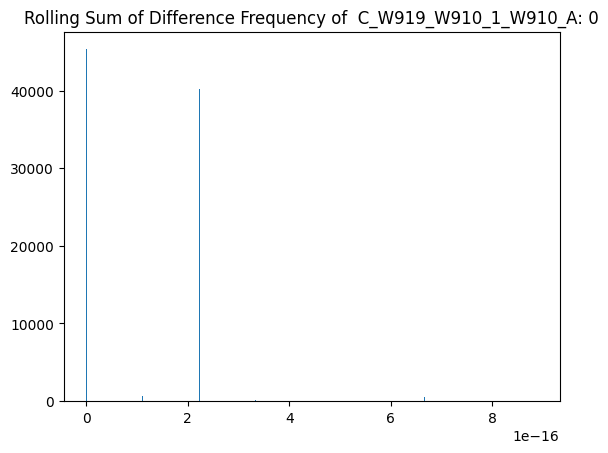

******************************************************************************


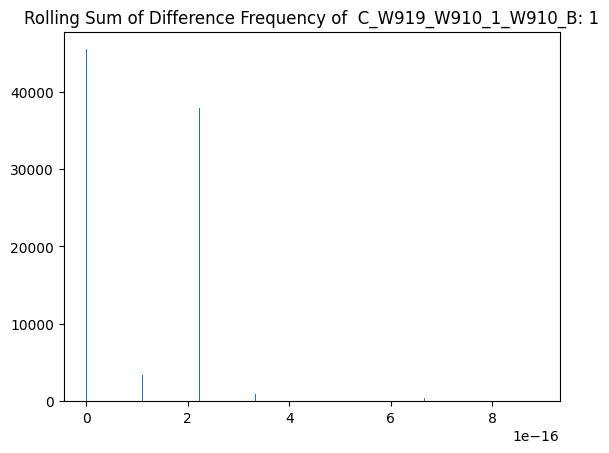

******************************************************************************


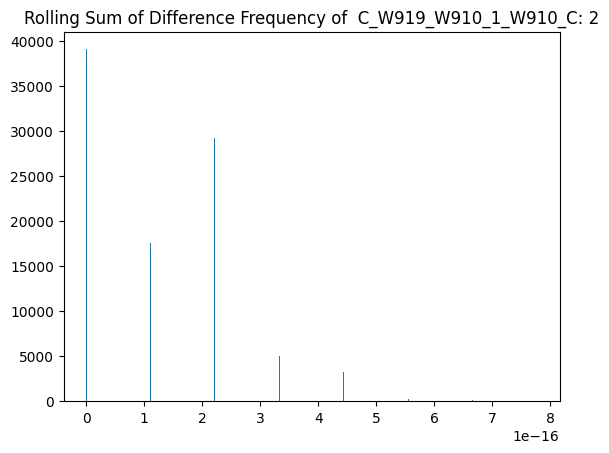

******************************************************************************


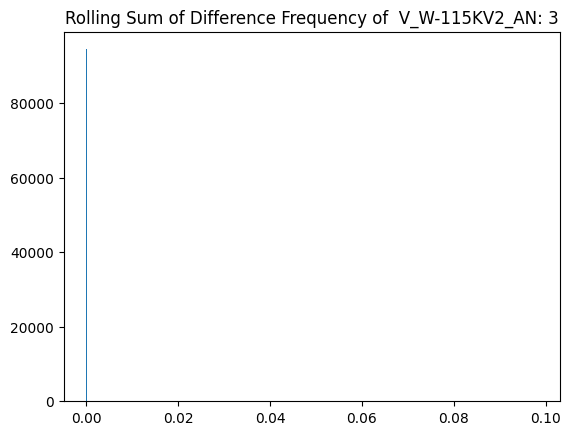

******************************************************************************


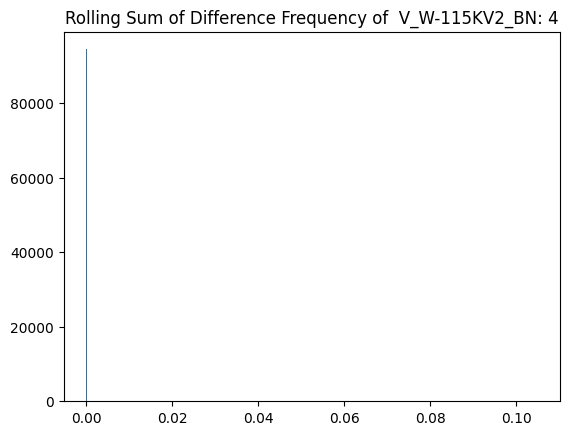

******************************************************************************


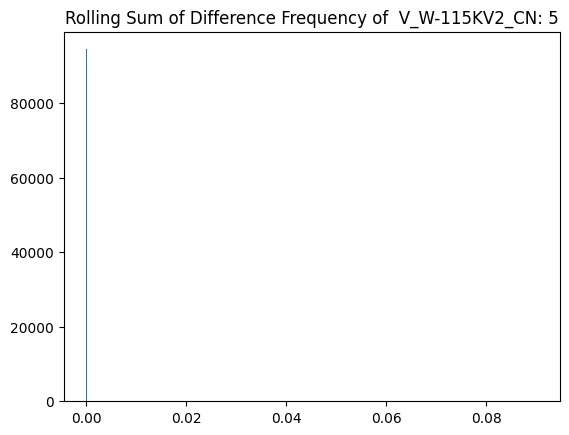

******************************************************************************


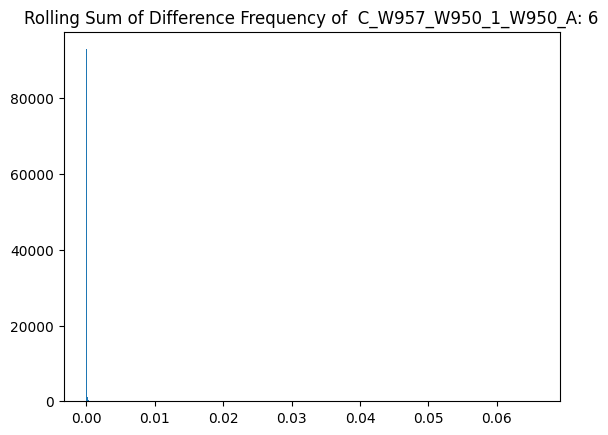

******************************************************************************


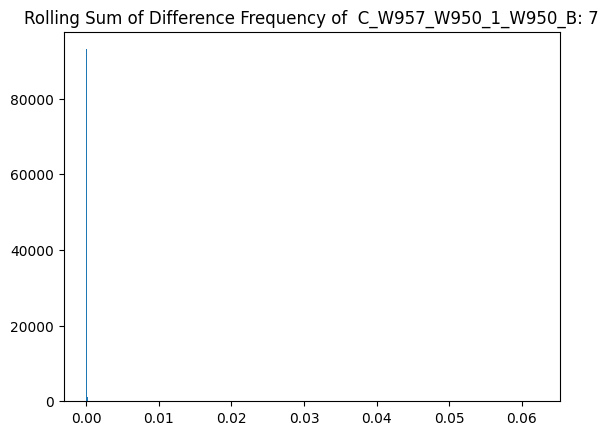

******************************************************************************


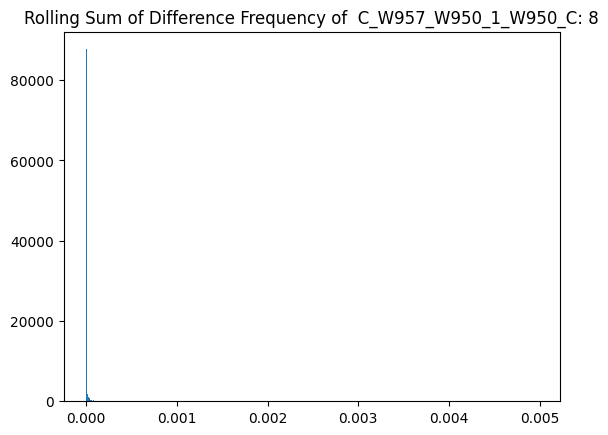

******************************************************************************


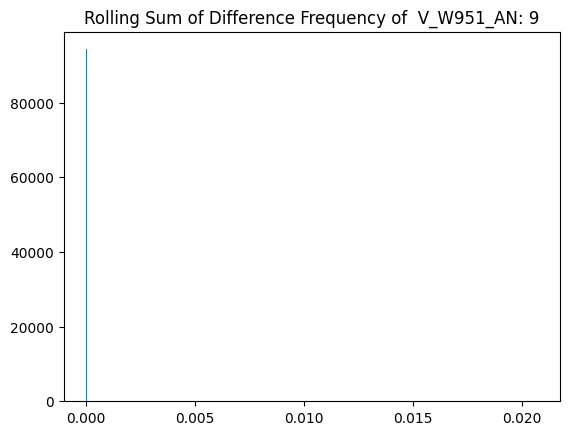

******************************************************************************


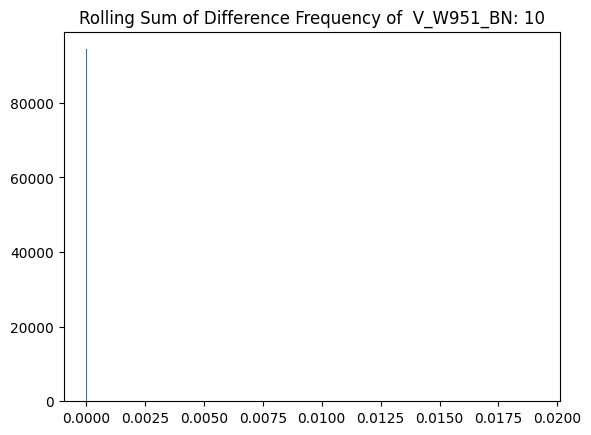

******************************************************************************


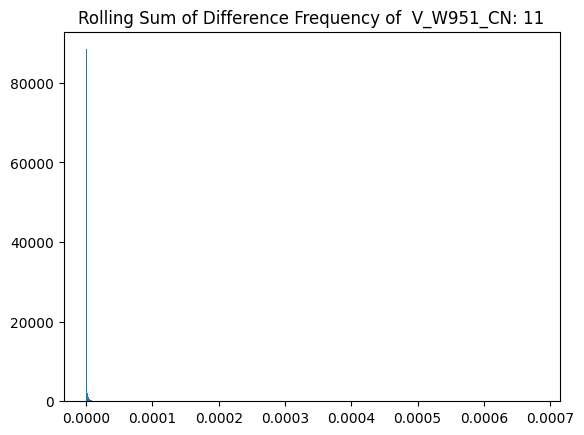

******************************************************************************


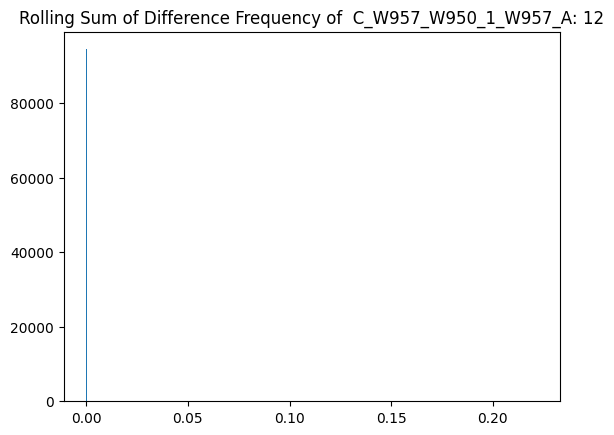

******************************************************************************


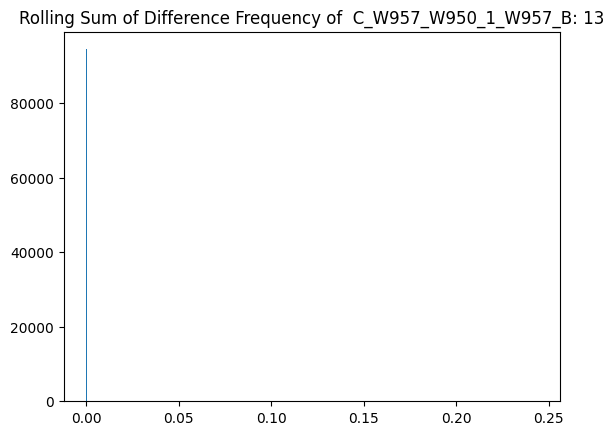

******************************************************************************


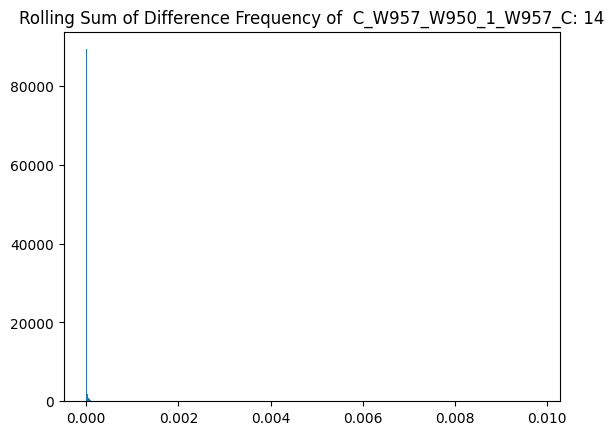

******************************************************************************


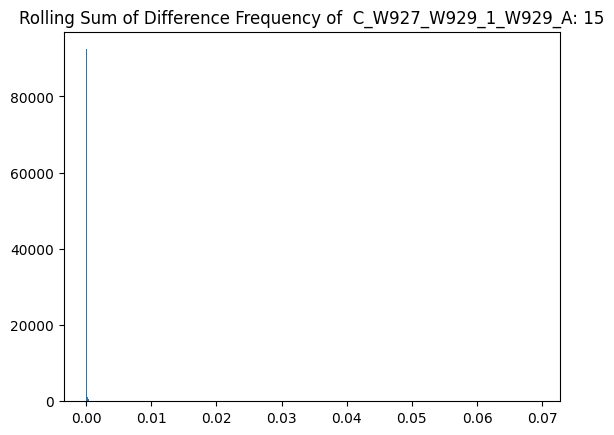

******************************************************************************


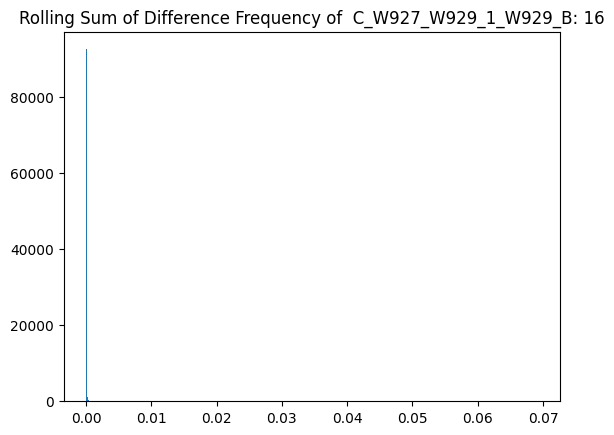

******************************************************************************


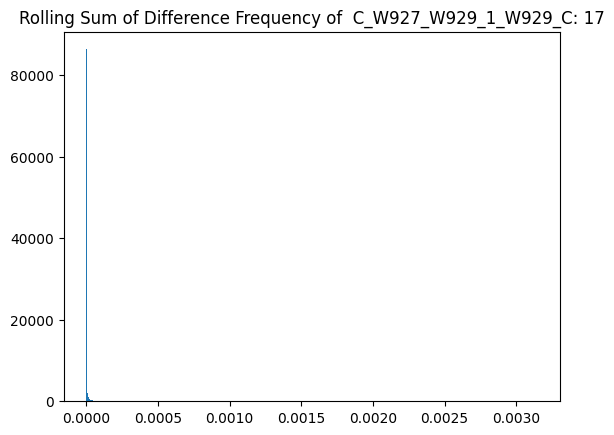

******************************************************************************


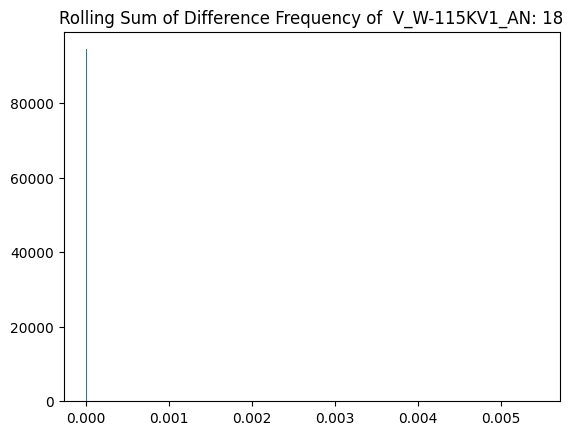

******************************************************************************


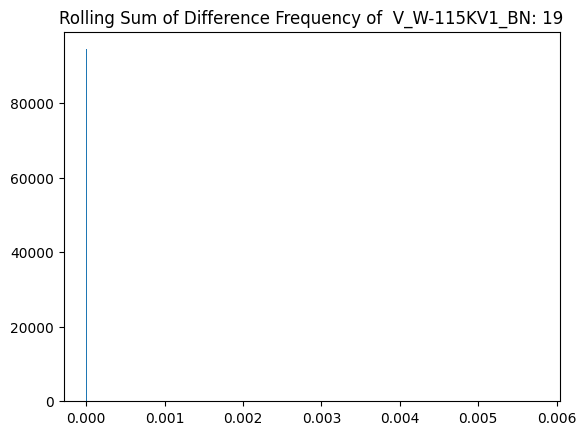

******************************************************************************


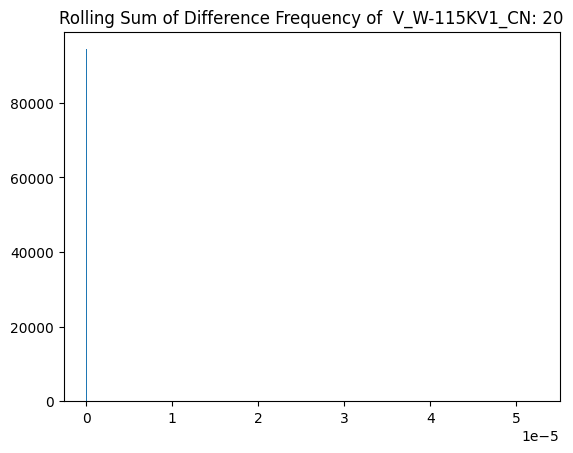

******************************************************************************


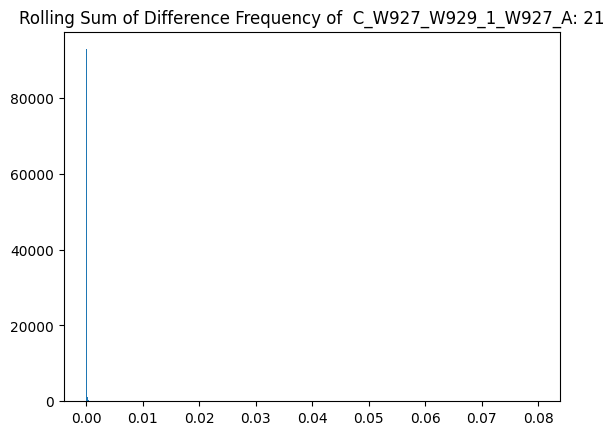

******************************************************************************


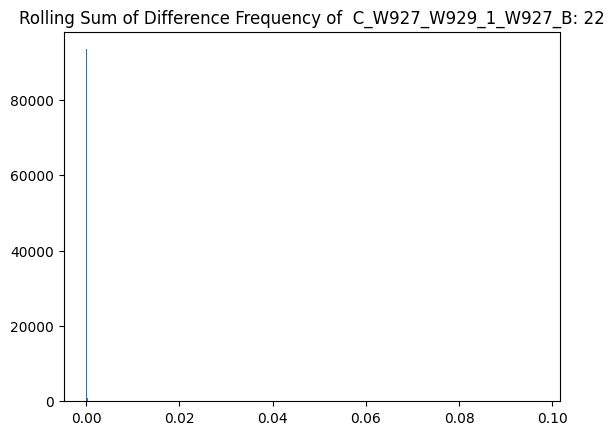

******************************************************************************


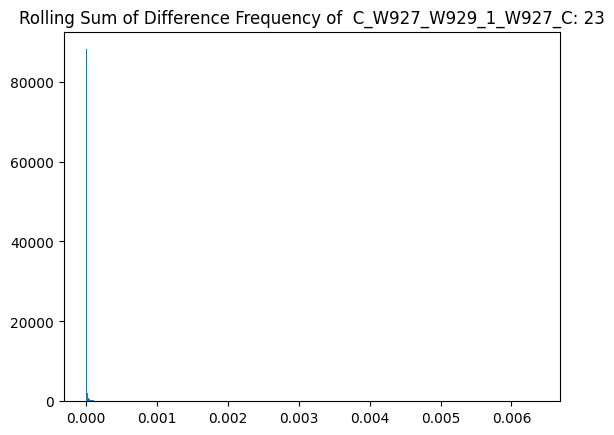

******************************************************************************


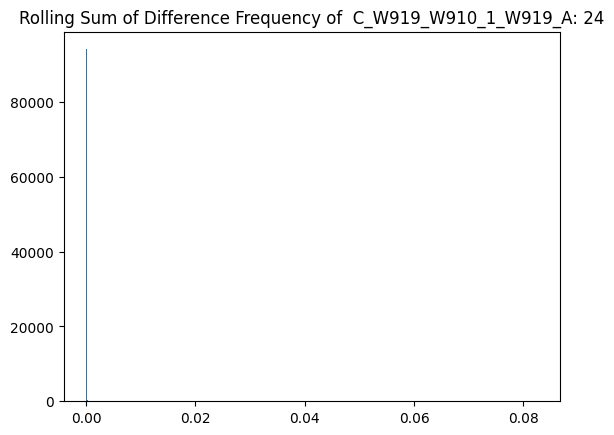

******************************************************************************


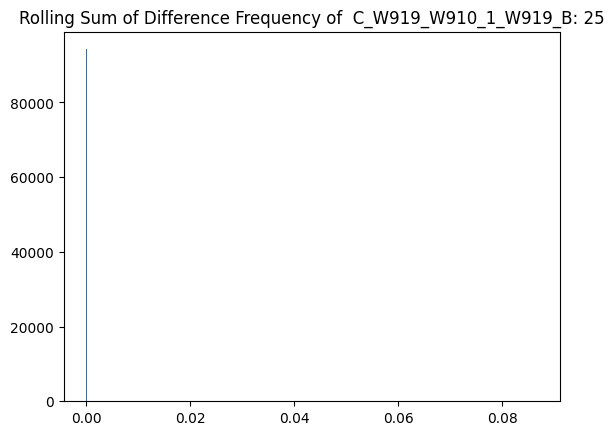

******************************************************************************


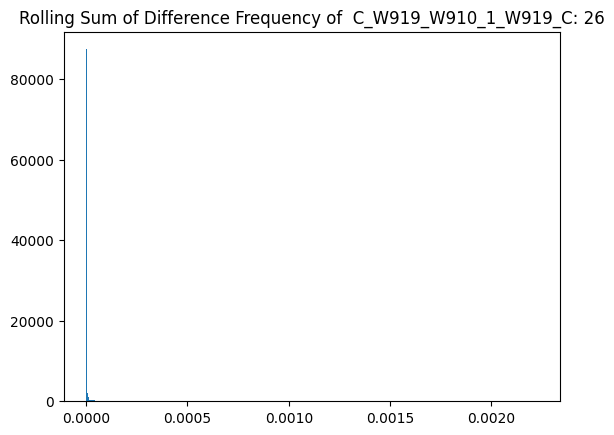

******************************************************************************


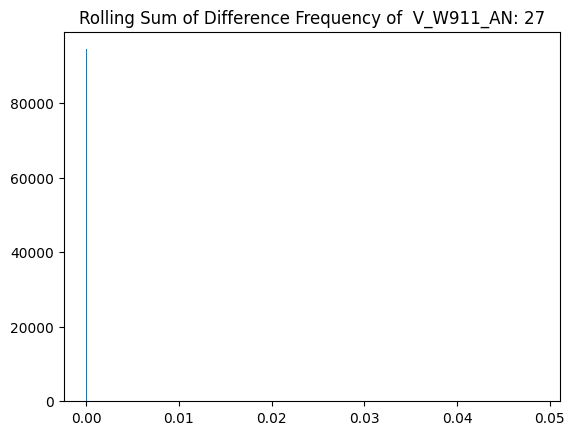

******************************************************************************


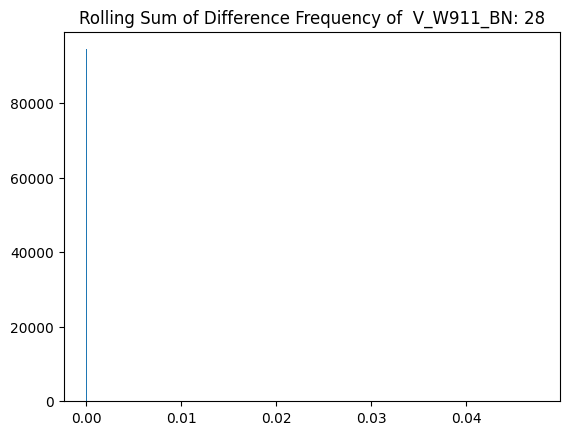

******************************************************************************


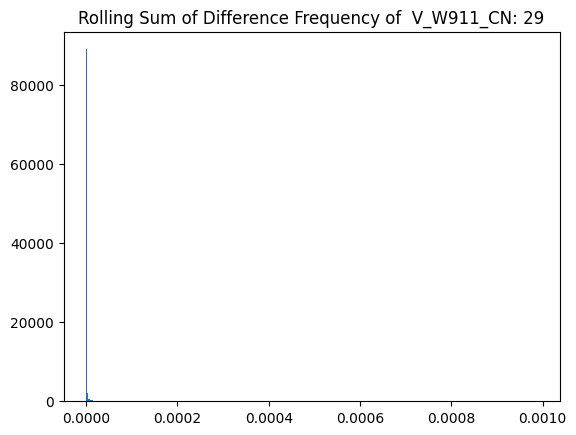

******************************************************************************


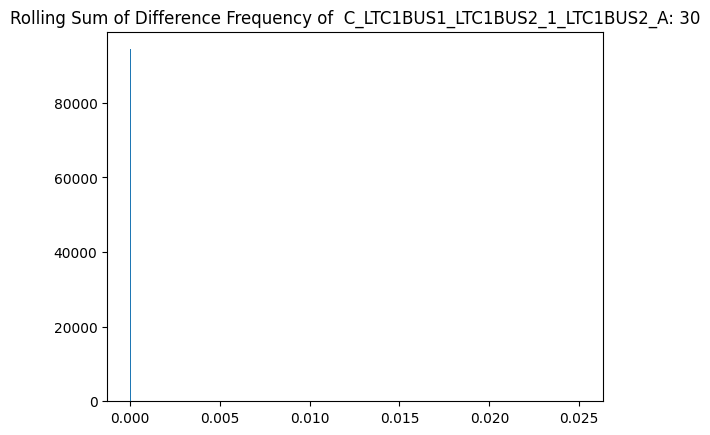

******************************************************************************


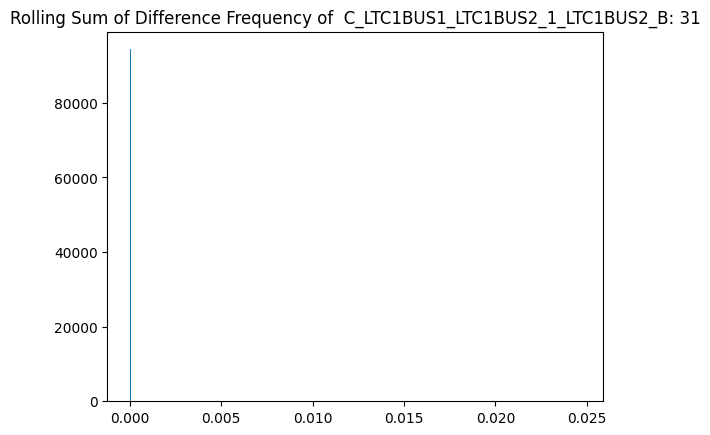

******************************************************************************


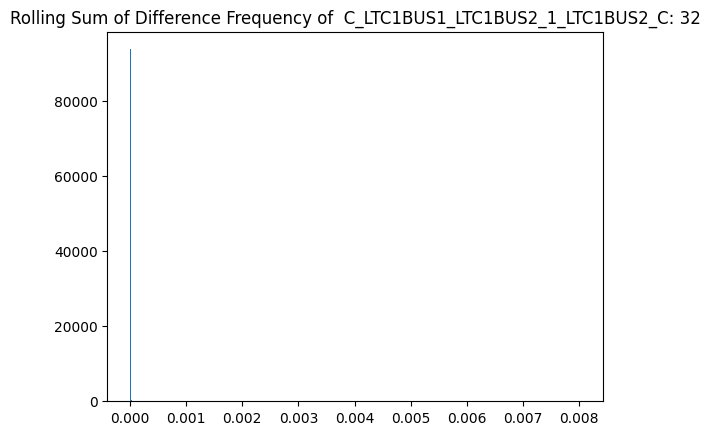

******************************************************************************


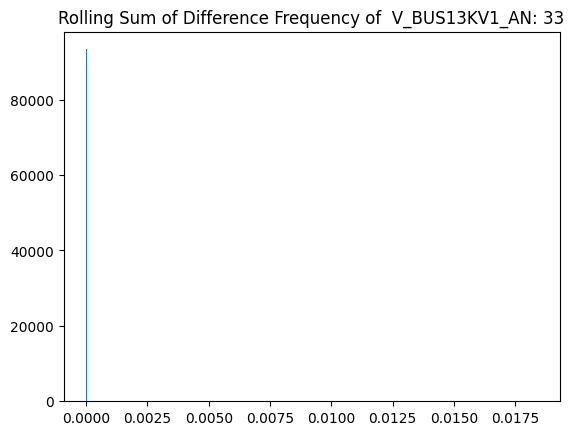

******************************************************************************


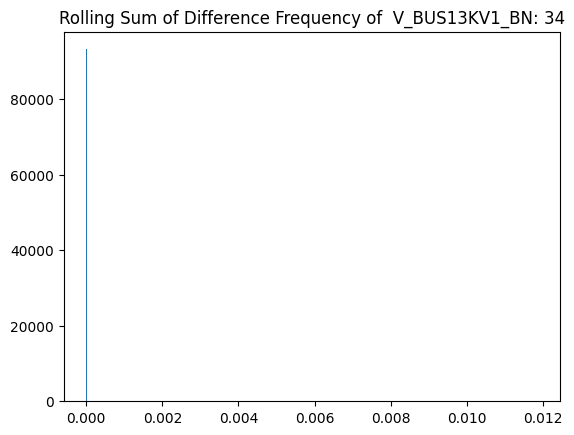

******************************************************************************


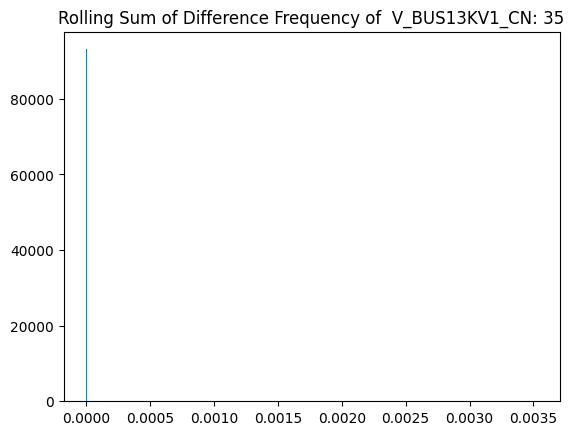

******************************************************************************


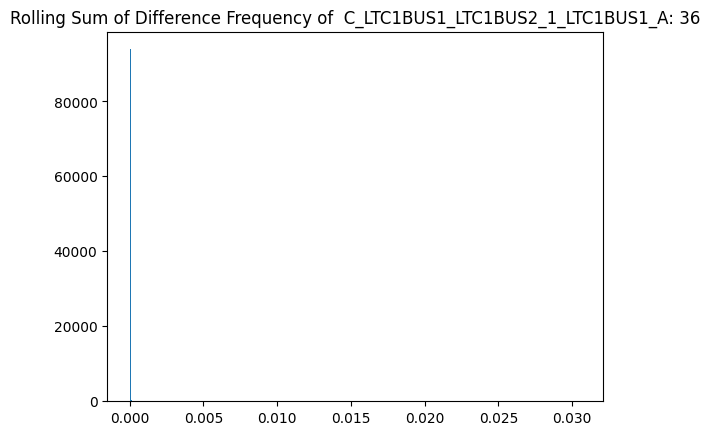

******************************************************************************


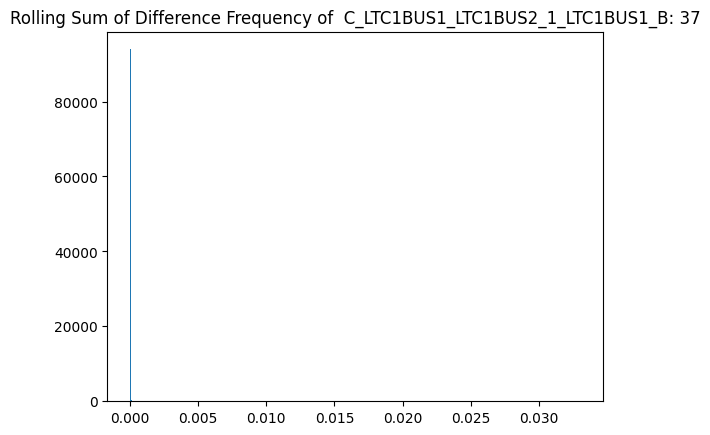

******************************************************************************


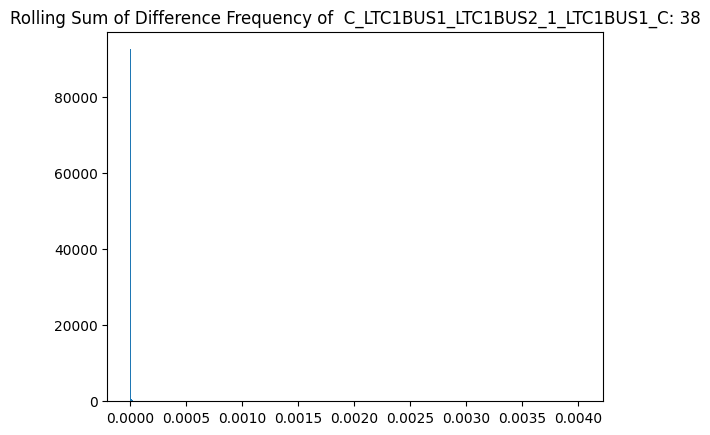

******************************************************************************


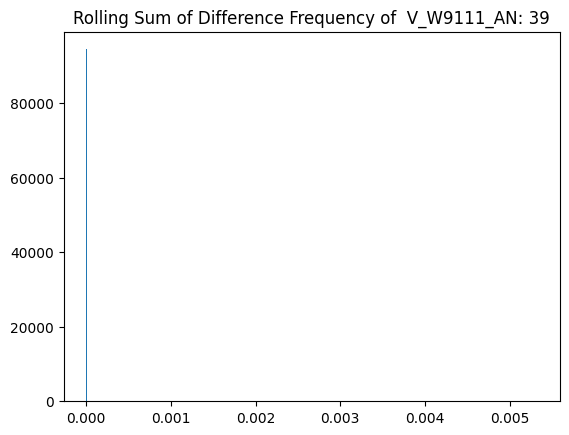

******************************************************************************


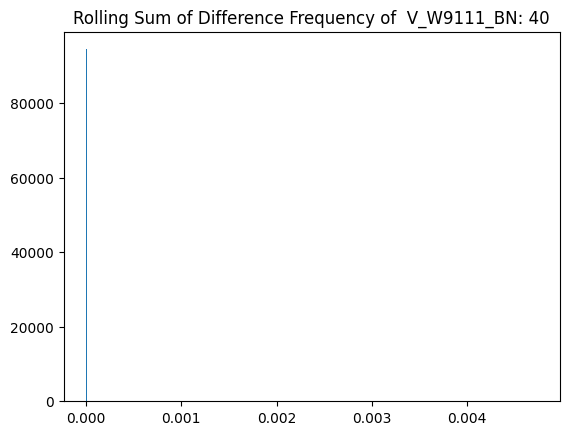

******************************************************************************


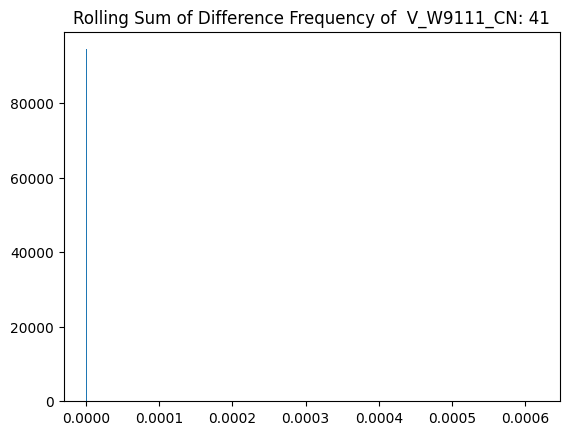

******************************************************************************


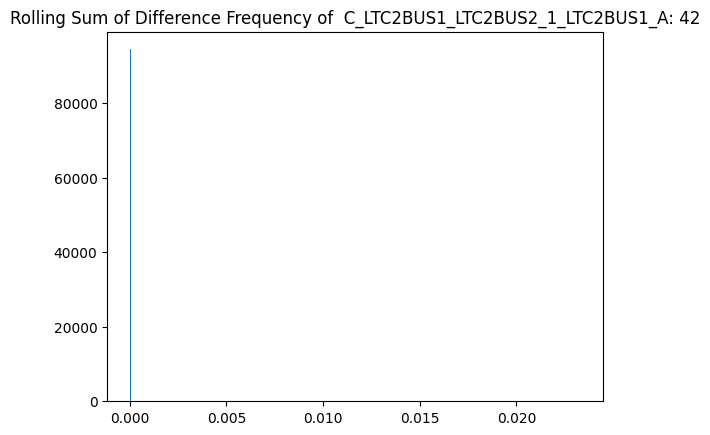

******************************************************************************


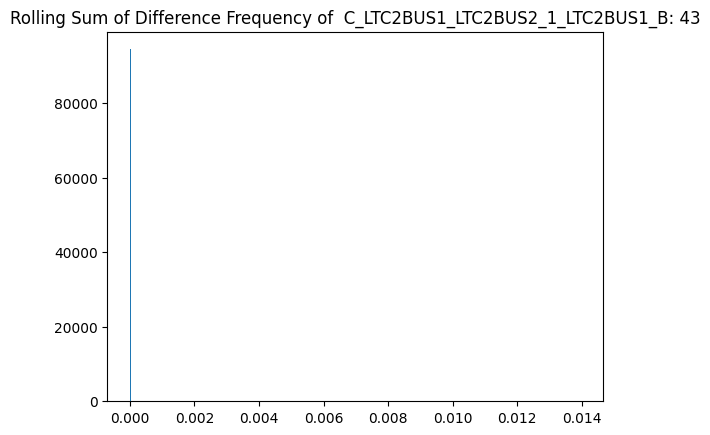

******************************************************************************


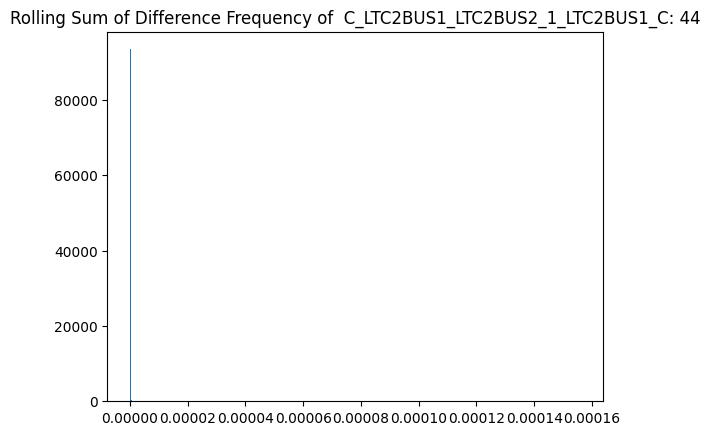

******************************************************************************


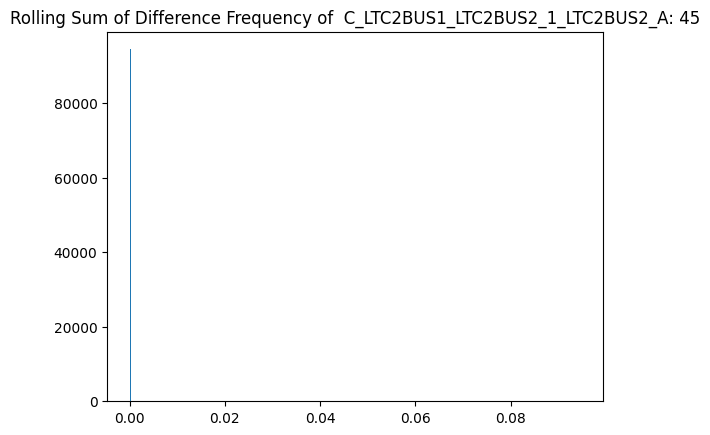

******************************************************************************


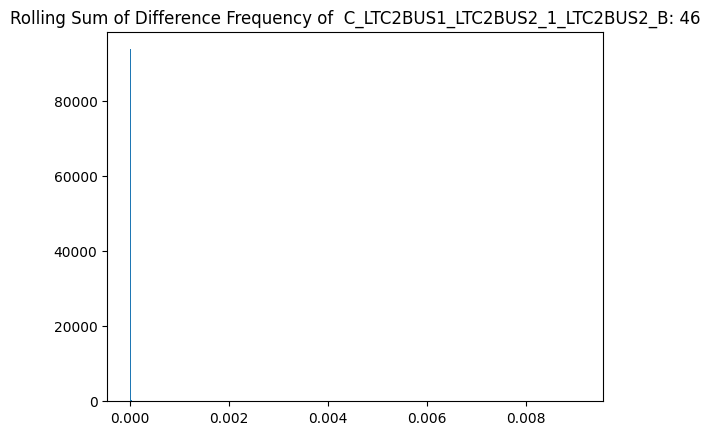

******************************************************************************


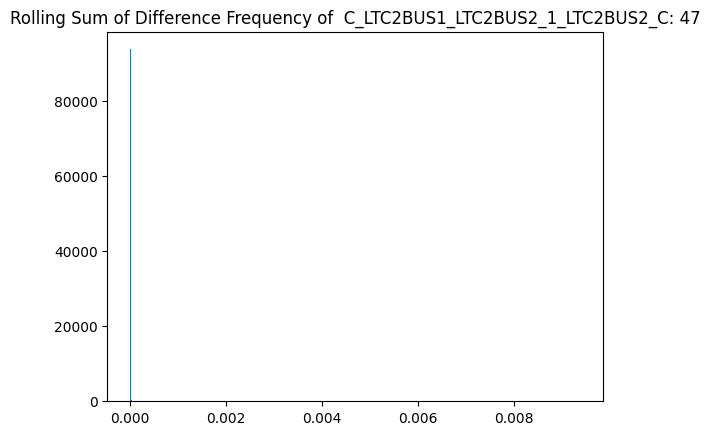

******************************************************************************


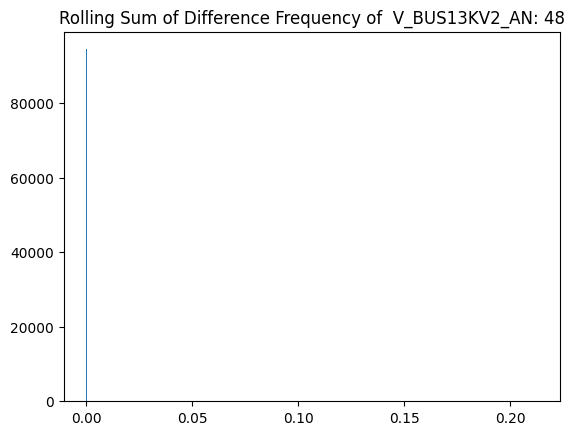

******************************************************************************


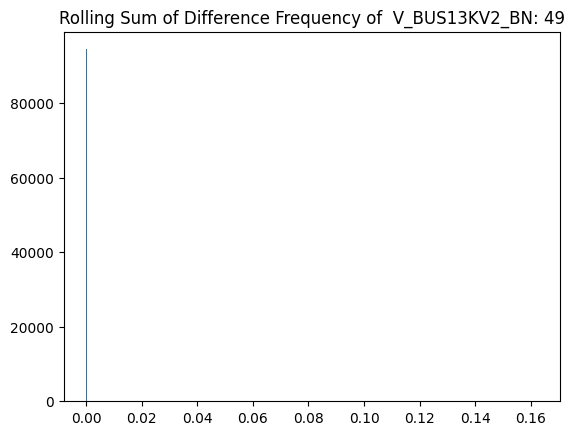

******************************************************************************


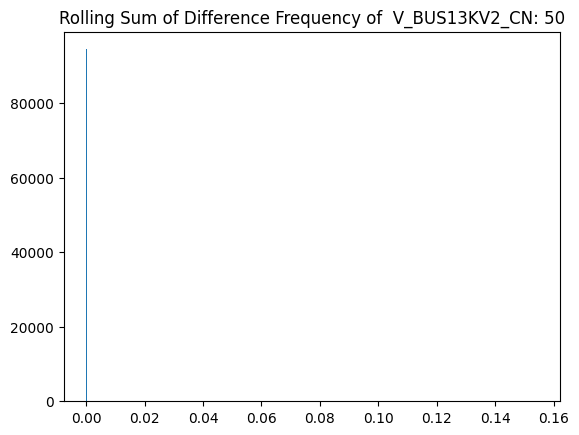

******************************************************************************


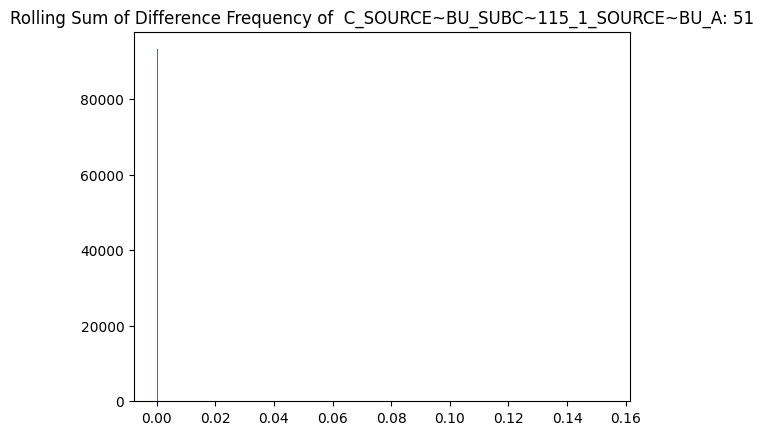

******************************************************************************


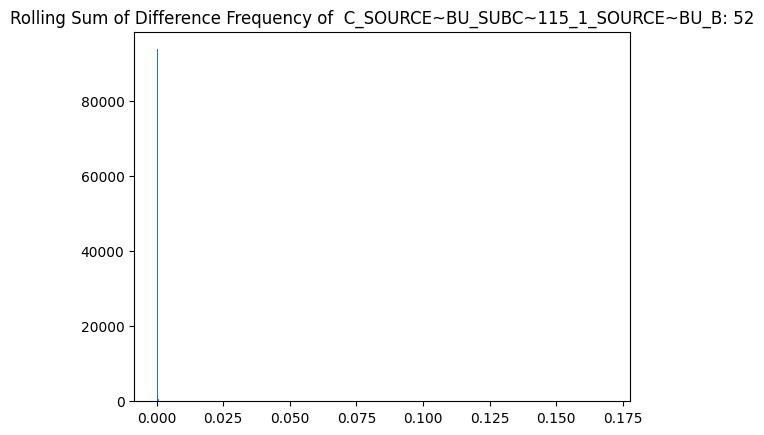

******************************************************************************


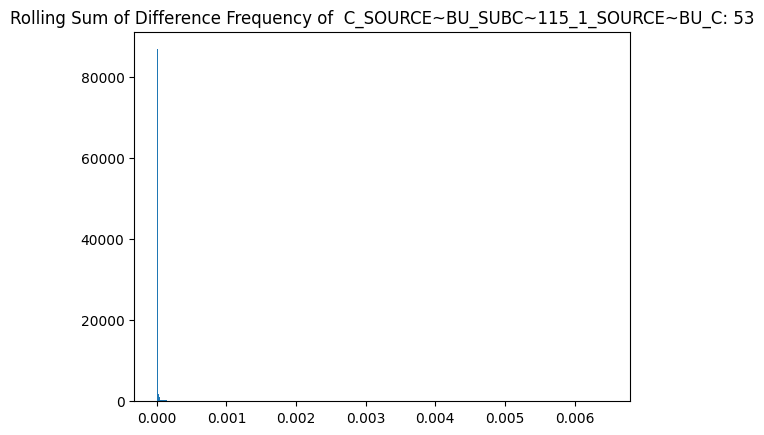

******************************************************************************


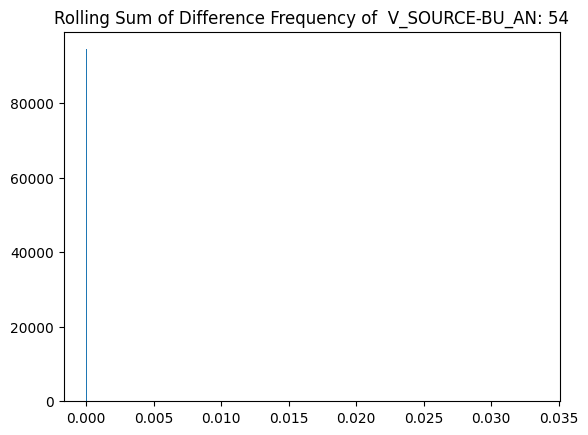

******************************************************************************


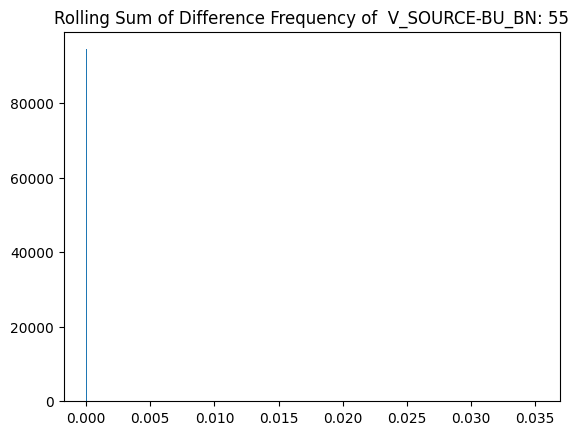

******************************************************************************


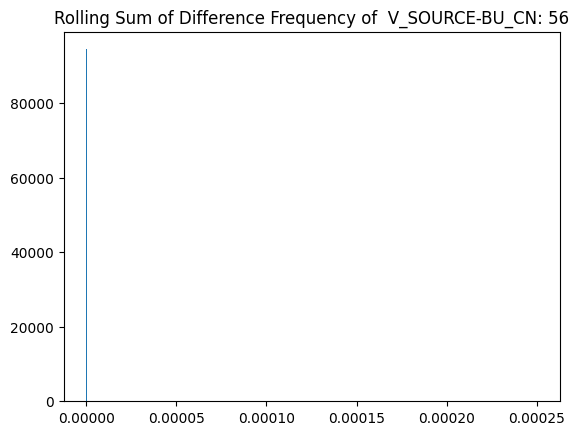

******************************************************************************


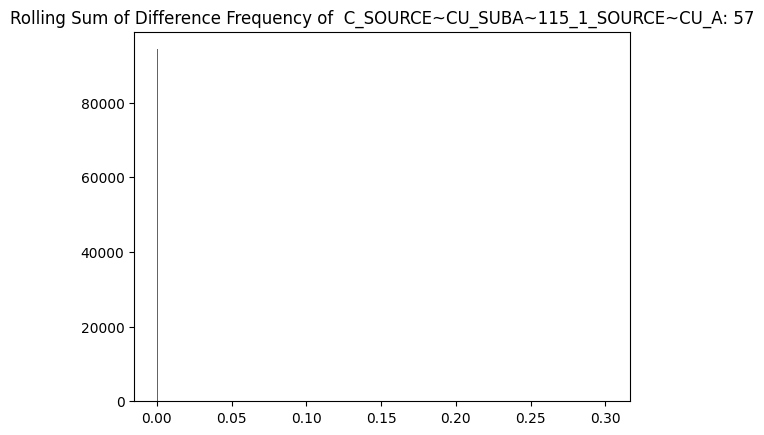

******************************************************************************


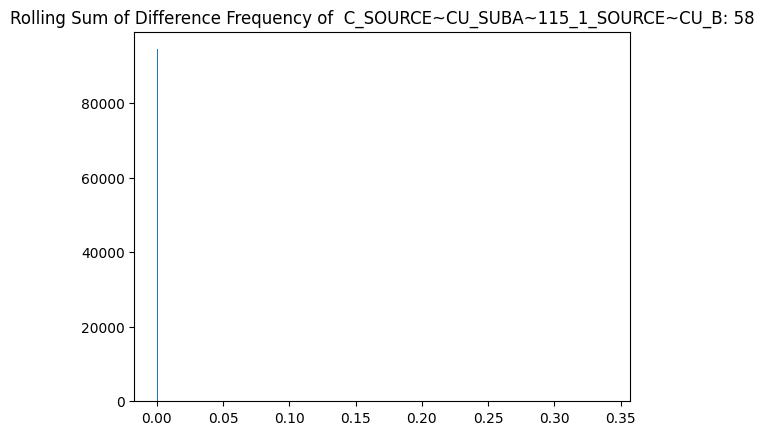

******************************************************************************


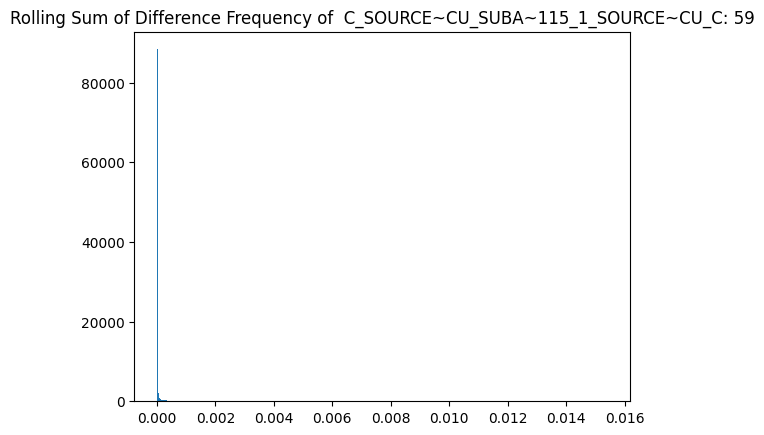

******************************************************************************


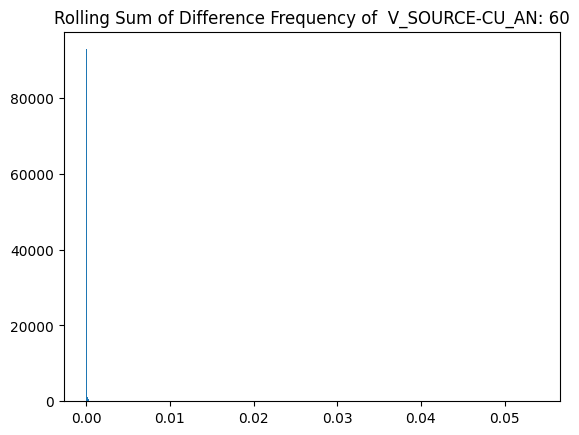

******************************************************************************


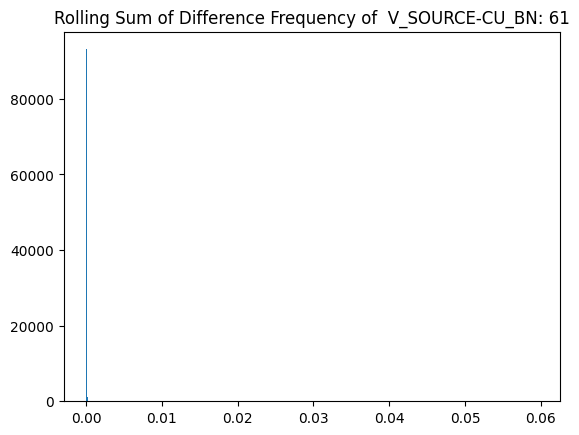

******************************************************************************


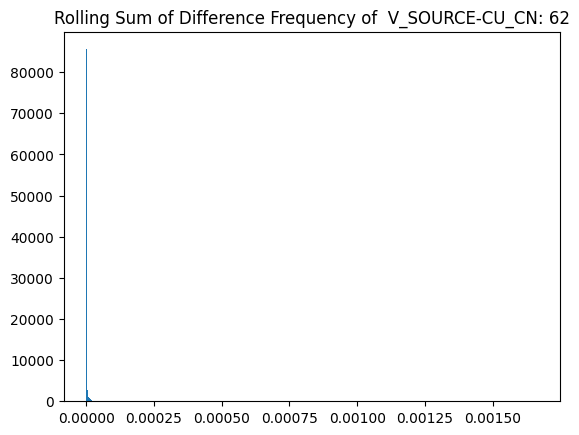

******************************************************************************


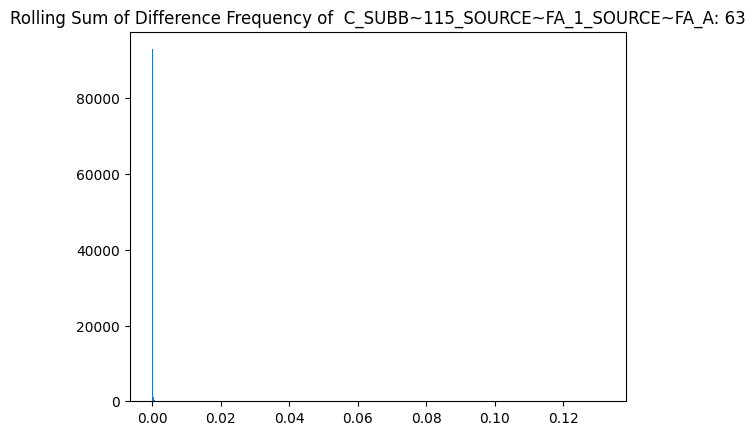

******************************************************************************


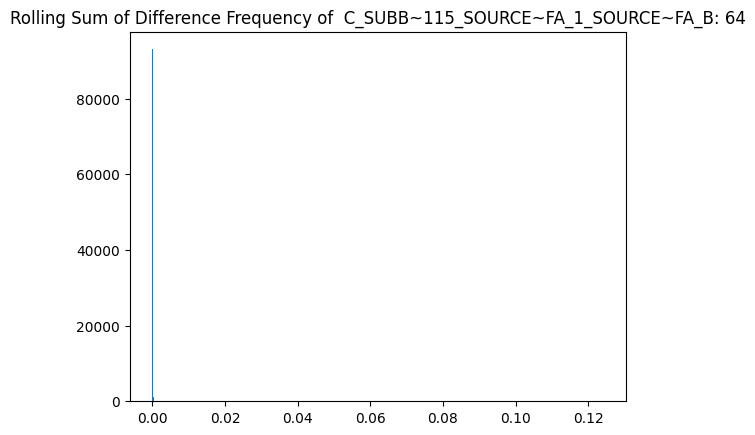

******************************************************************************


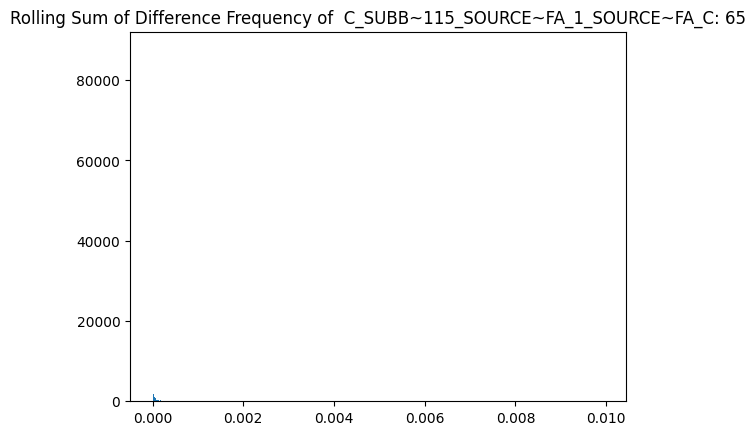

******************************************************************************


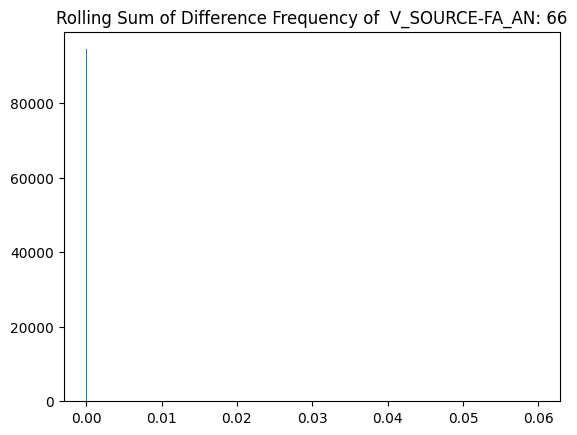

******************************************************************************


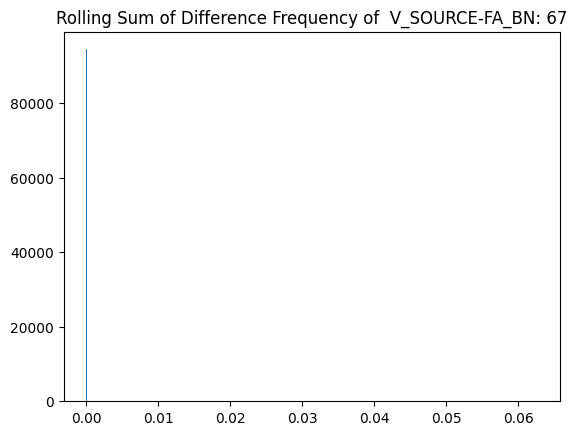

******************************************************************************


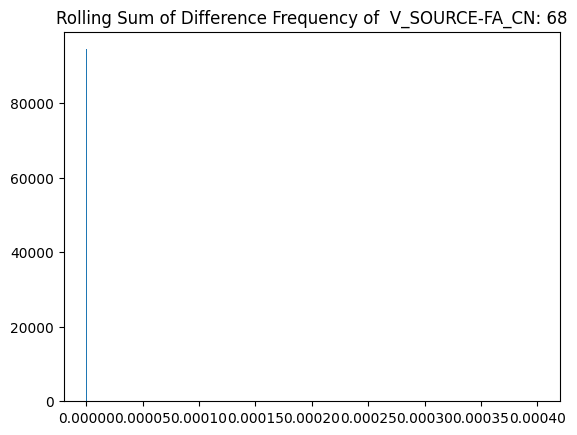

******************************************************************************


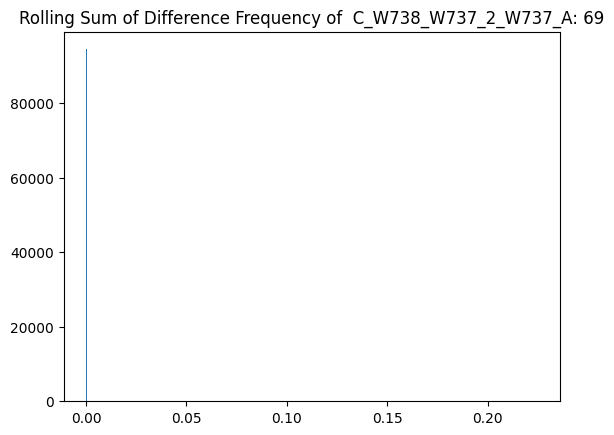

******************************************************************************


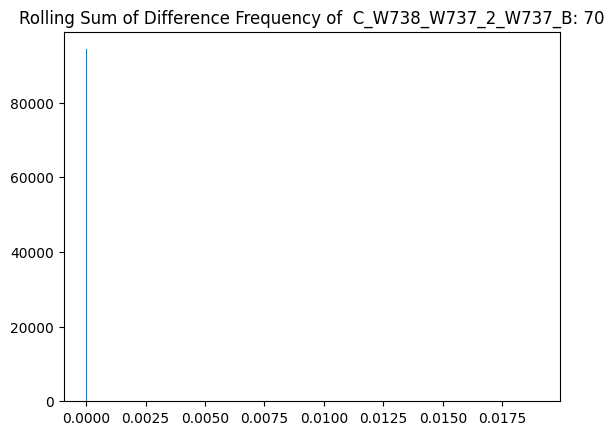

******************************************************************************


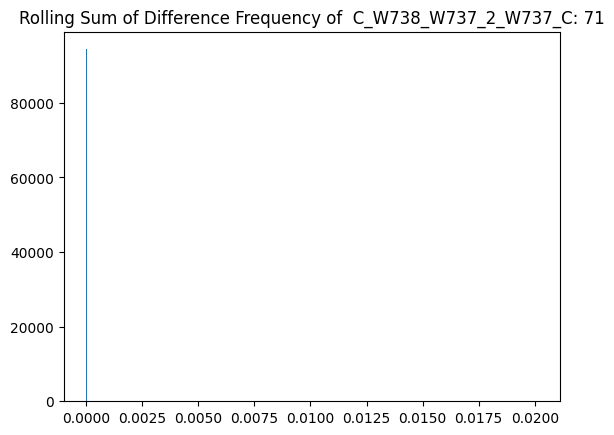

******************************************************************************


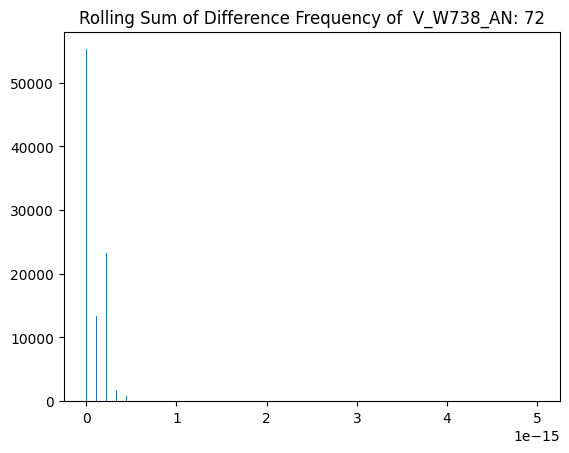

******************************************************************************


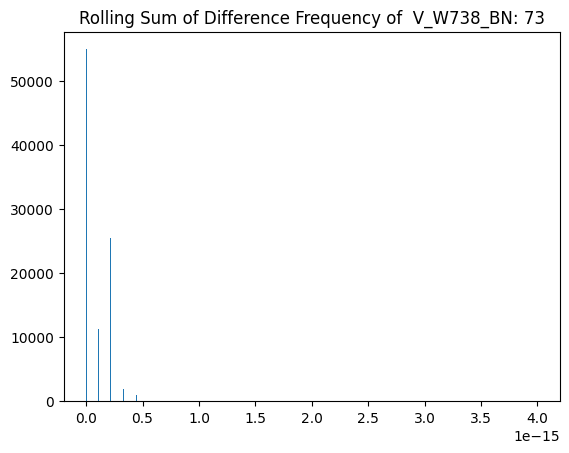

******************************************************************************


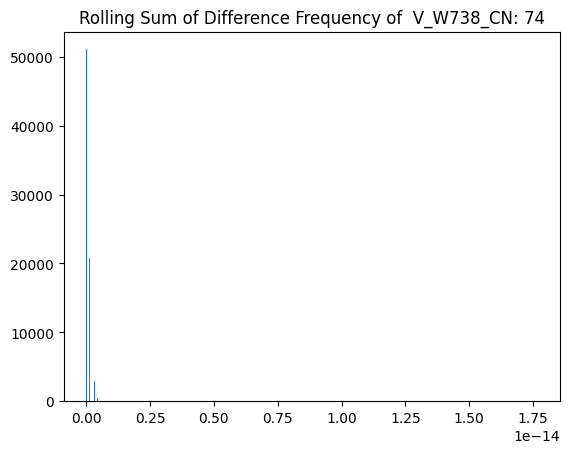

******************************************************************************


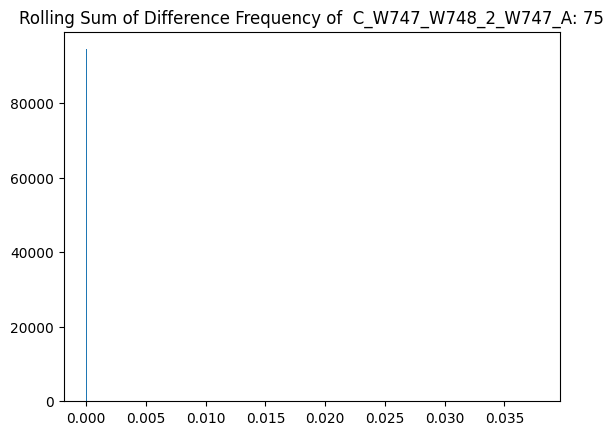

******************************************************************************


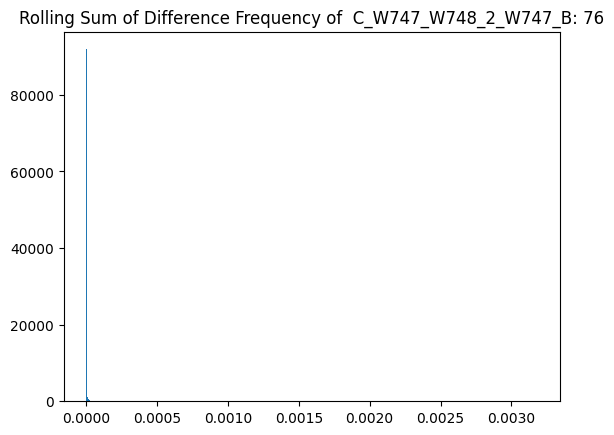

******************************************************************************


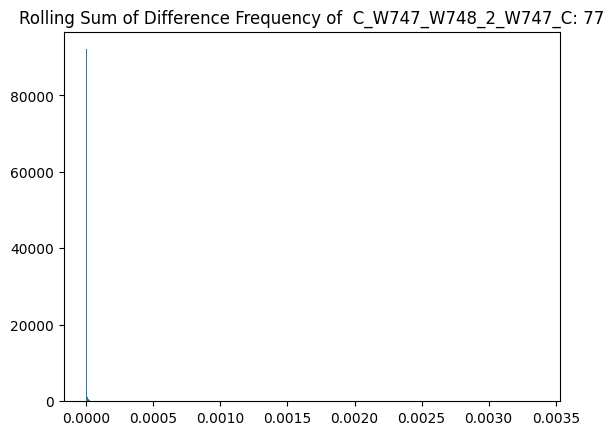

******************************************************************************


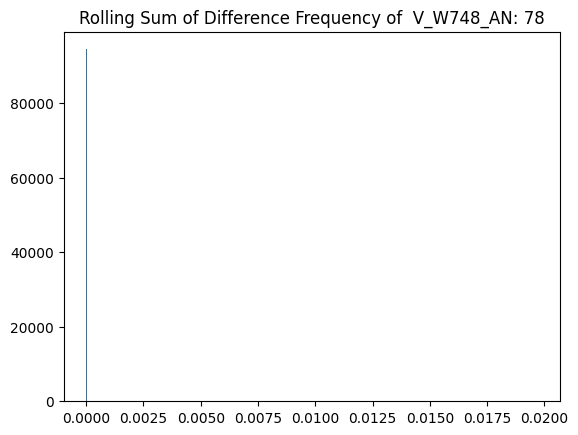

******************************************************************************


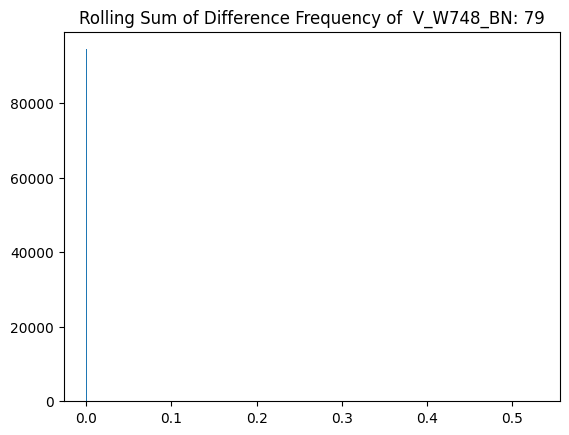

******************************************************************************


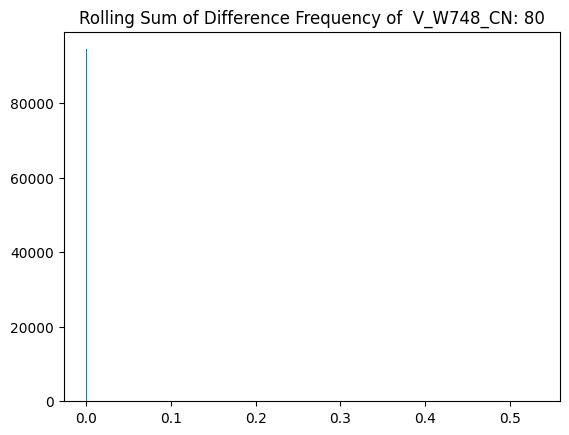

******************************************************************************


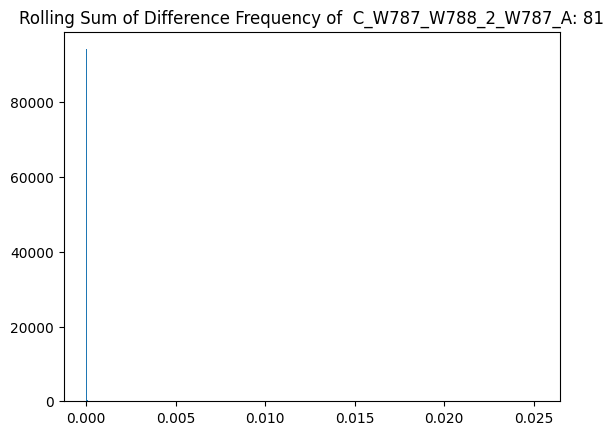

******************************************************************************


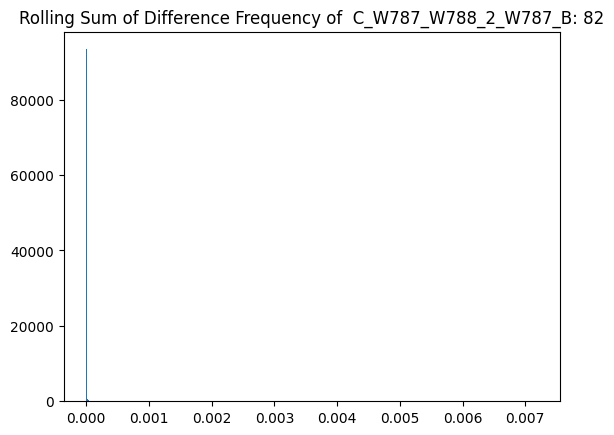

******************************************************************************


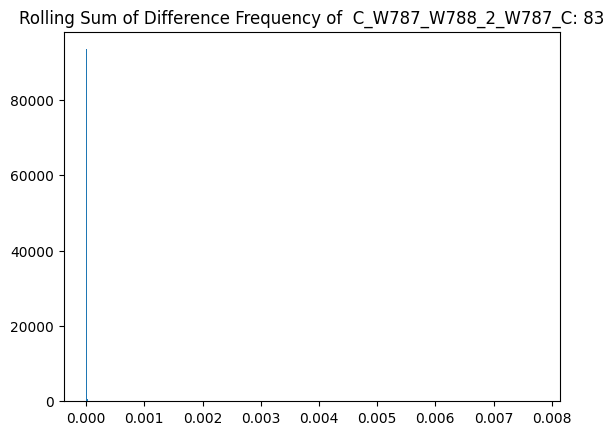

******************************************************************************


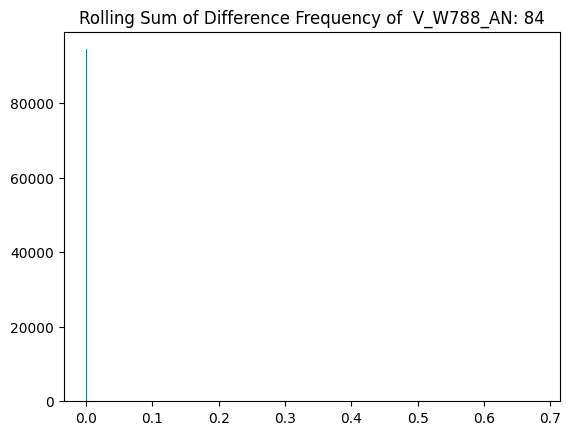

******************************************************************************


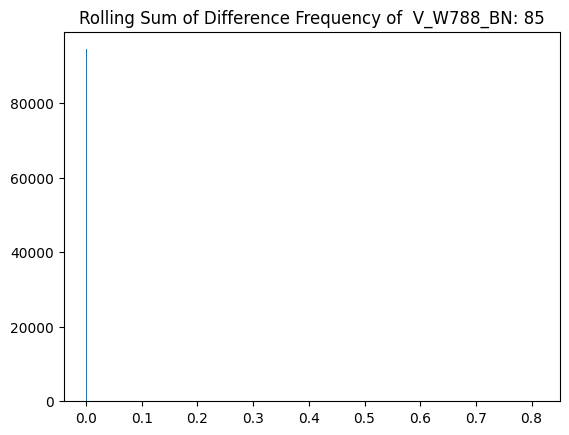

******************************************************************************


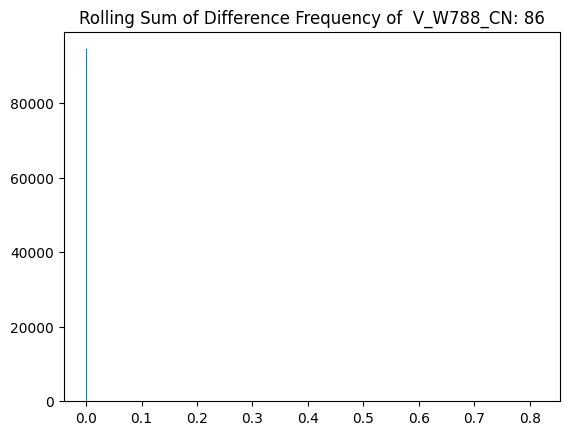

******************************************************************************


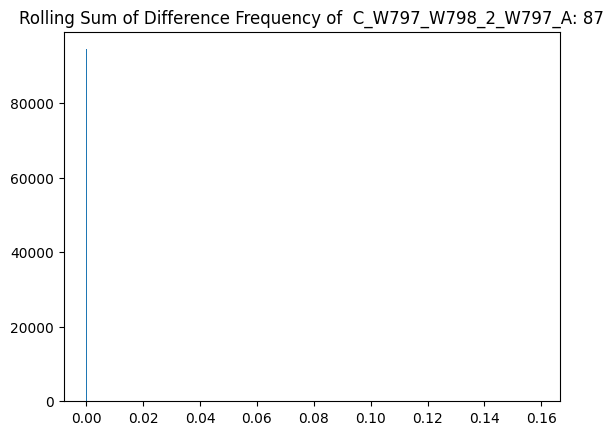

******************************************************************************


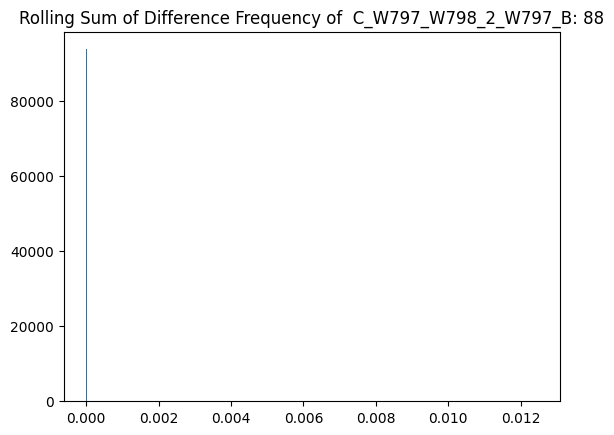

******************************************************************************


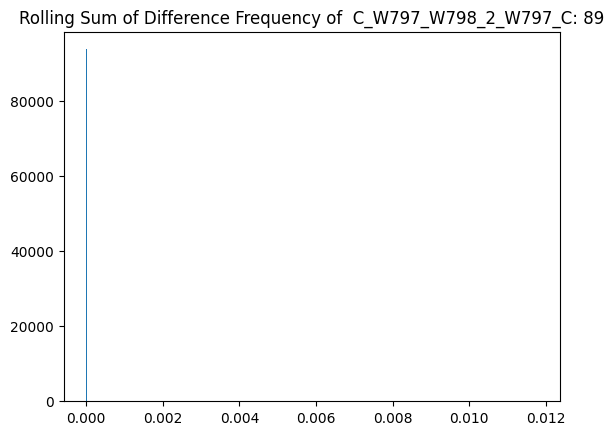

******************************************************************************


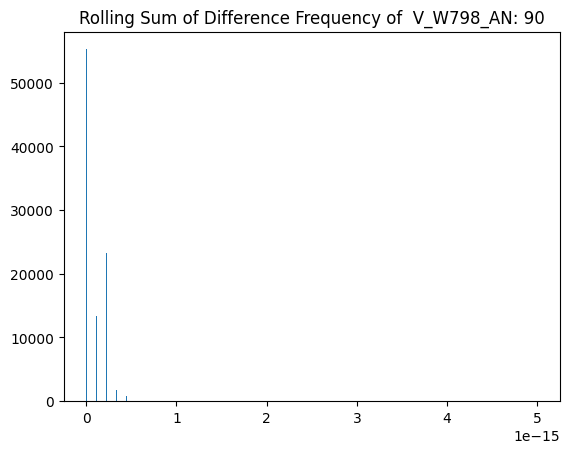

******************************************************************************


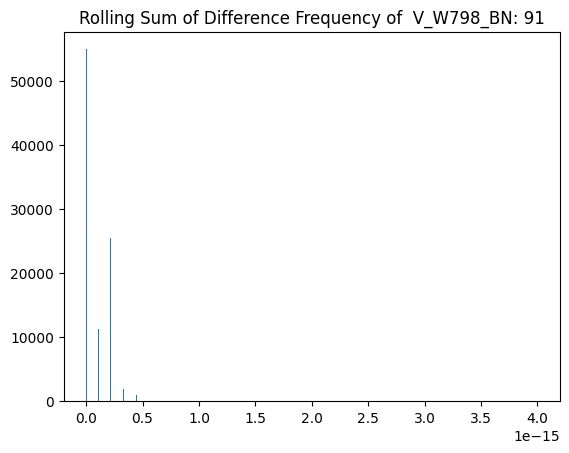

******************************************************************************


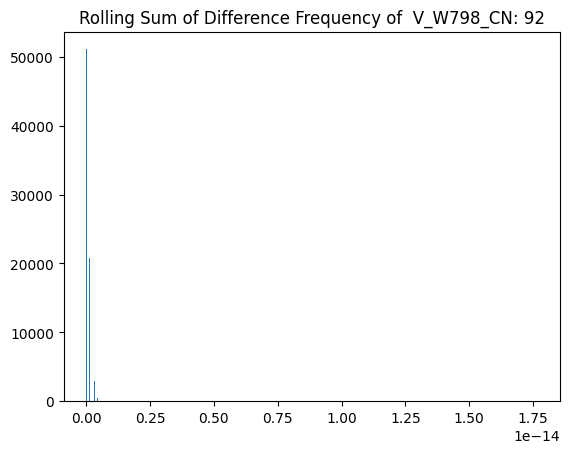

******************************************************************************


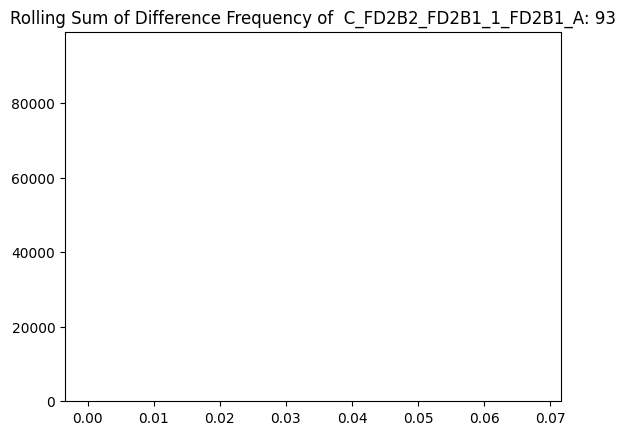

******************************************************************************


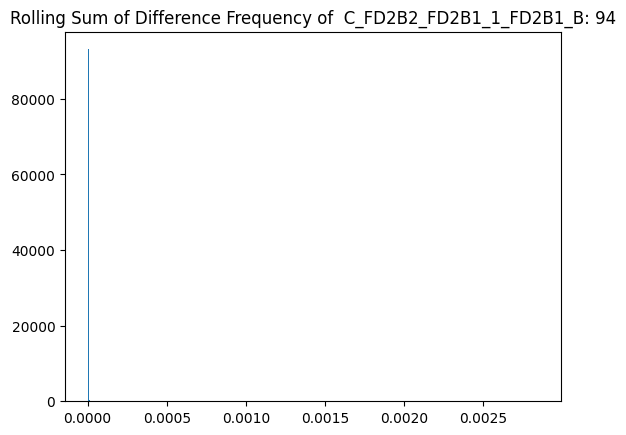

******************************************************************************


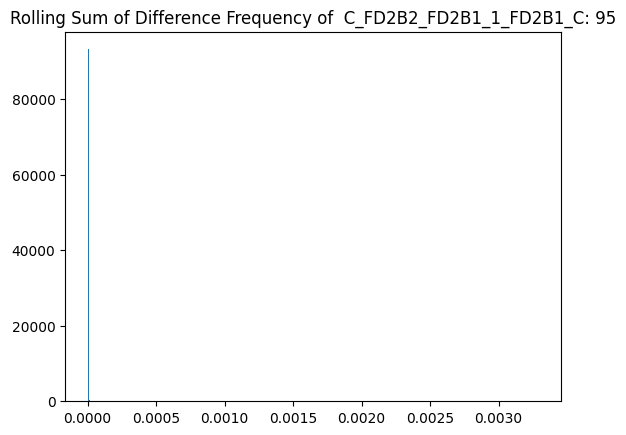

******************************************************************************


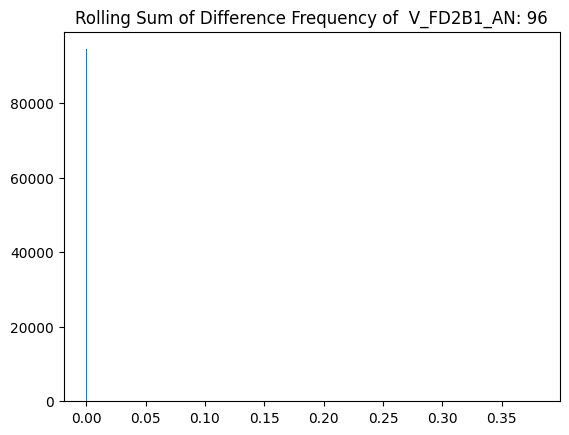

******************************************************************************


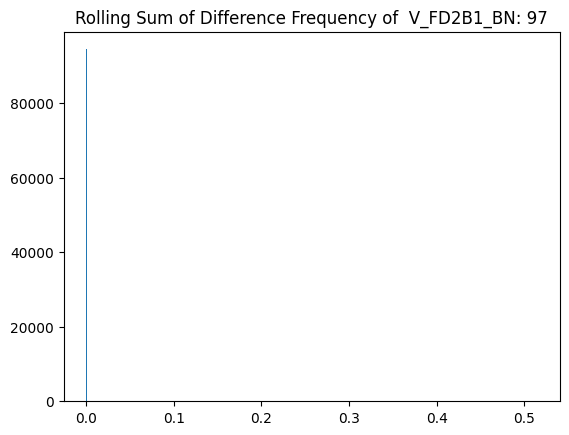

******************************************************************************


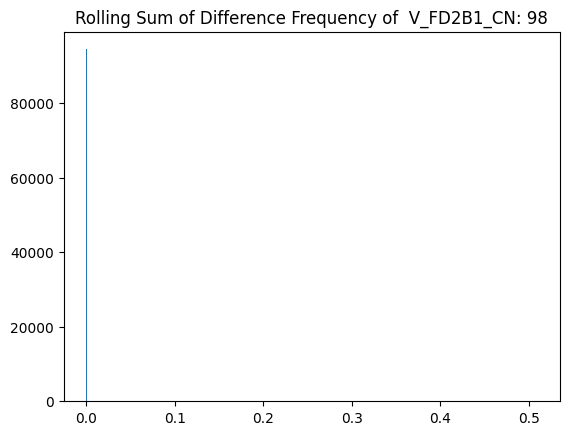

******************************************************************************


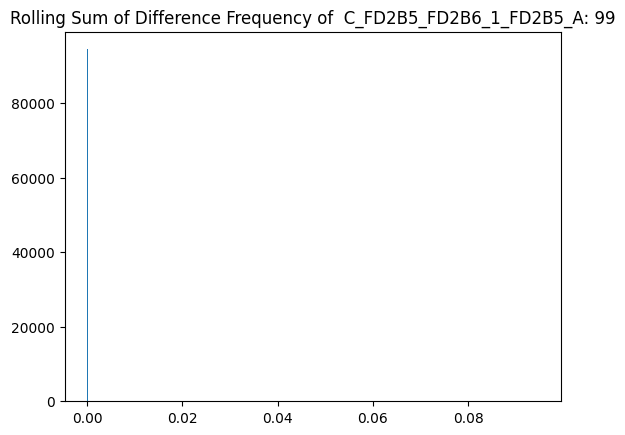

******************************************************************************


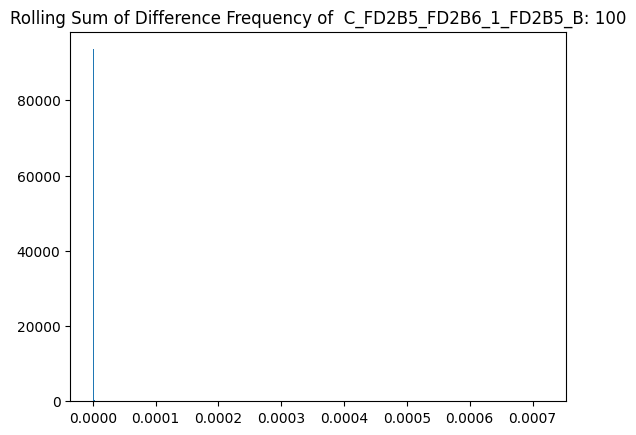

******************************************************************************


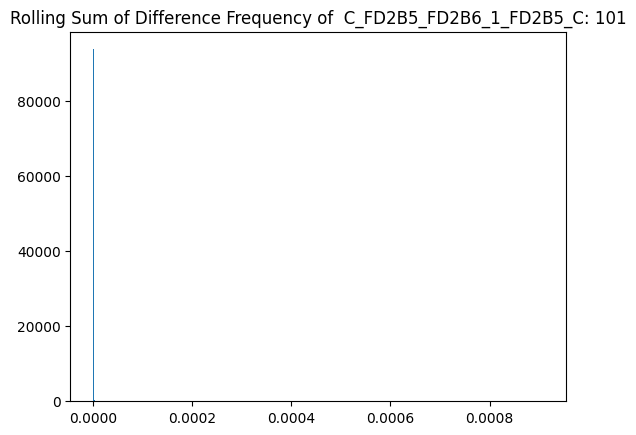

******************************************************************************


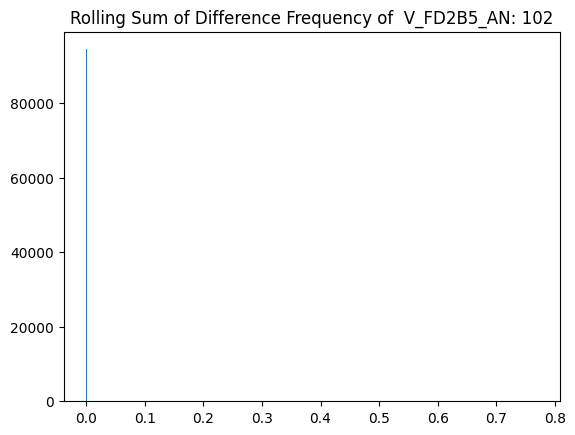

******************************************************************************


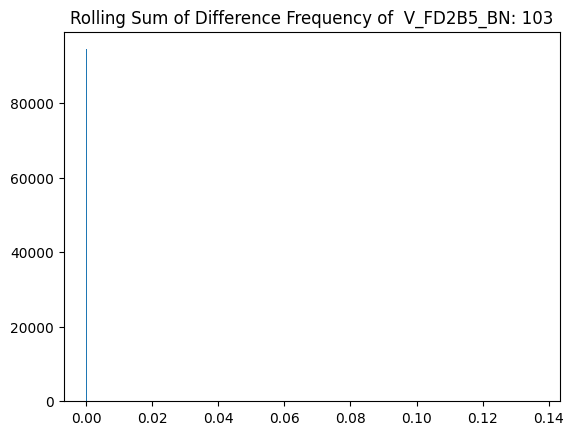

******************************************************************************


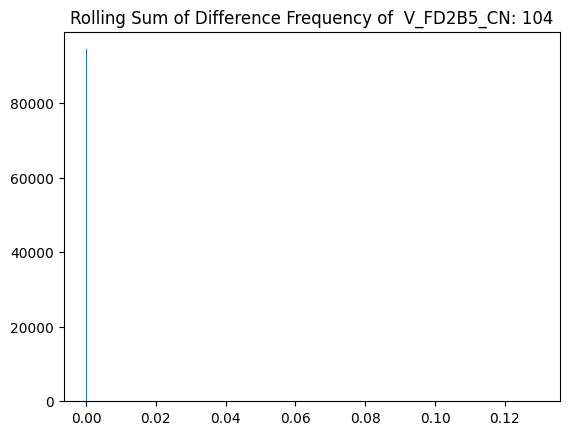

******************************************************************************


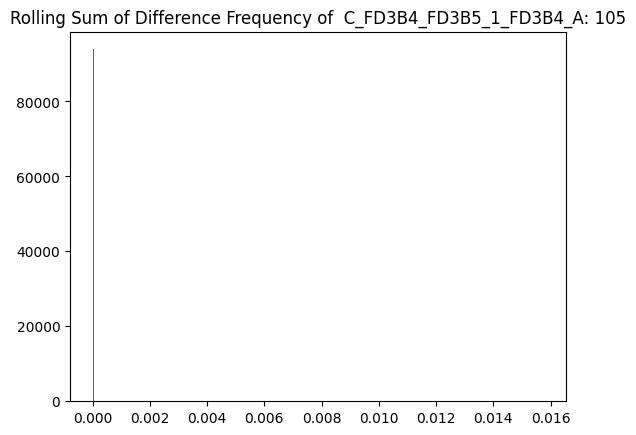

******************************************************************************


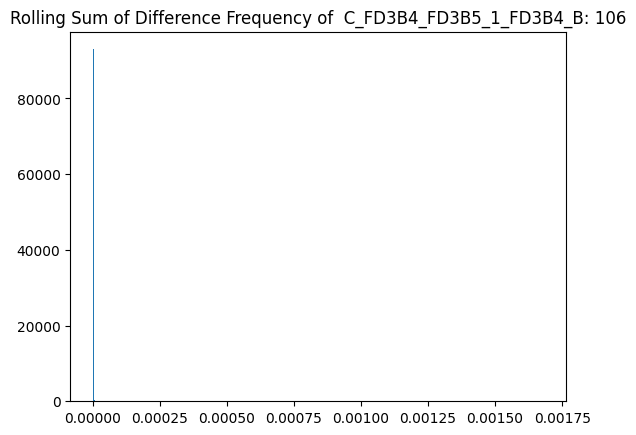

******************************************************************************


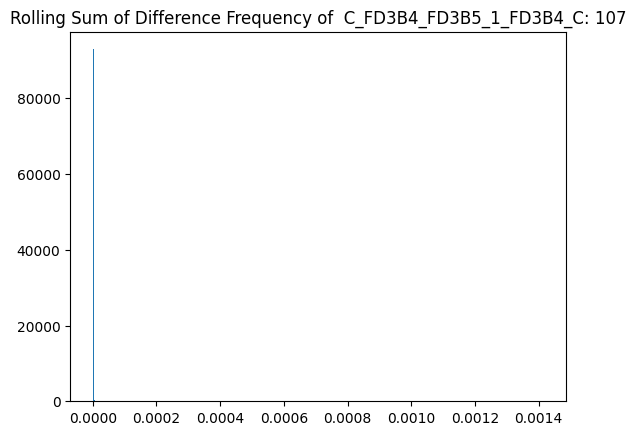

******************************************************************************


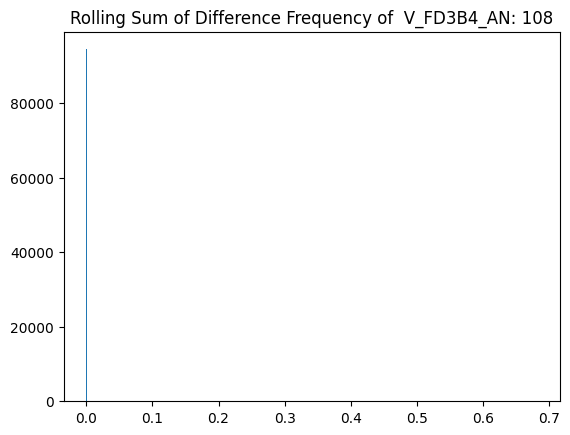

******************************************************************************


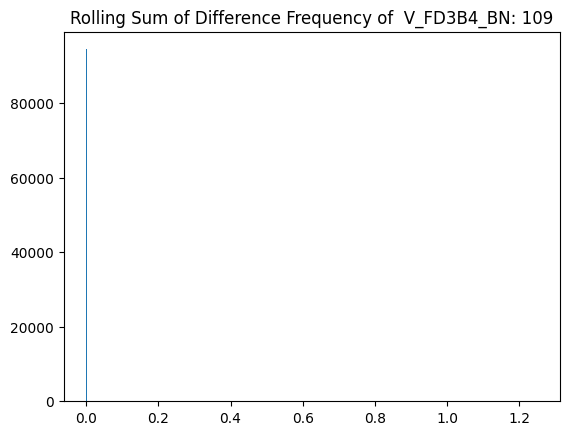

******************************************************************************


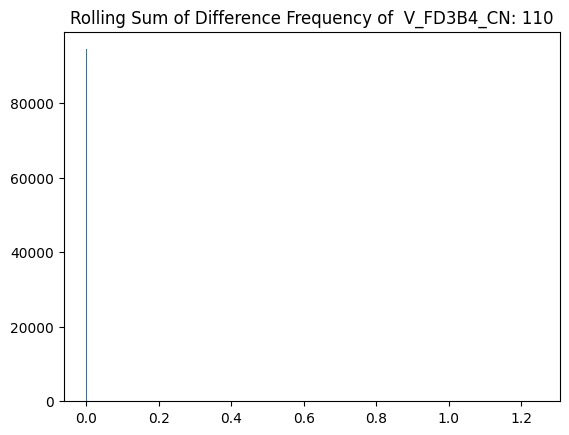

******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
****************************************************

In [ ]:
window = 320
w = 1
cols = data.columns

corr_fn = correlation_pair
thresholds_corr, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
thresholds_corr_99, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.99, axis=1, stat_list=corr_multi_list, collate_fn="sum")
thresholds_corr_95, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.95, axis=1, stat_list=corr_multi_list, collate_fn="sum")

In [ ]:
len(thresholds_corr)

111

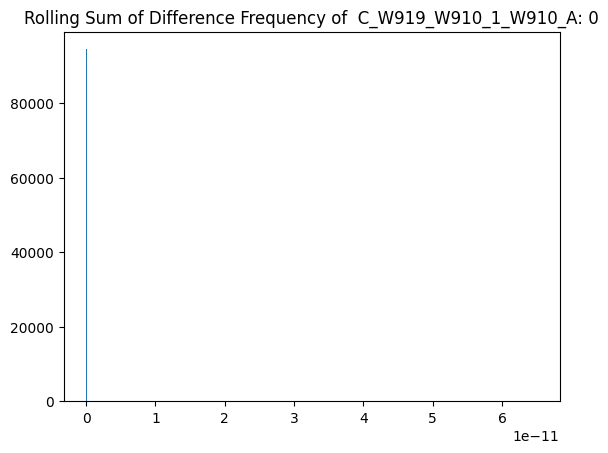

******************************************************************************


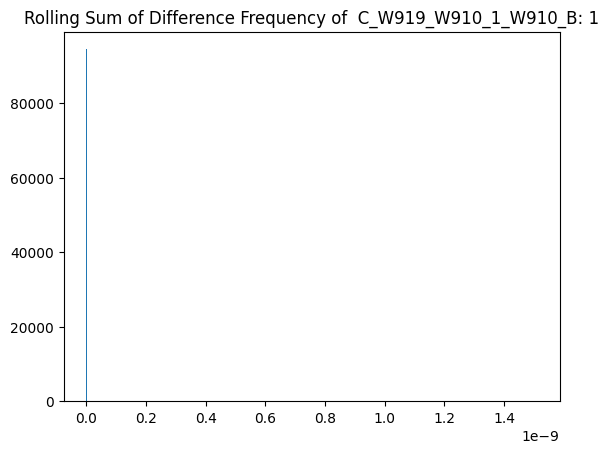

******************************************************************************


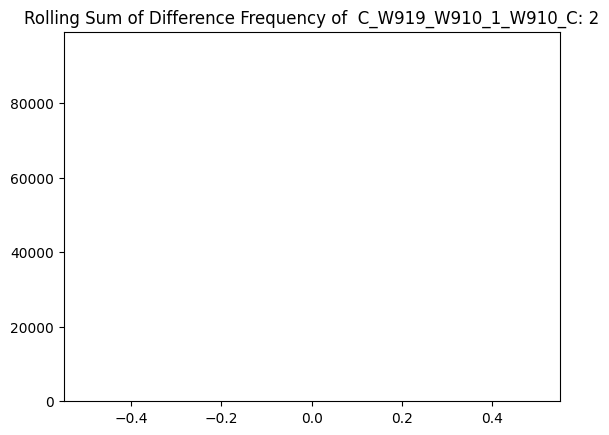

******************************************************************************


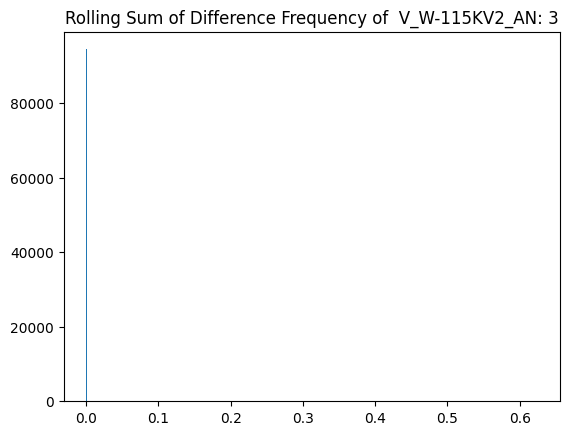

******************************************************************************


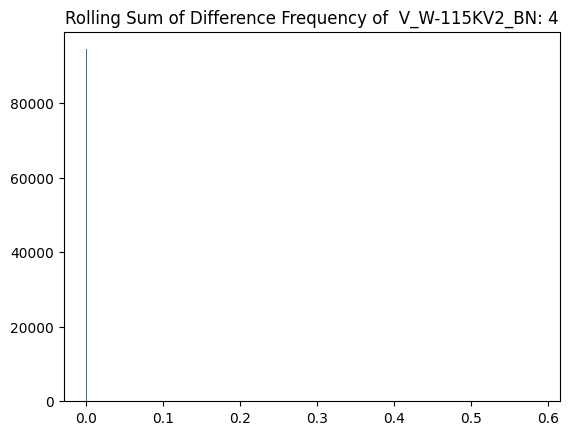

******************************************************************************


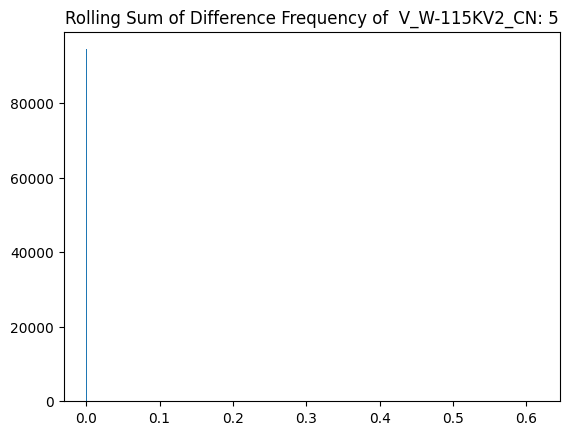

******************************************************************************


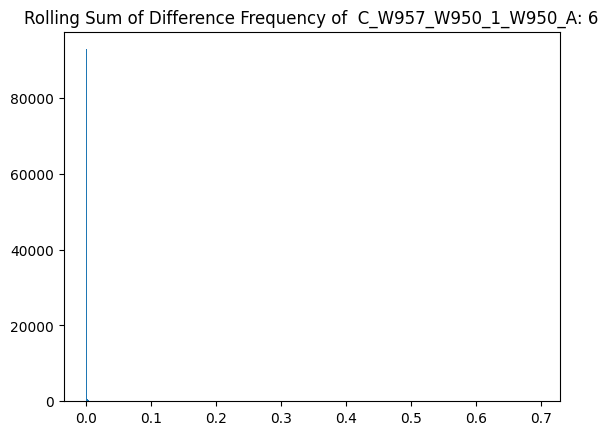

******************************************************************************


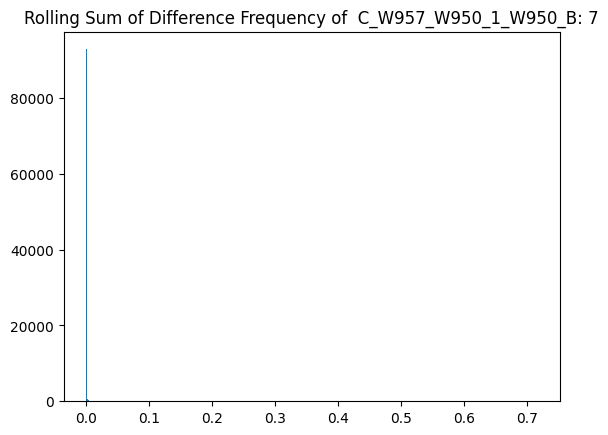

******************************************************************************


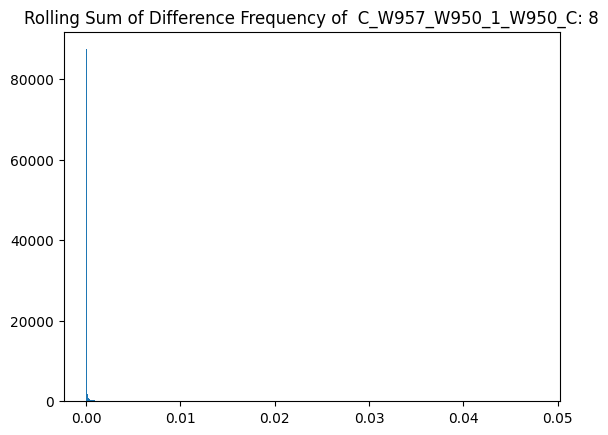

******************************************************************************


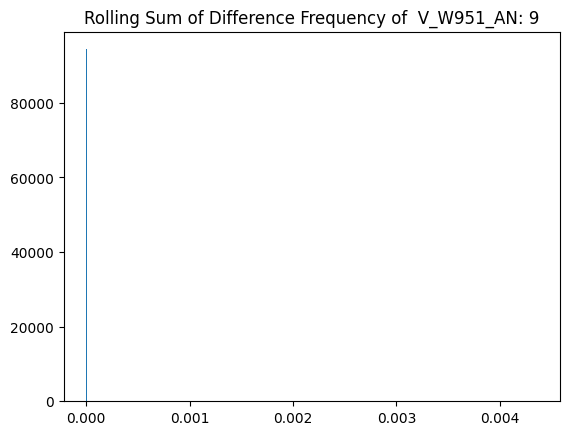

******************************************************************************


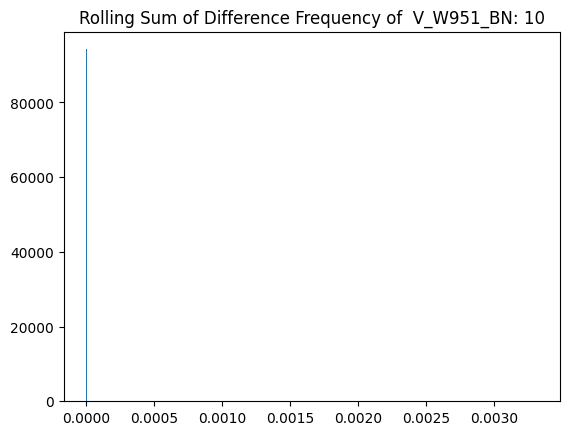

******************************************************************************


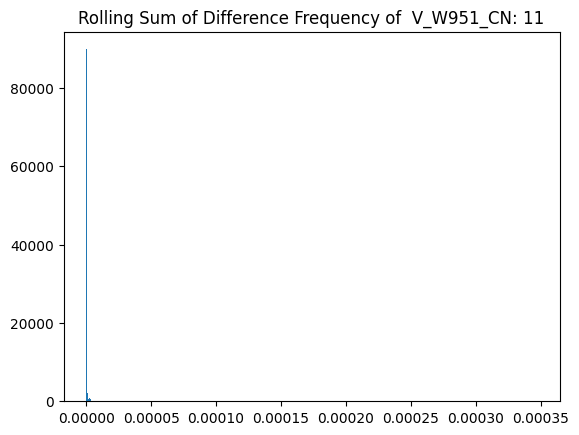

******************************************************************************


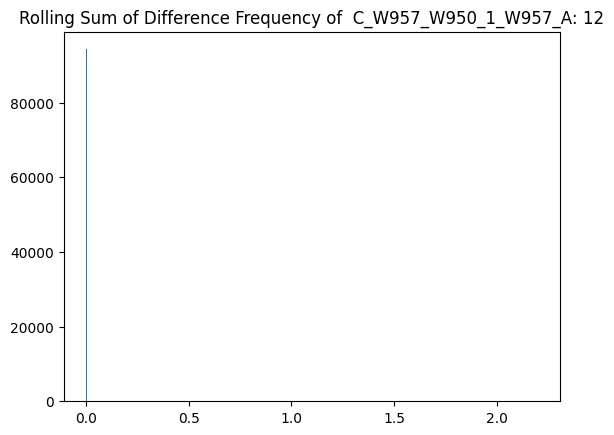

******************************************************************************


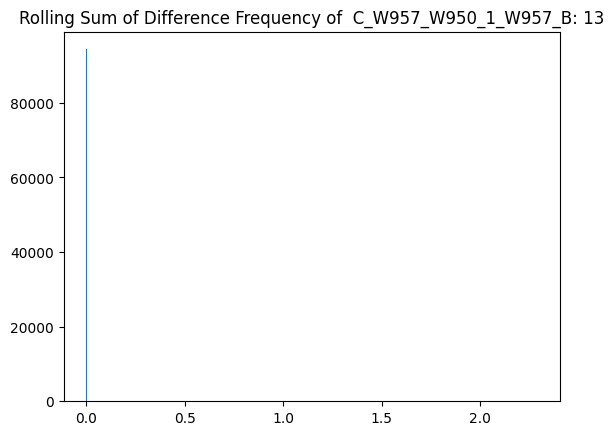

******************************************************************************


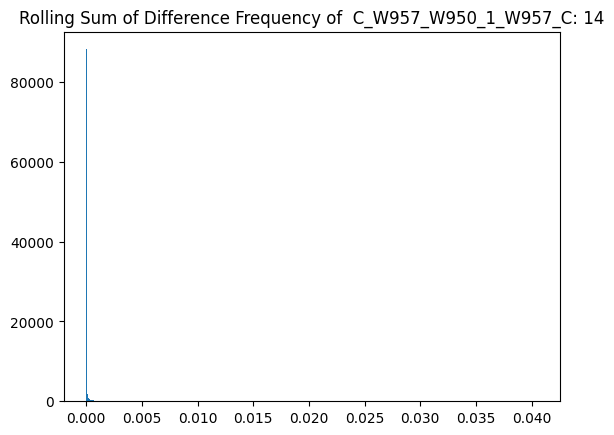

******************************************************************************


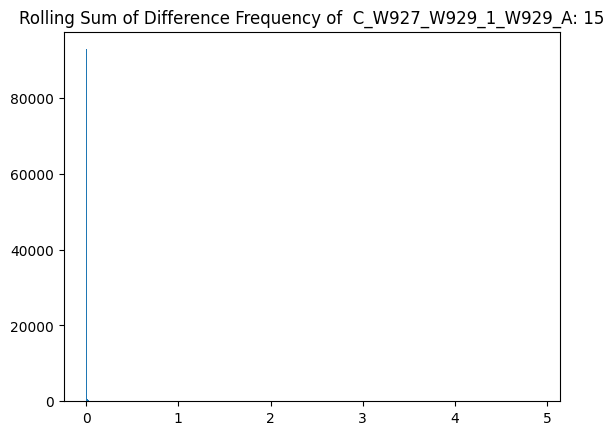

******************************************************************************


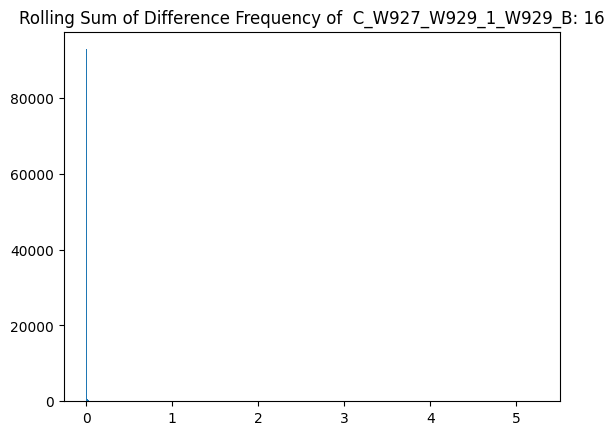

******************************************************************************


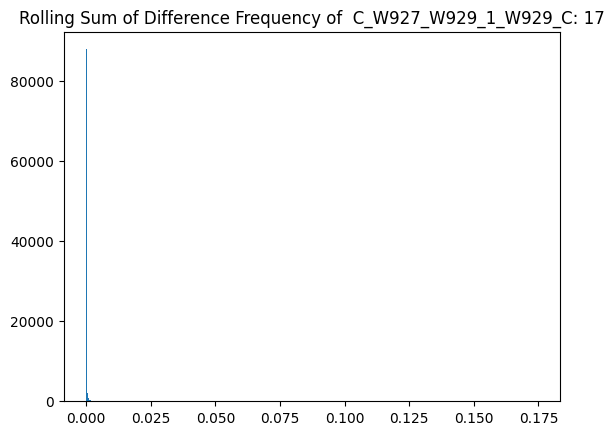

******************************************************************************


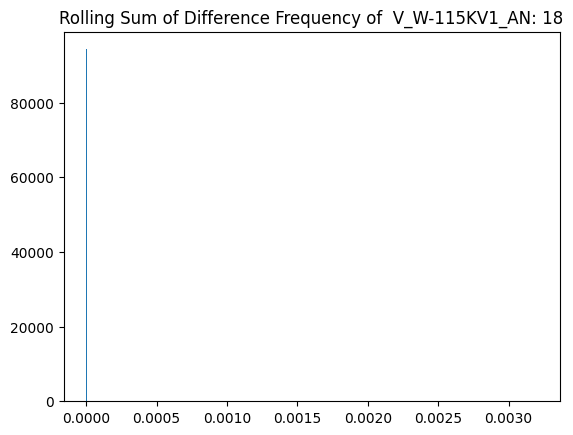

******************************************************************************


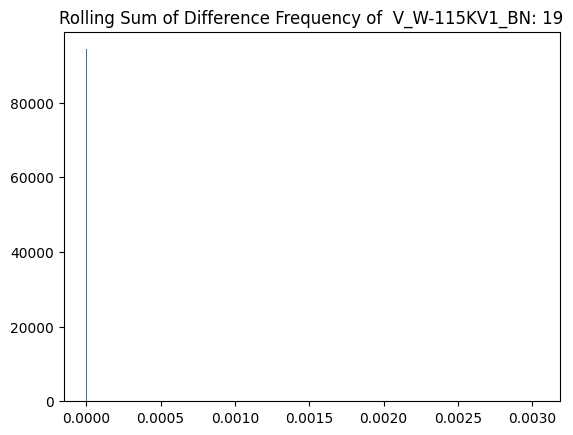

******************************************************************************


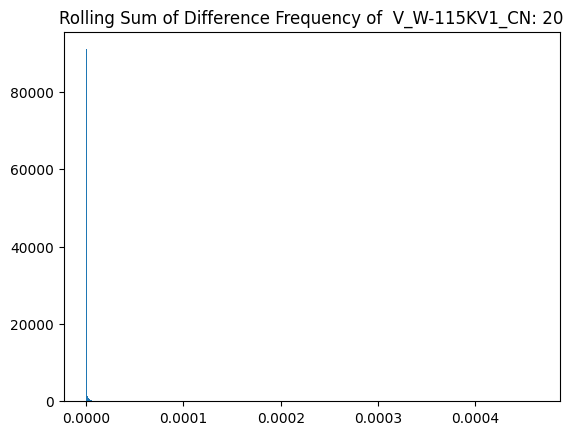

******************************************************************************


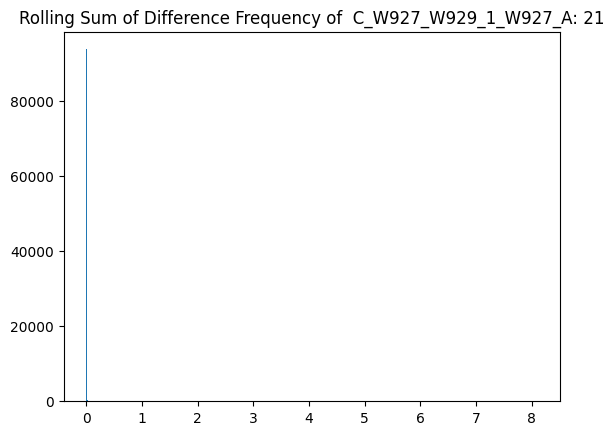

******************************************************************************


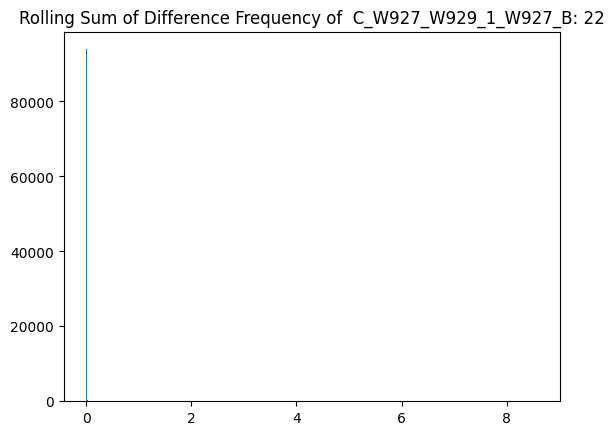

******************************************************************************


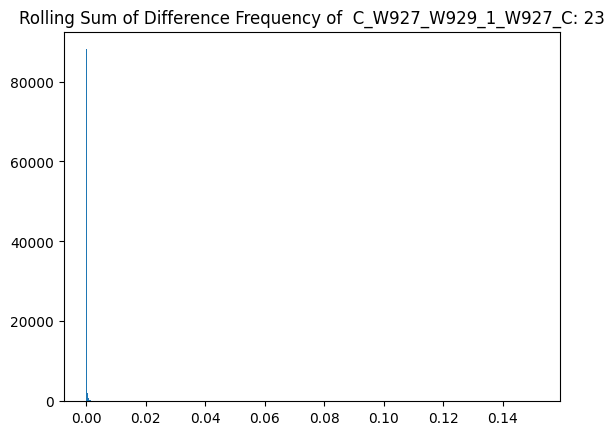

******************************************************************************


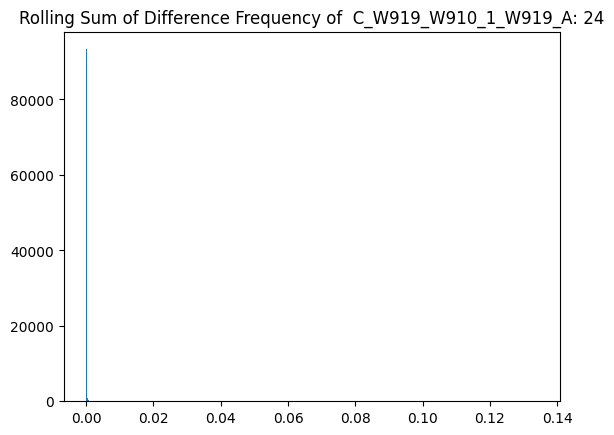

******************************************************************************


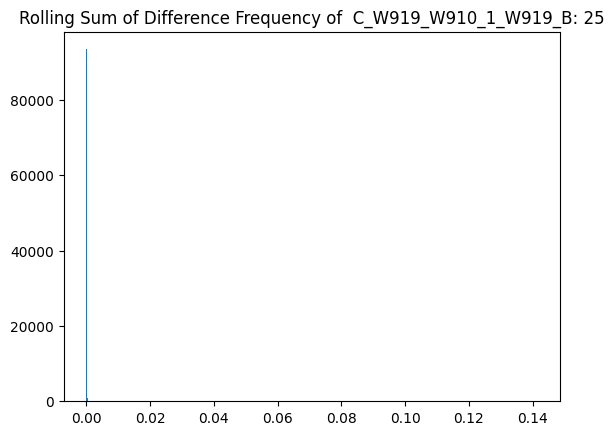

******************************************************************************


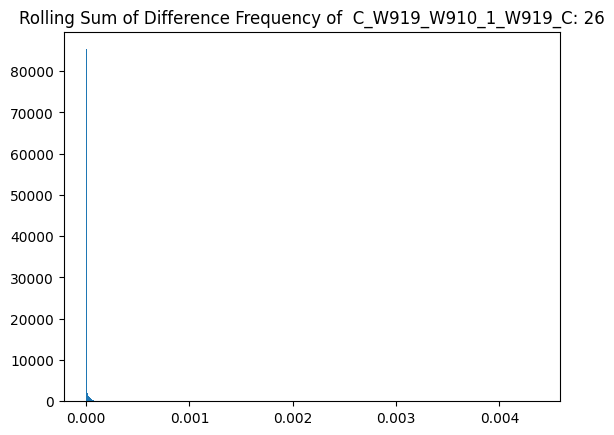

******************************************************************************


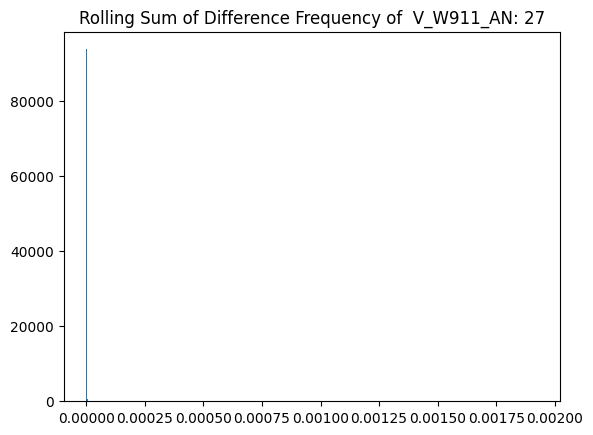

******************************************************************************


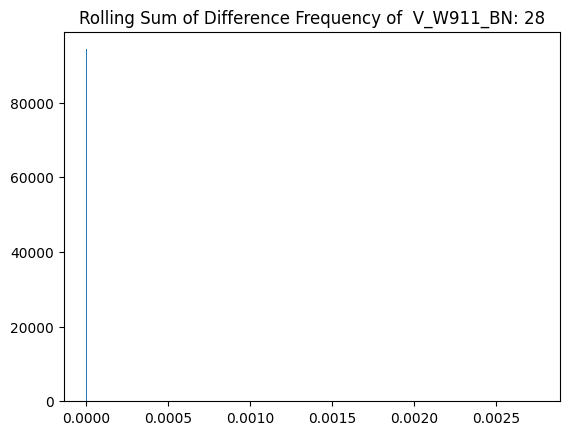

******************************************************************************


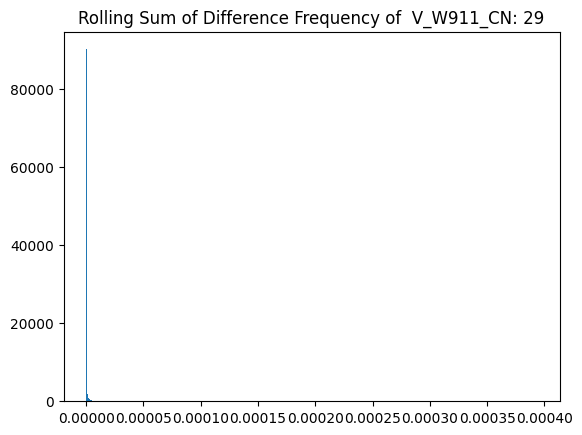

******************************************************************************


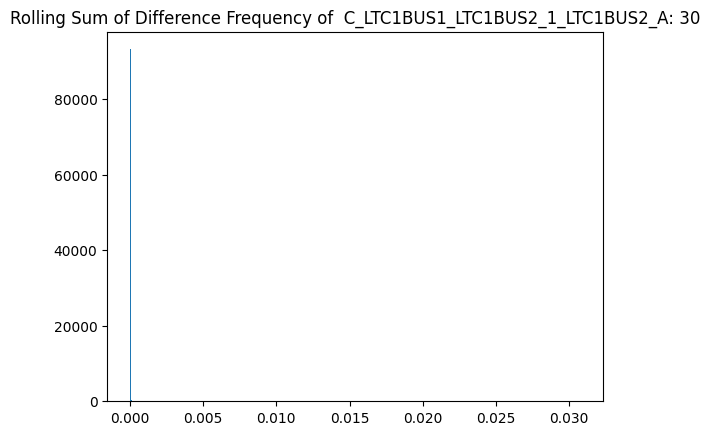

******************************************************************************


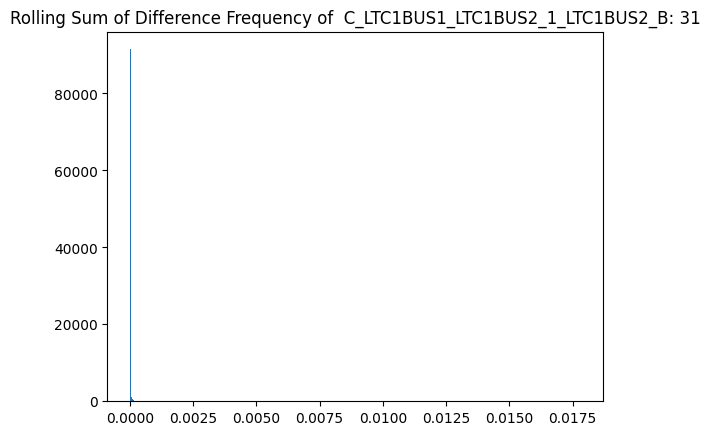

******************************************************************************


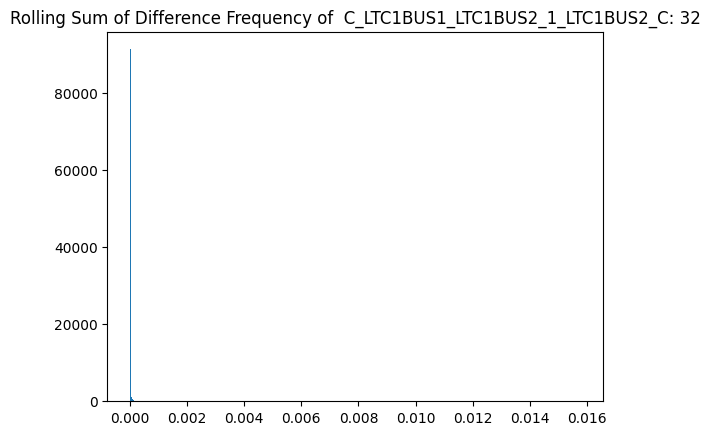

******************************************************************************


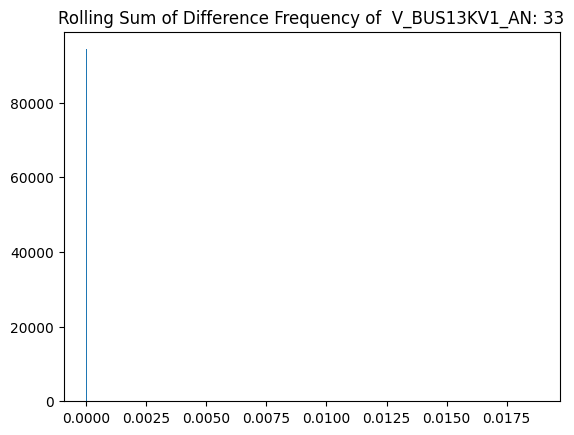

******************************************************************************


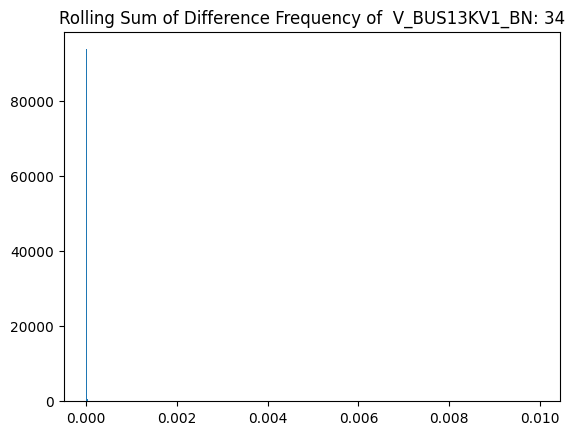

******************************************************************************


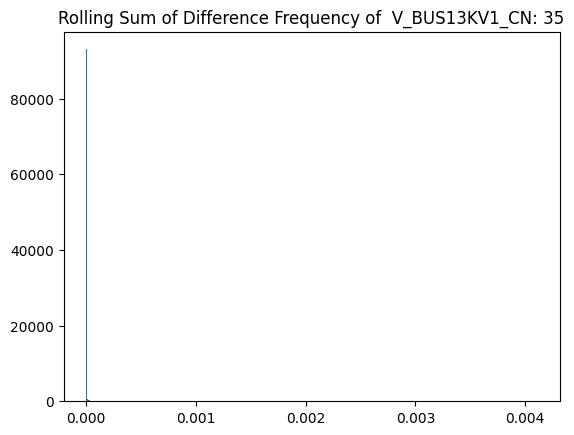

******************************************************************************


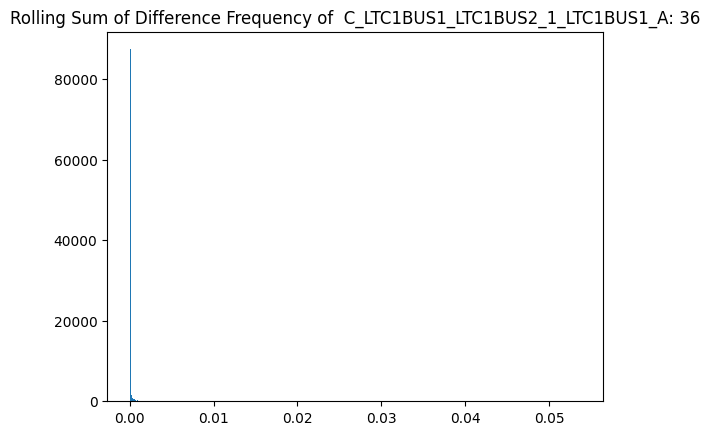

******************************************************************************


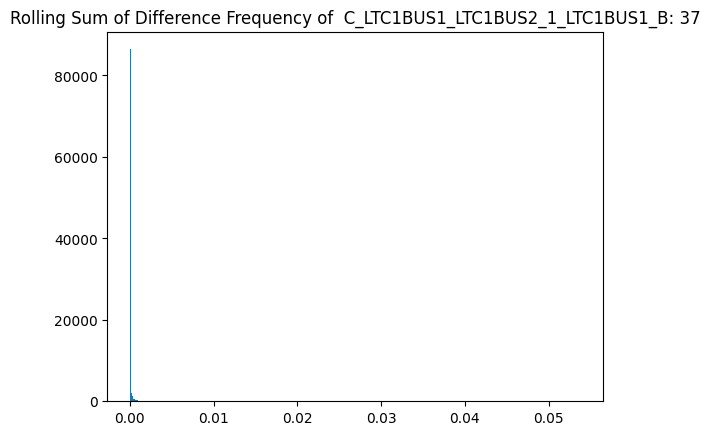

******************************************************************************


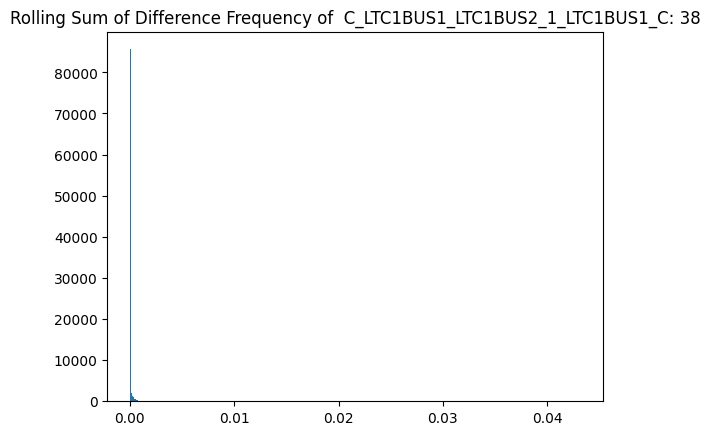

******************************************************************************


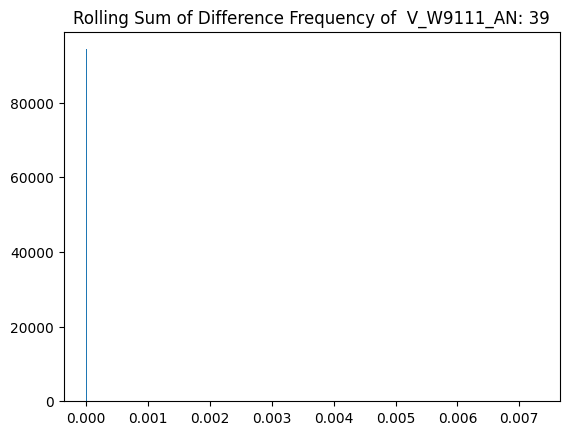

******************************************************************************


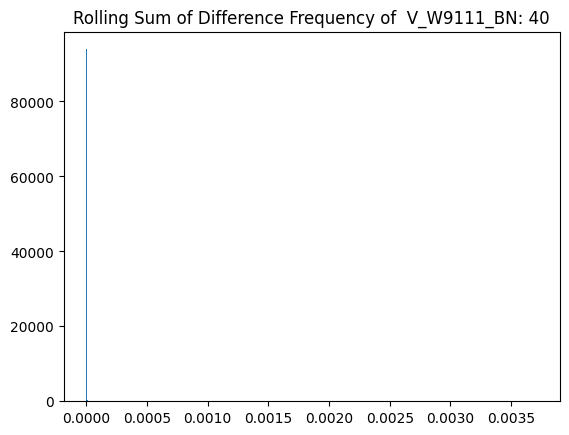

******************************************************************************


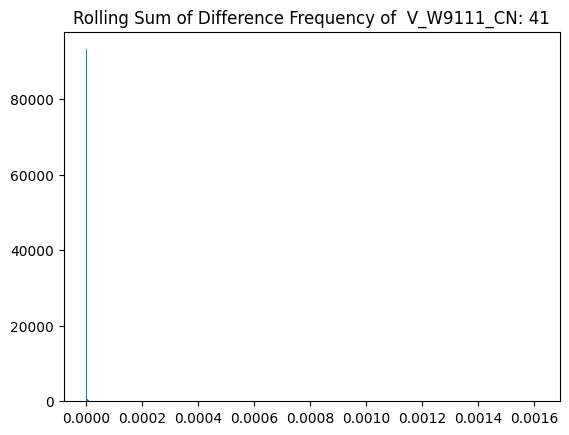

******************************************************************************


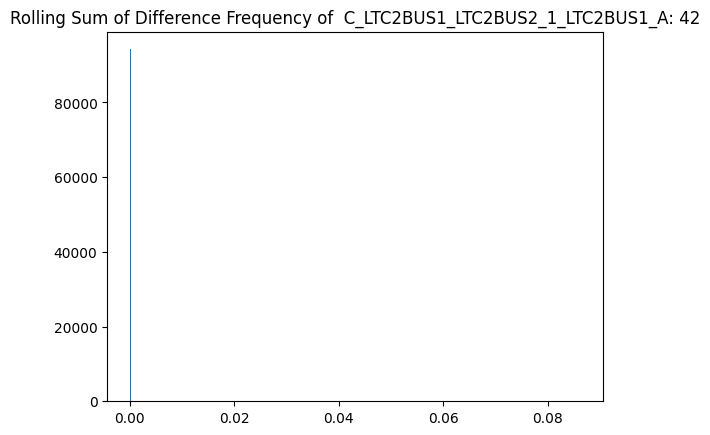

******************************************************************************


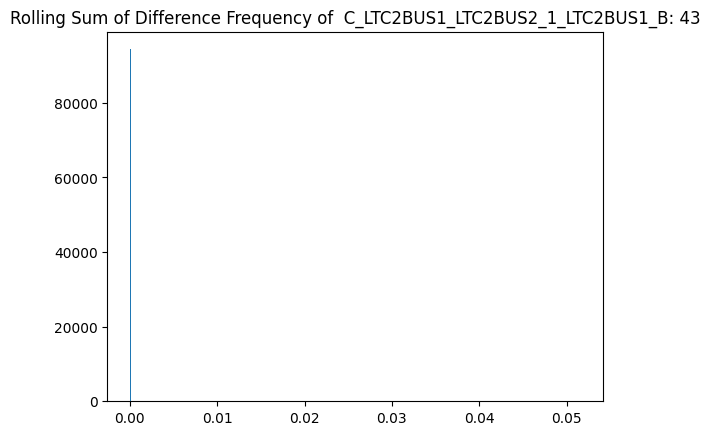

******************************************************************************


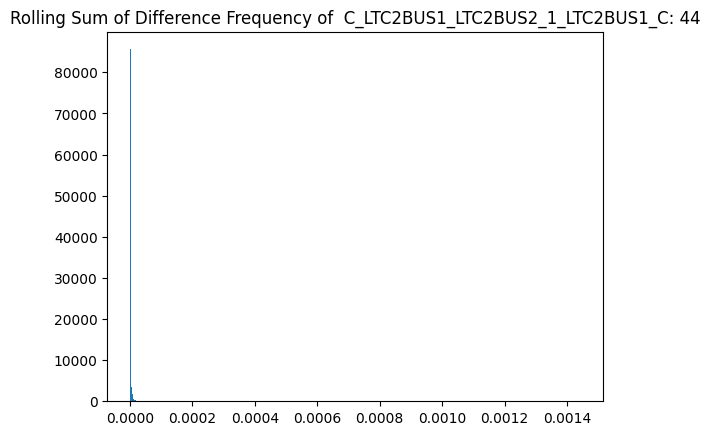

******************************************************************************


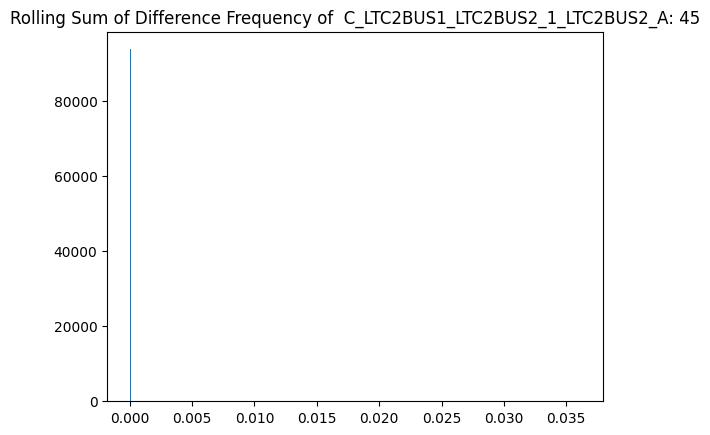

******************************************************************************


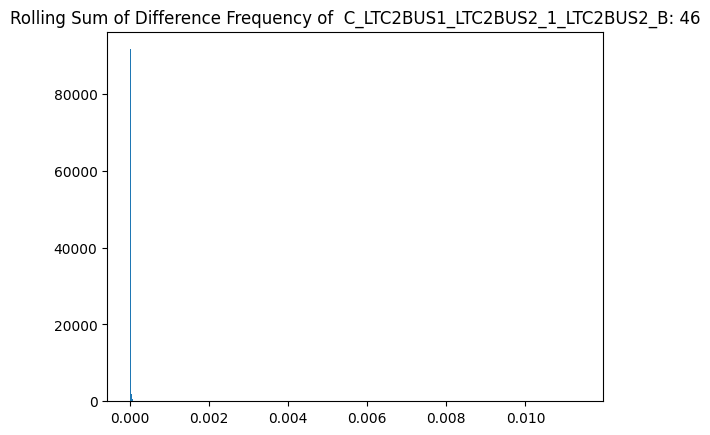

******************************************************************************


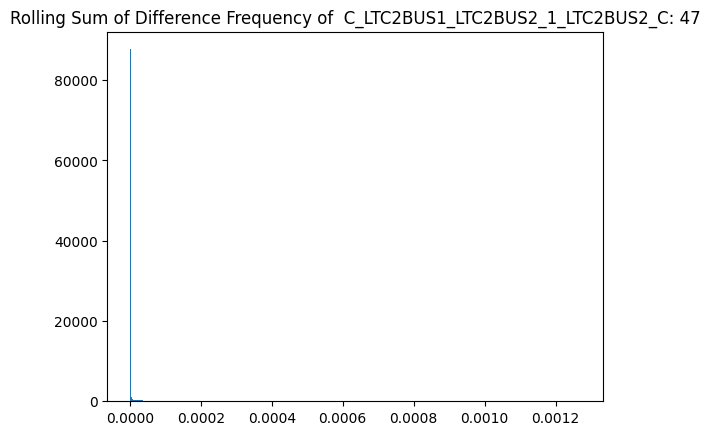

******************************************************************************


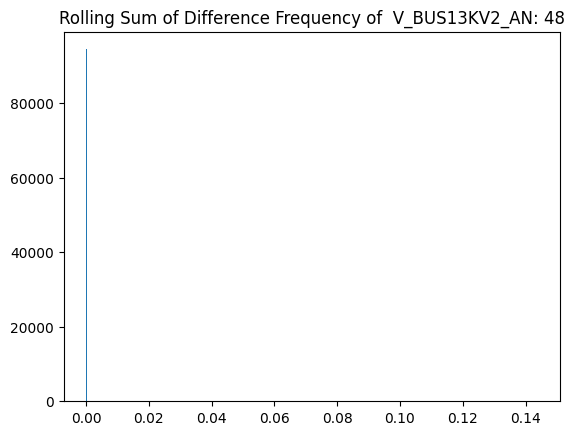

******************************************************************************


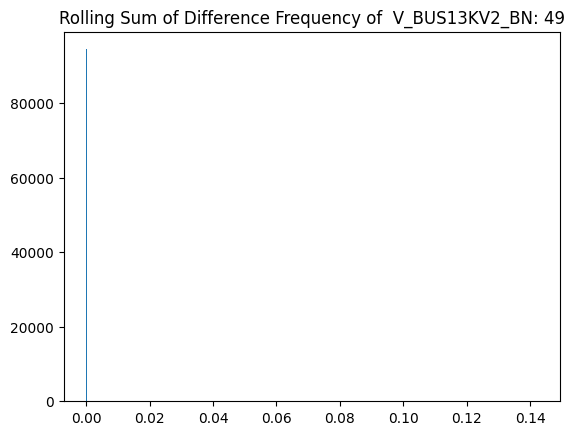

******************************************************************************


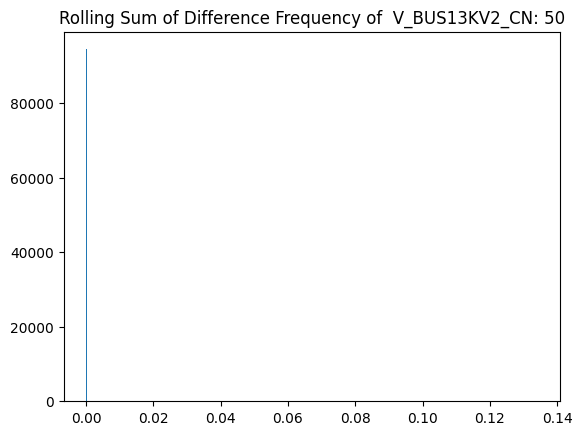

******************************************************************************


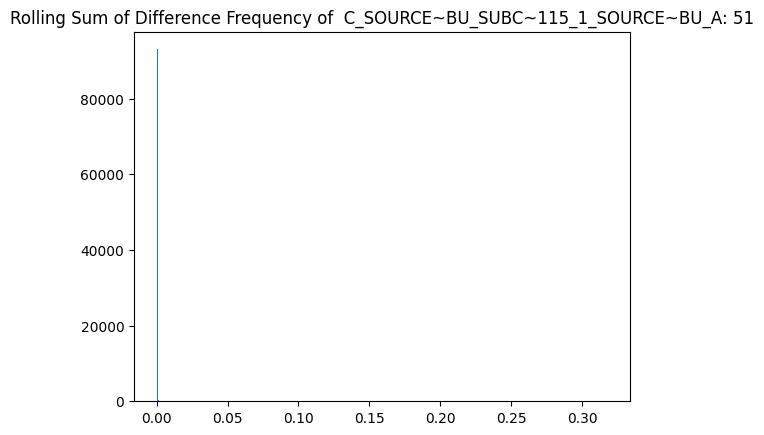

******************************************************************************


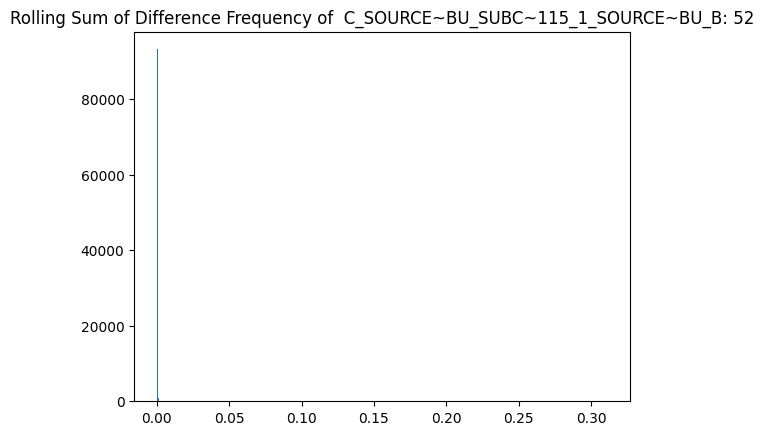

******************************************************************************


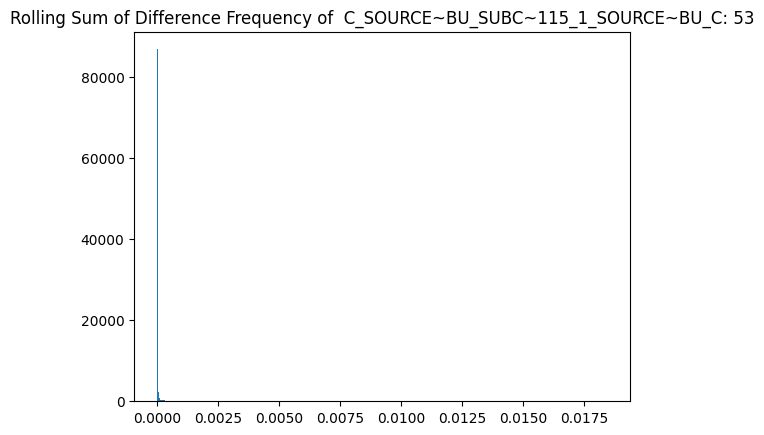

******************************************************************************


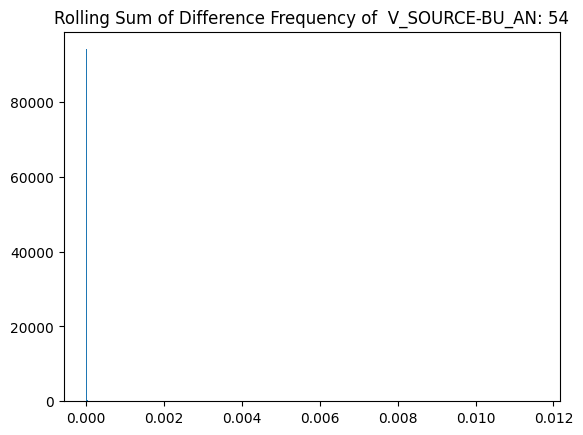

******************************************************************************


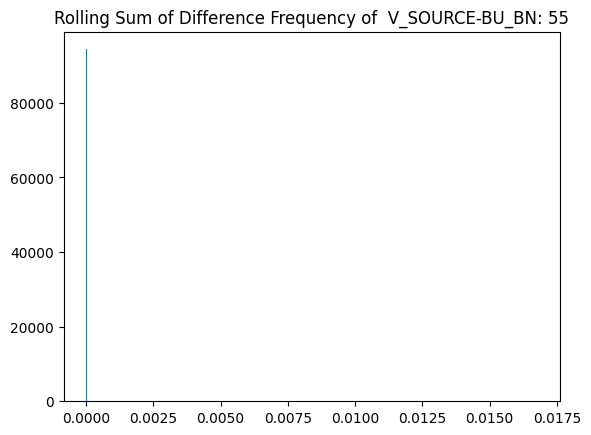

******************************************************************************


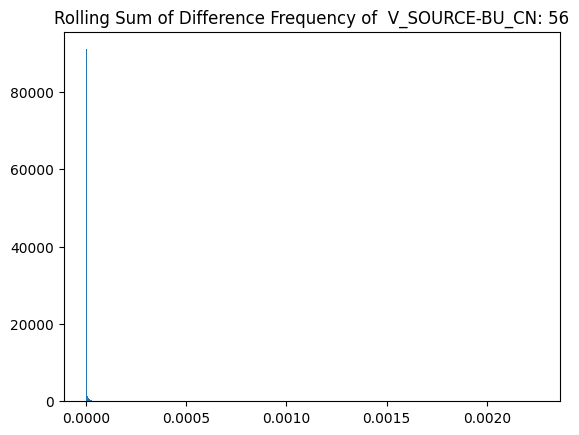

******************************************************************************


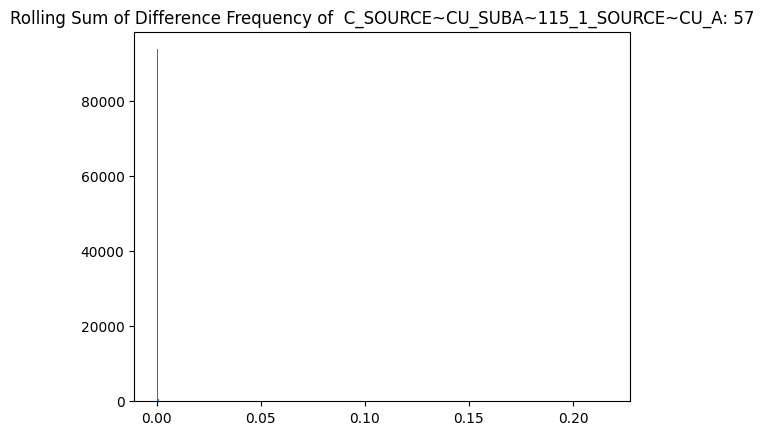

******************************************************************************


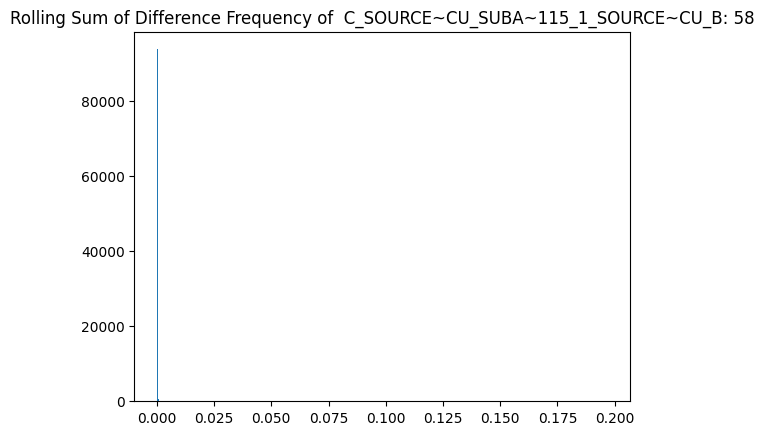

******************************************************************************


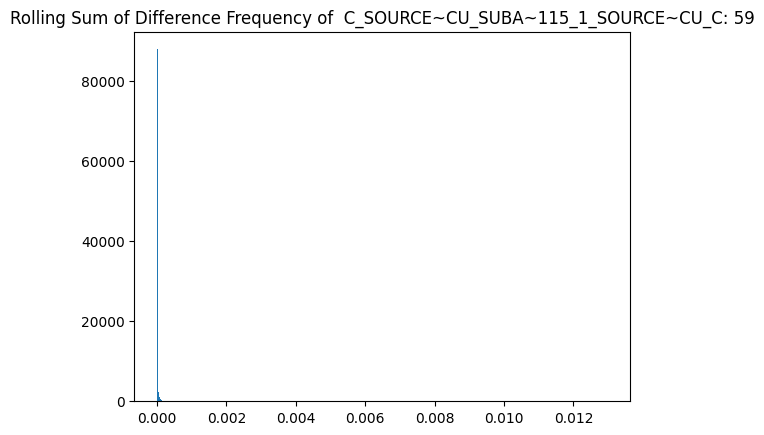

******************************************************************************


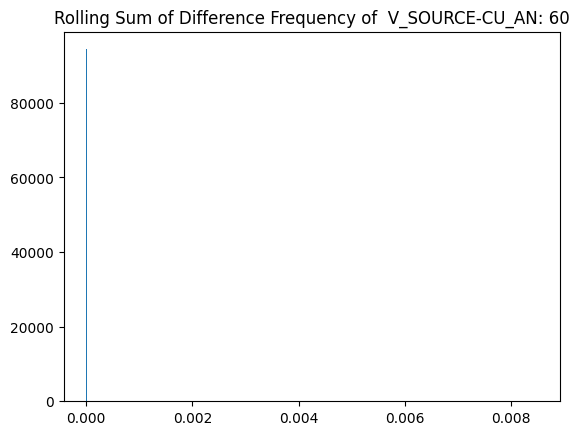

******************************************************************************


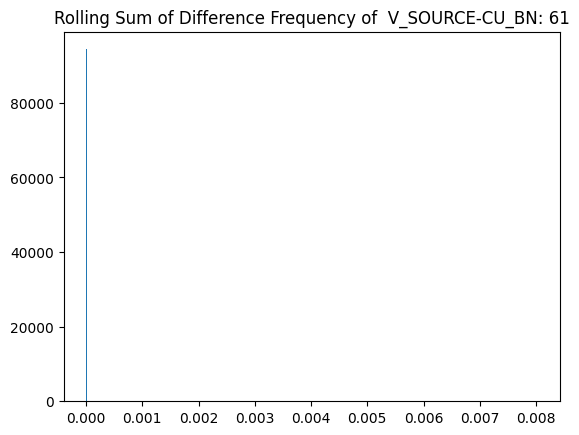

******************************************************************************


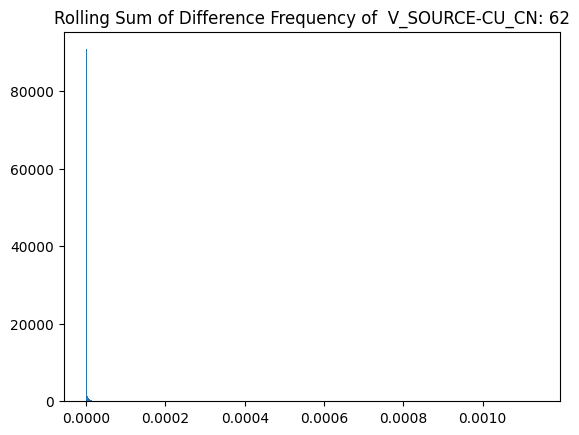

******************************************************************************


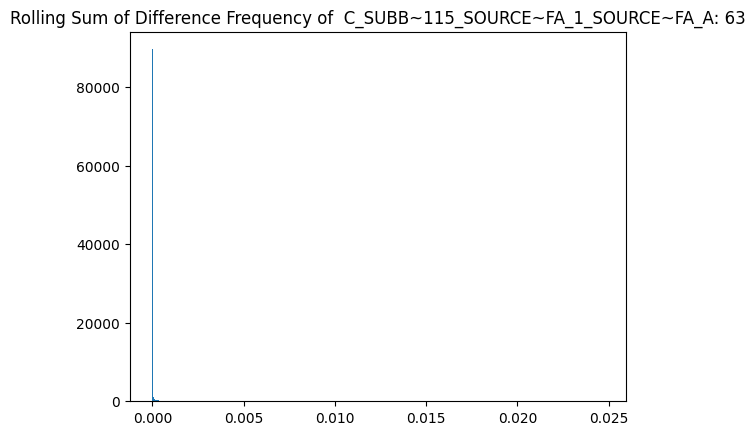

******************************************************************************


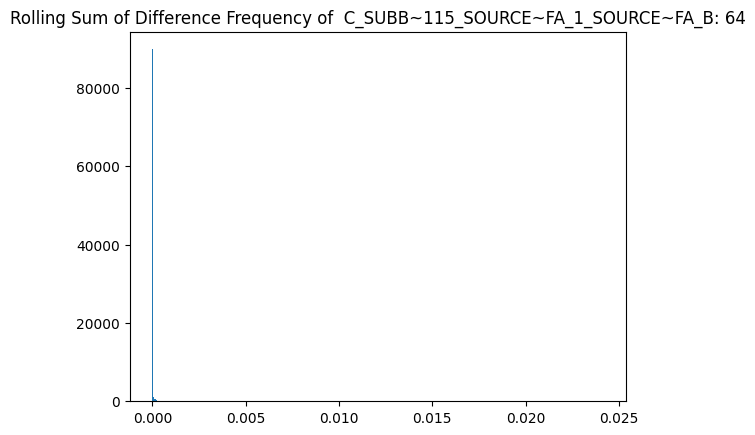

******************************************************************************


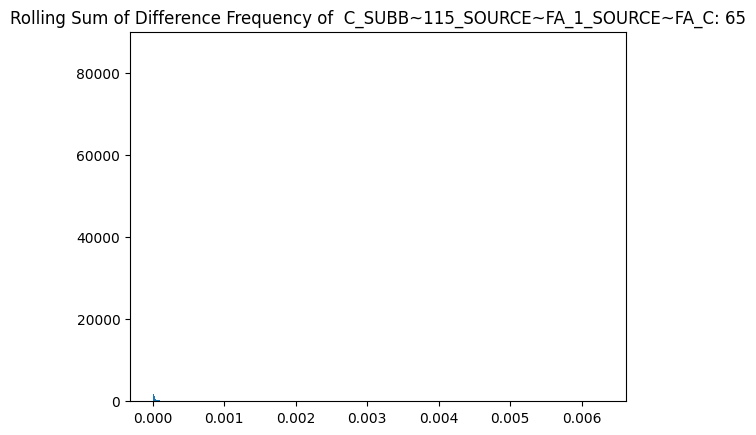

******************************************************************************


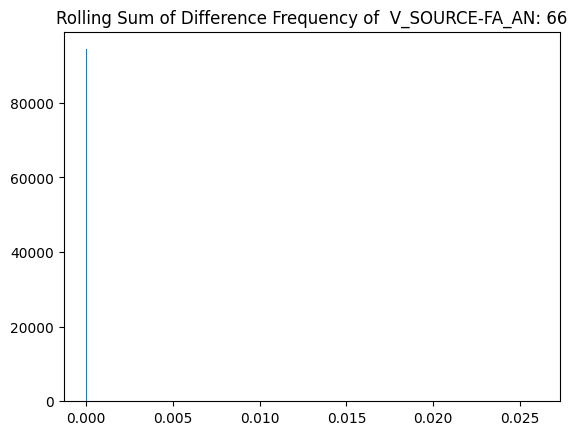

******************************************************************************


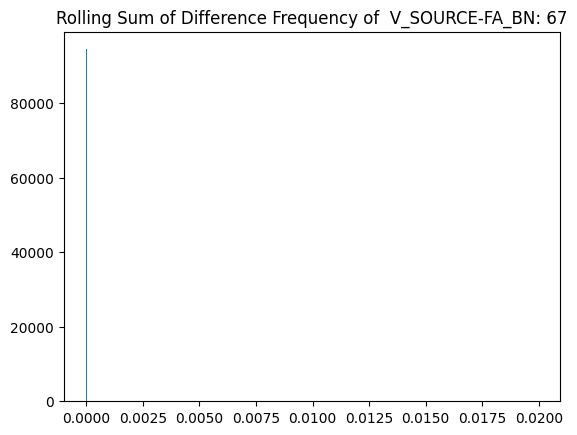

******************************************************************************


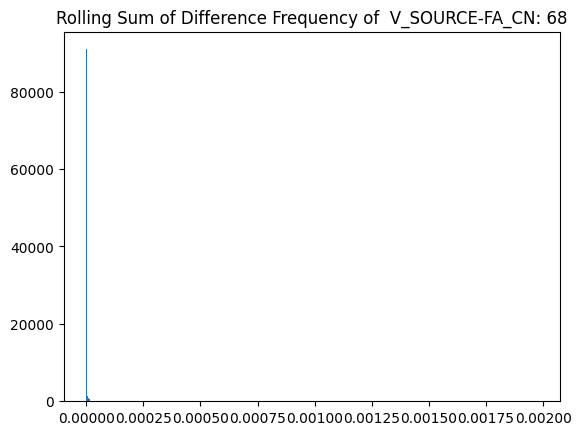

******************************************************************************


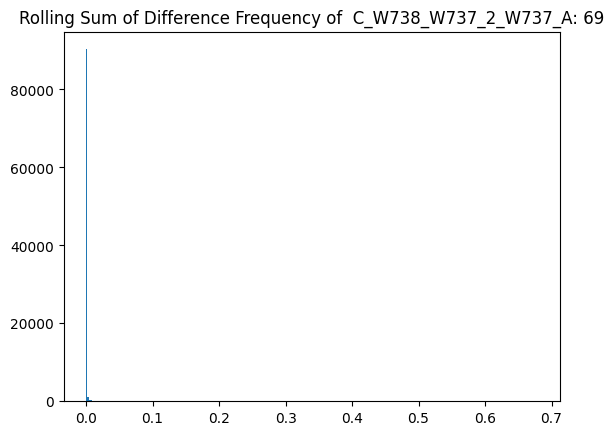

******************************************************************************


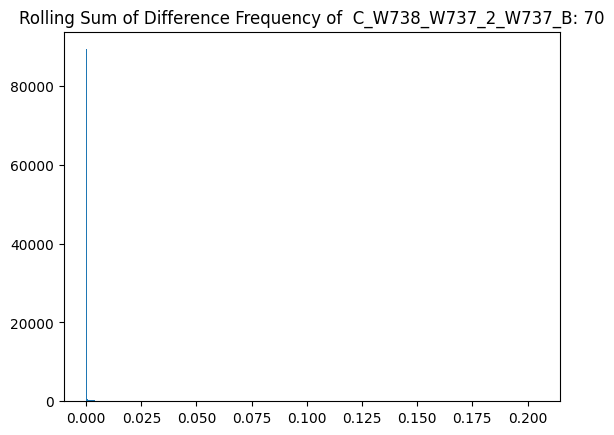

******************************************************************************


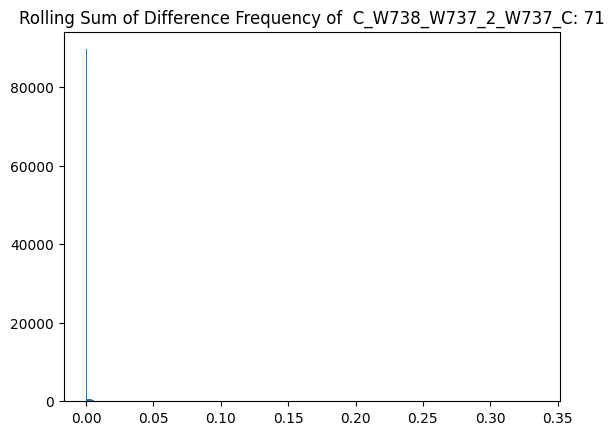

******************************************************************************


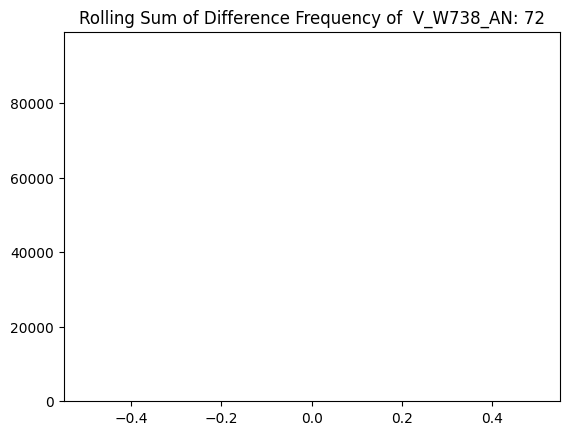

******************************************************************************


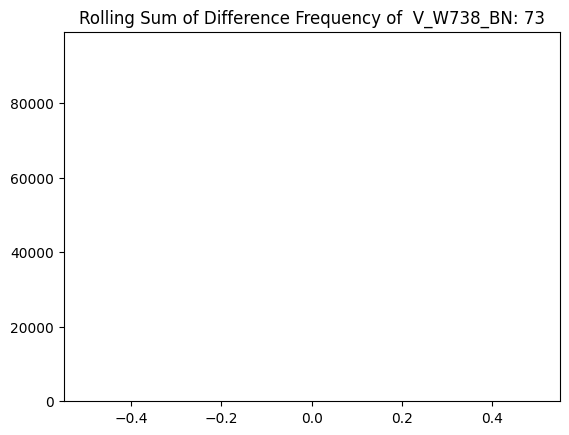

******************************************************************************


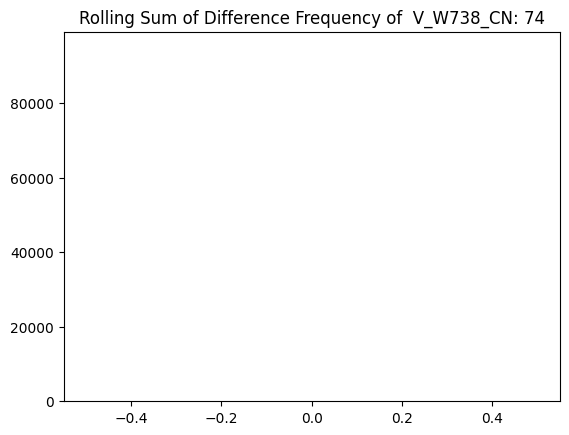

******************************************************************************


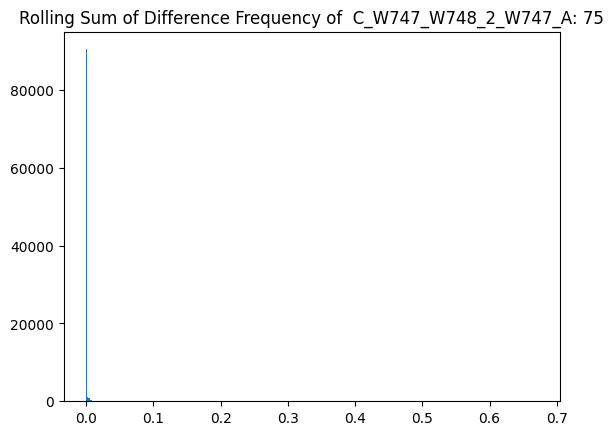

******************************************************************************


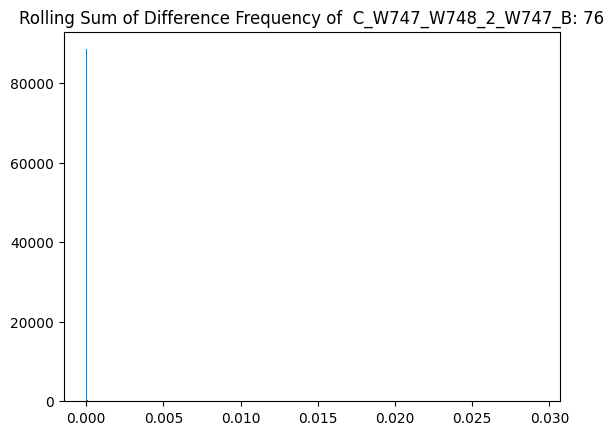

******************************************************************************


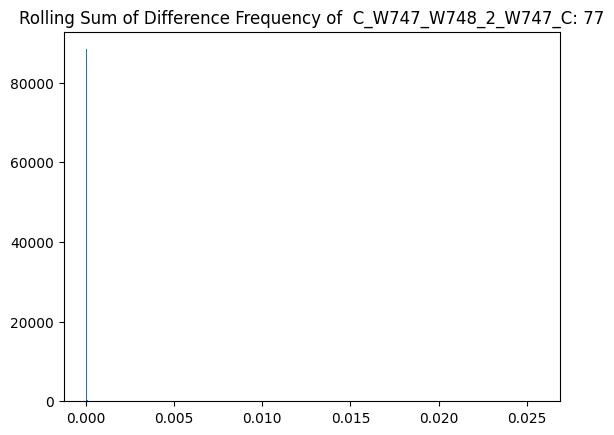

******************************************************************************


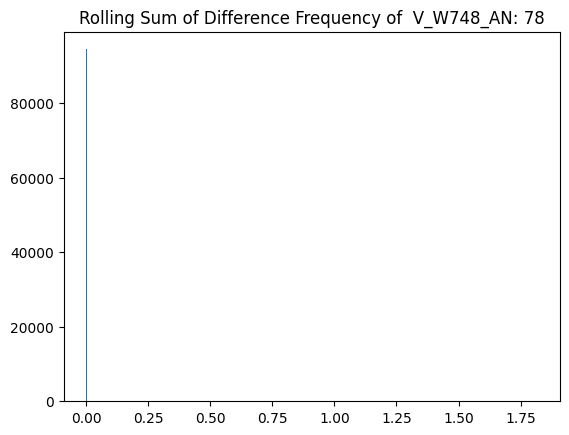

******************************************************************************


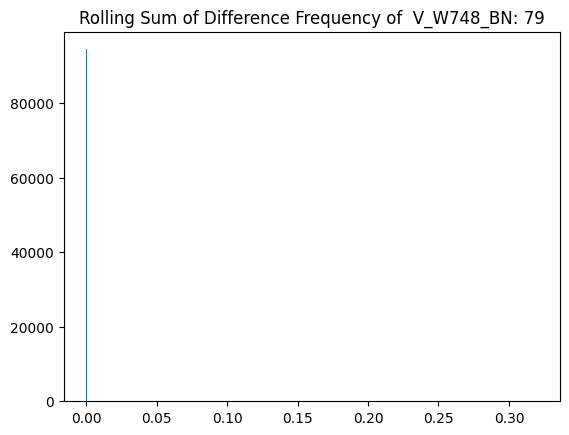

******************************************************************************


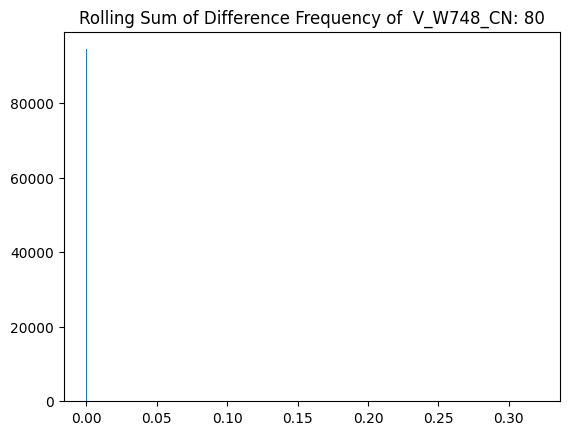

******************************************************************************


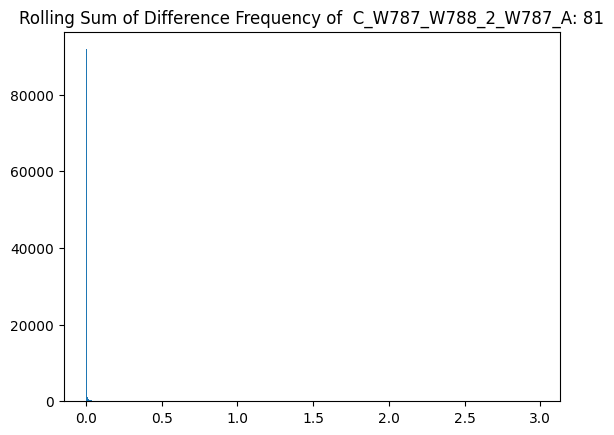

******************************************************************************


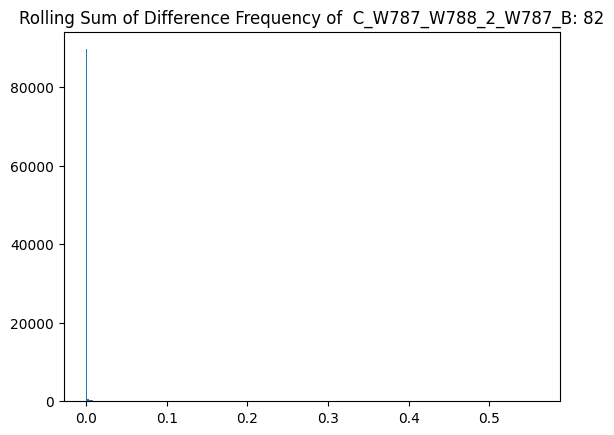

******************************************************************************


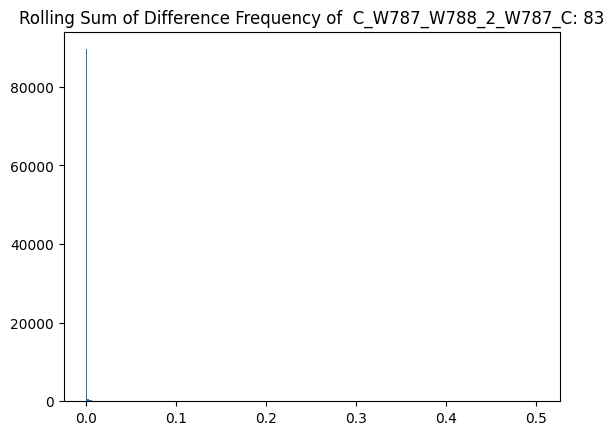

******************************************************************************


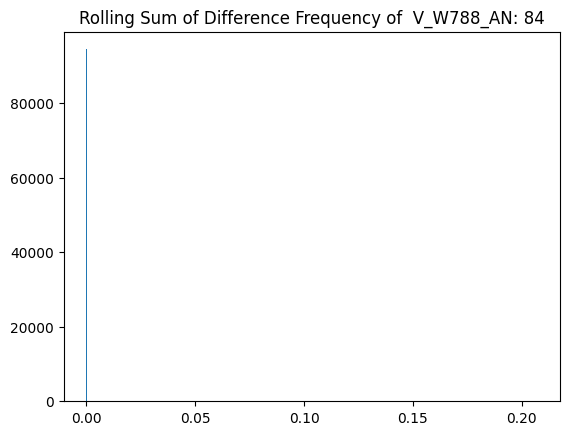

******************************************************************************


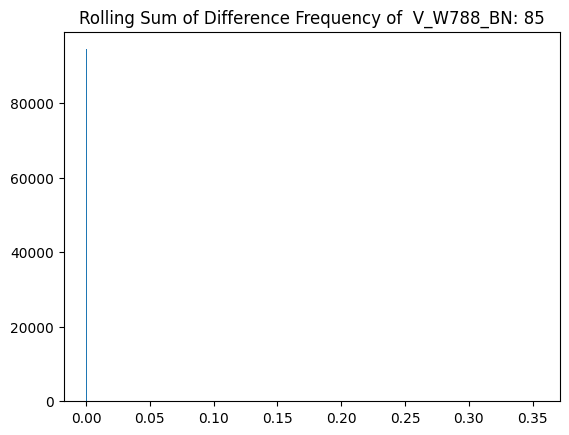

******************************************************************************


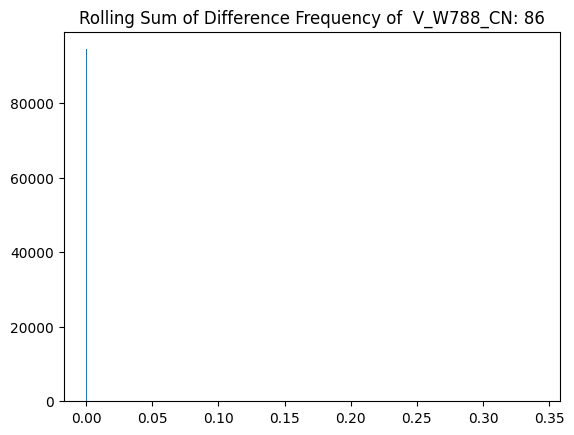

******************************************************************************


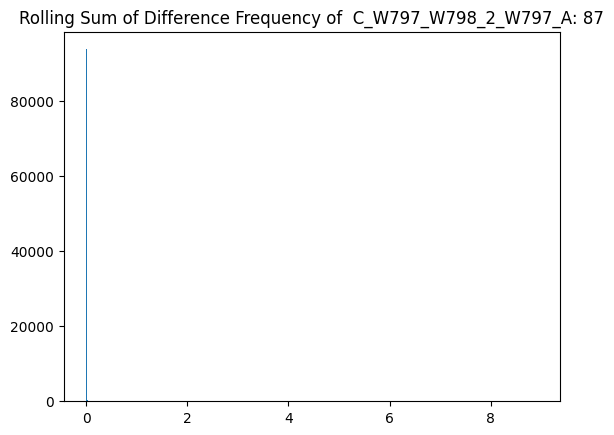

******************************************************************************


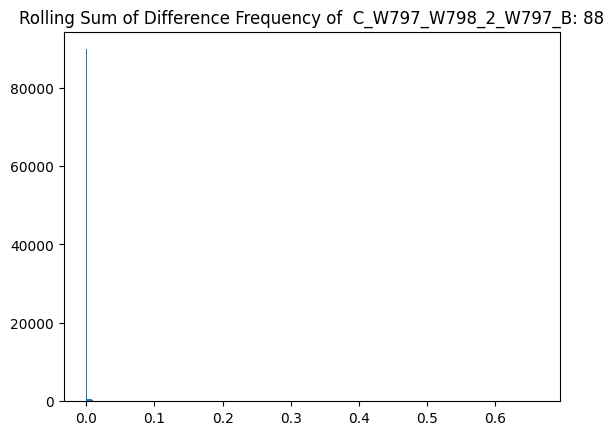

******************************************************************************


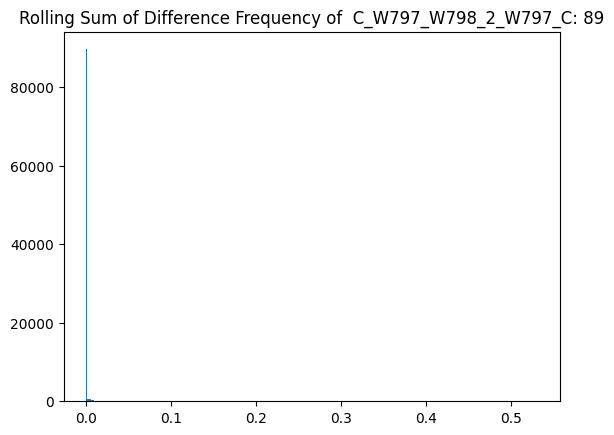

******************************************************************************


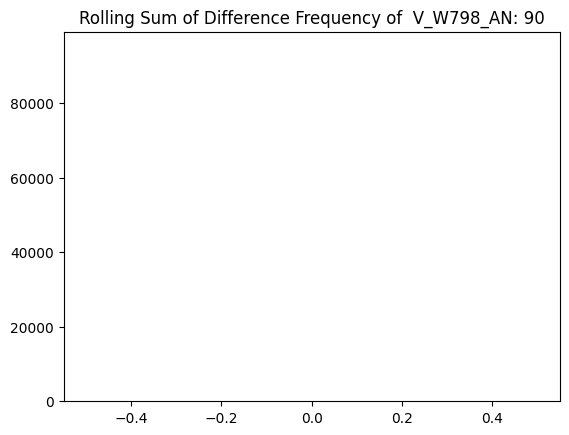

******************************************************************************


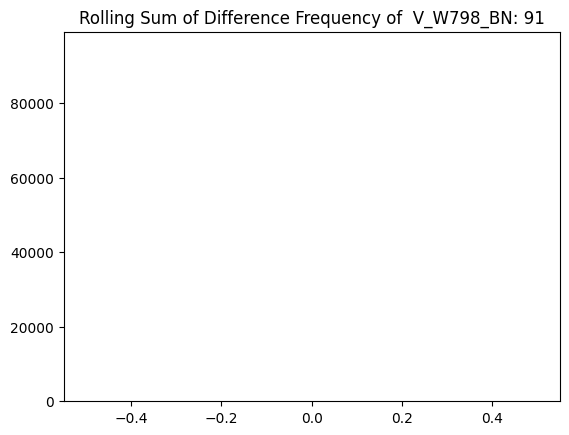

******************************************************************************


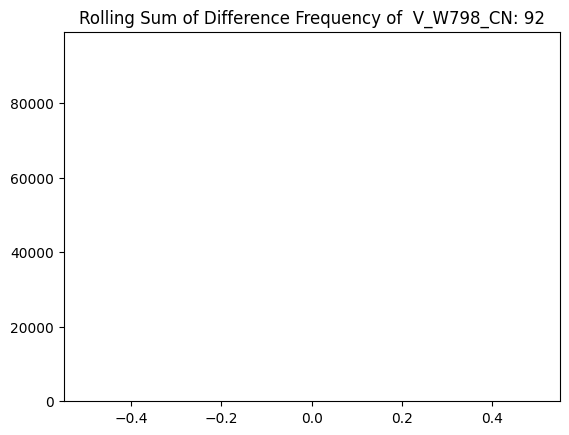

******************************************************************************


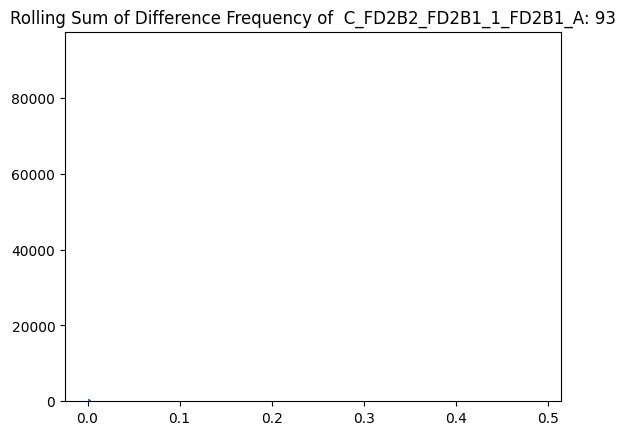

******************************************************************************


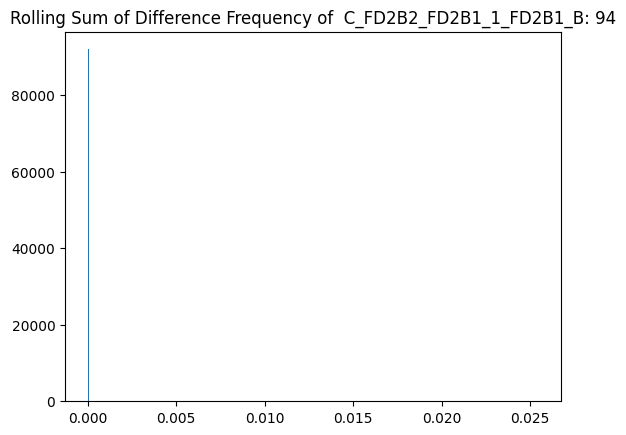

******************************************************************************


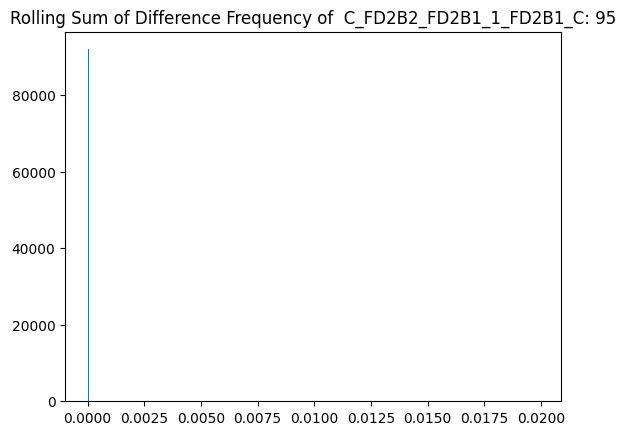

******************************************************************************


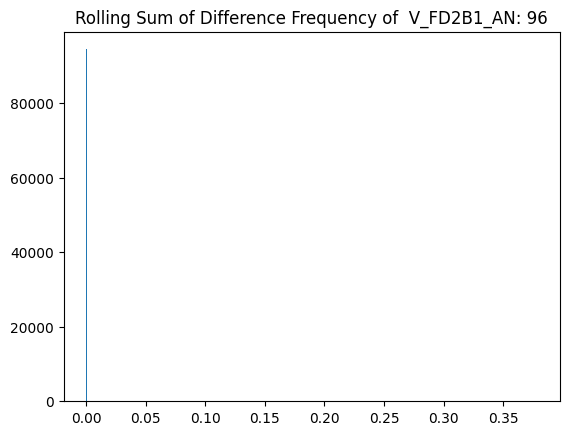

******************************************************************************


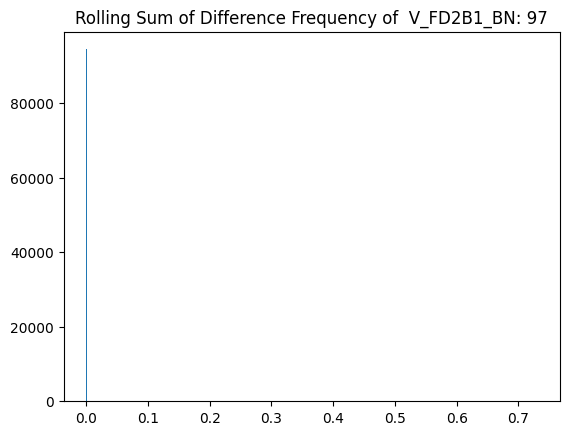

******************************************************************************


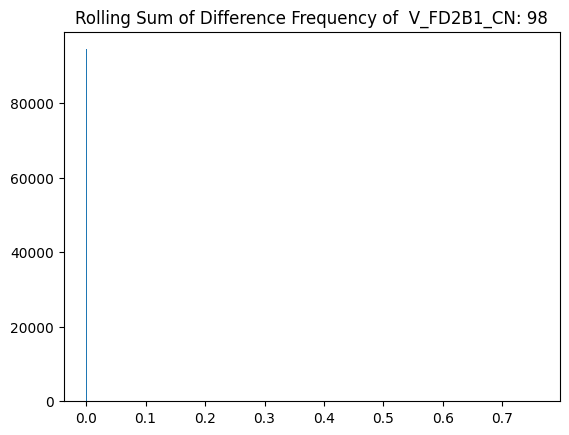

******************************************************************************


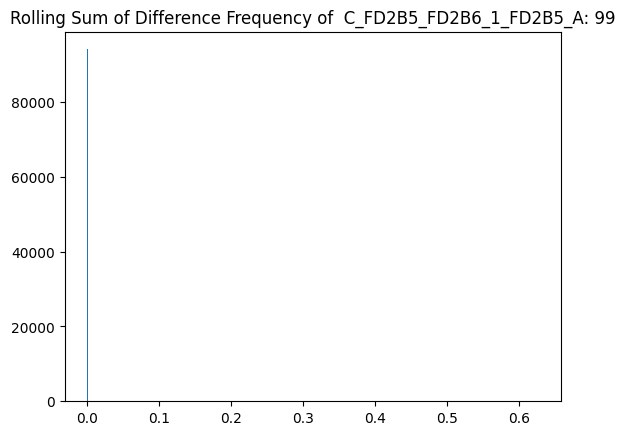

******************************************************************************


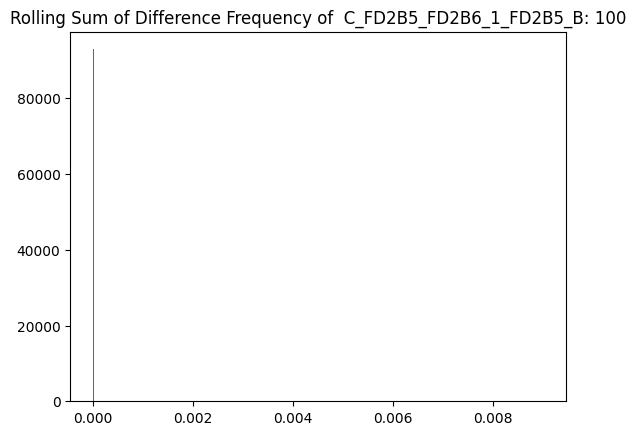

******************************************************************************


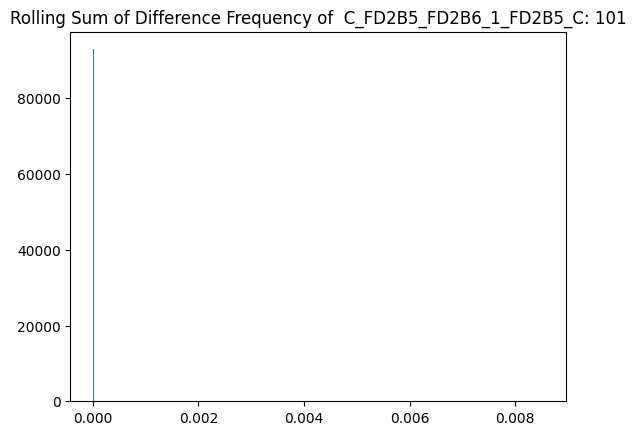

******************************************************************************


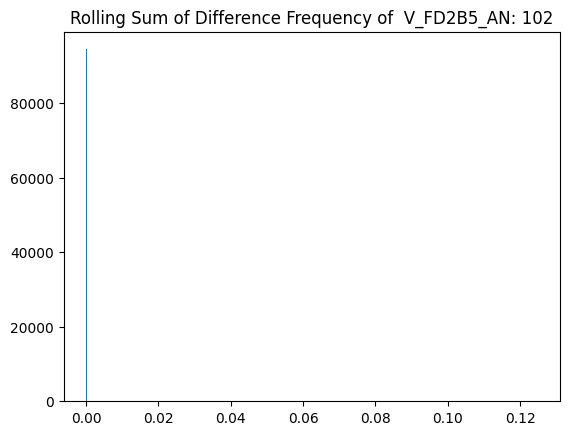

******************************************************************************


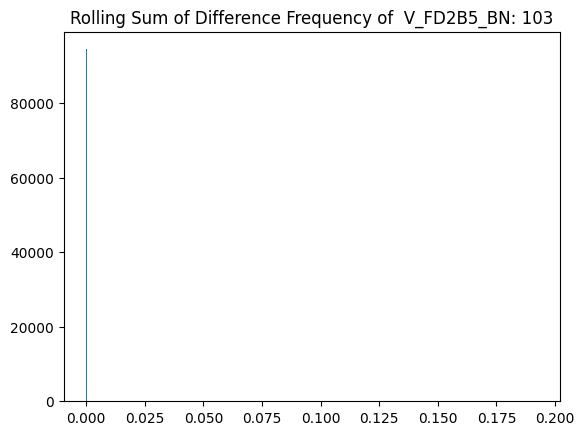

******************************************************************************


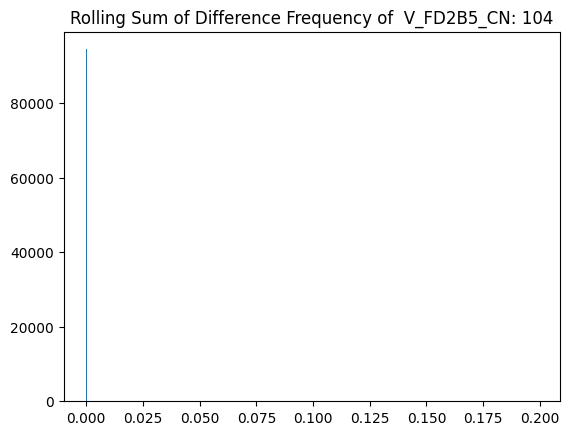

******************************************************************************


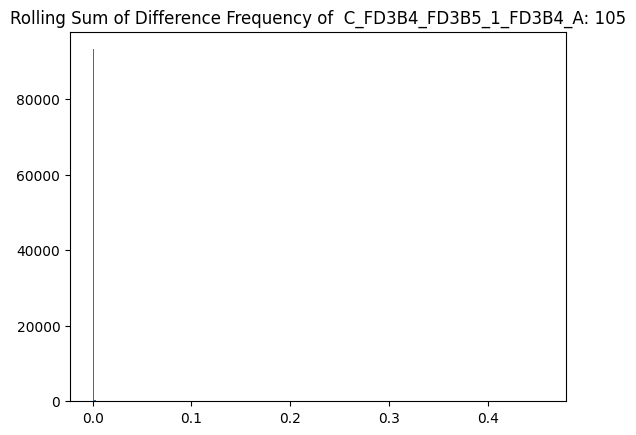

******************************************************************************


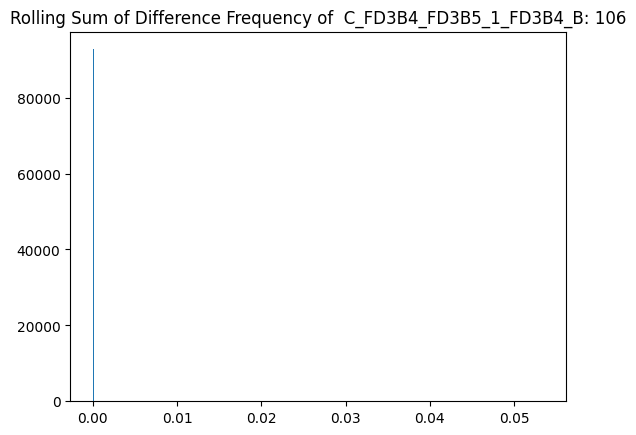

******************************************************************************


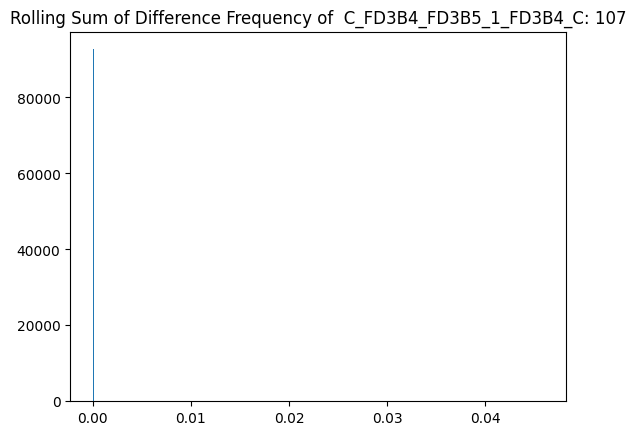

******************************************************************************


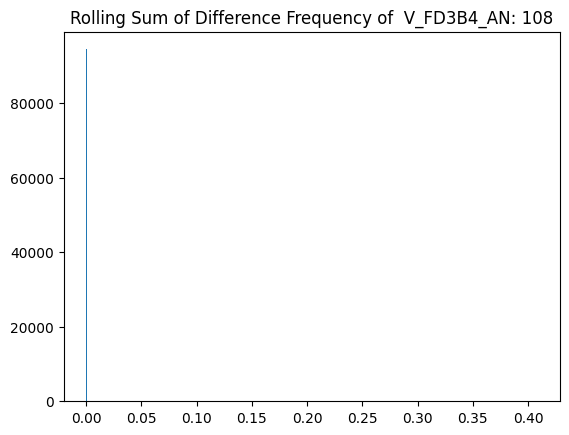

******************************************************************************


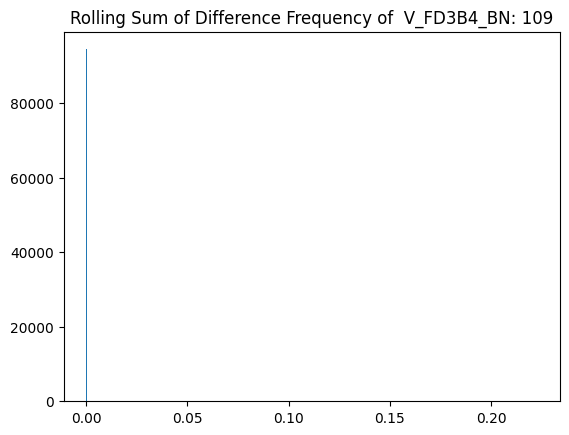

******************************************************************************


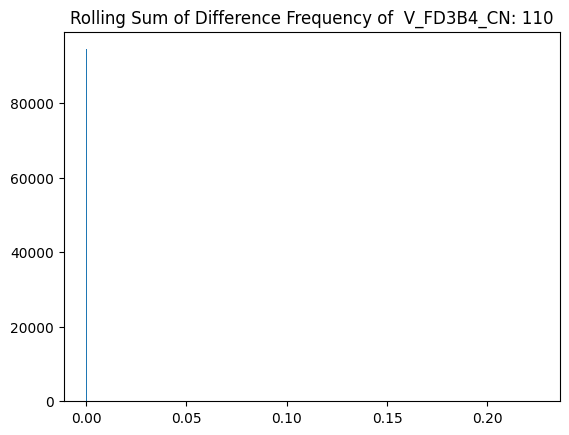

******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
****************************************************

In [ ]:
window = 320
w = 1

var_fn = var_pair
thresholds_var, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
thresholds_var_99, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.99, axis=1, stat_list=var_multi_list, collate_fn="sum")
thresholds_var_95, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.95, axis=1, stat_list=var_multi_list, collate_fn="sum")

In [ ]:
len(thresholds_var_95)

111

In [ ]:
# with open("models/" + f"thresholds_corr_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_corr)
# with open("models/" + f"thresholds_corr_99_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_corr_99)
# with open("models/" + f"thresholds_corr_95_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_corr_95)

# with open("models/" + f"thresholds_var_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_var)
# with open("models/" + f"thresholds_var_99_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_var_99)
# with open("models/" + f"thresholds_var_95_{topology}.npy", 'wb') as f:
#     np.save(f, thresholds_var_95)

In [ ]:
# with open("models/" + f"thresholds_corr_{topology}.npy", 'rb') as f:
#     thresholds_corr = np.load(f)
# with open("models/" + f"thresholds_corr_99_{topology}.npy", 'rb') as f:
#     thresholds_corr_99 = np.load(f)
# with open("models/" + f"thresholds_corr_95_{topology}.npy", 'rb') as f:
#     thresholds_corr_95 = np.load(f)

# with open("models/" + f"thresholds_var_{topology}.npy", 'rb') as f:
#     thresholds_var = np.load(f)
# with open("models/" + f"thresholds_var_99_{topology}.npy", 'rb') as f:
#     thresholds_var_99 = np.load(f)
# with open("models/" + f"thresholds_var_95_{topology}.npy", 'rb') as f:
#     thresholds_var_95 = np.load(f)

### Testing Data

In [ ]:
data_dir = "/content/drive/MyDrive/"
test_path = "Event4_NORMALIZED.csv"
df_test = pd.read_csv(data_dir + test_path, skiprows=[0,1,2,4,5])

df_test

,Time,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,C_W919_W910_1_W910_N,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,...,V_FD2B5_AN,V_FD2B5_BN,V_FD2B5_CN,C_FD3B4_FD3B5_1_FD3B4_A,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,C_FD3B4_FD3B5_1_FD3B4_N,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
0,0.0,-6.684060e-08,1.212030e-07,-0.000001,4.611740e-07,0.000016,0.000012,-0.000010,1.004940e-07,5.475740e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,208.0,1.283476e-02,-5.888832e-03,-0.007083,5.010930e-04,0.367226,-0.168209,-0.181638,6.462823e-02,-3.120257e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,417.0,-3.284655e-02,1.613125e-02,0.016073,2.174634e-03,1.610717,-0.690574,-0.868499,1.483780e-02,-4.026480e-03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,625.0,-6.217071e-02,2.716786e-02,0.034487,2.319873e-03,1.846532,-0.709703,-1.130589,-2.728976e-02,1.641890e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,833.0,-7.537570e-02,2.854412e-02,0.046703,6.067210e-04,1.058202,-0.275230,-0.880059,-8.482745e-02,4.140878e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.896013,-0.118346,-0.776272,0.017132,-0.005138,-0.011989,-2.899270e-07,0.893290,-0.116225,-0.776429
96008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.863105,-0.041938,-0.819528,0.016760,-0.003797,-0.012951,-1.127090e-06,0.860269,-0.040039,-0.819451
96009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.824823,0.034710,-0.857751,0.016285,-0.002433,-0.013834,-1.953130e-06,0.821927,0.036415,-0.857386
96010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.781481,0.111148,-0.890647,0.015708,-0.001054,-0.014632,-2.764360e-06,0.778510,0.112631,-0.890045


In [ ]:
data_dir = "/content/drive/MyDrive/"
test_path = "Event4_NORMALIZED.csv"
df_test = pd.read_csv(data_dir + test_path, skiprows=[0,1,2,4,5])

df_test

,Time,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,C_W919_W910_1_W910_N,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,...,V_FD2B5_AN,V_FD2B5_BN,V_FD2B5_CN,C_FD3B4_FD3B5_1_FD3B4_A,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,C_FD3B4_FD3B5_1_FD3B4_N,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
0,0.0,-6.684060e-08,1.212030e-07,-0.000001,4.611740e-07,0.000016,0.000012,-0.000010,1.004940e-07,5.475740e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,208.0,1.283476e-02,-5.888832e-03,-0.007083,5.010930e-04,0.367226,-0.168209,-0.181638,6.462823e-02,-3.120257e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,417.0,-3.284655e-02,1.613125e-02,0.016073,2.174634e-03,1.610717,-0.690574,-0.868499,1.483780e-02,-4.026480e-03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,625.0,-6.217071e-02,2.716786e-02,0.034487,2.319873e-03,1.846532,-0.709703,-1.130589,-2.728976e-02,1.641890e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,833.0,-7.537570e-02,2.854412e-02,0.046703,6.067210e-04,1.058202,-0.275230,-0.880059,-8.482745e-02,4.140878e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.896013,-0.118346,-0.776272,0.017132,-0.005138,-0.011989,-2.899270e-07,0.893290,-0.116225,-0.776429
96008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.863105,-0.041938,-0.819528,0.016760,-0.003797,-0.012951,-1.127090e-06,0.860269,-0.040039,-0.819451
96009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.824823,0.034710,-0.857751,0.016285,-0.002433,-0.013834,-1.953130e-06,0.821927,0.036415,-0.857386
96010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.781481,0.111148,-0.890647,0.015708,-0.001054,-0.014632,-2.764360e-06,0.778510,0.112631,-0.890045


In [ ]:
data_test = preprocess(df_test, time=0.25e6, remove_neutral=True)
cols = data_test.columns

data_test

,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,C_W957_W950_1_W950_C,V_W951_AN,...,C_FD2B5_FD2B6_1_FD2B5_C,V_FD2B5_AN,V_FD2B5_BN,V_FD2B5_CN,C_FD3B4_FD3B5_1_FD3B4_A,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
1201,-0.059371,0.036746,0.022632,0.997140,-0.444226,-0.553440,-0.029014,0.021424,0.007618,0.997140,...,-0.005735,0.975578,-0.505000,-0.470852,0.017310,-0.011608,-0.005733,0.973639,-0.502187,-0.472170
1202,-0.059862,0.032921,0.026949,0.989016,-0.372610,-0.616909,-0.029580,0.019730,0.009893,0.989016,...,-0.006697,0.973833,-0.437787,-0.536014,0.017516,-0.010528,-0.007013,0.971737,-0.435081,-0.537114
1203,-0.059982,0.028893,0.031104,0.974799,-0.298699,-0.676602,-0.029965,0.017912,0.012107,0.974799,...,-0.007616,0.966086,-0.367878,-0.597882,0.017614,-0.009382,-0.008250,0.963808,-0.365266,-0.598767
1204,-0.059735,0.024681,0.035071,0.954578,-0.222960,-0.732087,-0.030166,0.015984,0.014247,0.954578,...,-0.008490,0.952371,-0.295723,-0.656050,0.017604,-0.008178,-0.009437,0.949957,-0.293248,-0.656716
1205,-0.059121,0.020316,0.038827,0.928484,-0.145825,-0.783101,-0.030179,0.013956,0.016300,0.928484,...,-0.009311,0.932794,-0.221711,-0.710185,0.017484,-0.006924,-0.010565,0.930223,-0.219384,-0.710624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,-0.060255,0.045428,0.014827,0.996919,-0.553635,-0.443861,-0.029212,0.025251,0.003972,0.996919,...,-0.004061,0.964725,-0.607167,-0.358068,0.016736,-0.013205,-0.003567,0.963138,-0.604275,-0.359676
96001,-0.061401,0.041858,0.019549,0.998729,-0.486700,-0.512597,-0.030099,0.023691,0.006431,0.998729,...,-0.005073,0.972786,-0.545286,-0.427670,0.017114,-0.012245,-0.004900,0.970962,-0.542468,-0.429073
96002,-0.062171,0.038018,0.024160,0.994402,-0.416758,-0.578152,-0.030800,0.021983,0.008852,0.994402,...,-0.006055,0.974810,-0.480080,-0.494608,0.017386,-0.011209,-0.006202,0.972829,-0.477328,-0.495851
96003,-0.062561,0.033946,0.028627,0.983894,-0.344242,-0.640163,-0.031310,0.020138,0.011221,0.983894,...,-0.007002,0.970867,-0.411938,-0.558511,0.017552,-0.010104,-0.007465,0.968706,-0.409269,-0.559561


In [ ]:
print(all_attack_times)

all_attack_indices = set()

for start, end in all_attack_times:
    attack_indices = df_test.index[(df_test['Time'] >= start * 1e6) & (df_test['Time'] <= end * 1e6)] - 1201
    all_attack_indices.add((attack_indices[0], attack_indices[-1]))

all_attack_indice = sorted(list(all_attack_indices))

attacks_in = {}
co = 0
for key, value in attacks.items():
    attacks_in[sorted(all_attack_indice)[co][0]] = value
    co+=1

all_attack_indices

{(6.2, 7.1), (3.8, 4.5), (14.6, 15.8), (2.2, 3.5), (4.5, 5.9), (8.5, 9.4), (16.5, 17.5), (11.7, 12.7), (10.5, 11.5)}


{(9360, 15599),
 (17040, 20399),
 (20400, 27119),
 (28560, 32879),
 (39600, 43919),
 (49200, 53999),
 (54960, 59759),
 (68880, 74639),
 (78000, 82799)}

In [ ]:
# cov_list = []

# for var1_index, var2_indices in adj_list.items():

#     var1_index -= 1
#     var2_indices = np.array(var2_indices) - 1

#     cov_list.append(
#         stat_diff(data_test, var1_index, var2_indices, window=window, stat_fn=covariance_pair, fn="sum")
#     )

# rsum_list_cov = np.array(cov_list)

In [ ]:
import time

window = 320
w = 1

corr_list = []
var_list = []

start_time = time.time()

for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    corr_list.append(
        stat_diff(data_test, var1_index, var2_indices, window=window, stat_fn=correlation_pair, fn="sum")
    )


for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    var_list.append(
        stat_diff(data_test, var1_index, var2_indices, window=window, stat_fn=var_pair, fn="sum")
    )


end_time = time.time()


rsum_list_corr = np.array(corr_list)
rsum_list_var = np.array(var_list)

time_taken_total = end_time - start_time
avg_time = time_taken_total / (len(data_test) - window - w + 1)
print(time_taken_total, avg_time)
# in seconds

6.169121980667114 6.529276894148336e-05


In [ ]:
total_normal = rsum_list_var.shape[1] + 1
for start, end in all_attack_indices:
    total_normal -= (end - start + 1 + 2 * (window + w - 1))
print(total_normal)

43605


In [ ]:
# thresholds_cov = np.array(thresholds_cov)
# thresholds_cov_99 = np.array(thresholds_cov_99)
# thresholds_cov_95 = np.array(thresholds_cov_95)

thresholds_corr = np.array(thresholds_corr)
thresholds_corr_99 = np.array(thresholds_corr_99)
thresholds_corr_95 = np.array(thresholds_corr_95)

thresholds_var = np.array(thresholds_var)
thresholds_var_99 = np.array(thresholds_var_99)
thresholds_var_95 = np.array(thresholds_var_95)

# Covariance

In [ ]:
# quantiles = [1., 0.99, 0.95]
# rsum_list = rsum_list_cov

# print("Covariance")


# for i, threshold in enumerate([thresholds_cov, thresholds_cov_99, thresholds_cov_95]):
#     print("Threshold:", quantiles[i])

#     for persistency in [1, 3, 5]:
#         print("Persistency:", persistency)


#         # each row is sensor, each col is timestep
#         violations = (rsum_list > threshold.reshape(-1, 1))
#         ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
#         print("DD:", ADD)
#         LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
#         print("LD:", LD)
#         fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
#         print("FPR", fpr)

#         fpr_l = []
#         for v in violations:
#             fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
#         print("FPR Localisation (Mean):", np.mean(fpr_l))
#         print("####################################################")
#         print("FPR Localisation:", fpr_l)
#         print("****************************************************")
#     print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
#     print()

In [ ]:
rsum_list_corr.shape

(111, 94484)

# Correlation

In [ ]:
quantiles = [1., 0.99, 0.95]

rsum_list = rsum_list_corr

print("Correlation")

for i, threshold in enumerate([thresholds_corr, thresholds_corr_99, thresholds_corr_95]):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = (rsum_list > threshold.reshape(-1, 1))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        fpr_local = FPR_Local(violations, all_attack_indices, attacks_shifted_index, window, w, persistency)
        print("FPR Localisation (Detection):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", np.mean(fpr_local), "+-", np.std(fpr_local))
        print("FPR Localisation:", fpr_local)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Correlation
Threshold: 1.0
Persistency: 1
DD: [None, 0, 0, 8, 0, None, None, 7, None]
LD: [[nan, nan, nan], [0], [nan, nan, nan], [8], [0, 0, 0, nan, nan, nan], [nan, nan, nan], [nan, nan, nan], [7], [nan, nan, nan, nan, nan, nan]]
FPR 0.00011466574934067194
FPR Localisation (Detection): 1.0330247688348824e-06 +- 1.0834455179329502e-05
####################################################
FPR Localisation: 0.0034274250665760103 +- 0.019529515935994318
FPR Localisation: [0.08924921383647799, 0.08932783018867925, 0.16558569182389937, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00699685534591195, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00717374213836478, 0.0, 0.0, 0.0, 0.0, 0.0, 0.007488207547169811, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

# Variance

In [ ]:
quantiles = [1., 0.99, 0.95]
rsum_list = rsum_list_var

print("Variance")


for i, threshold in enumerate([thresholds_var, thresholds_var_99, thresholds_var_95]):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = (rsum_list > threshold.reshape(-1, 1))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        fpr_local = FPR_Local(violations, all_attack_indices, attacks_shifted_index, window, w, persistency)
        print("FPR Localisation (Detection):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", np.mean(fpr_local), "+-", np.std(fpr_local))
        print("FPR Localisation:", fpr_local)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Variance
Threshold: 1.0
Persistency: 1
DD: [0, 0, 0, 0, 0, 0, 0, 0, 0]
LD: [[nan, nan, nan], [0], [nan, nan, nan], [nan], [0, 0, 0, nan, nan, 0], [nan, nan, 6], [nan, nan, nan], [nan], [0, 0, 0, nan, nan, nan]]
FPR 0.9999541337002638
FPR Localisation (Detection): 0.025877477064267573 +- 0.14609372143756477
####################################################
FPR Localisation: 0.02793996827015695 +- 0.14496491314924898
FPR Localisation: [0.08924921383647799, 0.08932783018867925, 0.2657429245283019, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.004166666666666667, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.009433962264150943, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8321540880503144, 0.8744496855345912, 0.9356721698113207, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.001139937106918239, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

# Combined (Correlation and Variance Ratio)

In [ ]:
print("Combined")

t_corr = [thresholds_corr, thresholds_corr_99, thresholds_corr_95]
# t_cov = [thresholds_cov, thresholds_cov_99, thresholds_cov_95]
t_var = [thresholds_var, thresholds_var_99, thresholds_var_95]

time_total = []

for i in range(len(t_corr)):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5, 10]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = np.logical_or((rsum_list_corr > t_corr[i].reshape(-1, 1)), (rsum_list_var > t_var[i].reshape(-1, 1)))
#         violations = np.logical_or((rsum_list_corr > t_corr[i].reshape(-1, 1)), (rsum_list_cov > t_cov[i].reshape(-1, 1)))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        ADD = [i if i is not None else np.nan for i in ADD]
        dd_mean = np.nanmean(ADD)
#         if None in ADD:
#             dd_mean = None
#         else:
#             dd_mean = np.mean(ADD)
        print("Average DD:", dd_mean, np.nanstd(ADD))
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        lds = [ld if ld is not None else np.nan for sublist in LD for ld in sublist]
        ld_mean = np.nanmean(lds)
#         if None in lds:
#             ld_mean = None
#         else:
#             ld_mean = np.mean(lds)
        print("Average LD:", ld_mean, "+-", np.nanstd(lds))
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        fpr_local = FPR_Local(violations, all_attack_indices, attacks_shifted_index, window, w, persistency)
        print("FPR Localisation (Detection):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", np.mean(fpr_local), "+-", np.std(fpr_local))
        print("FPR Localisation:", fpr_local)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Combined
Threshold: 1.0
Persistency: 1
DD: [0, 0, 0, 0, 0, 0, 0, 0, 0]
Average DD: 0.0 0.0
LD: [[nan, nan, nan], [0], [nan, nan, nan], [8], [0, 0, 0, nan, nan, 0], [nan, nan, 6], [nan, nan, nan], [7], [0, 0, 0, nan, nan, nan]]
Average LD: 1.9090909090909092 +- 3.1465578727048693
FPR 0.9999541337002638
FPR Localisation (Detection): 0.02587830348408264 +- 0.14609463401682918
####################################################
FPR Localisation: 0.02826753640432886 +- 0.14491127551246097
FPR Localisation: [0.08924921383647799, 0.08932783018867925, 0.26582154088050314, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.004166666666666667, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00699685534591195, 0.0, 0.0, 0.009433962264150943, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00717374213836478, 0.0, 0.0, 0.0, 0.0, 0.0, 0.007488207547169811, 0.0, 0.0, 0.0, 0.8321540880503144, 0.8744496855345912, 0.9356721698113207, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [ ]:
all_sensors =[]
for i in attacks.values():
    for a in i:
        all_sensors += a
all_sensors

[13,
 7,
 58,
 14,
 8,
 59,
 15,
 9,
 60,
 3,
 27,
 40,
 28,
 4,
 34,
 10,
 19,
 41,
 29,
 5,
 35,
 11,
 20,
 42,
 30,
 6,
 36,
 12,
 21,
 36,
 42,
 33,
 25,
 1,
 37,
 52,
 26,
 2,
 38,
 53,
 27,
 54,
 3,
 39,
 28,
 55,
 4,
 10,
 40,
 19,
 52,
 29,
 56,
 5,
 11,
 41,
 20,
 53,
 30,
 54,
 57,
 6,
 12,
 42,
 21,
 67,
 10,
 68,
 11,
 69,
 12,
 94,
 76,
 100,
 95,
 77,
 101,
 96,
 102,
 78,
 102,
 96,
 82,
 106,
 46,
 83,
 47,
 107,
 84,
 48,
 108,
 85,
 109,
 49,
 86,
 110,
 50,
 87,
 111,
 51]

In [ ]:
attack_i = {}
for key, items in attacks_in.items():
  attack_i[key] = []
  for i in items:
    attack_i[key] += i
attack_i

{9360: [13, 7, 58, 14, 8, 59, 15, 9, 60],
 17040: [3, 27],
 20400: [40, 28, 4, 34, 10, 19, 41, 29, 5, 35, 11, 20, 42, 30, 6, 36, 12, 21],
 28560: [36, 42, 33],
 39600: [25,
  1,
  37,
  52,
  26,
  2,
  38,
  53,
  27,
  54,
  3,
  39,
  28,
  55,
  4,
  10,
  40,
  19,
  52,
  29,
  56,
  5,
  11,
  41,
  20,
  53,
  30,
  54,
  57,
  6,
  12,
  42,
  21],
 49200: [67, 10, 68, 11, 69, 12],
 54960: [94, 76, 100, 95, 77, 101, 96, 102, 78],
 68880: [102, 96],
 78000: [82,
  106,
  46,
  83,
  47,
  107,
  84,
  48,
  108,
  85,
  109,
  49,
  86,
  110,
  50,
  87,
  111,
  51]}

In [ ]:
# LD_cov = []
# at_neighbor = {}

# rsum_list = rsum_list_cov
# threshold = thresholds_cov_99
# t_list = t_cov
# persistency = 5

# for index, i in enumerate(rsum_list):
#     print("***********************************************************************************************")
#     attack_in = (i > threshold[index]).nonzero()

#     violations = (rsum_list > threshold.reshape(-1, 1))

#     print(f"Sensor: {things[index]} {cols[things[index]-1]}")
#     at_neighbor[things[index]] = attack_in
#     plt.title(f"{cols[things[index]-1]}: {things[index]}")

#     for t in t_list:
#         plt.axhline(t[index], color='orange')

#     plt.axhline(threshold[index], color='red')

#     if things[index] in attack_dict:
#         #if sensor is being attacked

#         # ground truth
#         attack_indices = df_test.index[
#             (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
#             (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

#         for start, end in all_attack_indices:

#             # if this is the attack time of the sensor, plot solid red lines
#             if attack_indices[0] == start:
#                 DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
#                 LD_cov.append(DD)
#                 print(f"DD = {DD}")
#                 start_w = start-window-w
#                 end_w = end+window+w-1
#                 plt.axvline(start_w, color='red')
#                 plt.axvline(end_w, color='red')

#             # otherwise, plot pink lines
#             else:
#                 start_w = start-window-w
#                 end_w = end+window+w-1
#                 plt.axvline(start_w, color='pink', alpha=0.75)
#                 plt.axvline(end_w, color='pink', alpha=0.75)

#                 start_w = start-window-w
#                 end_w = end+window+w-1
#                 for starts, ate in attack_i.items():
#                   if starts == start and things[index] in ate:
#                     DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
#                     LD_cov.append(DD)
#                     print(f"DD = {DD}")
#                     plt.axvline(start_w, color='orange', alpha=0.75)
#                     plt.axvline(end_w, color='orange', alpha=0.75)

#     else:
#          for start, end in all_attack_indices:
#             start_w = start-window-w
#             end_w = end+window+w-1
#             plt.axvline(start_w, color='pink', alpha=0.75)
#             plt.axvline(end_w, color='pink', alpha=0.75)
#             for starts, ate in attack_i.items():
#               if starts == start:
#                 if things[index] in ate:
#                   print(things[index])
#                   DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
#                   LD_cov.append(DD)
#                   print(f"DD = {DD}")
#                   plt.axvline(start_w, color='orange', alpha=0.75)
#                   plt.axvline(end_w, color='orange', alpha=0.75)

#     plt.plot(i)
#     plt.show()

# print(LD_cov)

              the first few that are consecutive how much above absolute value percentage over threshold
              normalized

In [ ]:
attack_list = ['CT', 'Cphase', 'PT','Vphase', 'GPS', 'PT2', 'CT2','Cphase2','GPS2']
attack_types = ['Amp','Phase','Amp','Phase','Phase', 'Amp', 'Amp','Phase','Phase']
phase_ind = [1,3,4,7,8]
amp_ind = [0,2,5,6]
phase_co = 5
amp_co = 4

In [ ]:
def attack_check (rsum_list, threshold, t_list, persistency, atype):
  total_list=[]
  for index, i in enumerate(rsum_list):
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))
    if things[index] in attack_dict:
      # ground truth
      attack_indices = df_test.index[
          (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
          (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201
      co = 0

      for start, end in sorted(list(all_attack_indices)):
          start_w = start-window-w
          end_w = end+window+w-1
          if atype == attack_types[co]:
            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
              attack_time = i[start_w:end_w]
              truth = attack_time > threshold[index]
              if True in truth:
                print(f'Yes! PASAL can detect {atype} attack number: {co}')
                total_list +=[co]
            else:
              start_w = start-window-w
              end_w = end+window+w-1
              for starts, ate in attack_i.items():
                if starts == start and things[index] in ate:
                  attack_time = i[start_w:end_w]
                  truth = attack_time > threshold[index]
                  if True in truth:
                    print(f'Yes! PASAL can detect {atype} attack number: {co}')
                    total_list +=[co]
          co +=1
    else:
      co=0
      for start, end in sorted(list(all_attack_indices)):
        if atype == attack_types[co]:
          start_w = start-window-w
          end_w = end+window+w-1
          for starts, ate in attack_i.items():
            if starts == start:
              if things[index] in ate:
                attack_time = i[start_w:end_w]
                truth = attack_time > threshold[index]
                if True in truth:
                  print(f'Yes! PASAL can detect {atype} attack number: {co}')
                  total_list +=[co]
        co+=1
  total_set = set(total_list)
  tset = list(total_set)
  return tset

In [ ]:
rsum_list = rsum_list_corr
threshold = thresholds_corr_99
t_list = t_corr
persistency = 5
atype = "Phase"
at_check = attack_check(rsum_list, threshold, t_list, persistency, atype)
if at_check == phase_ind:
  print('all phase attacks are detected by corr')


Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 1
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 1
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 3
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL can detect Phase attack number: 4
Yes! PASAL

In [ ]:
rsum_list = rsum_list_var
threshold = thresholds_var_99
t_list = [thresholds_var, thresholds_var_99, thresholds_var_95]
persistency = 5
atype = "Amp"
at_check = attack_check(rsum_list, threshold, t_list, persistency, atype)
if at_check == amp_ind:
  print('all amp attacks are detected by variance ratio')


Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 5
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 5
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 5
Yes! PASAL can detect Amp attack number: 0
Yes! PASAL can detect Amp attack number: 0
Yes! PASAL can detect Amp attack number: 0
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL can detect Amp attack number: 2
Yes! PASAL 

In [ ]:
from numpy.ma.core import mean
def all_attack_check (rsum_list, threshold, t_list, persistency, atype):
  total_list=[]
  percentage = {}
  for index, i in enumerate(rsum_list):
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))
    if things[index] in attack_dict:
      # ground truth
      attack_indices = df_test.index[
          (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
          (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201
      co = 0

      for start, end in sorted(list(all_attack_indices)):
          start_w = start-window-w
          end_w = end+window+w-1
          if attack_indices[0] == start:
              attack_time = i[start_w:end_w]
              truth = attack_time > threshold[index]
              if True in truth:
                truths = attack_time[attack_time > threshold[index]]
                truths = truths[:persistency]
                abs_diff = truths / threshold[index]
                print("**********************************************")
                print("New Sensor")
                print(abs_diff*100)
                print(np.max(abs_diff)*100)
                print(f'Yes! PASAL can detect {atype} attack number: {co}')
                if co not in percentage.keys():
                  percentage[co] = [(np.max(abs_diff)*100,things[index])]
                else:
                  percentage[co] += [(np.max(abs_diff)*100,things[index])]
                total_list +=[co]
          else:
              start_w = start-window-w
              end_w = end+window+w-1
              for starts, ate in attack_i.items():
                if starts == start and things[index] in ate:
                  attack_time = i[start_w:end_w]
                  truth = attack_time > threshold[index]
                  if True in truth:
                    truths = attack_time[attack_time > threshold[index]]
                    truths = truths[:persistency]
                    abs_diff = truths / threshold[index]
                    print("**********************************************")
                    print("New Sensor")
                    print(abs_diff*100)
                    print(np.max(abs_diff)*100)
                    print(f'Yes! PASAL can detect {atype} attack number: {co}')
                    if co not in percentage.keys():
                      percentage[co] = [(np.max(abs_diff)*100,things[index])]
                    else:
                      percentage[co] += [(np.max(abs_diff)*100,things[index])]
                    total_list +=[co]
          co +=1

    else:
      co=0
      for start, end in sorted(list(all_attack_indices)):
          start_w = start-window-w
          end_w = end+window+w-1
          for starts, ate in attack_i.items():
            if starts == start:
              if things[index] in ate:
                attack_time = i[start_w:end_w]
                truth = attack_time > threshold[index]
                if True in truth:
                  truths = attack_time[attack_time > threshold[index]]
                  truths = truths[:persistency]
                  abs_diff = truths / threshold[index]
                  print("**********************************************")
                  print("New Sensor")
                  print(abs_diff*100)
                  print(np.max(abs_diff)*100)
                  print(f'Yes! PASAL can detect {atype} attack number: {co}')
                  if co not in percentage.keys():
                    percentage[co] = [(np.max(abs_diff)*100,things[index])]
                  else:
                    percentage[co] += [(np.max(abs_diff)*100,things[index])]
                  total_list +=[co]
          co+=1
  total_set = set(total_list)
  tset = list(total_set)

  return percentage

In [ ]:
rsum_list = rsum_list_corr
threshold = thresholds_corr_99
t_list = t_corr
persistency = 20
atype = "All"
x = all_attack_check(rsum_list, threshold, t_list, persistency, atype)

final_type = {}
for key,i in x.items():
  per = np.array(i)
  per[per > 1e308] = 0
  print(key, per)
  final_type[key] = per.mean()
  print(key, per.mean()-100)

**********************************************
New Sensor
[1.52968879e+12 7.54636410e+11 2.51237627e+11 1.78187724e+10
 5.03468402e+10 3.39116877e+11 8.68884990e+11 1.62440613e+12
 2.58193514e+12 3.72718954e+12 5.02775691e+12 6.45395808e+12
 7.97403163e+12 9.54823485e+12 1.11331782e+13 1.26896689e+13
 1.41701178e+13 1.55487906e+13 1.67859903e+13 1.78333844e+13]
17833384393750.0
Yes! PASAL can detect All attack number: 4
**********************************************
New Sensor
[1.06277163e+13 1.22310589e+13 1.37813610e+13 1.52300343e+13
 1.65601524e+13 1.77243144e+13 1.87010798e+13 1.94715776e+13
 2.00289396e+13 2.03421770e+13 2.04290003e+13 2.02834551e+13
 1.99032917e+13 1.92817548e+13 1.84348160e+13 1.73750131e+13
 1.61281363e+13 1.47016037e+13 1.31481232e+13 1.14870145e+13]
20429000266775.0
Yes! PASAL can detect All attack number: 4
**********************************************
New Sensor
[1.08247482e+15 1.22957691e+15 1.37026869e+15 1.50165243e+15
 1.62081728e+15 1.72539557e+15 1.

In [ ]:
rsum_list = rsum_list_var
threshold = thresholds_var_99
t_list = [thresholds_var, thresholds_var_99, thresholds_var_95]
persistency = 20
atype = "All"

y = all_attack_check(rsum_list, threshold, t_list, persistency, atype)
final_types = {}
for key,i in y.items():
  per = np.array(i)
  per[per > 1e308] = 0
  print(key, per-100)
  final_types[key] = per.mean()
  print(key, per.mean()-100)



**********************************************
New Sensor
[2.52988216e+14 1.83326082e+14 1.09836054e+14 3.38934317e+13
 4.24598901e+13 1.17821212e+14 1.90175079e+14 2.58208780e+14
 3.20040598e+14 3.74748246e+14 4.20514489e+14 4.56140378e+14
 4.80655321e+14 4.93175674e+14 4.93169477e+14 4.80616936e+14
 4.55638661e+14 4.19164926e+14 3.72042769e+14 3.15454427e+14]
493175674064100.0
Yes! PASAL can detect All attack number: 4
**********************************************
New Sensor
[2.47757248e+14 2.45931445e+14 2.37803403e+14 2.23530785e+14
 2.03659357e+14 1.78624224e+14 1.49149786e+14 1.16047152e+14
 8.01760054e+13 4.24045304e+13 3.67406989e+12 3.51295546e+13
 7.31204903e+13 1.09408454e+14 1.43158951e+14 1.73560957e+14
 1.99922925e+14 2.21439288e+14 2.37687593e+14 2.48013765e+14]
248013765163800.0
Yes! PASAL can detect All attack number: 4
**********************************************
New Sensor
[inf inf inf inf inf inf inf inf inf inf inf inf inf inf inf inf inf inf
 inf inf]
inf
Yes! 

<ipython-input-32-5d6b36d1889a>:25: RuntimeWarning: divide by zero encountered in divide
  abs_diff = truths / threshold[index]
<ipython-input-32-5d6b36d1889a>:46: RuntimeWarning: divide by zero encountered in divide
  abs_diff = truths / threshold[index]


**********************************************
New Sensor
[8174.23830211 8152.80874853 8032.85883797 7820.41471732 7505.79992013
 7114.5667478  6646.66614008 6112.89919478 5535.93845715 4918.53416129
 4282.3308449  3638.47197475 3008.87297554 2406.72118121 1844.16250581
 1337.04041163  895.99575466  537.37479784  263.27107531  145.50201849]
8174.238302111429
Yes! PASAL can detect All attack number: 2
**********************************************
New Sensor
[ 638.04190627  445.6960685  1505.64656967 2529.8871808  3495.1760174
 4376.99595362 5150.90584195 5782.66294587 6281.17950607 6619.58891497
 6801.89987625 6807.27403088 6649.51615779 6325.74029315 5846.14850537
 5219.27501271 4464.51183229 3595.86106432 2638.2426418  1612.52646862]
6807.274030877604
Yes! PASAL can detect All attack number: 4
**********************************************
New Sensor
[2441.16270083 1842.73622201 1309.01413034  854.26809491  488.01316654
  219.83740637  217.56905396  485.07826315  849.17535594 1302.12

In [ ]:
report = [["Attack","Correlation","Covariance", "Type"]]

for key, value in sorted(final_type.items()):
  report += [[key, round(value,2), round(final_types[key],2 ),attack_list[key]]]
from tabulate import tabulate
table1 = tabulate(report)
table2 = tabulate(report,headers='firstrow')
print(table1)
print(table2)

------  -----------------  -----------------  -------
Attack  Correlation        Covariance         Type
0       90.19              137.0              CT
1       490937545797985.8  202.79             Cphase
2       8050.97            4977.39            PT
3       428935.39          11722.16           Vphase
4       1129107156758.04   13725730359423.48  GPS
5       37475.87           8450.67            PT2
6       525.89             177.2              CT2
7       187668.52          486.64             Cphase2
8       4717.52            125762.78          GPS2
------  -----------------  -----------------  -------
  Attack       Correlation        Covariance  Type
--------  ----------------  ----------------  -------
       0      90.19            137            CT
       1       4.90938e+14     202.79         Cphase
       2    8050.97           4977.39         PT
       3  428935             11722.2          Vphase
       4       1.12911e+12       1.37257e+13  GPS
       5   37475.9     



*   4 13193969719921.758
*   1 271.0636117002357
*   2 5187.906330398104
*   5 8995.492877103234
*   0 170.18504014572707
*   3 21254.885586931865
*   8 27349.896162410285
*   6 178.60612522190021
*   7 *723.1568913842336*











In [ ]:
print(attack_list)

['CT', 'Cphase', 'PT', 'Vphase', 'GPS', 'PT2', 'CT2', 'Cphase2', 'GPS2']


In [ ]:

attack_class = {0:1,1:2,2:1,3:2,4:3,5:1,6:1,7:2,8:3}

In [ ]:
df = pd.DataFrame(columns = [i for i in range(0,502)])

In [ ]:
df

,0,1,2,3,4,5,6,7,8,9,...,492,493,494,495,496,497,498,499,500,501


In [ ]:
sorted(list(all_attack_indices))

[(9360, 15599),
 (17040, 20399),
 (20400, 27119),
 (28560, 32879),
 (39600, 43919),
 (49200, 53999),
 (54960, 59759),
 (68880, 74639),
 (78000, 82799)]

***********************************************************************************************
Sensor 1:  C_W919_W910_1_W910_A
DD = 4
39600 43919


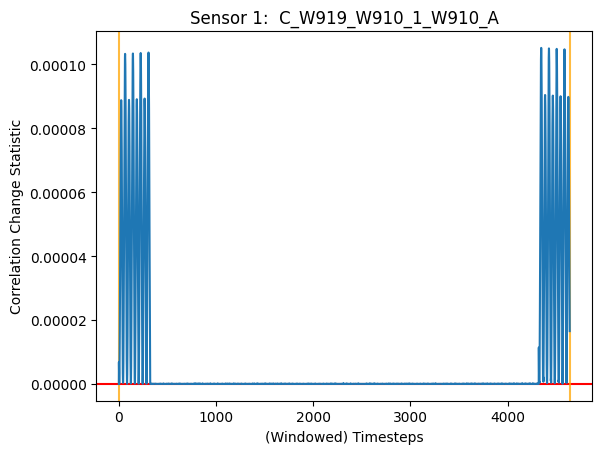

***********************************************************************************************
Sensor 2:  C_W919_W910_1_W910_B
DD = 4
39600 43919


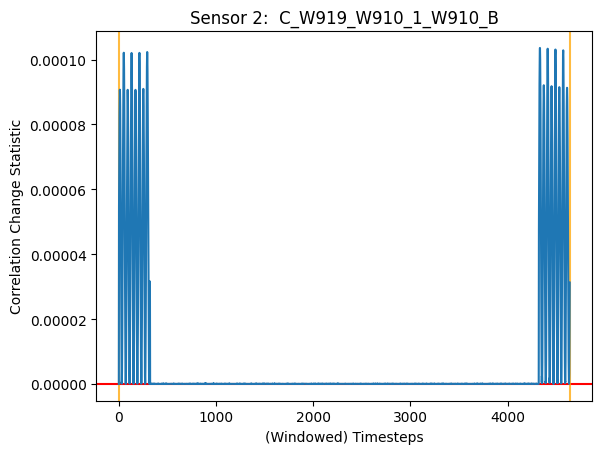

***********************************************************************************************
Sensor 3:  C_W919_W910_1_W910_C
DD = 4
17040 20399


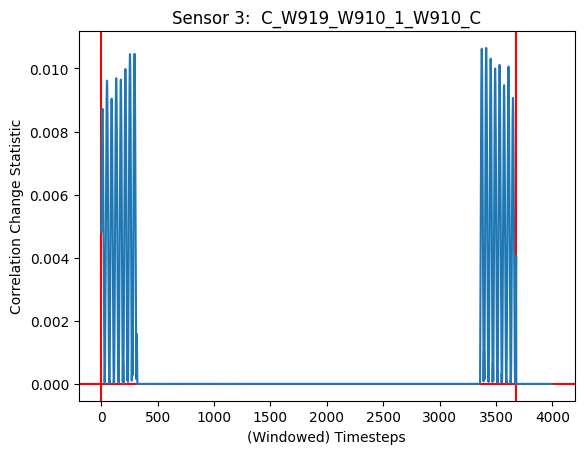

DD = 4
39600 43919


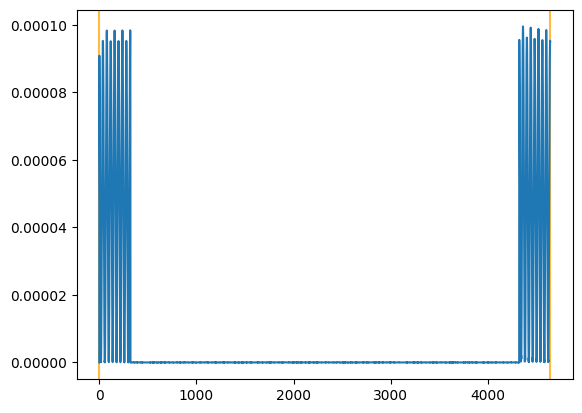

***********************************************************************************************
Sensor 4:  V_W-115KV2_AN
DD = 4
20400 27119


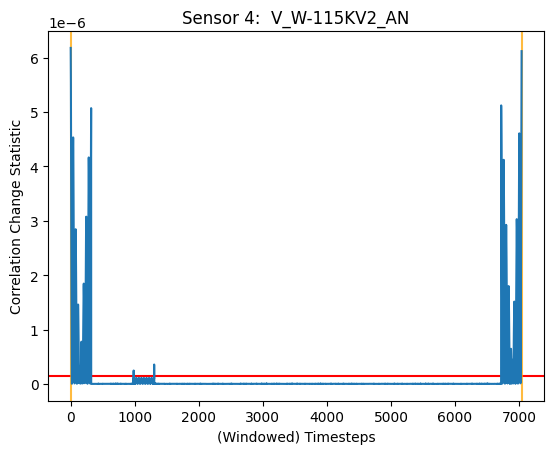

DD = 6
39600 43919


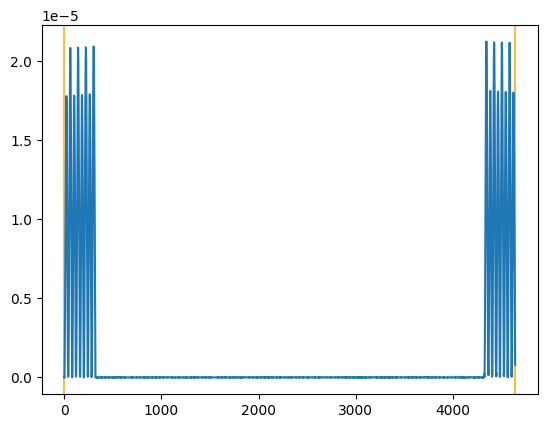

***********************************************************************************************
Sensor 5:  V_W-115KV2_BN
DD = 12
20400 27119


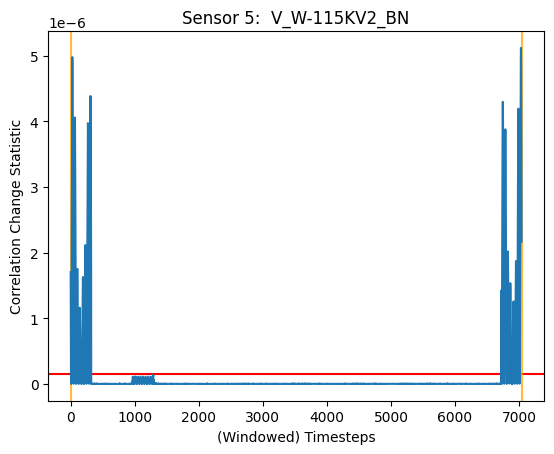

DD = 4
39600 43919


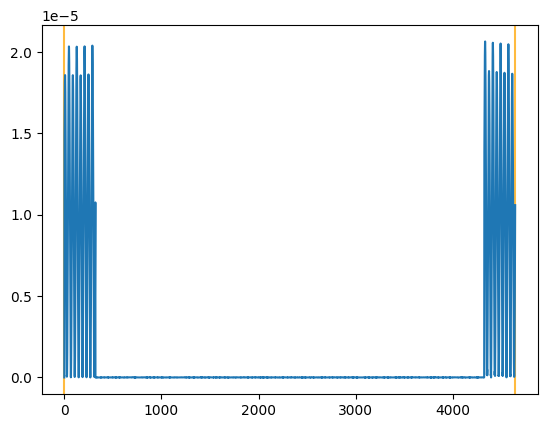

***********************************************************************************************
Sensor 6:  V_W-115KV2_CN
DD = 4
20400 27119


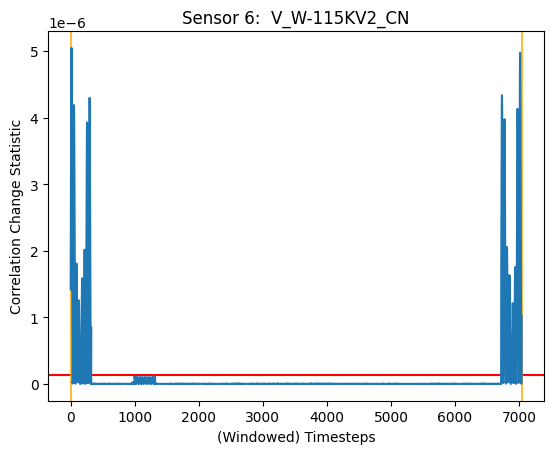

DD = 4
39600 43919


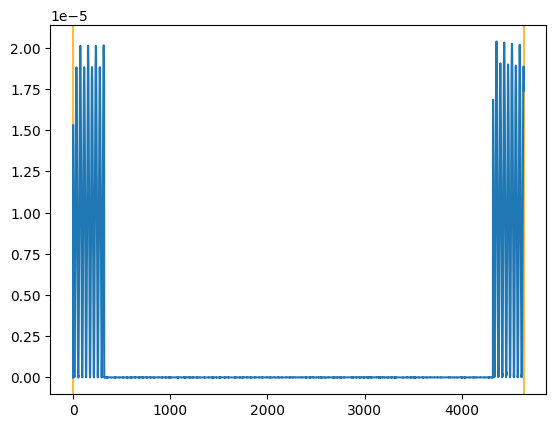

***********************************************************************************************
Sensor 7:  C_W957_W950_1_W950_A
DD = None
9360 15599


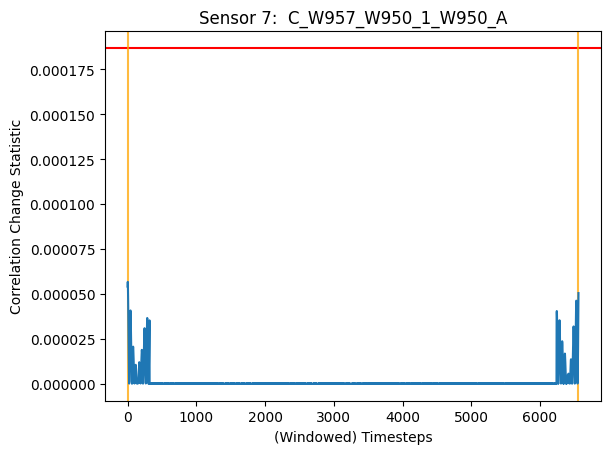

***********************************************************************************************
Sensor 8:  C_W957_W950_1_W950_B
DD = None
9360 15599


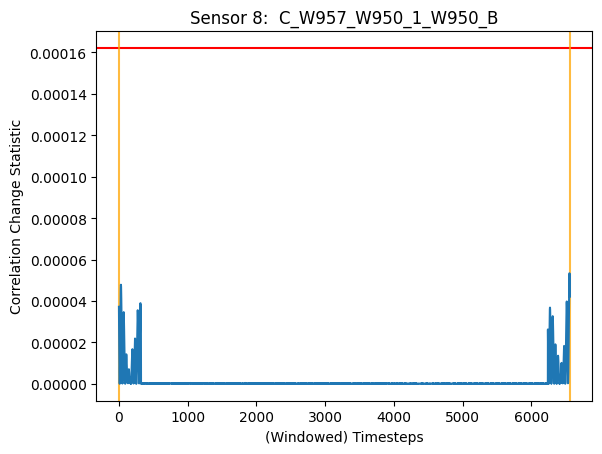

***********************************************************************************************
Sensor 9:  C_W957_W950_1_W950_C
DD = None
9360 15599


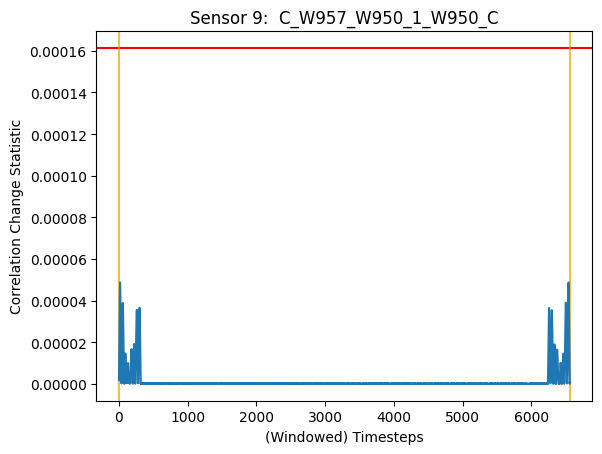

***********************************************************************************************
Sensor 10:  V_W951_AN
DD = None
20400 27119


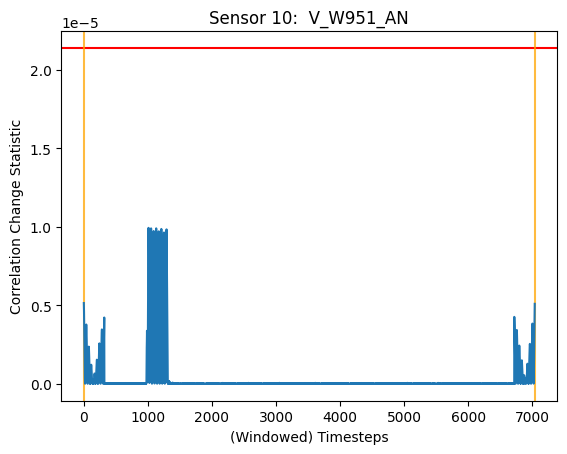

DD = None
39600 43919


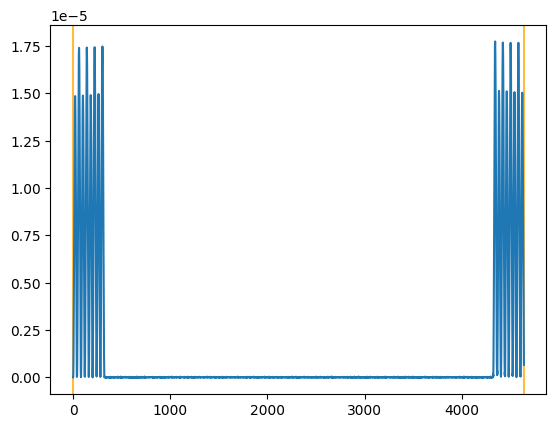

DD = None
49200 53999


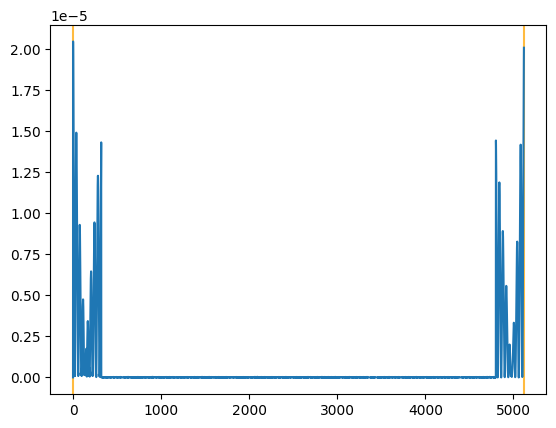

***********************************************************************************************
Sensor 11:  V_W951_BN
DD = None
20400 27119


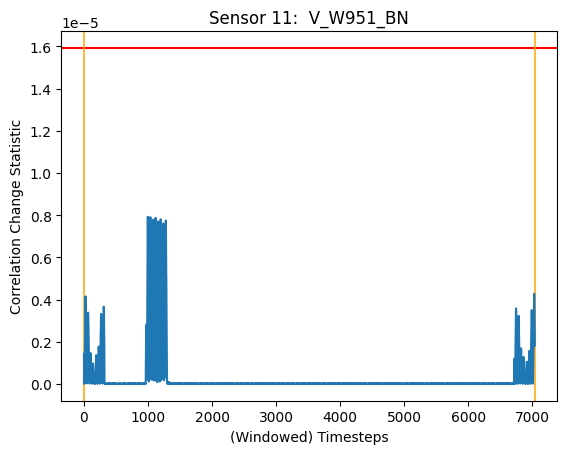

DD = 48
39600 43919


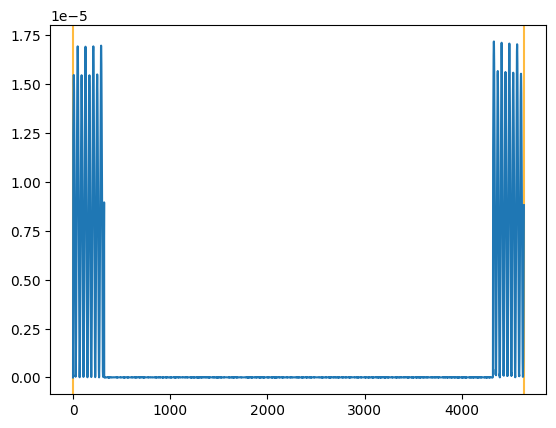

DD = 25
49200 53999


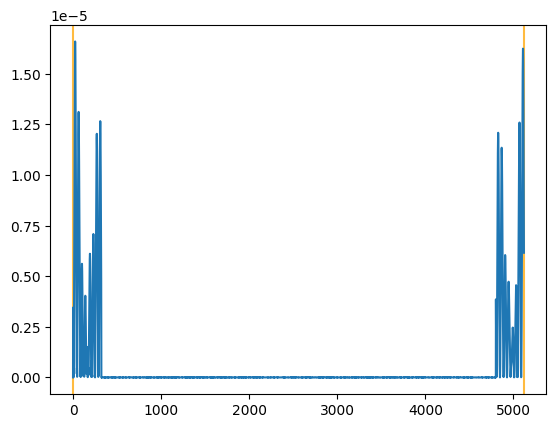

***********************************************************************************************
Sensor 12:  V_W951_CN
DD = None
20400 27119


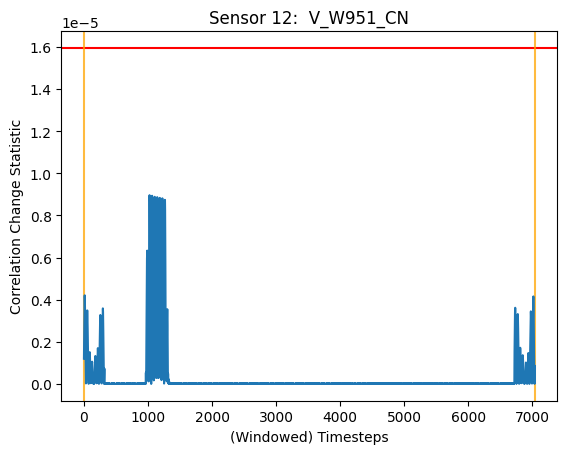

DD = 75
39600 43919


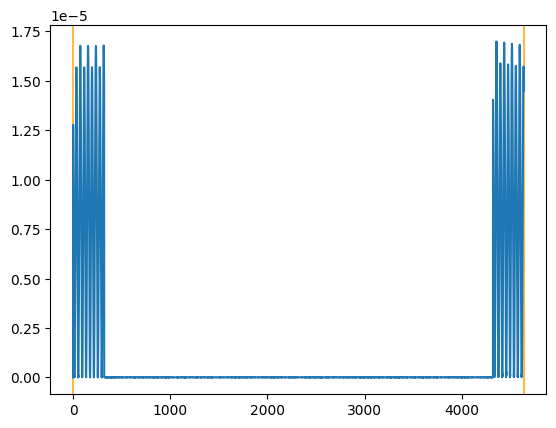

DD = 12
49200 53999


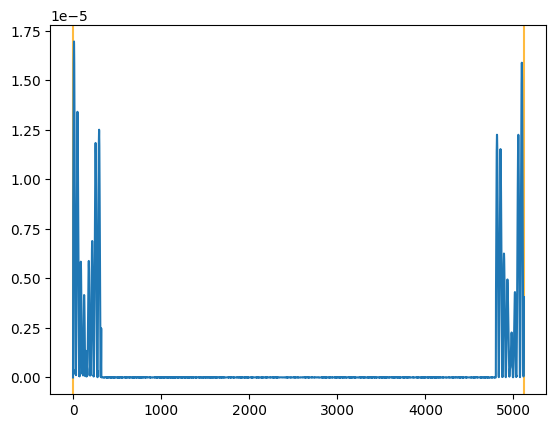

***********************************************************************************************
Sensor 13:  C_W957_W950_1_W957_A
DD = 10
9360 15599


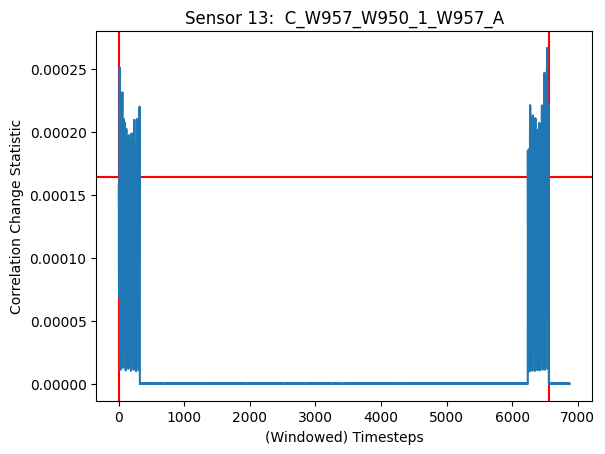

***********************************************************************************************
Sensor 14:  C_W957_W950_1_W957_B
DD = 4
9360 15599


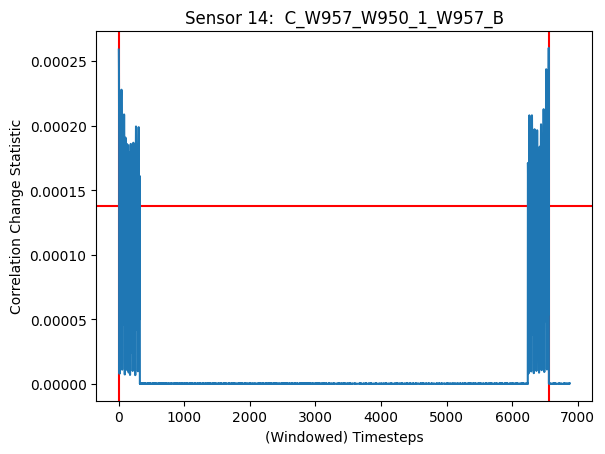

***********************************************************************************************
Sensor 15:  C_W957_W950_1_W957_C
DD = 6
9360 15599


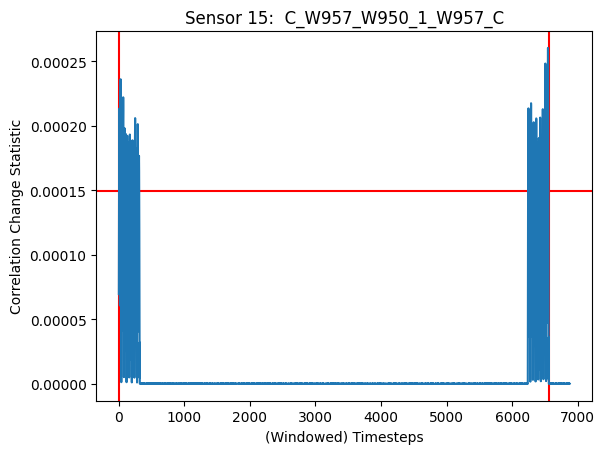

***********************************************************************************************
Sensor 16:  C_W927_W929_1_W929_A
***********************************************************************************************
Sensor 17:  C_W927_W929_1_W929_B
***********************************************************************************************
Sensor 18:  C_W927_W929_1_W929_C
***********************************************************************************************
Sensor 19:  V_W-115KV1_AN
DD = 4
20400 27119


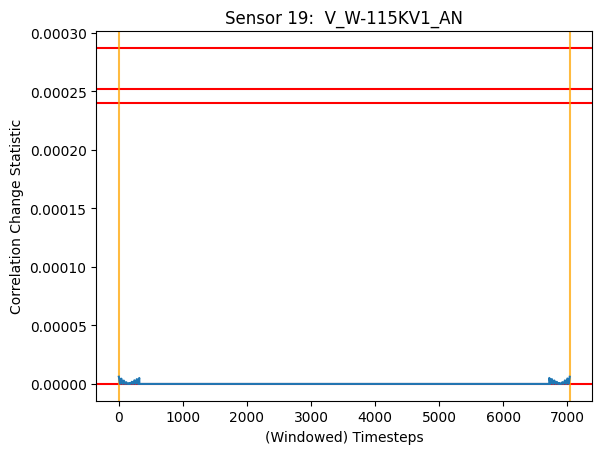

DD = 6
39600 43919


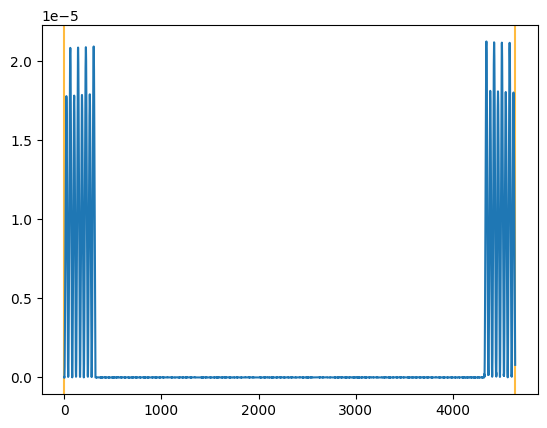

***********************************************************************************************
Sensor 20:  V_W-115KV1_BN
DD = 4
20400 27119


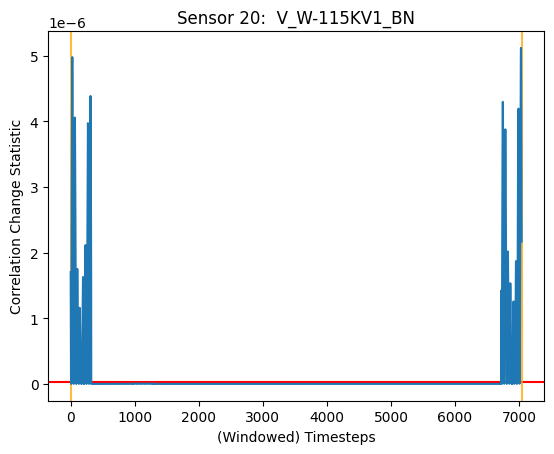

DD = 4
39600 43919


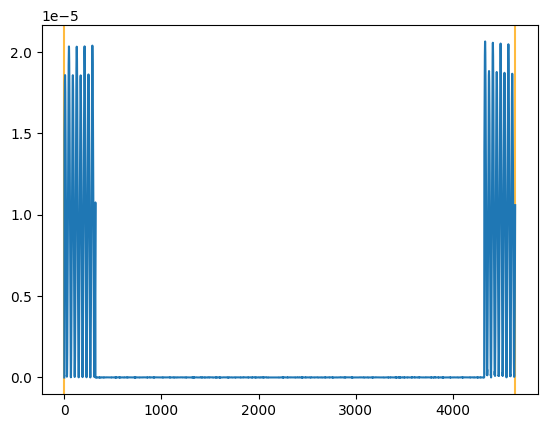

***********************************************************************************************
Sensor 21:  V_W-115KV1_CN
DD = 4
20400 27119


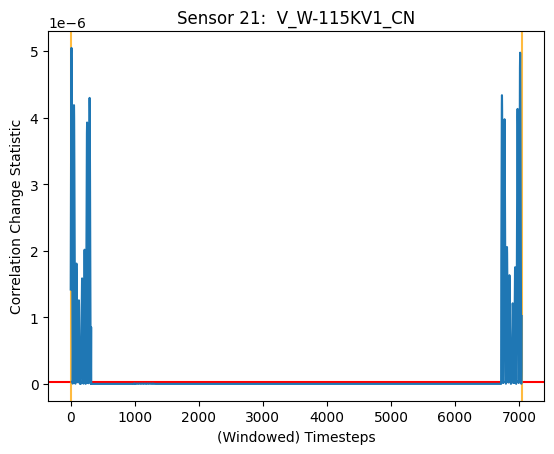

DD = 4
39600 43919


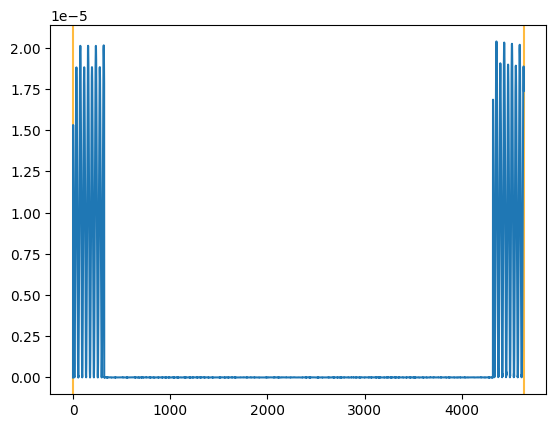

***********************************************************************************************
Sensor 22:  C_W927_W929_1_W927_A
***********************************************************************************************
Sensor 23:  C_W927_W929_1_W927_B
***********************************************************************************************
Sensor 24:  C_W927_W929_1_W927_C
***********************************************************************************************
Sensor 25:  C_W919_W910_1_W919_A
DD = 15
39600 43919


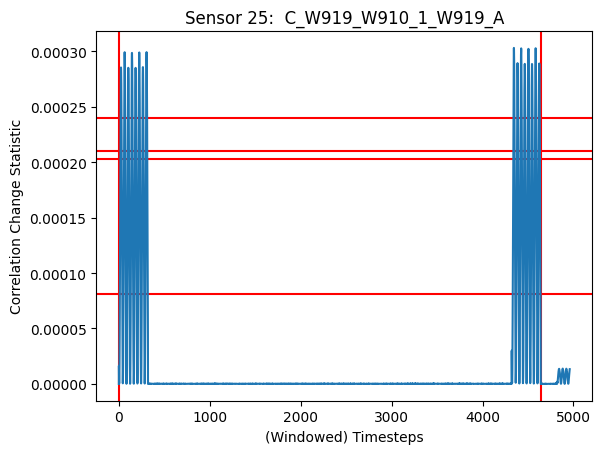

***********************************************************************************************
Sensor 26:  C_W919_W910_1_W919_B
DD = 4
39600 43919


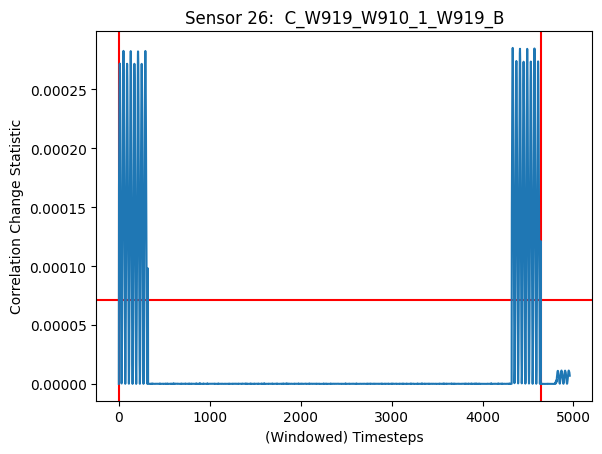

***********************************************************************************************
Sensor 27:  C_W919_W910_1_W919_C
DD = 4
17040 20399


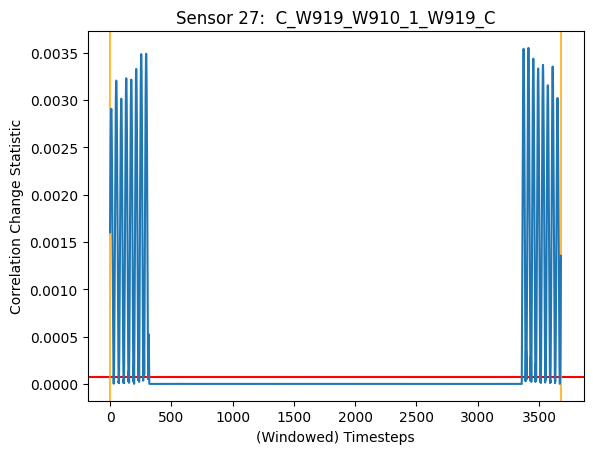

DD = 4
39600 43919


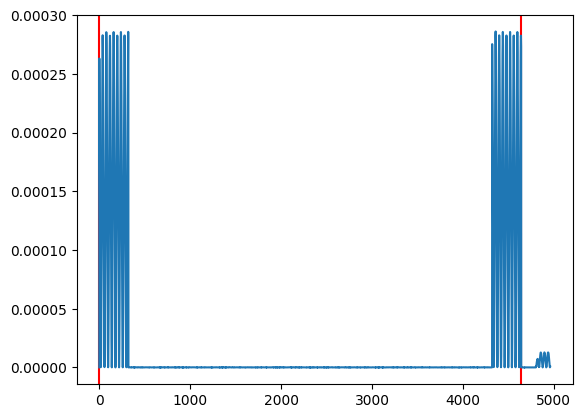

***********************************************************************************************
Sensor 28:  V_W911_AN
DD = None
20400 27119


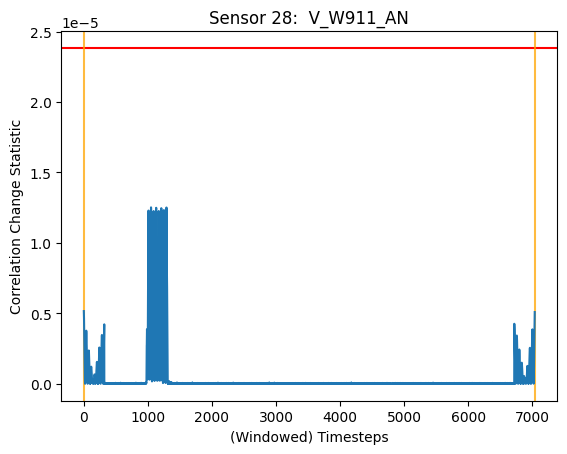

DD = 10
39600 43919


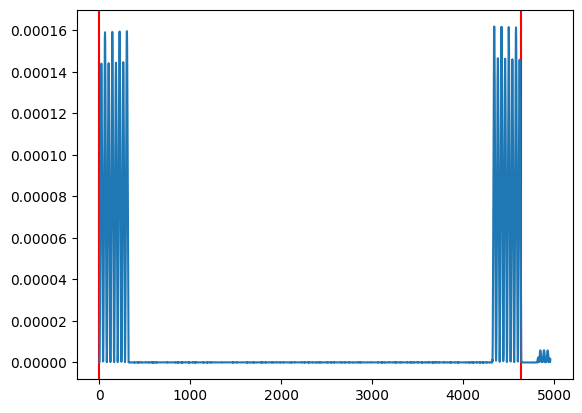

***********************************************************************************************
Sensor 29:  V_W911_BN
DD = None
20400 27119


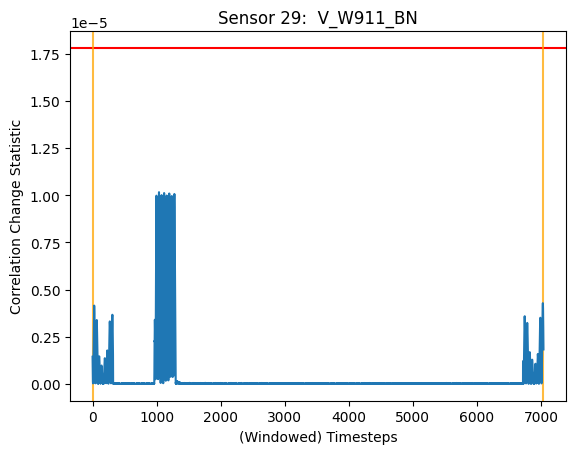

DD = 4
39600 43919


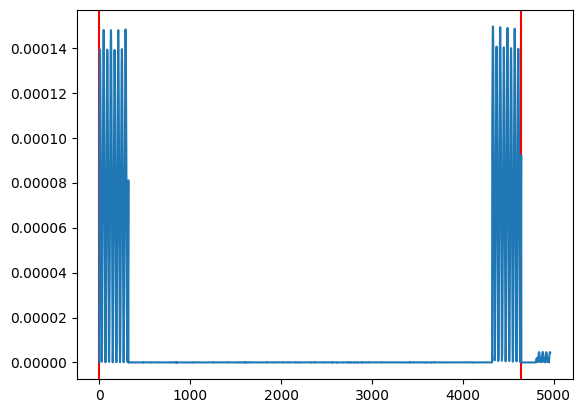

***********************************************************************************************
Sensor 30:  V_W911_CN
DD = None
20400 27119


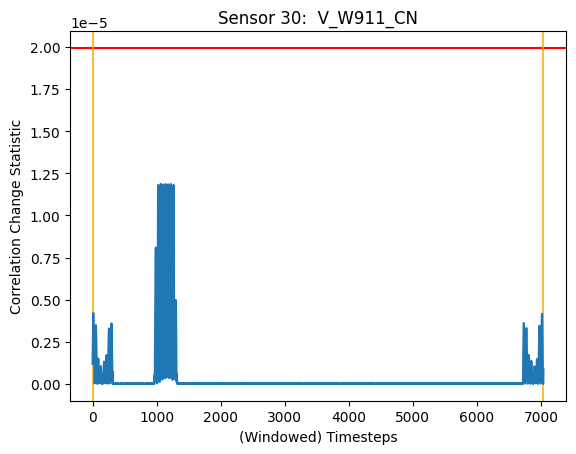

DD = 4
39600 43919


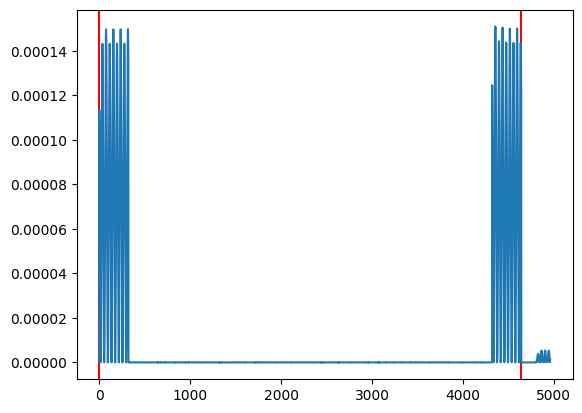

***********************************************************************************************
Sensor 31:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A
***********************************************************************************************
Sensor 32:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B
***********************************************************************************************
Sensor 33:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C
DD = None
28560 32879


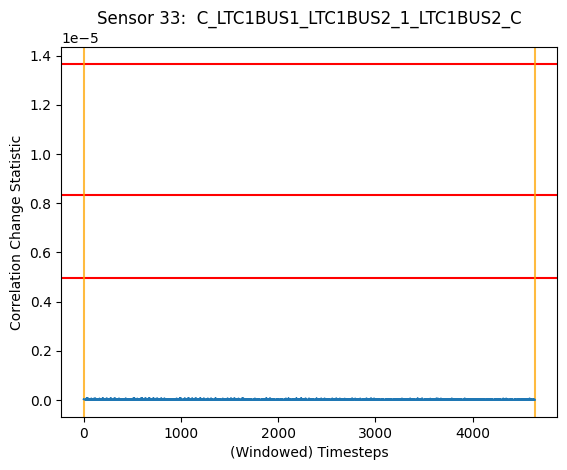

***********************************************************************************************
Sensor 34:  V_BUS13KV1_AN
DD = None
20400 27119


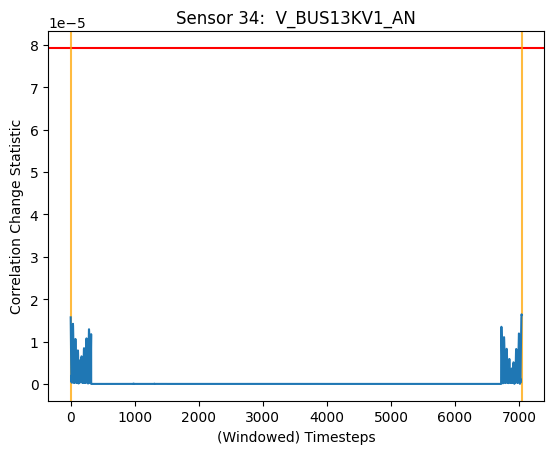

***********************************************************************************************
Sensor 35:  V_BUS13KV1_BN
DD = None
20400 27119


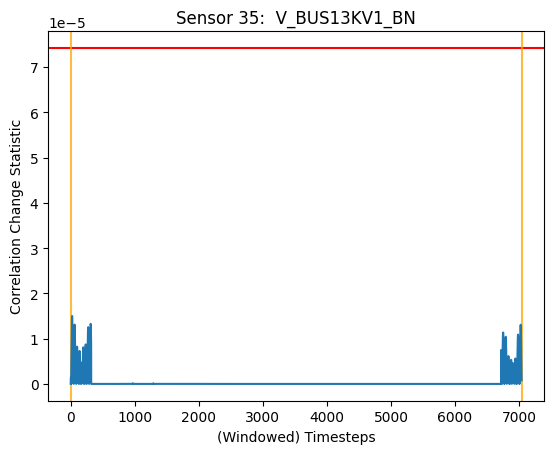

***********************************************************************************************
Sensor 36:  V_BUS13KV1_CN
DD = None
20400 27119


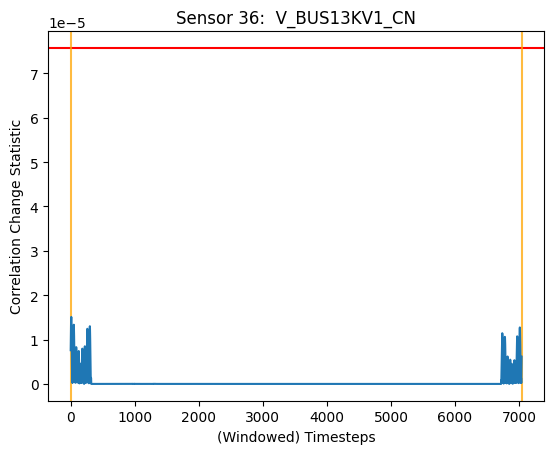

DD = 10
28560 32879


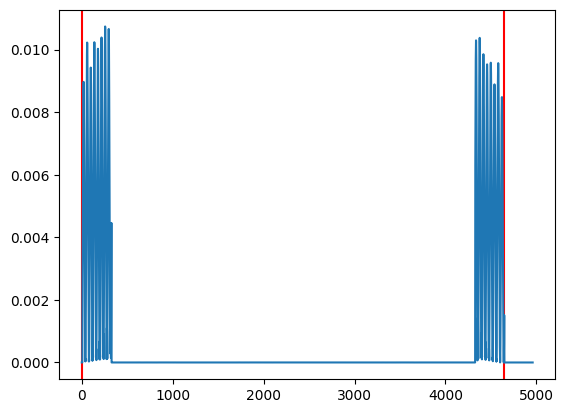

***********************************************************************************************
Sensor 37:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A
DD = 16
39600 43919


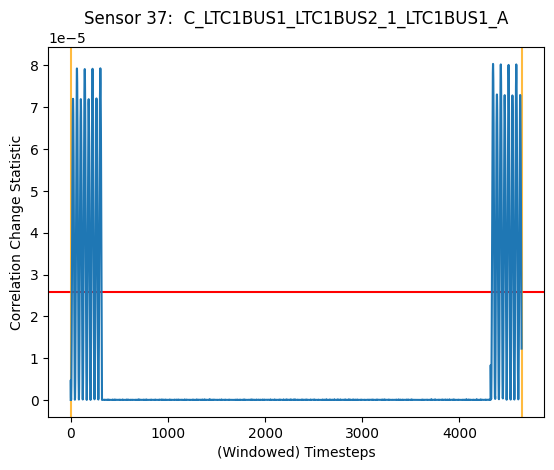

***********************************************************************************************
Sensor 38:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
DD = 4
39600 43919


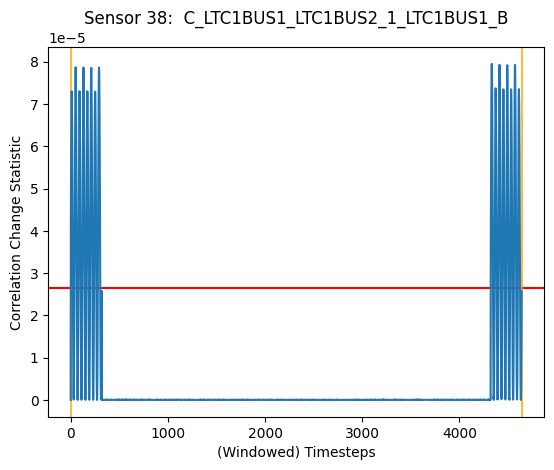

***********************************************************************************************
Sensor 39:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C
DD = 4
39600 43919


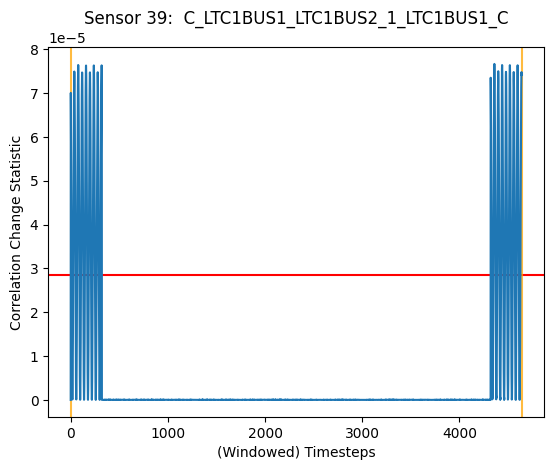

***********************************************************************************************
Sensor 40:  V_W9111_AN
DD = 4
20400 27119


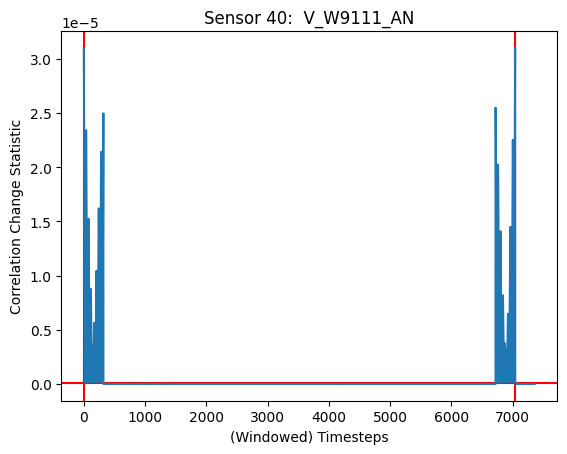

DD = 6
39600 43919


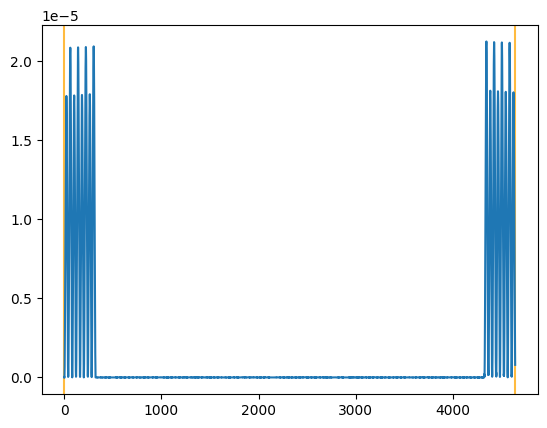

***********************************************************************************************
Sensor 41:  V_W9111_BN
DD = 4
20400 27119


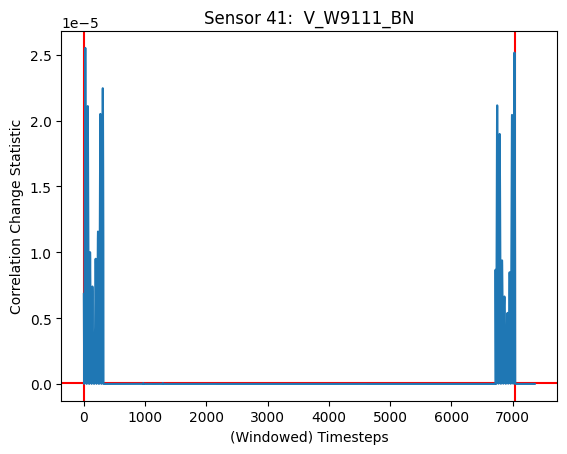

DD = 4
39600 43919


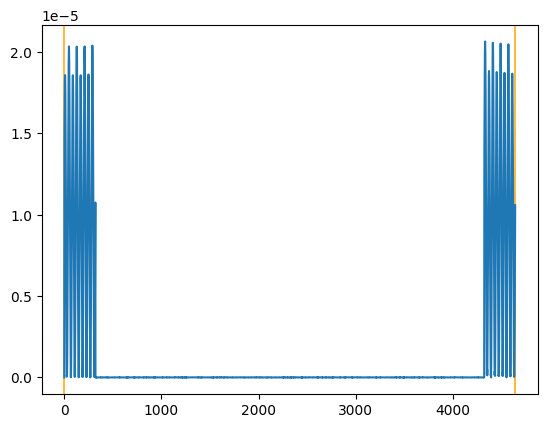

***********************************************************************************************
Sensor 42:  V_W9111_CN
DD = 4
20400 27119


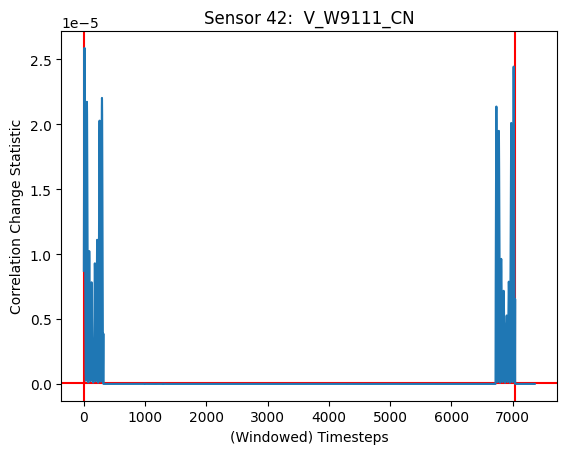

DD = 10
28560 32879


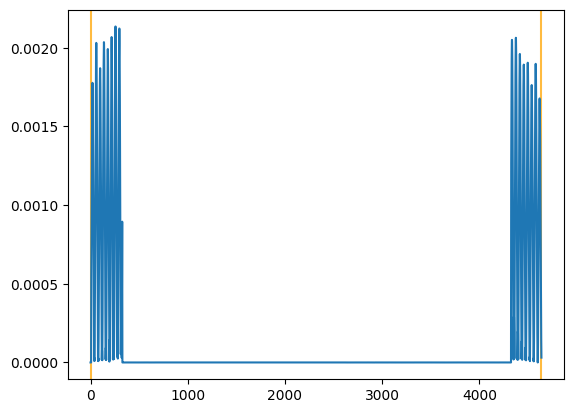

DD = 4
39600 43919


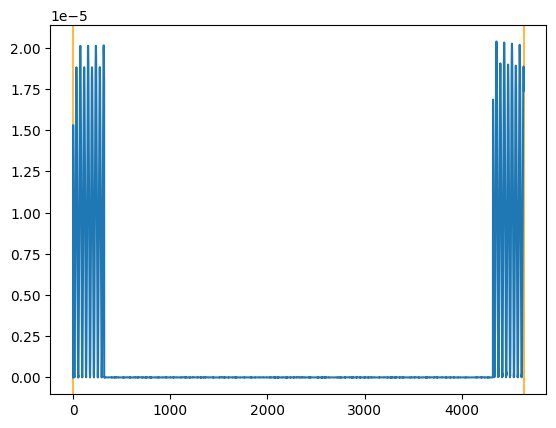

***********************************************************************************************
Sensor 43:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
***********************************************************************************************
Sensor 44:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
***********************************************************************************************
Sensor 45:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C
***********************************************************************************************
Sensor 46:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
DD = 16
78000 82799


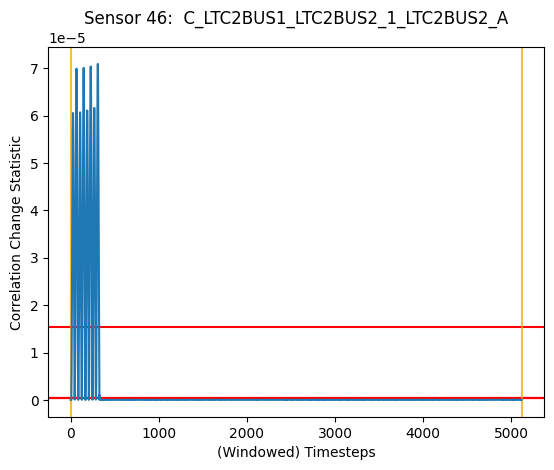

***********************************************************************************************
Sensor 47:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
DD = 11
78000 82799


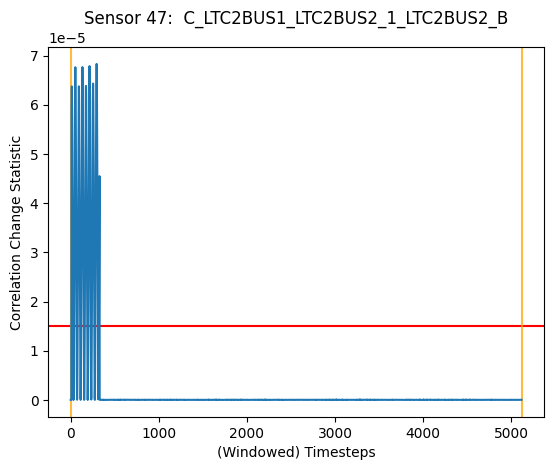

***********************************************************************************************
Sensor 48:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
DD = 11
78000 82799


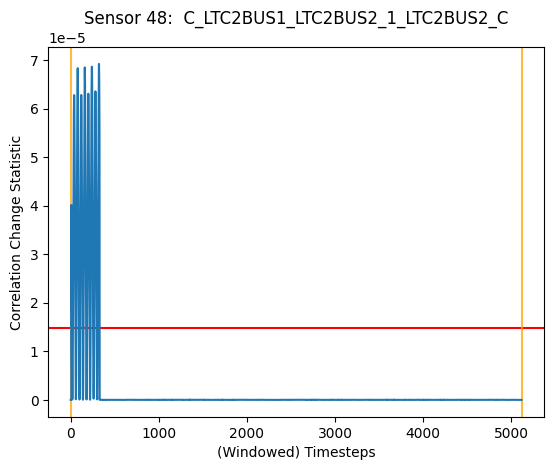

***********************************************************************************************
Sensor 49:  V_BUS13KV2_AN
DD = 11
78000 82799


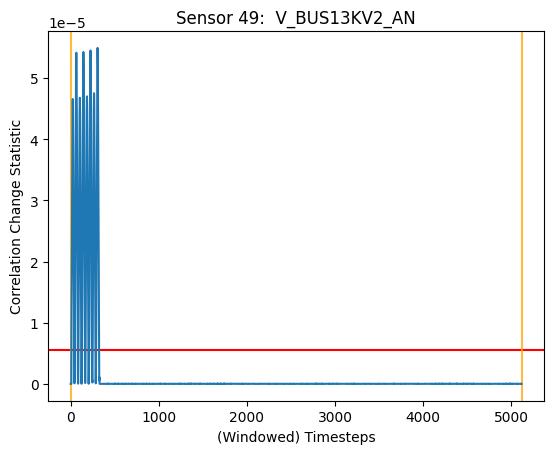

***********************************************************************************************
Sensor 50:  V_BUS13KV2_BN
DD = 11
78000 82799


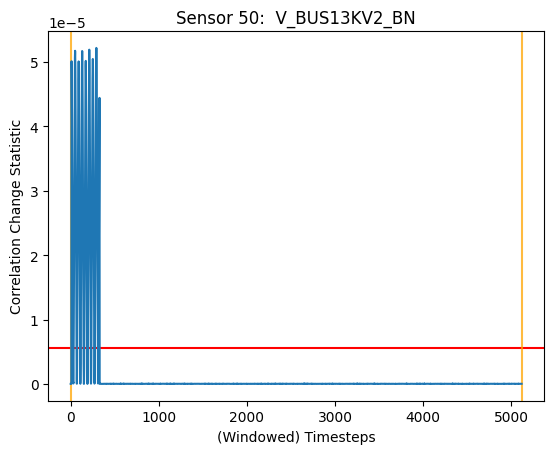

***********************************************************************************************
Sensor 51:  V_BUS13KV2_CN
DD = 11
78000 82799


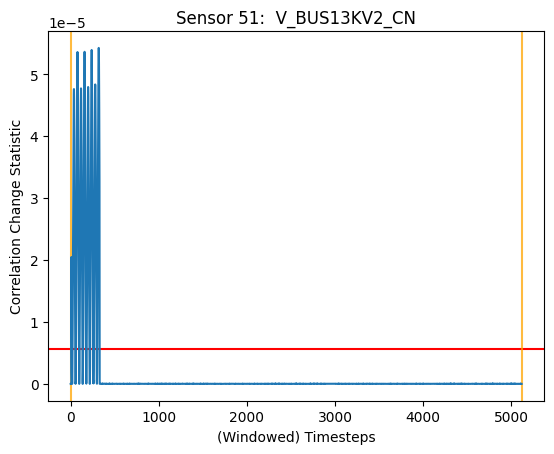

***********************************************************************************************
Sensor 52:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_A
DD = None
39600 43919


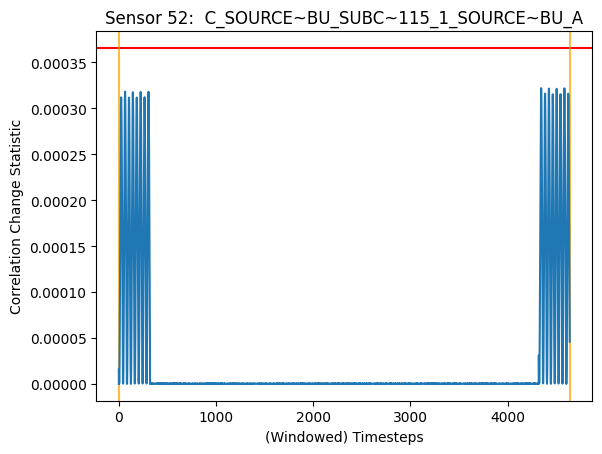

***********************************************************************************************
Sensor 53:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_B
DD = None
39600 43919


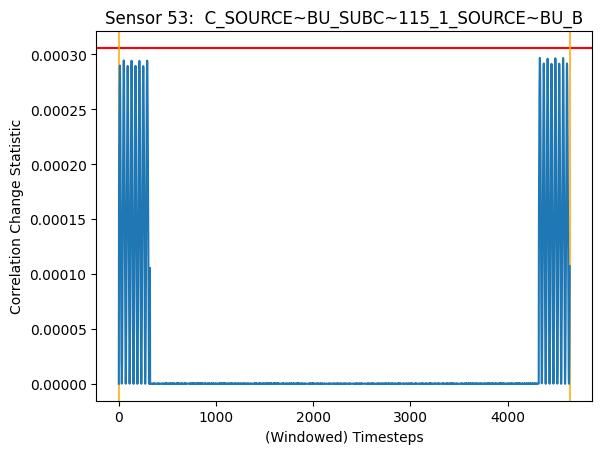

***********************************************************************************************
Sensor 54:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_C
DD = None
39600 43919


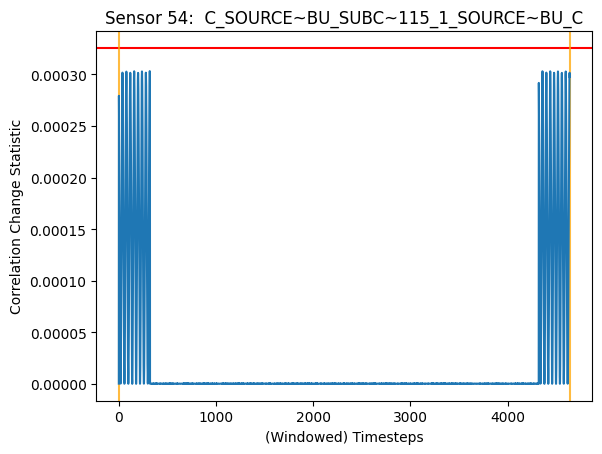

***********************************************************************************************
Sensor 55:  V_SOURCE-BU_AN
DD = 4
39600 43919


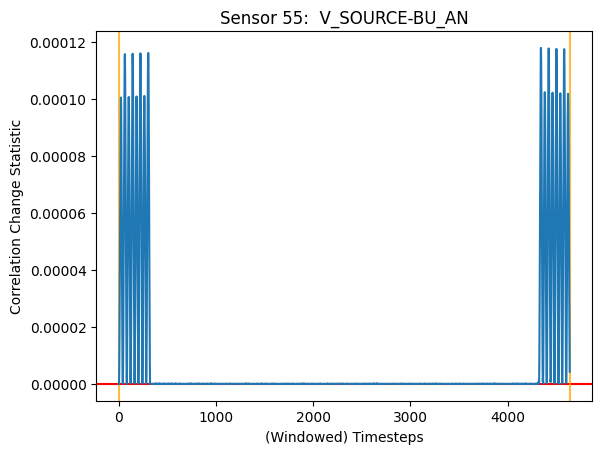

***********************************************************************************************
Sensor 56:  V_SOURCE-BU_BN
DD = 4
39600 43919


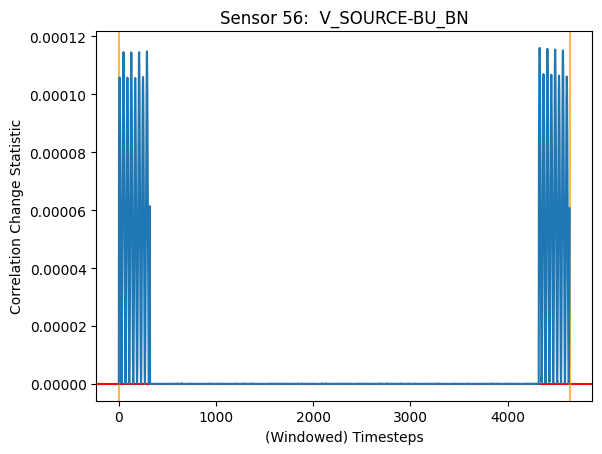

***********************************************************************************************
Sensor 57:  V_SOURCE-BU_CN
DD = 4
39600 43919


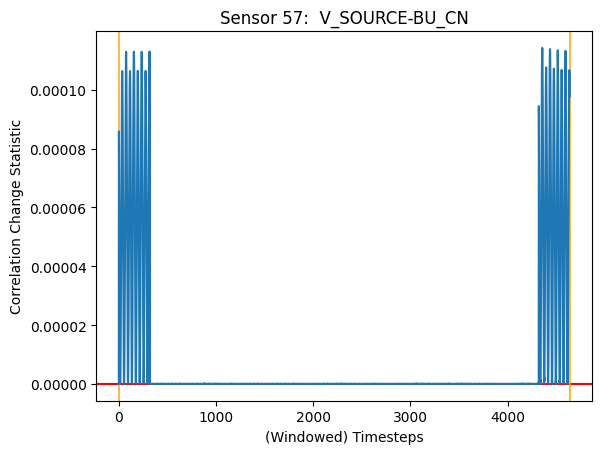

***********************************************************************************************
Sensor 58:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_A
DD = None
9360 15599


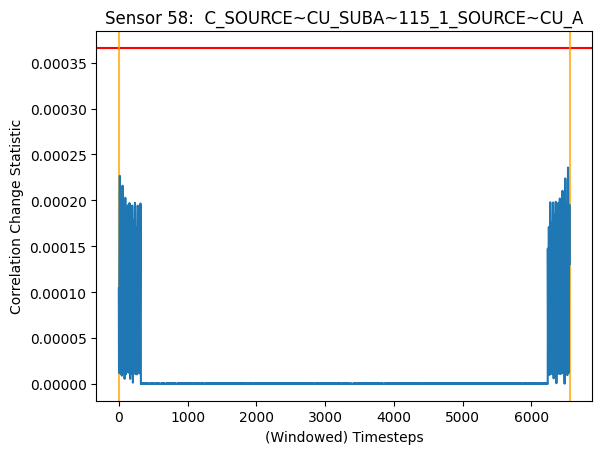

***********************************************************************************************
Sensor 59:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_B
DD = None
9360 15599


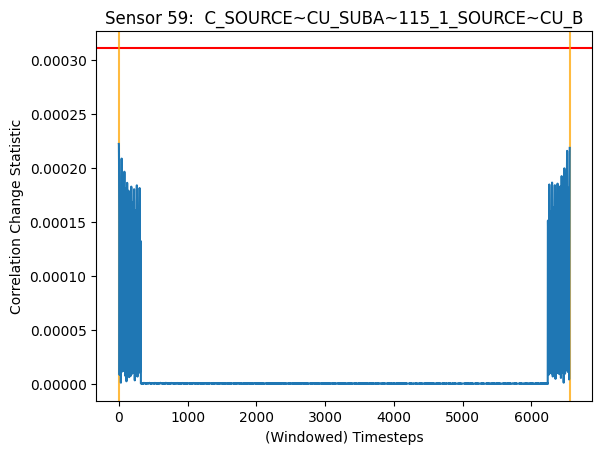

***********************************************************************************************
Sensor 60:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_C
DD = None
9360 15599


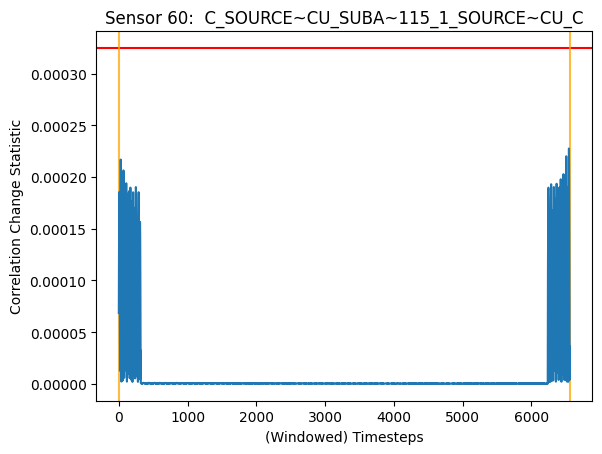

***********************************************************************************************
Sensor 61:  V_SOURCE-CU_AN
***********************************************************************************************
Sensor 62:  V_SOURCE-CU_BN
***********************************************************************************************
Sensor 63:  V_SOURCE-CU_CN
***********************************************************************************************
Sensor 64:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_A
***********************************************************************************************
Sensor 65:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_B
***********************************************************************************************
Sensor 66:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_C
***********************************************************************************************
Sensor 67:  V_SOURCE-FA_AN
DD = 4
49200 53999


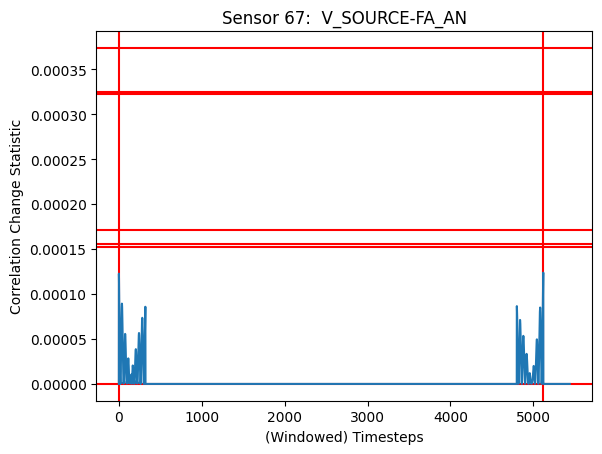

***********************************************************************************************
Sensor 68:  V_SOURCE-FA_BN
DD = 4
49200 53999


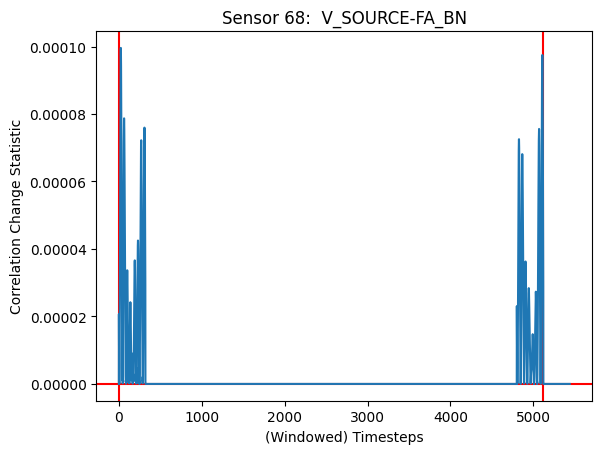

***********************************************************************************************
Sensor 69:  V_SOURCE-FA_CN
DD = 4
49200 53999


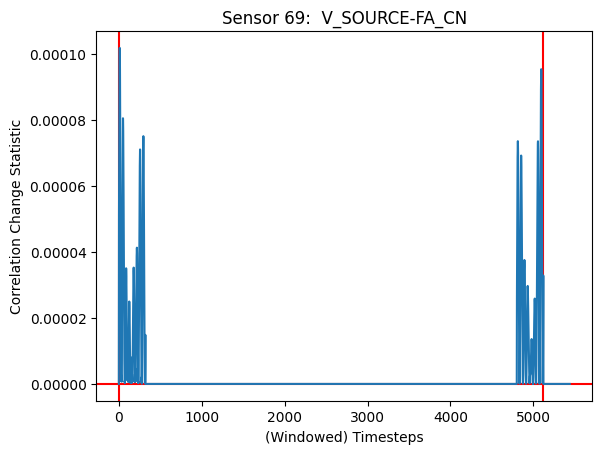

***********************************************************************************************
Sensor 70:  C_W738_W737_2_W737_A
***********************************************************************************************
Sensor 71:  C_W738_W737_2_W737_B
***********************************************************************************************
Sensor 72:  C_W738_W737_2_W737_C
***********************************************************************************************
Sensor 73:  V_W738_AN
***********************************************************************************************
Sensor 74:  V_W738_BN
***********************************************************************************************
Sensor 75:  V_W738_CN
***********************************************************************************************
Sensor 76:  C_W747_W748_2_W747_A
DD = None
54960 59759


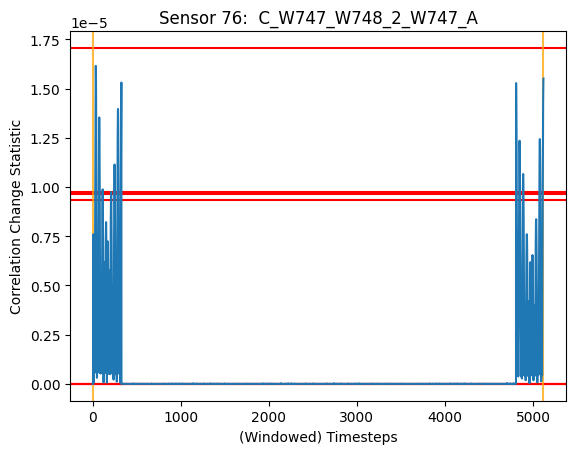

***********************************************************************************************
Sensor 77:  C_W747_W748_2_W747_B
DD = None
54960 59759


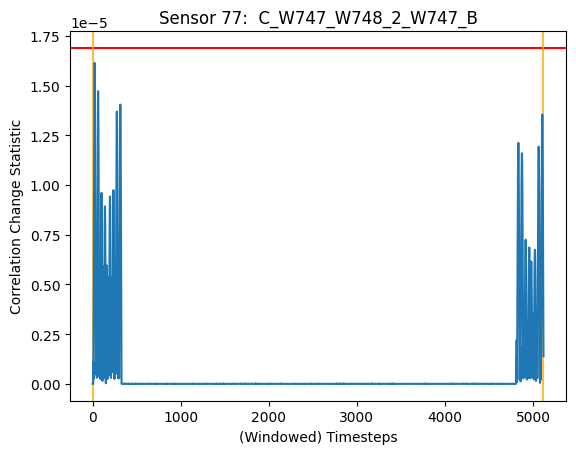

***********************************************************************************************
Sensor 78:  C_W747_W748_2_W747_C
DD = None
54960 59759


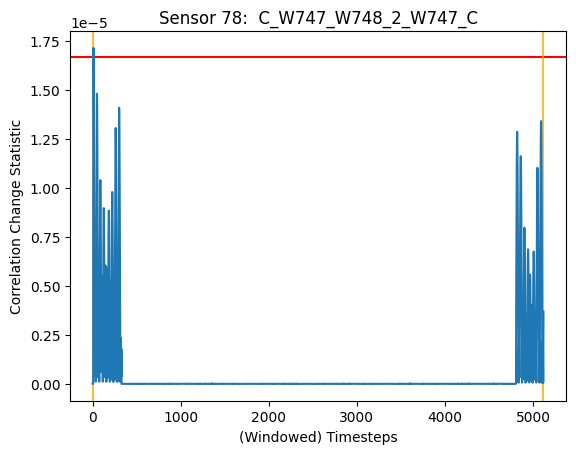

***********************************************************************************************
Sensor 79:  V_W748_AN
***********************************************************************************************
Sensor 80:  V_W748_BN
***********************************************************************************************
Sensor 81:  V_W748_CN
***********************************************************************************************
Sensor 82:  C_W787_W788_2_W787_A
DD = 13
78000 82799


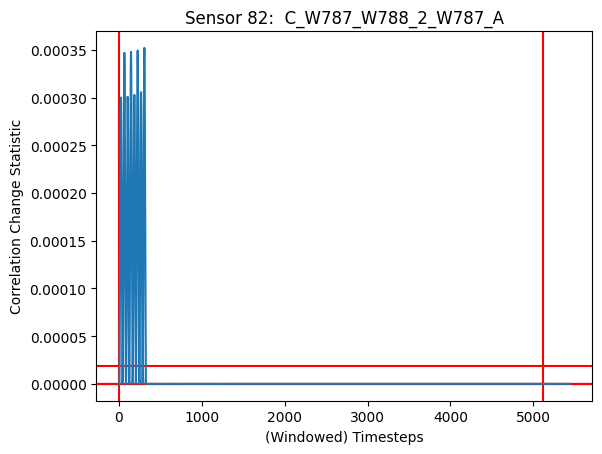

***********************************************************************************************
Sensor 83:  C_W787_W788_2_W787_B
DD = 11
78000 82799


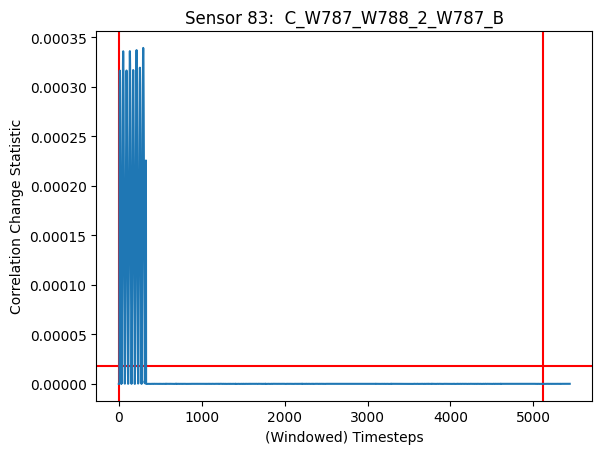

***********************************************************************************************
Sensor 84:  C_W787_W788_2_W787_C
DD = 11
78000 82799


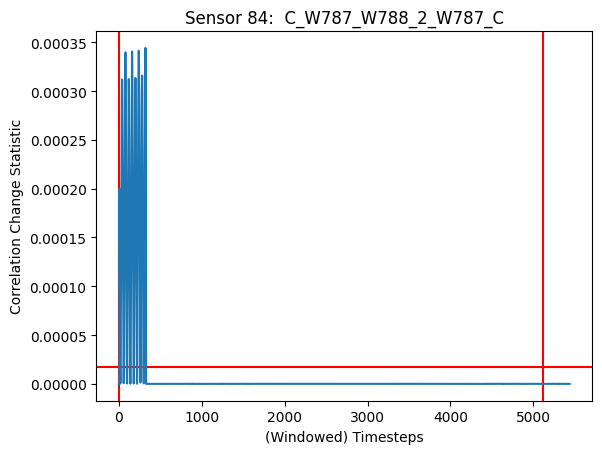

***********************************************************************************************
Sensor 85:  V_W788_AN
DD = 11
78000 82799


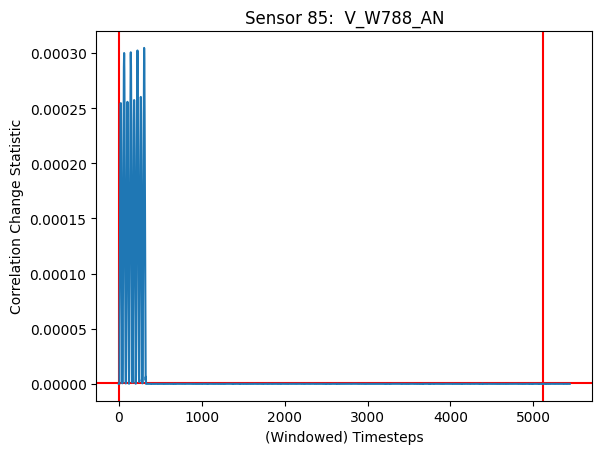

***********************************************************************************************
Sensor 86:  V_W788_BN
DD = 11
78000 82799


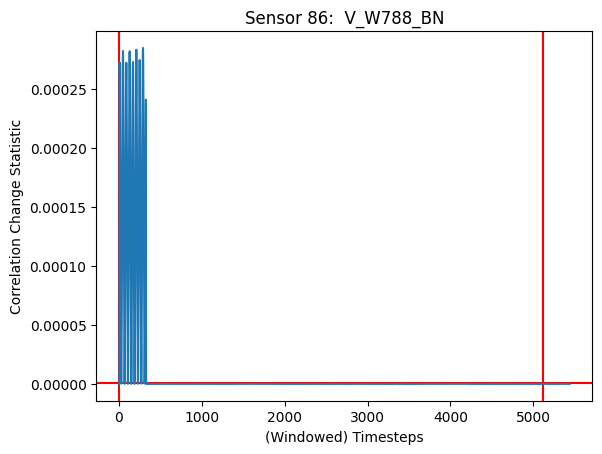

***********************************************************************************************
Sensor 87:  V_W788_CN
DD = 11
78000 82799


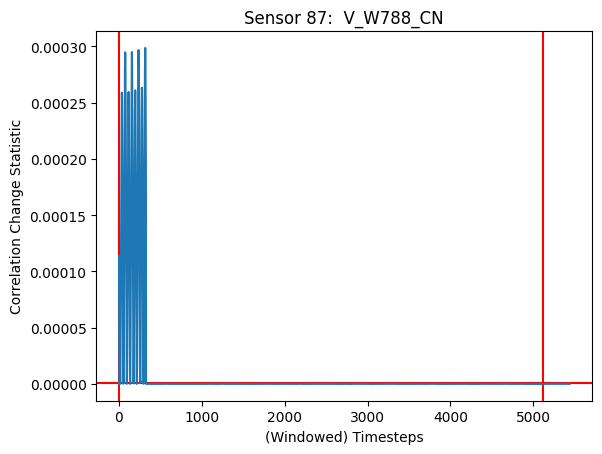

***********************************************************************************************
Sensor 88:  C_W797_W798_2_W797_A
***********************************************************************************************
Sensor 89:  C_W797_W798_2_W797_B
***********************************************************************************************
Sensor 90:  C_W797_W798_2_W797_C
***********************************************************************************************
Sensor 91:  V_W798_AN
***********************************************************************************************
Sensor 92:  V_W798_BN
***********************************************************************************************
Sensor 93:  V_W798_CN
***********************************************************************************************
Sensor 94:  C_FD2B2_FD2B1_1_FD2B1_A
DD = 31
54960 59759


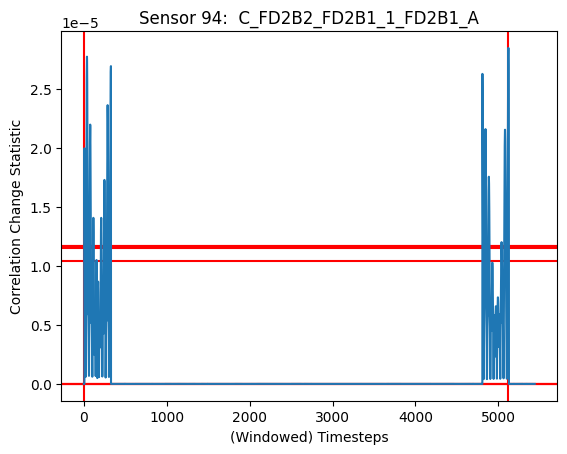

***********************************************************************************************
Sensor 95:  C_FD2B2_FD2B1_1_FD2B1_B
DD = 18
54960 59759


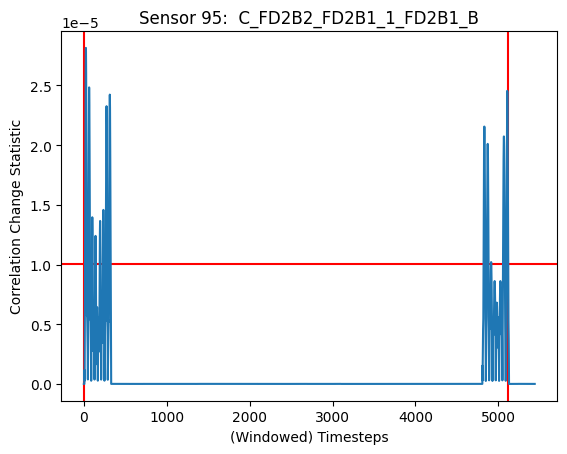

***********************************************************************************************
Sensor 96:  C_FD2B2_FD2B1_1_FD2B1_C
DD = 11
54960 59759


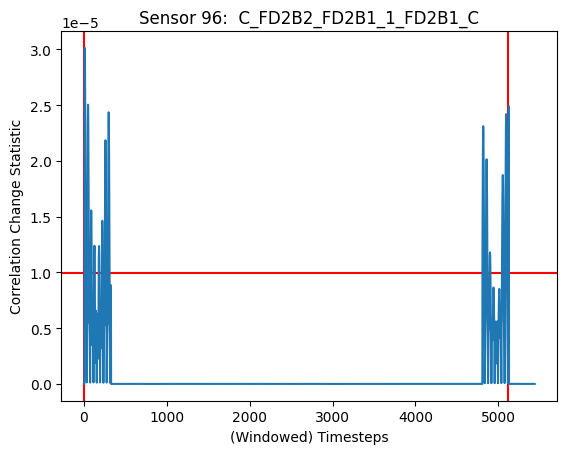

DD = 11
68880 74639


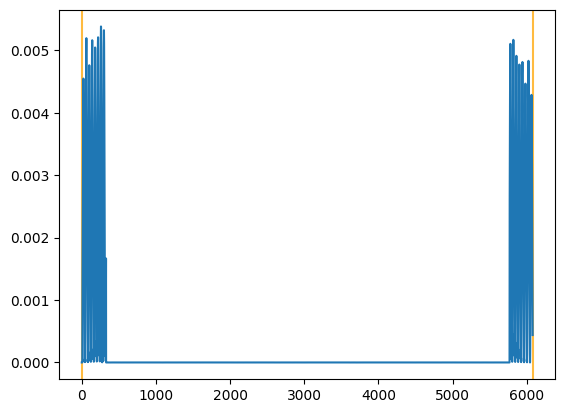

***********************************************************************************************
Sensor 97:  V_FD2B1_AN
***********************************************************************************************
Sensor 98:  V_FD2B1_BN
***********************************************************************************************
Sensor 99:  V_FD2B1_CN
***********************************************************************************************
Sensor 100:  C_FD2B5_FD2B6_1_FD2B5_A
DD = 11
54960 59759


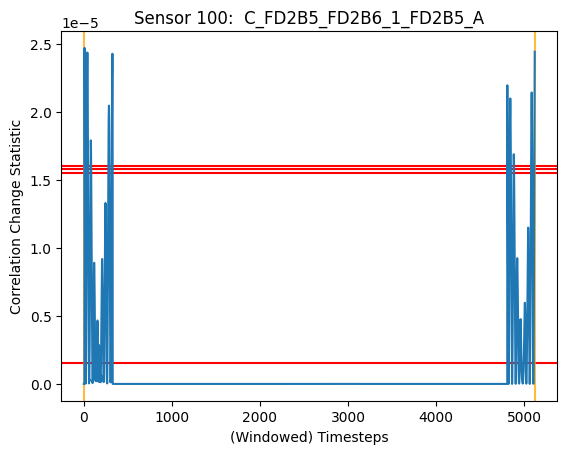

***********************************************************************************************
Sensor 101:  C_FD2B5_FD2B6_1_FD2B5_B
DD = 15
54960 59759


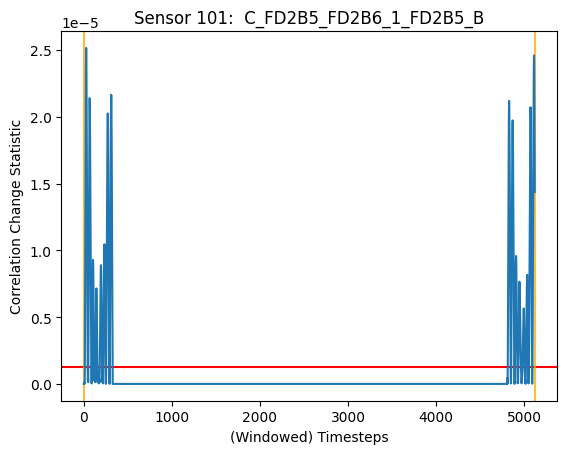

***********************************************************************************************
Sensor 102:  C_FD2B5_FD2B6_1_FD2B5_C
DD = 11
54960 59759


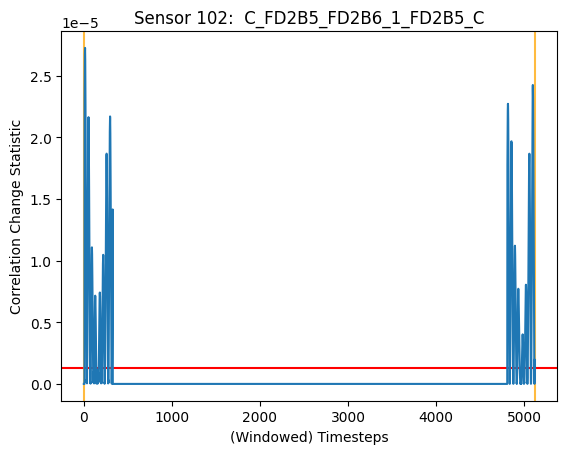

DD = 11
68880 74639


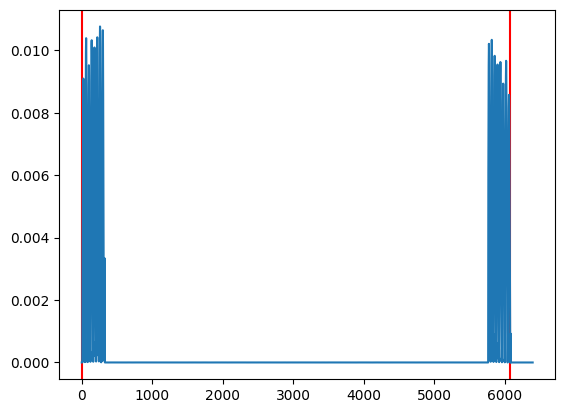

***********************************************************************************************
Sensor 103:  V_FD2B5_AN
***********************************************************************************************
Sensor 104:  V_FD2B5_BN
***********************************************************************************************
Sensor 105:  V_FD2B5_CN
***********************************************************************************************
Sensor 106:  C_FD3B4_FD3B5_1_FD3B4_A
DD = 12
78000 82799


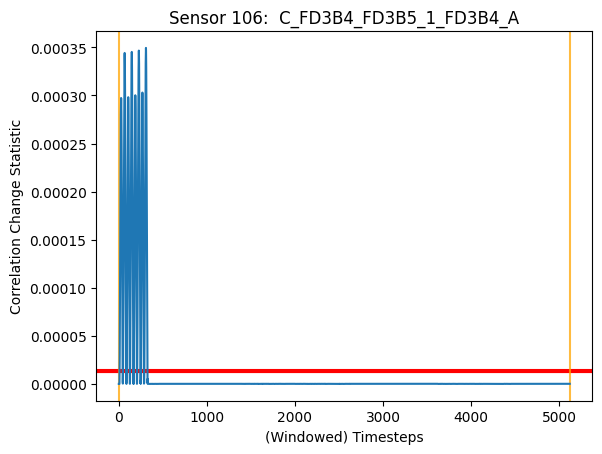

***********************************************************************************************
Sensor 107:  C_FD3B4_FD3B5_1_FD3B4_B
DD = 11
78000 82799


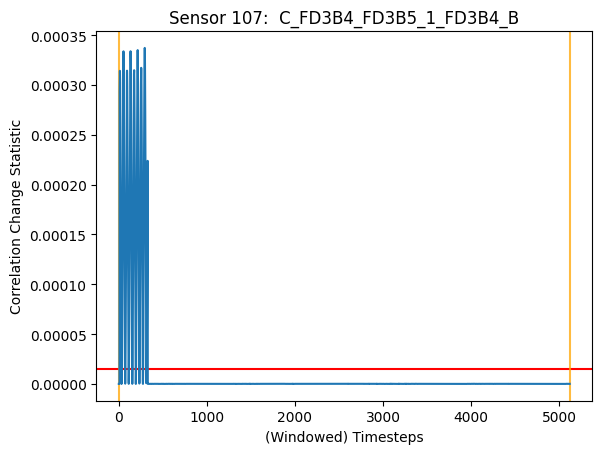

***********************************************************************************************
Sensor 108:  C_FD3B4_FD3B5_1_FD3B4_C
DD = 11
78000 82799


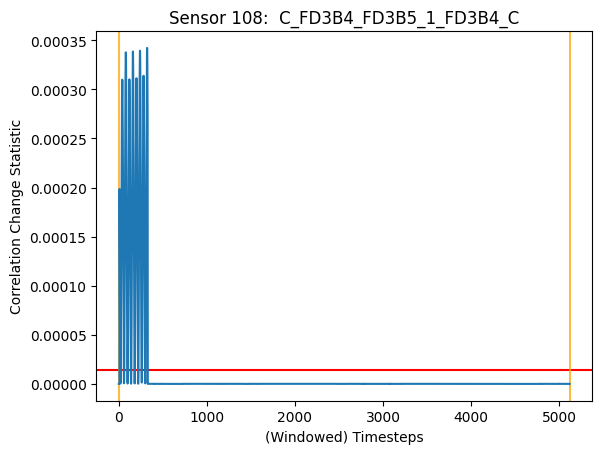

***********************************************************************************************
Sensor 109:  V_FD3B4_AN
DD = 11
78000 82799


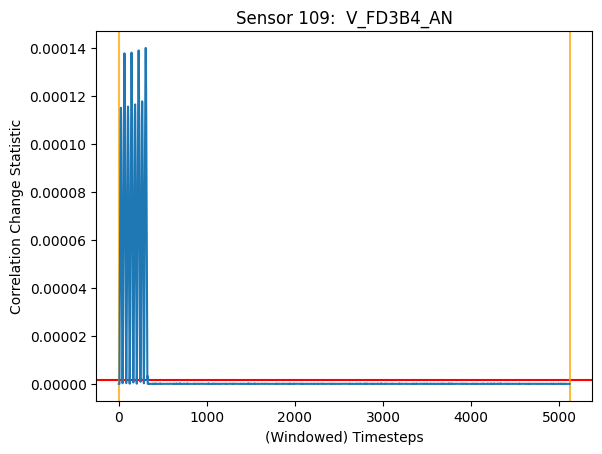

***********************************************************************************************
Sensor 110:  V_FD3B4_BN
DD = 11
78000 82799


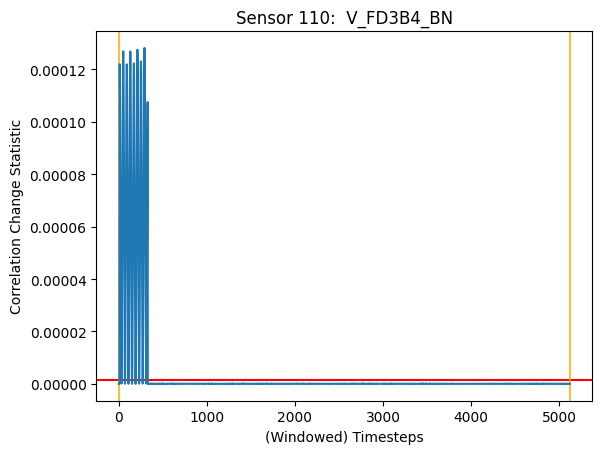

***********************************************************************************************
Sensor 111:  V_FD3B4_CN
DD = 11
78000 82799


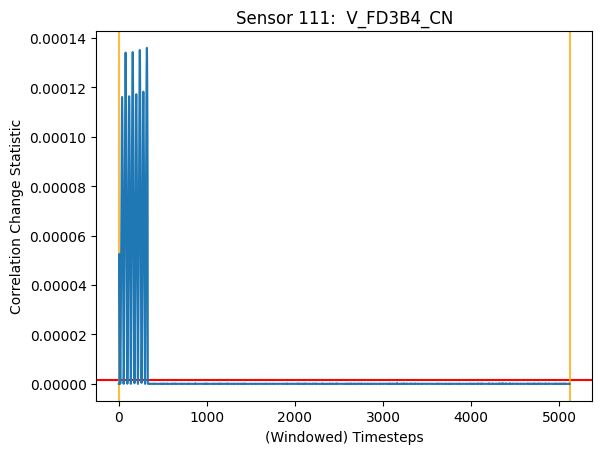

[4, 4, 4, 4, 4, 6, 12, 4, 4, 4, None, None, None, None, None, None, None, 48, 25, None, 75, 12, 10, 4, 6, 4, 6, 4, 4, 4, 4, 15, 4, 4, 4, None, 10, None, 4, None, 4, None, None, None, None, 10, 16, 4, 4, 4, 6, 4, 4, 4, 10, 4, 16, 11, 11, 11, 11, 11, None, None, None, 4, 4, 4, None, None, None, 4, 4, 4, None, None, None, 13, 11, 11, 11, 11, 11, 31, 18, 11, 11, 11, 15, 11, 11, 12, 11, 11, 11, 11, 11]


In [ ]:
LD_corr = []
at_neighbor = {}

rsum_list = rsum_list_corr
threshold = thresholds_corr_99
t_list = t_corr
persistency = 5

classified = []
lables = []

for index, i in enumerate(rsum_list):
    print("***********************************************************************************************")
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))

    print(f"Sensor {things[index]}: {cols[things[index]-1]}")
    at_neighbor[things[index]] = attack_in
    plt.title(f"Sensor {things[index]}: {cols[things[index]-1]}")
    plt.xlabel("(Windowed) Timesteps")
    plt.ylabel("Correlation Change Statistic")

    # for t in t_list:
    #     plt.axhline(t[index], color='orange')

    plt.axhline(threshold[index], color='red')

    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
            (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201
        co = 0
        for start, end in sorted(list(all_attack_indices)):

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                LD_corr.append(DD)
                print(f"DD = {DD}")
                start_w = start-window-w
                end_w = end+window+w-1
                print(start,end)
                plt.axvline(0, color='red')
                plt.axvline(end_w-start, color='red')
                plt.plot(i[start_w:end_w])
                plt.show()
                classified += [i[start_w:start_w+500]]
                lables += [co]
            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                # plt.axvline(start_w, color='pink', alpha=0.75)
                # plt.axvline(end_w, color='pink', alpha=0.75)

                start_w = start-window-w
                end_w = end+window+w-1
                for starts, ate in attack_i.items():
                  if starts == start and things[index] in ate:
                    DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                    LD_corr.append(DD)
                    print(f"DD = {DD}")
                    print(start,end)
                    plt.axvline(0, color='orange', alpha=0.75)
                    plt.axvline(end_w-start, color='orange', alpha=0.75)
                    plt.plot(i[start_w:end])
                    plt.show()
                    classified += [i[start_w:start_w+500]]
                    lables += [co]
            co += 1
    else:
         count = 0
         for start, end in sorted(list(all_attack_indices)):
            start_w = start-window-w
            end_w = end+window+w-1
            # plt.axvline(start_w, color='pink', alpha=0.75)
            # plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
                if starts == start:
                    if things[index] in ate:
#                         print("attack:", start)
#                         print(things[index], ate)
                        DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                        LD_corr.append(DD)
                        print(f"DD = {DD}")
                        print(start,end)
                        plt.axvline(0, color='orange', alpha=0.75)
                        plt.axvline(end_w-start, color='orange', alpha=0.75)
                        plt.plot(i[start_w:end])
                        plt.show()
                        classified += [i[start_w:start_w+500]]
                        lables += [count]
            count += 1

    #plt.plot(i)
    #plt.show()

print(LD_corr)

In [ ]:
y = [attack_class[i] for i in lables]

In [ ]:
import numpy as np
import pandas as pd
from scipy.fft import fft
from scipy.signal import find_peaks, welch
from scipy.stats import skew, kurtosis
import pywt  # For wavelet transform
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, MaxPooling1D, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


# Random Forest

In [ ]:
def extract_advanced_features(ts):
    # Basic Statistical Features
    mean_val = np.mean(ts)
    std_val = np.std(ts)
    max_val = np.max(ts)
    min_val = np.min(ts)

    # Correlation-based Features (assuming 'ts' is a windowed correlation value)
    avg_corr = mean_val  # Already calculated as mean
    var_corr = np.var(ts)

    # Frequency Domain Features
    fft_vals = fft(ts)
    psd_vals = welch(ts, fs=1.0)[1]  # Assuming a sample rate of 1 Hz
    fft_mean = np.mean(np.abs(fft_vals))
    psd_mean = np.mean(psd_vals)

    # Peak Analysis
    peaks, _ = find_peaks(ts)
    peak_count = len(peaks)
    peak_heights = np.mean(ts[peaks]) if peak_count > 0 else 0

    # # Windowed Statistical Features (using a fixed window size, e.g., 5)
    # window_size = 5
    # windowed_means = [np.mean(ts[i:i+window_size]) for i in range(len(ts) - window_size + 1)]
    # windowed_std = [np.std(ts[i:i+window_size]) for i in range(len(ts) - window_size + 1)]
    # windowed_skewness = [skew(ts[i:i+window_size]) for i in range(len(ts) - window_size + 1)]
    # windowed_kurtosis = [kurtosis(ts[i:i+window_size]) for i in range(len(ts) - window_size + 1)]

    # Wavelet Transform Features
    coeffs = pywt.wavedec(ts, 'db1', level=2)  # Using Daubechies 1 wavelet
    wavelet_energy = [np.sum(c**2) for c in coeffs]
    wavelet_variance = [np.var(c) for c in coeffs]

    # Combine all features
    features = [
        mean_val, std_val, max_val, min_val, avg_corr, var_corr
    ]
    features.append(fft_mean)
    features.append(psd_mean)
    # features.append(peak_count)
    # features.append(peak_heights)
    # features.extend(windowed_means)
    # features.extend(windowed_std)
    # features.extend(windowed_skewness)
    # features.extend(windowed_kurtosis)
    # features.extend(wavelet_energy)
    features.extend(wavelet_variance)

    return features

# Example usage
X_features = np.array([extract_advanced_features(ts) for ts in classified])


In [ ]:
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X_features, y, test_size=0.3, random_state=42)

# Initialize and train the classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Predictions and evaluation
y_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8666666666666667

Classification Report:
               precision    recall  f1-score   support

           1       1.00      0.76      0.87        17
           2       1.00      1.00      1.00         1
           3       0.75      1.00      0.86        12

    accuracy                           0.87        30
   macro avg       0.92      0.92      0.91        30
weighted avg       0.90      0.87      0.87        30



# LSTM

In [ ]:
X = np.array(classified)

In [ ]:
y

[3,
 3,
 2,
 3,
 1,
 3,
 1,
 3,
 1,
 3,
 1,
 1,
 1,
 1,
 3,
 1,
 1,
 3,
 1,
 1,
 3,
 1,
 1,
 1,
 1,
 1,
 3,
 1,
 3,
 1,
 3,
 3,
 3,
 2,
 3,
 1,
 3,
 1,
 3,
 1,
 3,
 2,
 1,
 1,
 1,
 2,
 3,
 3,
 3,
 1,
 3,
 1,
 3,
 1,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 3,
 3,
 3,
 3,
 3,
 3,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 2,
 3,
 3,
 3,
 3,
 3,
 3]

In [ ]:
# Assuming y contains your original labels [1, 2, 3]
y_adjusted = np.array(y) - 1  # This will change your labels to [0, 1, 2]

# Now use y_adjusted for model training and testing


In [ ]:
# Example data (replace this with your actual data)
# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset with adjusted labels
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_adjusted, test_size=0.3, random_state=42)

# Build the LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(X_train.shape[1], 1)))
model.add(Dense(3, activation='softmax'))  # Assuming 3 classes

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy}")


Epoch 1/10
3/3 [==============================] - 2s 169ms/step - loss: 1.0975 - accuracy: 0.3284
Epoch 2/10
3/3 [==============================] - 1s 158ms/step - loss: 1.0797 - accuracy: 0.4478
Epoch 3/10
3/3 [==============================] - 1s 173ms/step - loss: 1.0626 - accuracy: 0.6269
Epoch 4/10
3/3 [==============================] - 1s 172ms/step - loss: 1.0478 - accuracy: 0.5821
Epoch 5/10
3/3 [==============================] - 1s 178ms/step - loss: 198461216.0000 - accuracy: 0.5672
Epoch 6/10
3/3 [==============================] - 1s 180ms/step - loss: 1.0286 - accuracy: 0.5821
Epoch 7/10
3/3 [==============================] - 1s 169ms/step - loss: 1.0265 - accuracy: 0.5821
Epoch 8/10
3/3 [==============================] - 0s 160ms/step - loss: 1.0245 - accuracy: 0.5821
Epoch 9/10
3/3 [==============================] - 1s 188ms/step - loss: 1.0224 - accuracy: 0.5821
Epoch 10/10
1/1 [==============================] - 0s 315ms/step - loss: 1.0571 - accuracy: 0.3667
Test Accura

***********************************************************************************************
Sensor 1:  C_W919_W910_1_W910_A
DD = 4
39600 43919


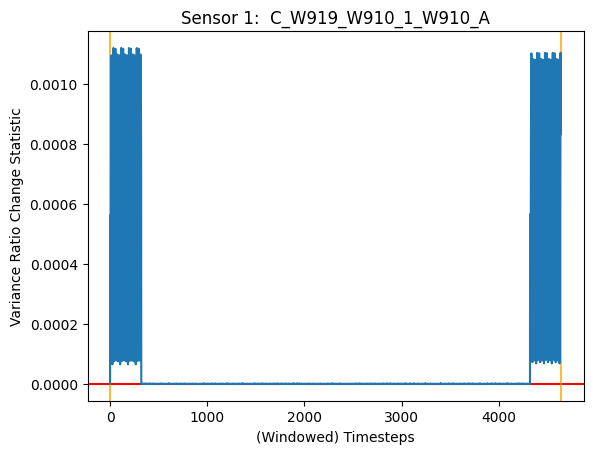

***********************************************************************************************
Sensor 2:  C_W919_W910_1_W910_B
DD = 4
39600 43919


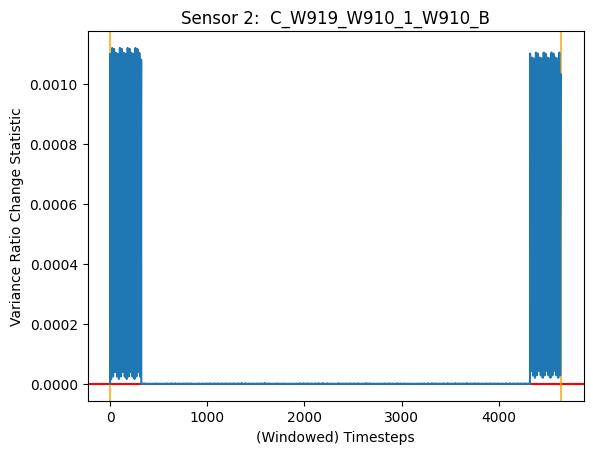

***********************************************************************************************
Sensor 3:  C_W919_W910_1_W910_C
DD = 4
17040 20399


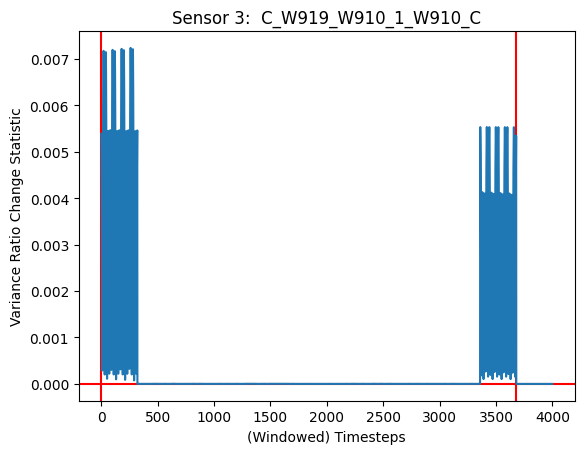

DD = 4
39600 43919


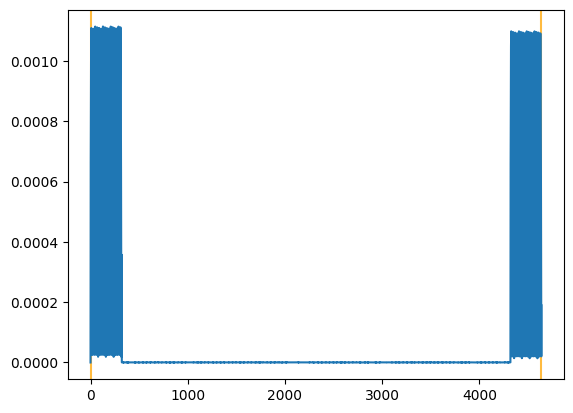

***********************************************************************************************
Sensor 4:  V_W-115KV2_AN
DD = 4
20400 27119


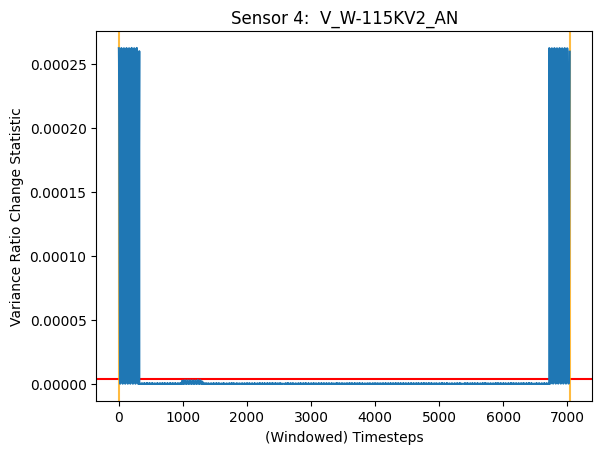

DD = 4
39600 43919


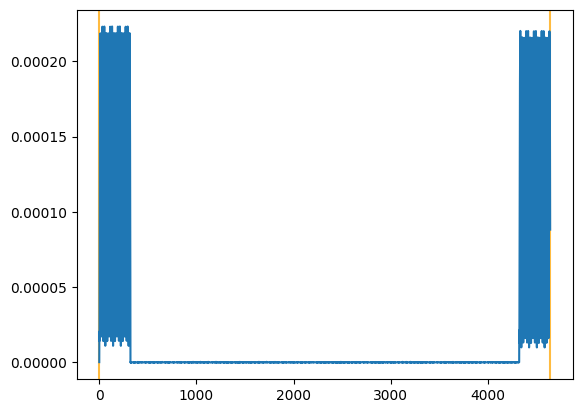

***********************************************************************************************
Sensor 5:  V_W-115KV2_BN
DD = 4
20400 27119


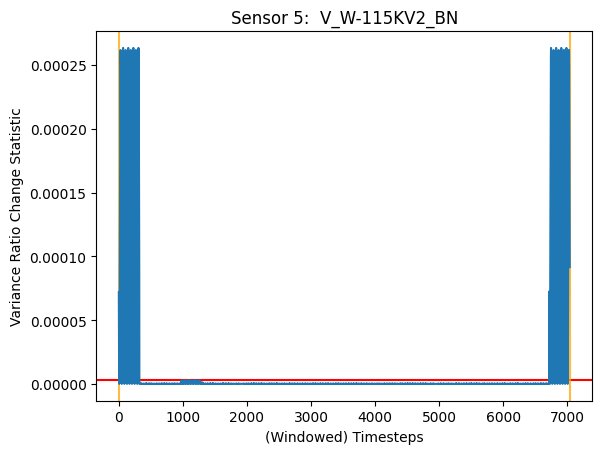

DD = 4
39600 43919


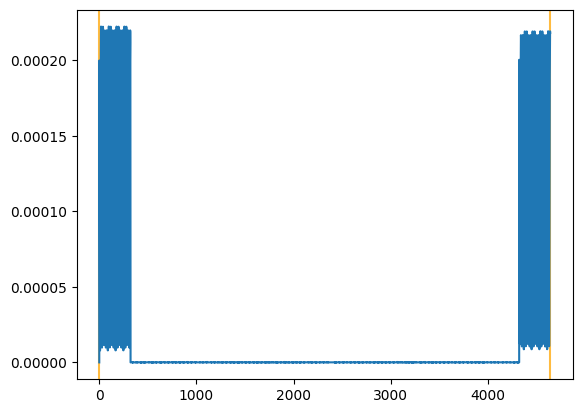

***********************************************************************************************
Sensor 6:  V_W-115KV2_CN
DD = 4
20400 27119


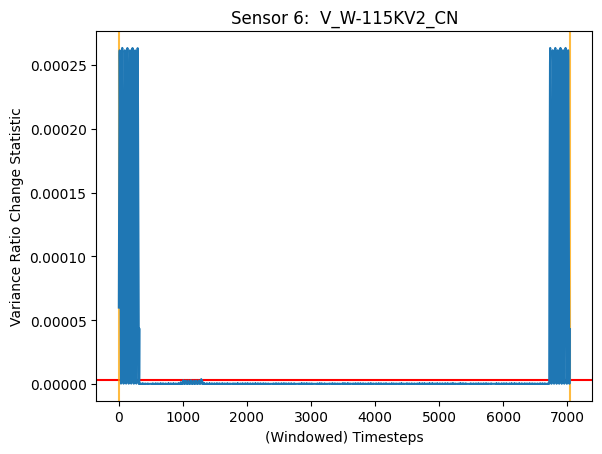

DD = 4
39600 43919


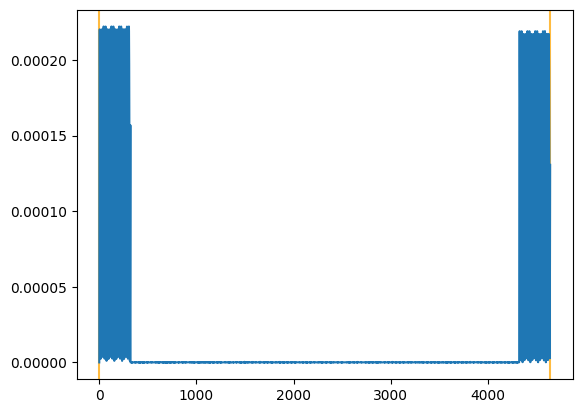

***********************************************************************************************
Sensor 7:  C_W957_W950_1_W950_A
DD = None
9360 15599


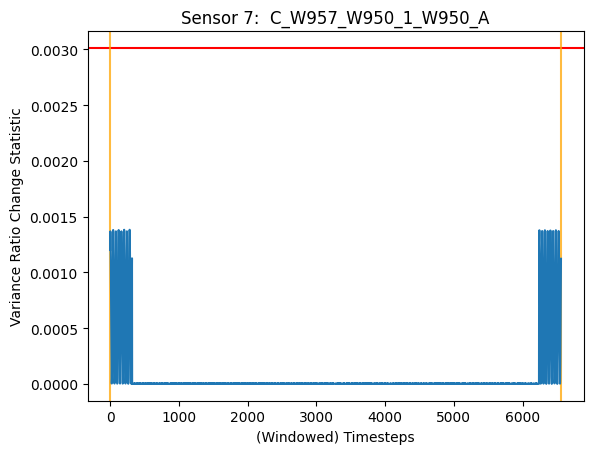

***********************************************************************************************
Sensor 8:  C_W957_W950_1_W950_B
DD = None
9360 15599


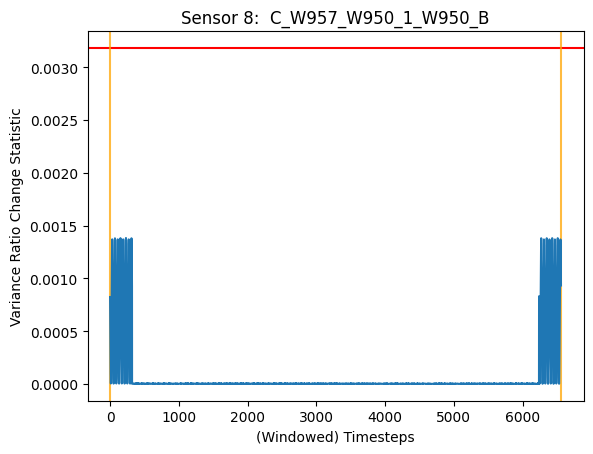

***********************************************************************************************
Sensor 9:  C_W957_W950_1_W950_C
DD = None
9360 15599


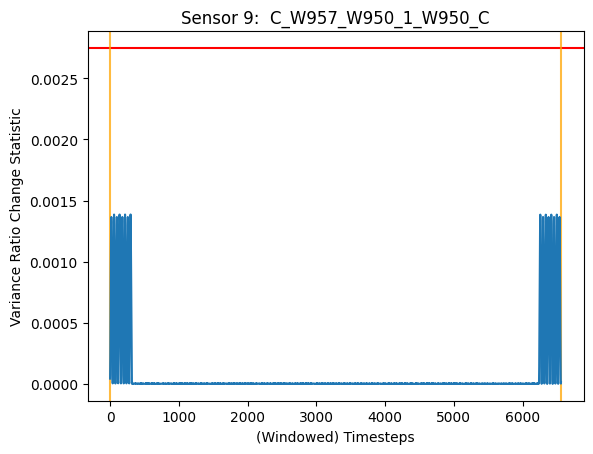

***********************************************************************************************
Sensor 10:  V_W951_AN
DD = 4
20400 27119


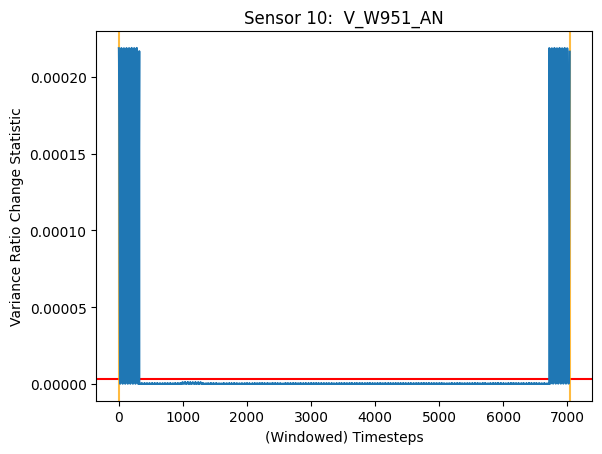

DD = 4
39600 43919


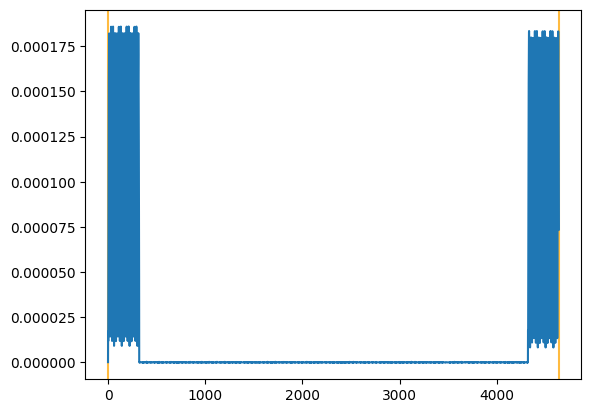

DD = 4
49200 53999


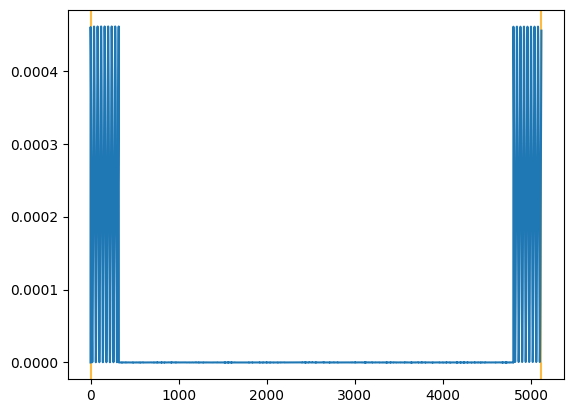

***********************************************************************************************
Sensor 11:  V_W951_BN
DD = 4
20400 27119


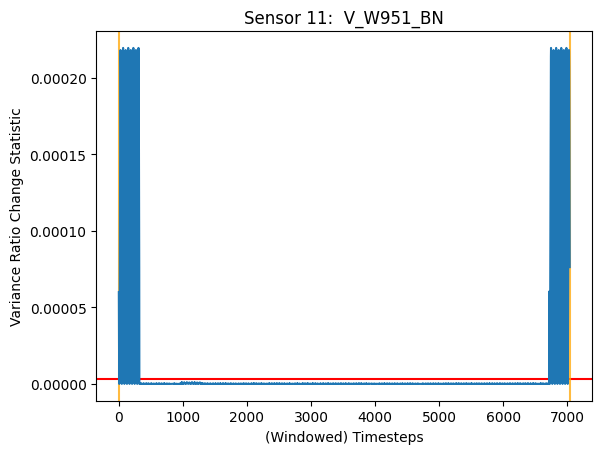

DD = 4
39600 43919


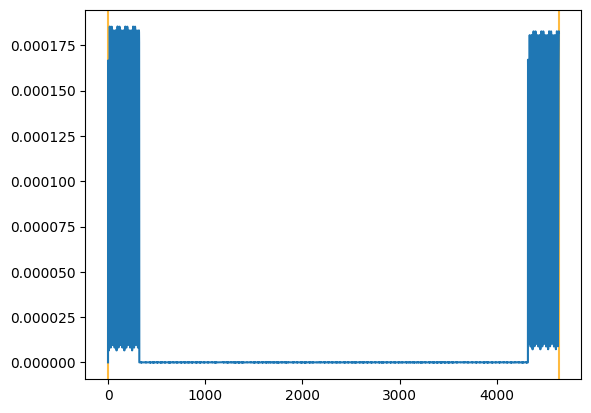

DD = 4
49200 53999


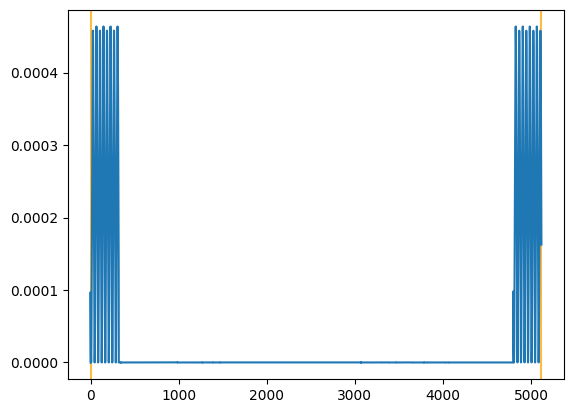

***********************************************************************************************
Sensor 12:  V_W951_CN
DD = 4
20400 27119


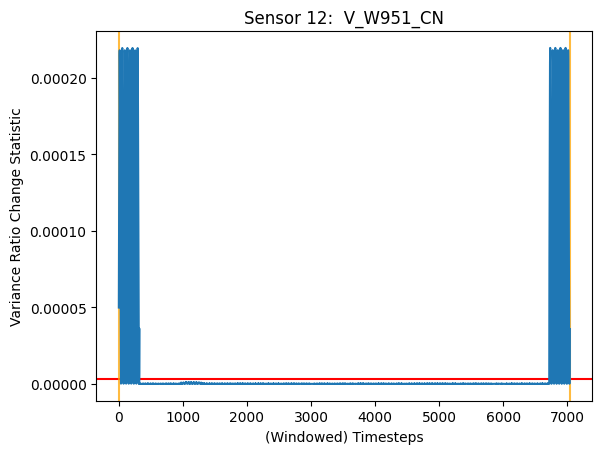

DD = 4
39600 43919


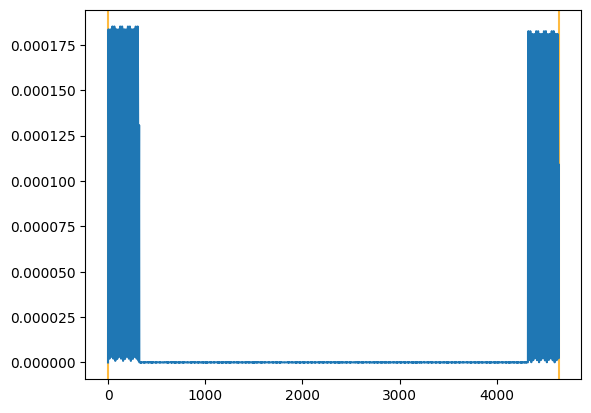

DD = 4
49200 53999


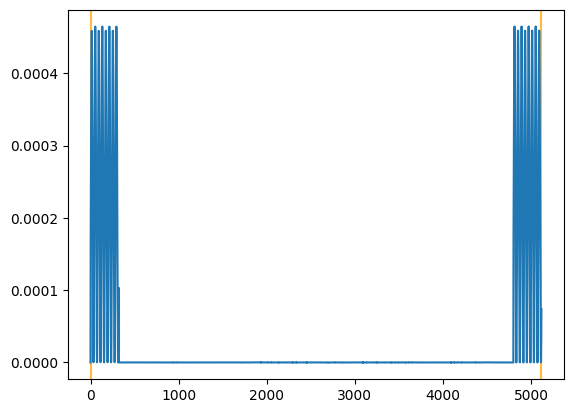

***********************************************************************************************
Sensor 13:  C_W957_W950_1_W957_A
DD = 4
9360 15599


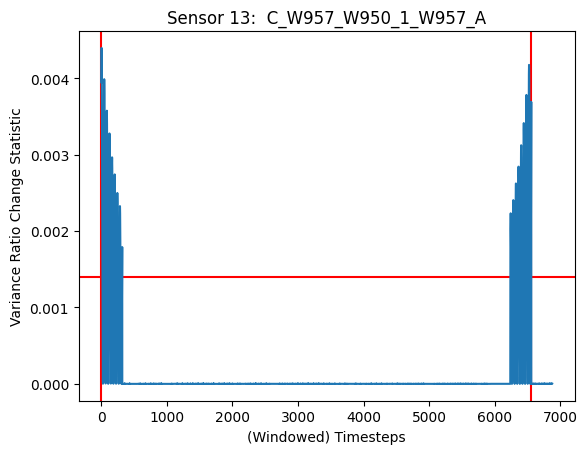

***********************************************************************************************
Sensor 14:  C_W957_W950_1_W957_B
DD = 22
9360 15599


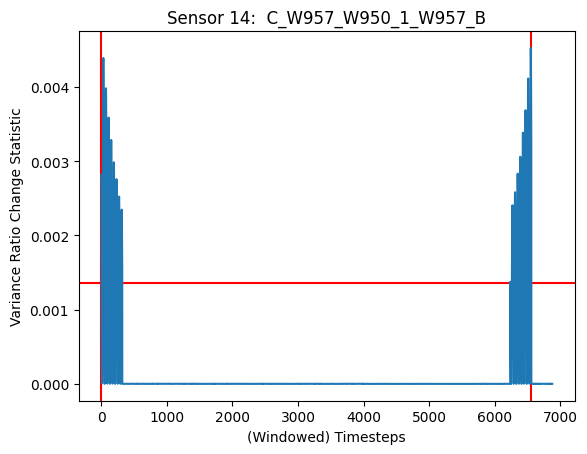

***********************************************************************************************
Sensor 15:  C_W957_W950_1_W957_C
DD = 9
9360 15599


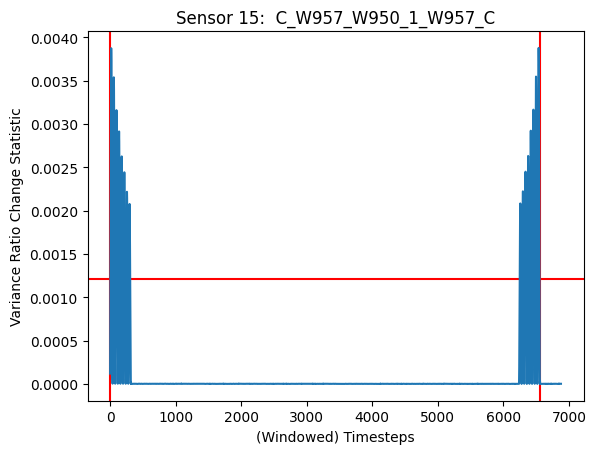

***********************************************************************************************
Sensor 16:  C_W927_W929_1_W929_A
***********************************************************************************************
Sensor 17:  C_W927_W929_1_W929_B
***********************************************************************************************
Sensor 18:  C_W927_W929_1_W929_C
***********************************************************************************************
Sensor 19:  V_W-115KV1_AN
DD = 4
20400 27119


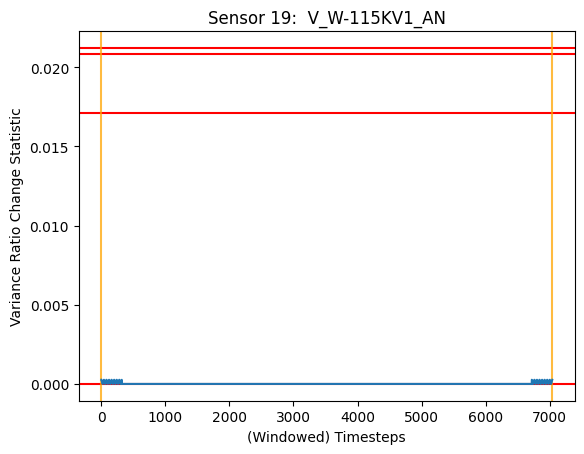

DD = 4
39600 43919


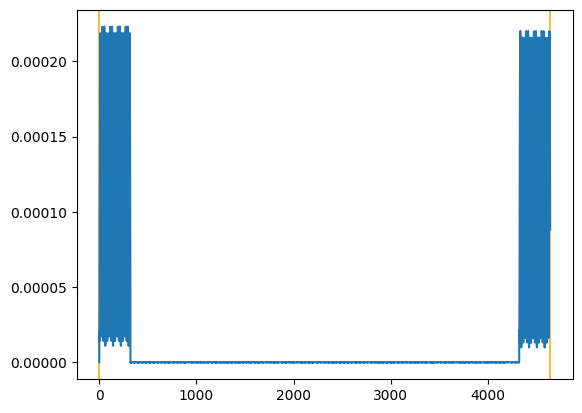

***********************************************************************************************
Sensor 20:  V_W-115KV1_BN
DD = 4
20400 27119


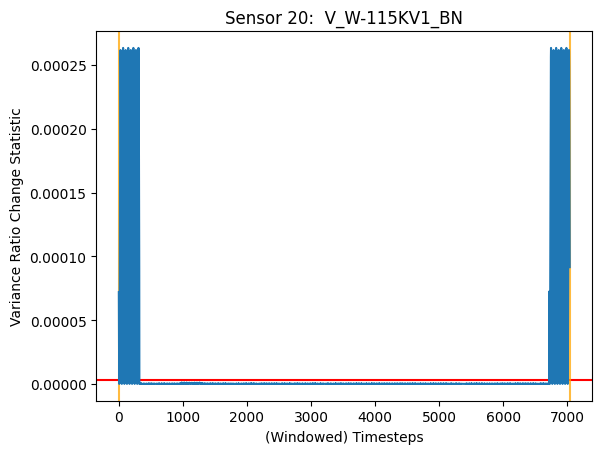

DD = 4
39600 43919


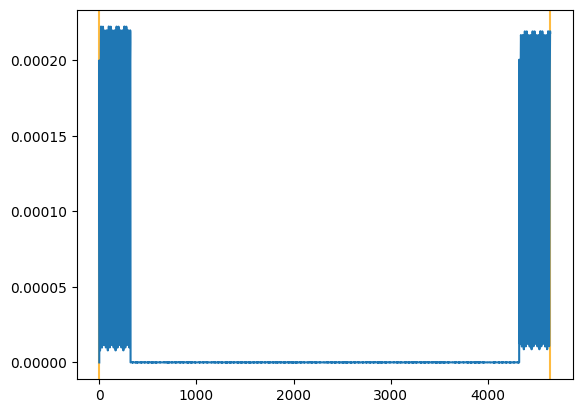

***********************************************************************************************
Sensor 21:  V_W-115KV1_CN
DD = 4
20400 27119


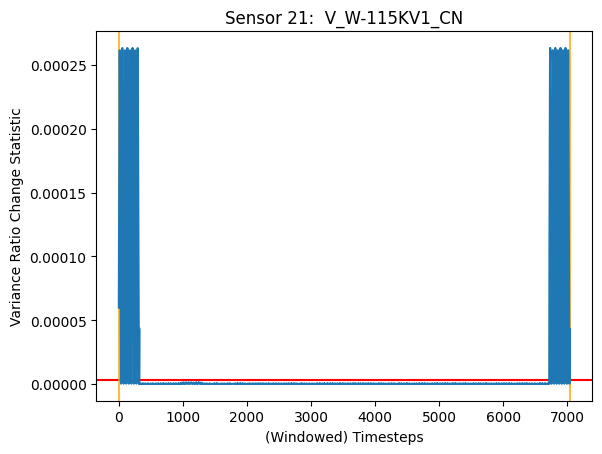

DD = 4
39600 43919


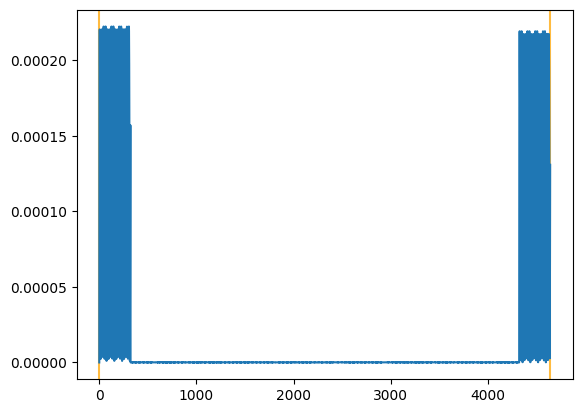

***********************************************************************************************
Sensor 22:  C_W927_W929_1_W927_A
***********************************************************************************************
Sensor 23:  C_W927_W929_1_W927_B
***********************************************************************************************
Sensor 24:  C_W927_W929_1_W927_C
***********************************************************************************************
Sensor 25:  C_W919_W910_1_W919_A
DD = 11
39600 43919


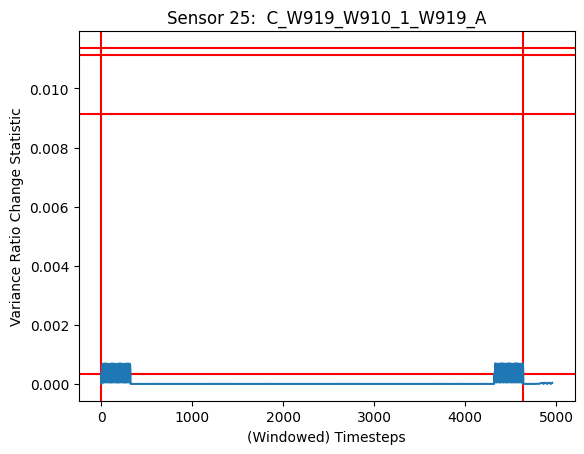

***********************************************************************************************
Sensor 26:  C_W919_W910_1_W919_B
DD = 4
39600 43919


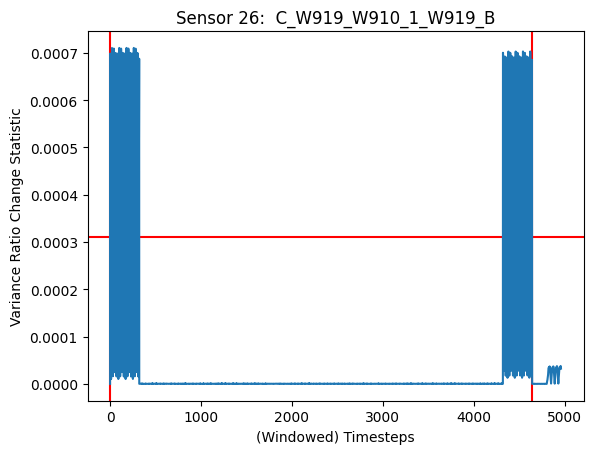

***********************************************************************************************
Sensor 27:  C_W919_W910_1_W919_C
DD = 4
17040 20399


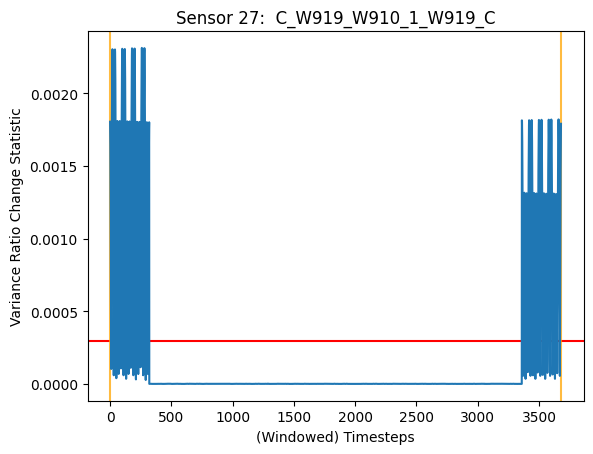

DD = 4
39600 43919


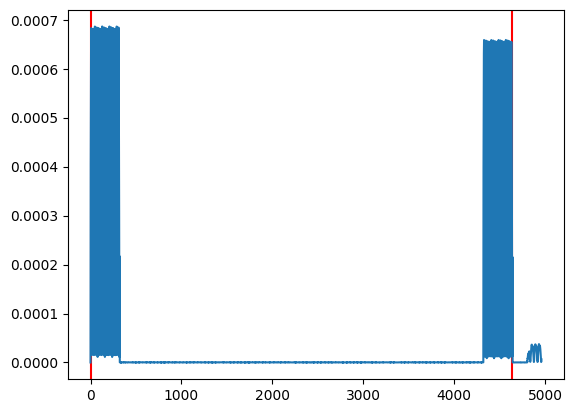

***********************************************************************************************
Sensor 28:  V_W911_AN
DD = 4
20400 27119


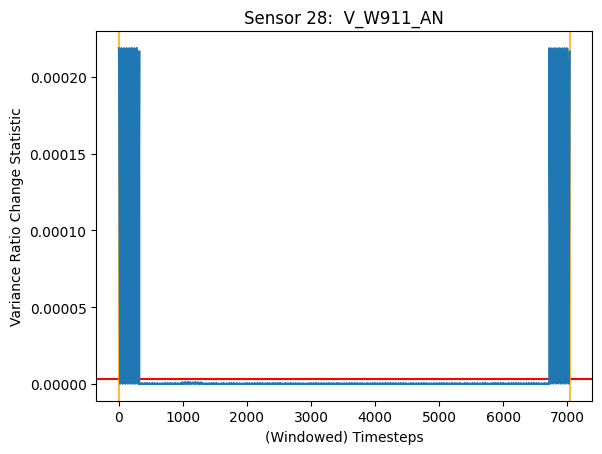

DD = 4
39600 43919


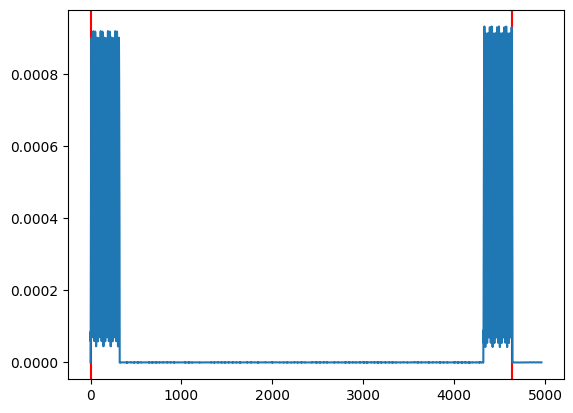

***********************************************************************************************
Sensor 29:  V_W911_BN
DD = 4
20400 27119


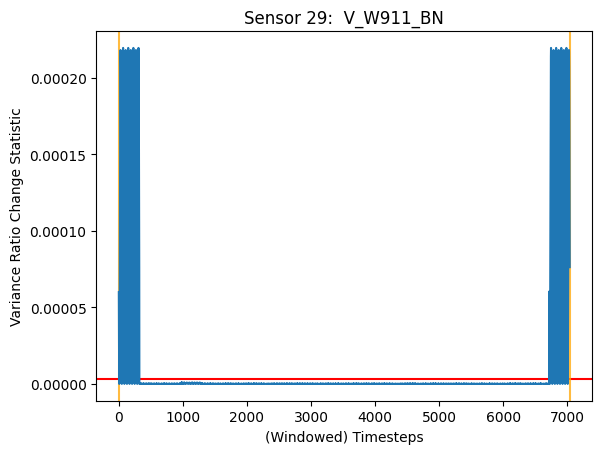

DD = 4
39600 43919


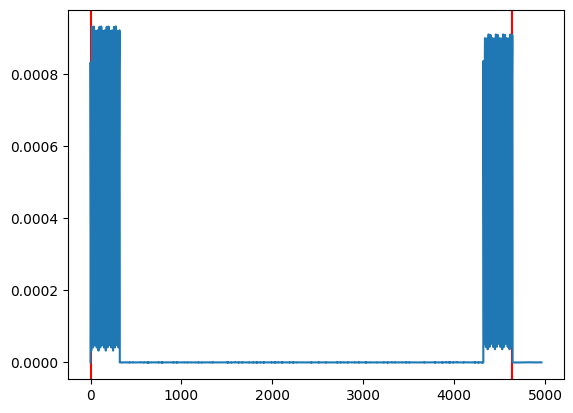

***********************************************************************************************
Sensor 30:  V_W911_CN
DD = 4
20400 27119


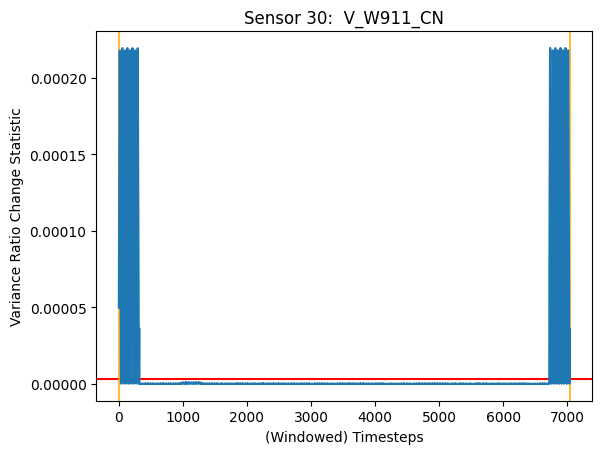

DD = 4
39600 43919


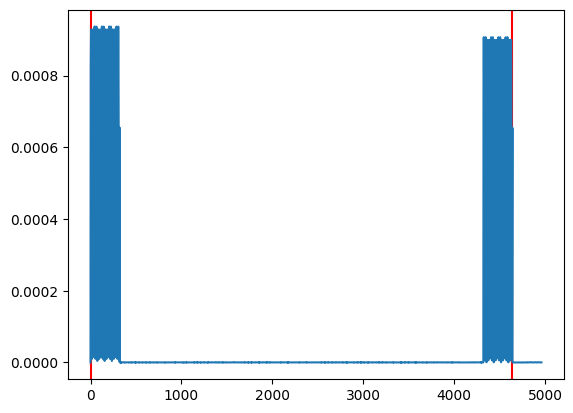

***********************************************************************************************
Sensor 31:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A
***********************************************************************************************
Sensor 32:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B
***********************************************************************************************
Sensor 33:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C
DD = None
28560 32879


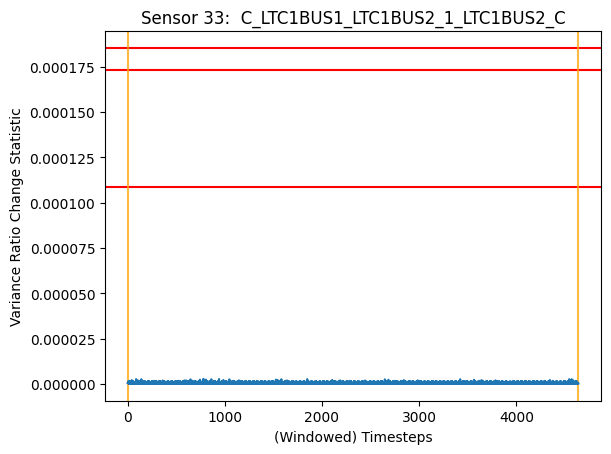

***********************************************************************************************
Sensor 34:  V_BUS13KV1_AN
DD = 4
20400 27119


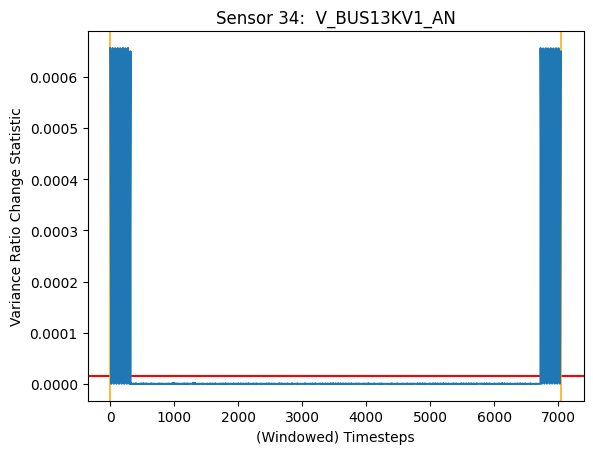

***********************************************************************************************
Sensor 35:  V_BUS13KV1_BN
DD = 4
20400 27119


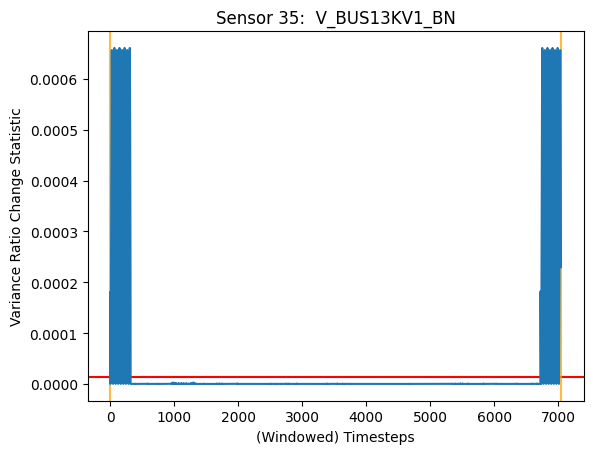

***********************************************************************************************
Sensor 36:  V_BUS13KV1_CN
DD = 4
20400 27119


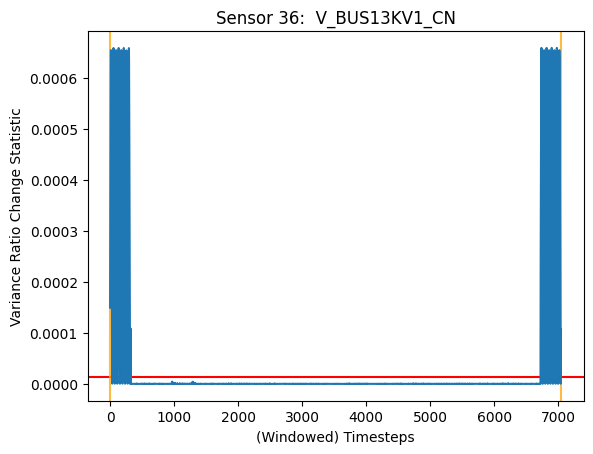

DD = 10
28560 32879


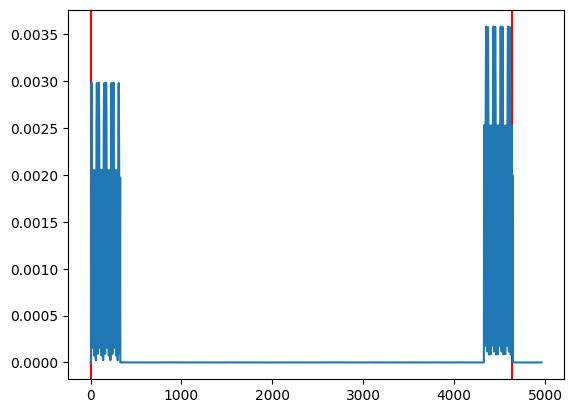

***********************************************************************************************
Sensor 37:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A
DD = None
39600 43919


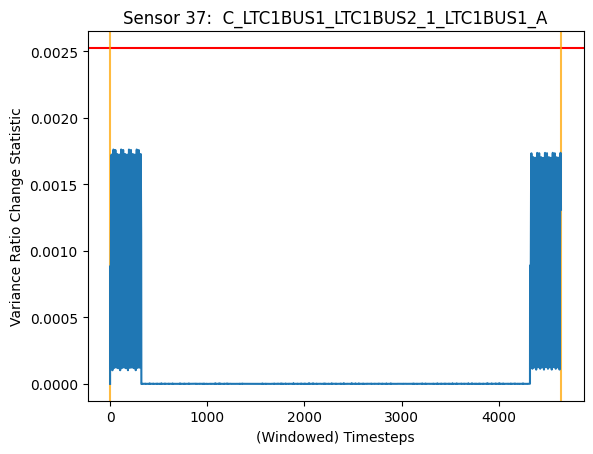

***********************************************************************************************
Sensor 38:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
DD = None
39600 43919


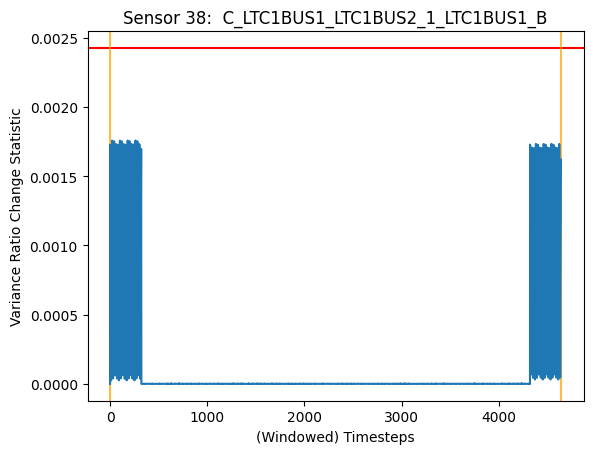

***********************************************************************************************
Sensor 39:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C
DD = None
39600 43919


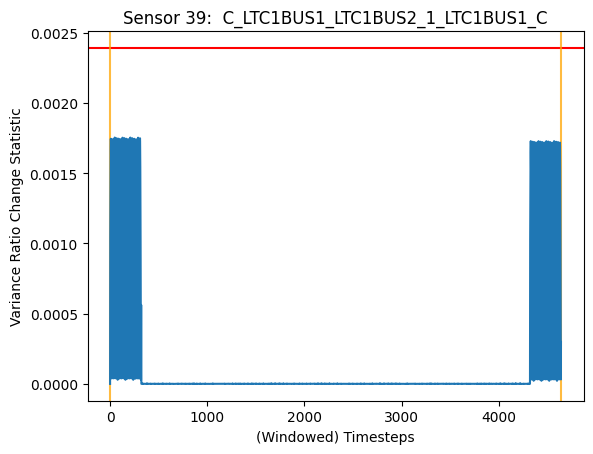

***********************************************************************************************
Sensor 40:  V_W9111_AN
DD = 4
20400 27119


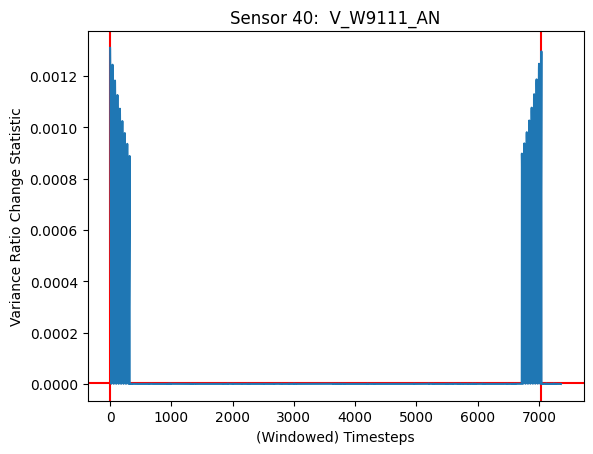

DD = 4
39600 43919


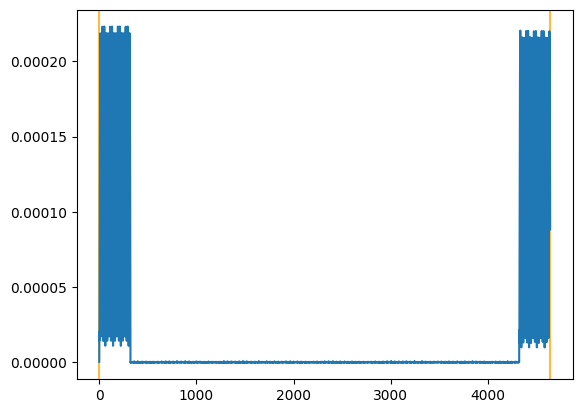

***********************************************************************************************
Sensor 41:  V_W9111_BN
DD = 4
20400 27119


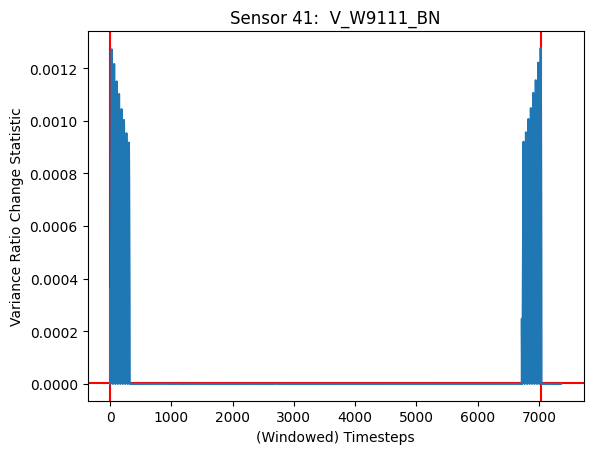

DD = 4
39600 43919


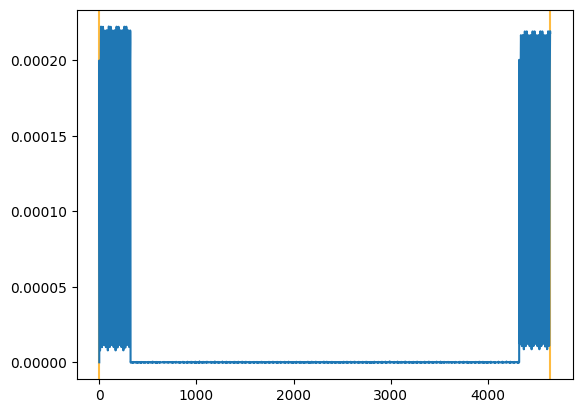

***********************************************************************************************
Sensor 42:  V_W9111_CN
DD = 4
20400 27119


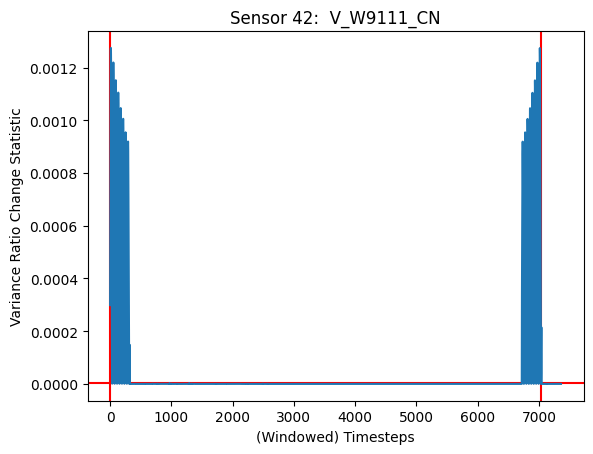

DD = 10
28560 32879


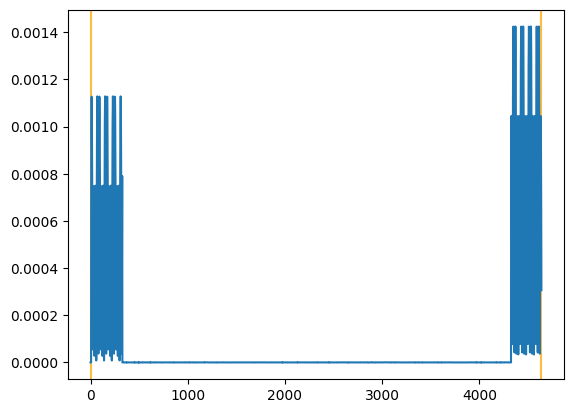

DD = 4
39600 43919


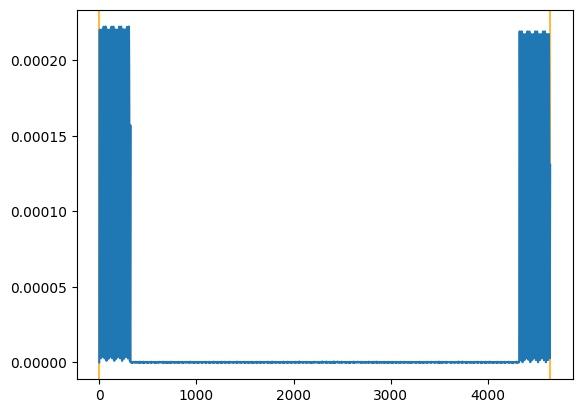

***********************************************************************************************
Sensor 43:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
***********************************************************************************************
Sensor 44:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
***********************************************************************************************
Sensor 45:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C
***********************************************************************************************
Sensor 46:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
DD = 9
78000 82799


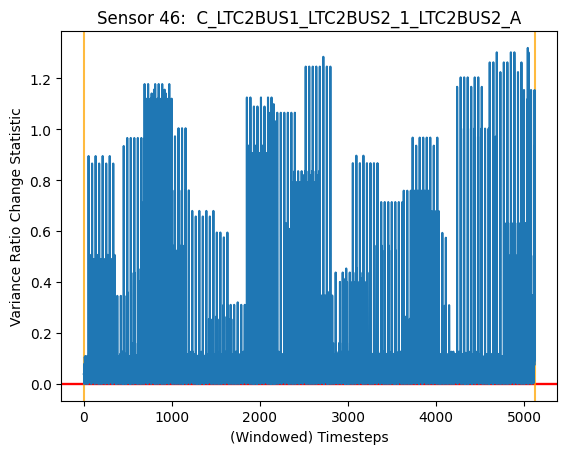

***********************************************************************************************
Sensor 47:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
DD = 4
78000 82799


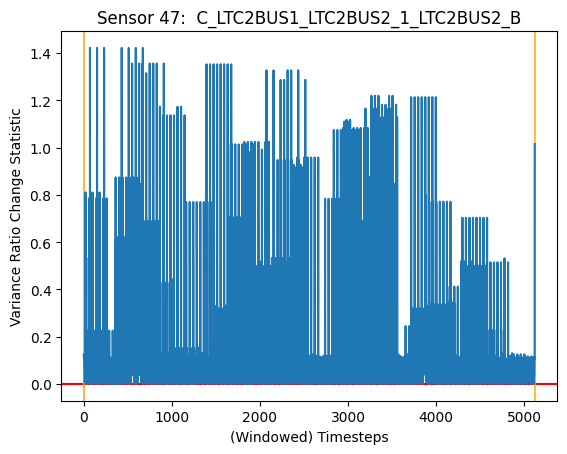

***********************************************************************************************
Sensor 48:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
DD = 4
78000 82799


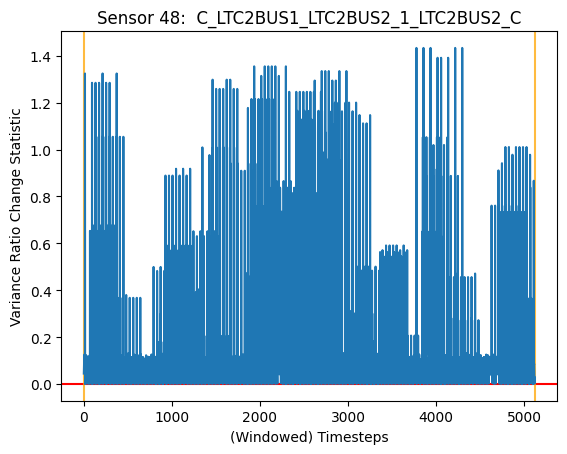

***********************************************************************************************
Sensor 49:  V_BUS13KV2_AN
DD = 11
78000 82799


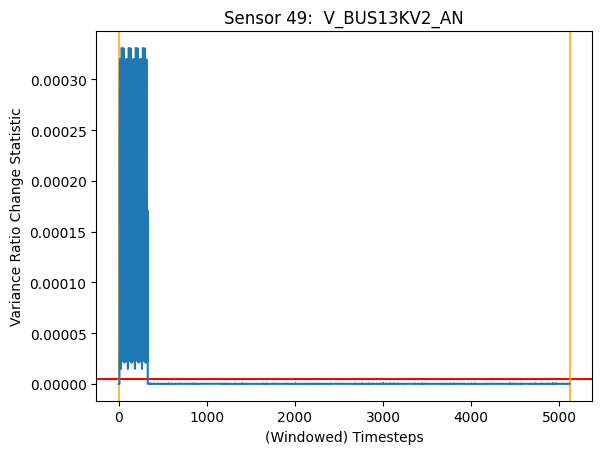

***********************************************************************************************
Sensor 50:  V_BUS13KV2_BN
DD = 14
78000 82799


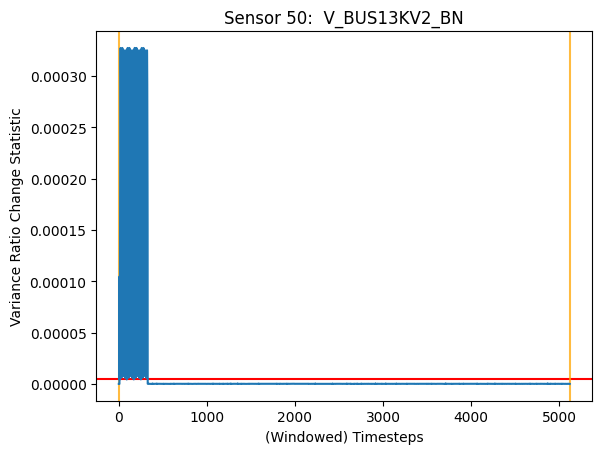

***********************************************************************************************
Sensor 51:  V_BUS13KV2_CN
DD = 11
78000 82799


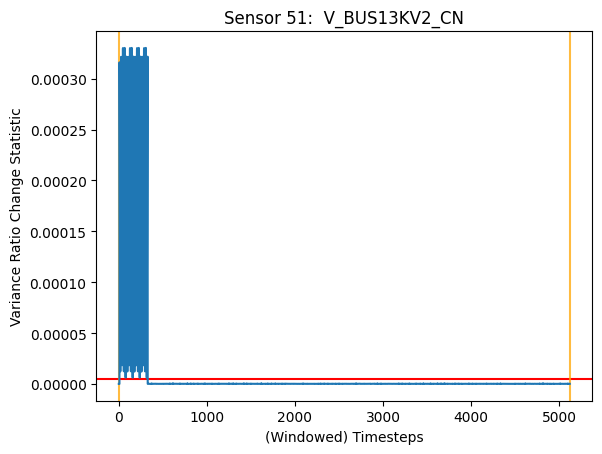

***********************************************************************************************
Sensor 52:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_A
DD = None
39600 43919


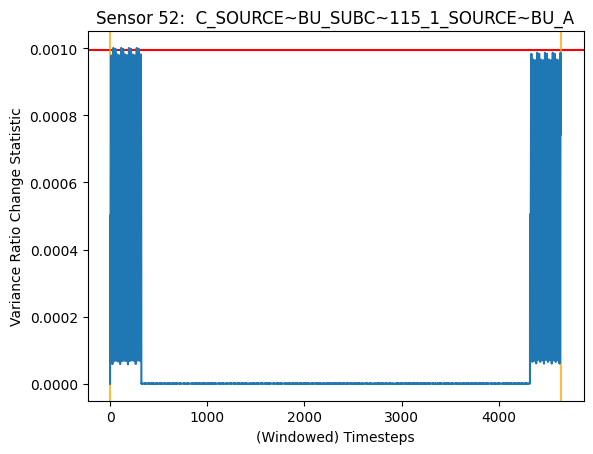

***********************************************************************************************
Sensor 53:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_B
DD = 22
39600 43919


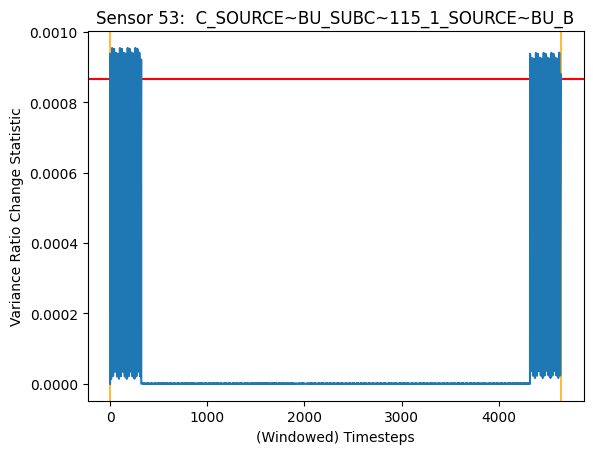

***********************************************************************************************
Sensor 54:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_C
DD = 9
39600 43919


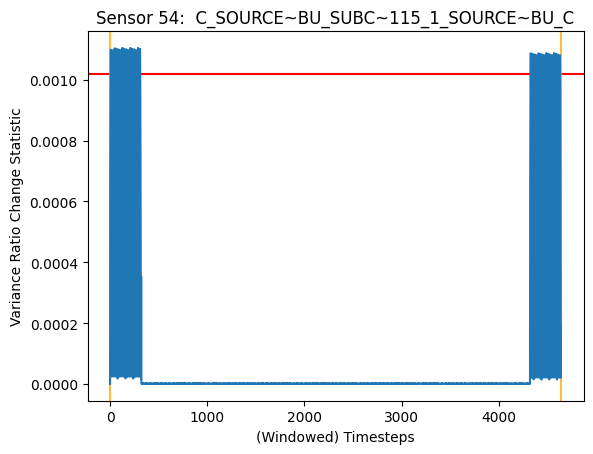

***********************************************************************************************
Sensor 55:  V_SOURCE-BU_AN
DD = 4
39600 43919


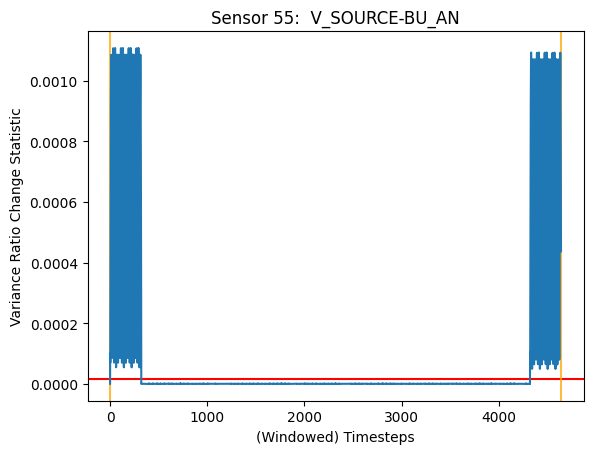

***********************************************************************************************
Sensor 56:  V_SOURCE-BU_BN
DD = 4
39600 43919


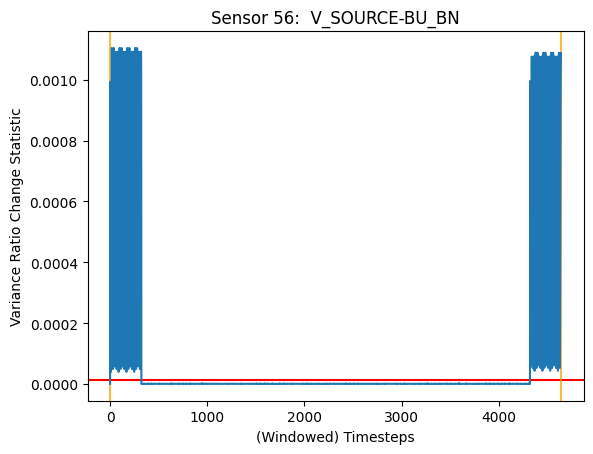

***********************************************************************************************
Sensor 57:  V_SOURCE-BU_CN
DD = 4
39600 43919


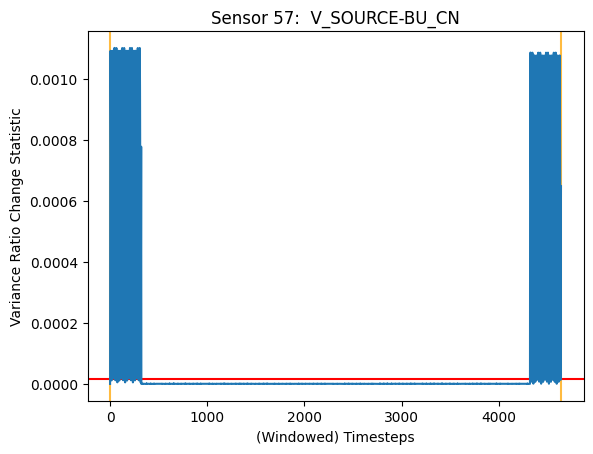

***********************************************************************************************
Sensor 58:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_A
DD = 4
9360 15599


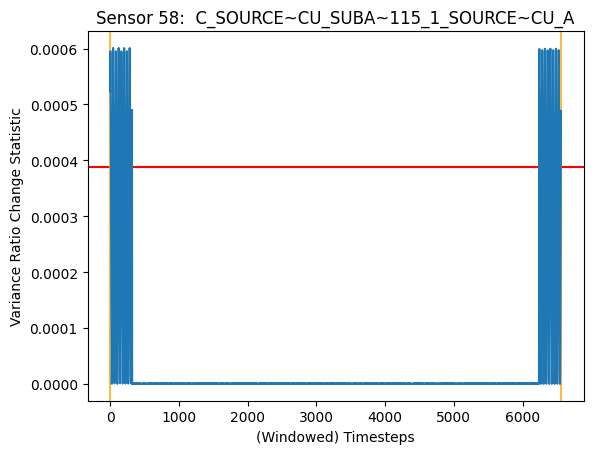

***********************************************************************************************
Sensor 59:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_B
DD = 26
9360 15599


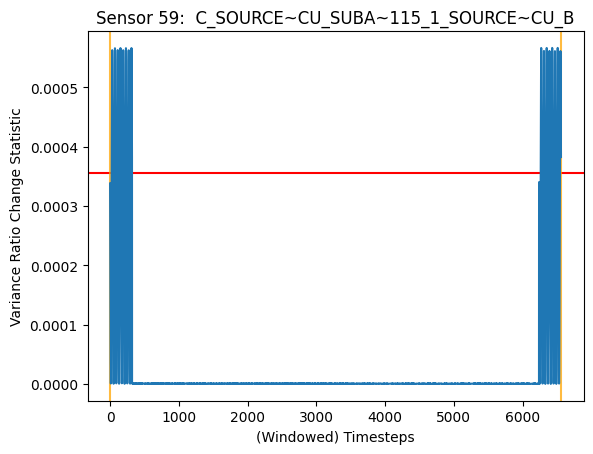

***********************************************************************************************
Sensor 60:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_C
DD = 13
9360 15599


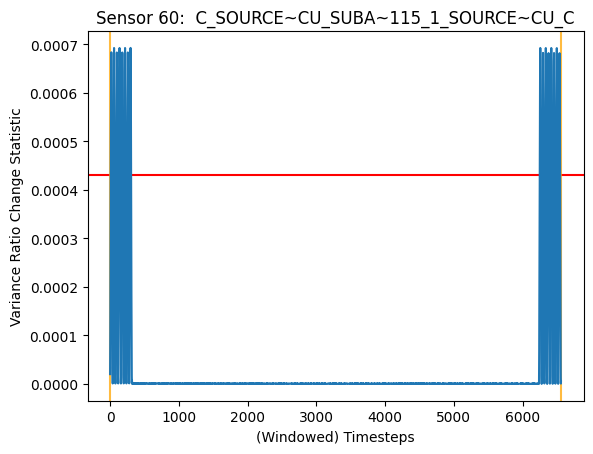

***********************************************************************************************
Sensor 61:  V_SOURCE-CU_AN
***********************************************************************************************
Sensor 62:  V_SOURCE-CU_BN
***********************************************************************************************
Sensor 63:  V_SOURCE-CU_CN
***********************************************************************************************
Sensor 64:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_A
***********************************************************************************************
Sensor 65:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_B
***********************************************************************************************
Sensor 66:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_C
***********************************************************************************************
Sensor 67:  V_SOURCE-FA_AN
DD = 4
49200 53999


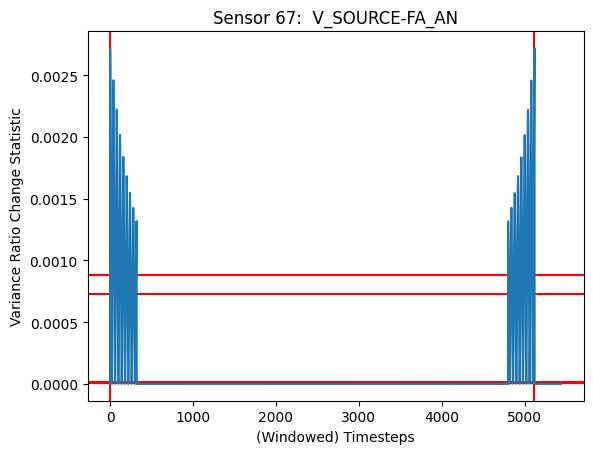

***********************************************************************************************
Sensor 68:  V_SOURCE-FA_BN
DD = 4
49200 53999


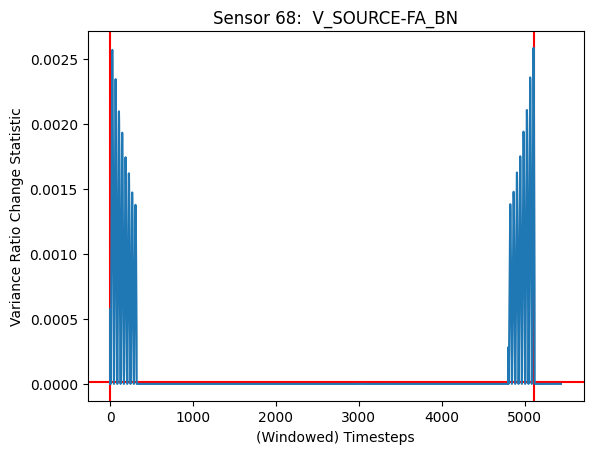

***********************************************************************************************
Sensor 69:  V_SOURCE-FA_CN
DD = 4
49200 53999


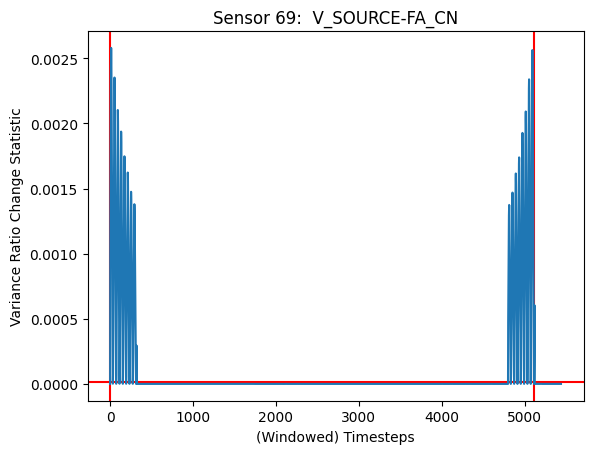

***********************************************************************************************
Sensor 70:  C_W738_W737_2_W737_A
***********************************************************************************************
Sensor 71:  C_W738_W737_2_W737_B
***********************************************************************************************
Sensor 72:  C_W738_W737_2_W737_C
***********************************************************************************************
Sensor 73:  V_W738_AN
***********************************************************************************************
Sensor 74:  V_W738_BN
***********************************************************************************************
Sensor 75:  V_W738_CN
***********************************************************************************************
Sensor 76:  C_W747_W748_2_W747_A
DD = None
54960 59759


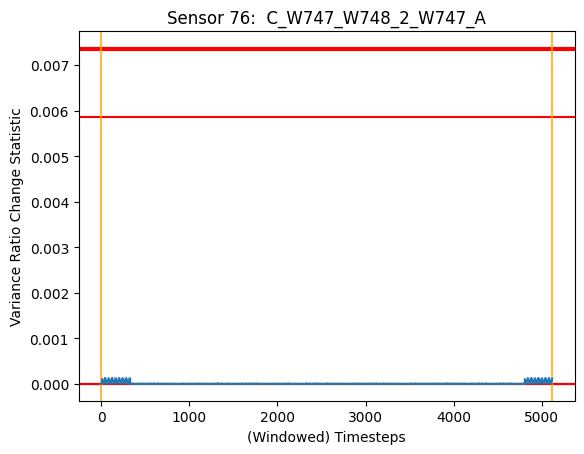

***********************************************************************************************
Sensor 77:  C_W747_W748_2_W747_B
DD = None
54960 59759


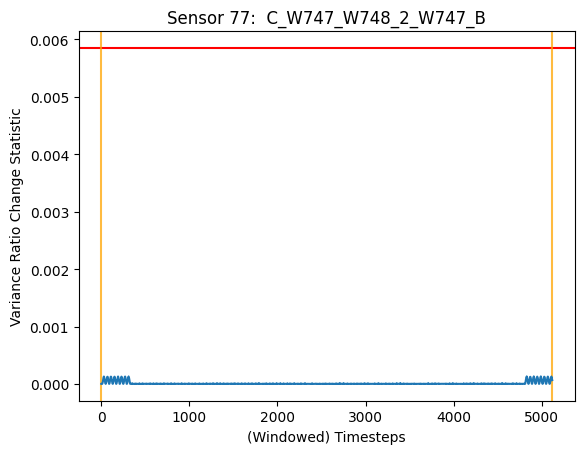

***********************************************************************************************
Sensor 78:  C_W747_W748_2_W747_C
DD = None
54960 59759


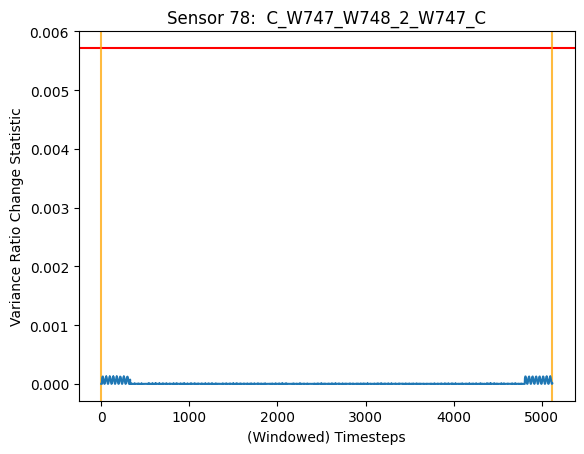

***********************************************************************************************
Sensor 79:  V_W748_AN
***********************************************************************************************
Sensor 80:  V_W748_BN
***********************************************************************************************
Sensor 81:  V_W748_CN
***********************************************************************************************
Sensor 82:  C_W787_W788_2_W787_A
DD = 14
78000 82799


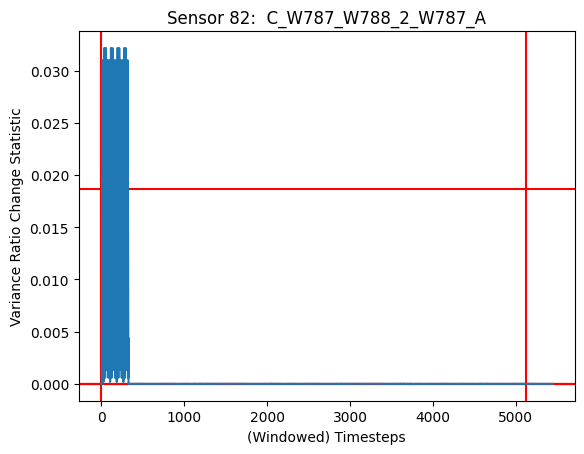

***********************************************************************************************
Sensor 83:  C_W787_W788_2_W787_B
DD = 20
78000 82799


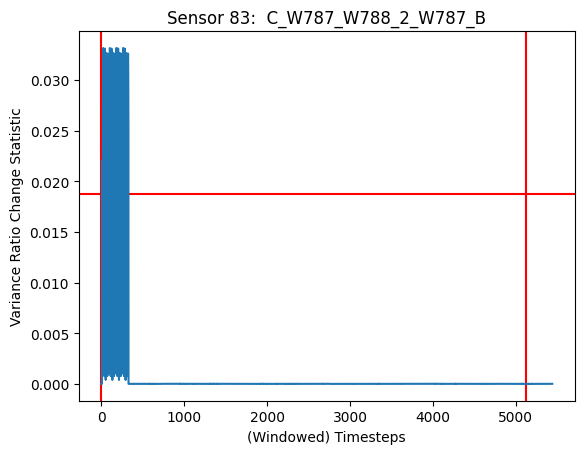

***********************************************************************************************
Sensor 84:  C_W787_W788_2_W787_C
DD = 11
78000 82799


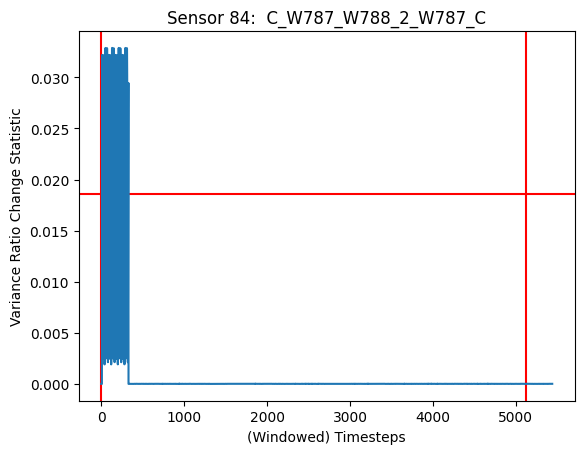

***********************************************************************************************
Sensor 85:  V_W788_AN
DD = 11
78000 82799


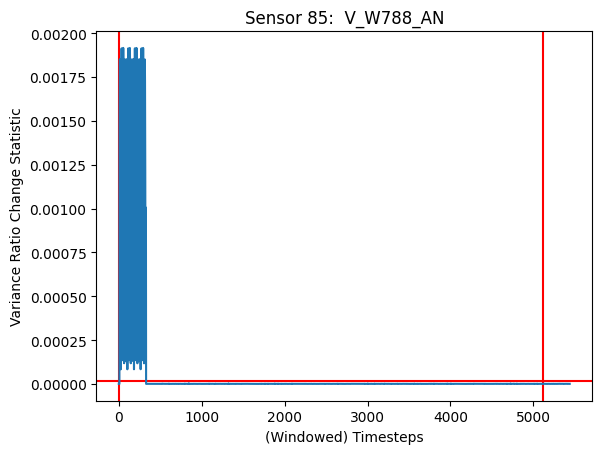

***********************************************************************************************
Sensor 86:  V_W788_BN
DD = 11
78000 82799


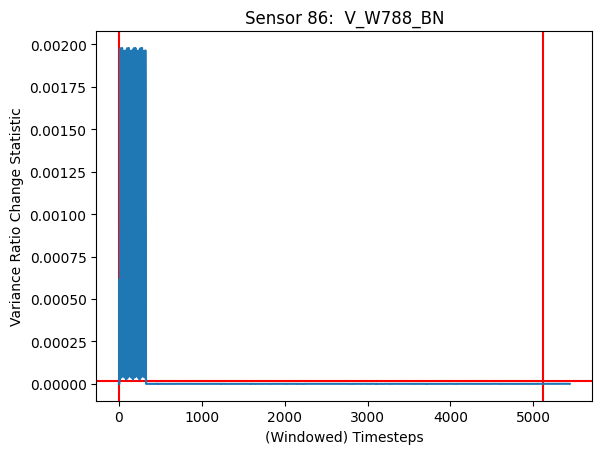

***********************************************************************************************
Sensor 87:  V_W788_CN
DD = 11
78000 82799


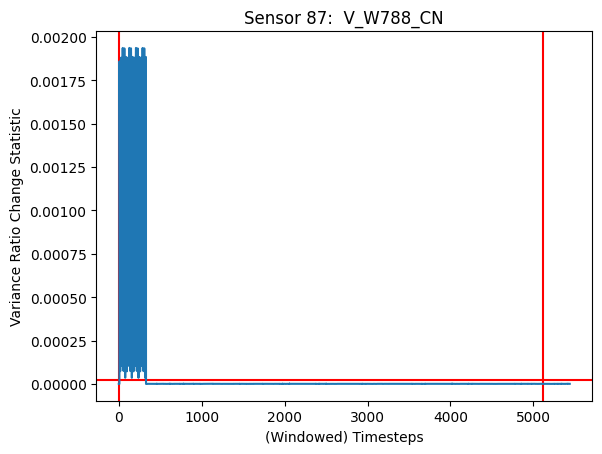

***********************************************************************************************
Sensor 88:  C_W797_W798_2_W797_A
***********************************************************************************************
Sensor 89:  C_W797_W798_2_W797_B
***********************************************************************************************
Sensor 90:  C_W797_W798_2_W797_C
***********************************************************************************************
Sensor 91:  V_W798_AN
***********************************************************************************************
Sensor 92:  V_W798_BN
***********************************************************************************************
Sensor 93:  V_W798_CN
***********************************************************************************************
Sensor 94:  C_FD2B2_FD2B1_1_FD2B1_A
DD = 37
54960 59759


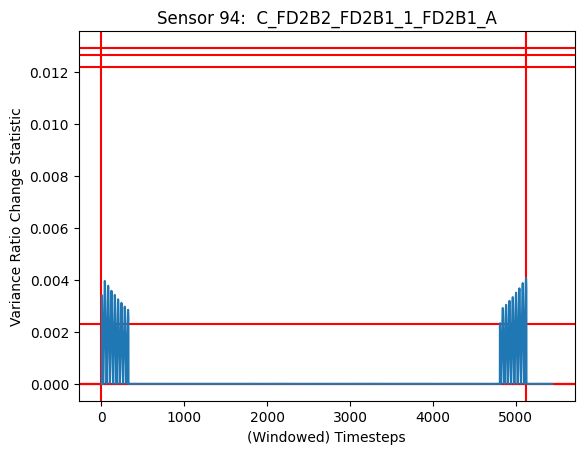

***********************************************************************************************
Sensor 95:  C_FD2B2_FD2B1_1_FD2B1_B
DD = 24
54960 59759


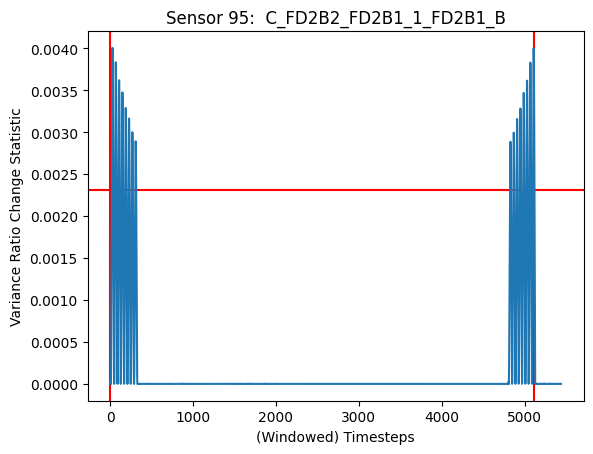

***********************************************************************************************
Sensor 96:  C_FD2B2_FD2B1_1_FD2B1_C
DD = 11
54960 59759


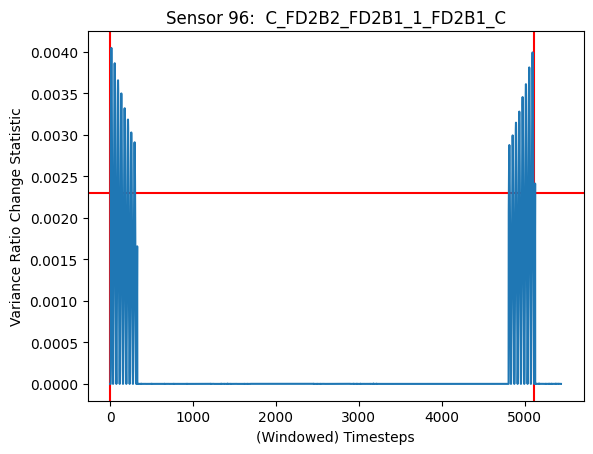

DD = 13
68880 74639


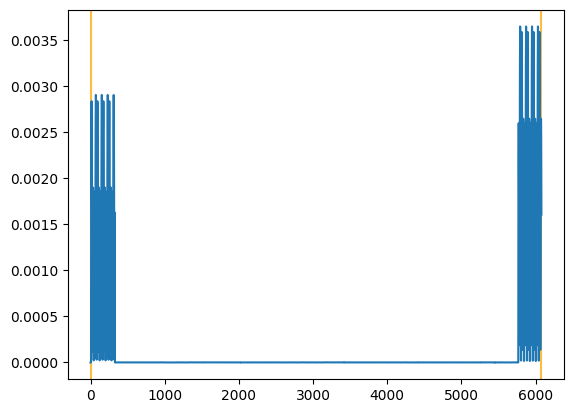

***********************************************************************************************
Sensor 97:  V_FD2B1_AN
***********************************************************************************************
Sensor 98:  V_FD2B1_BN
***********************************************************************************************
Sensor 99:  V_FD2B1_CN
***********************************************************************************************
Sensor 100:  C_FD2B5_FD2B6_1_FD2B5_A
DD = 11
54960 59759


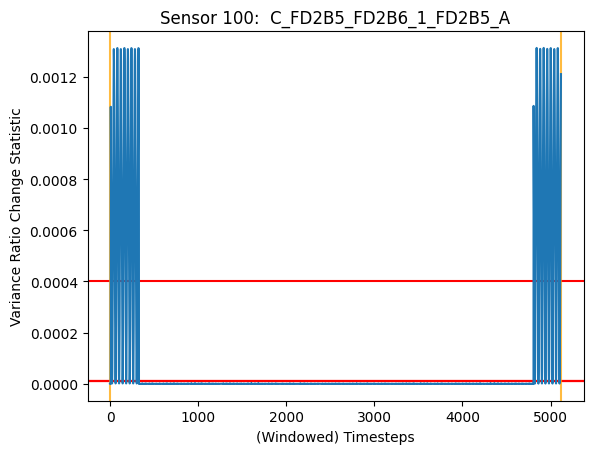

***********************************************************************************************
Sensor 101:  C_FD2B5_FD2B6_1_FD2B5_B
DD = 20
54960 59759


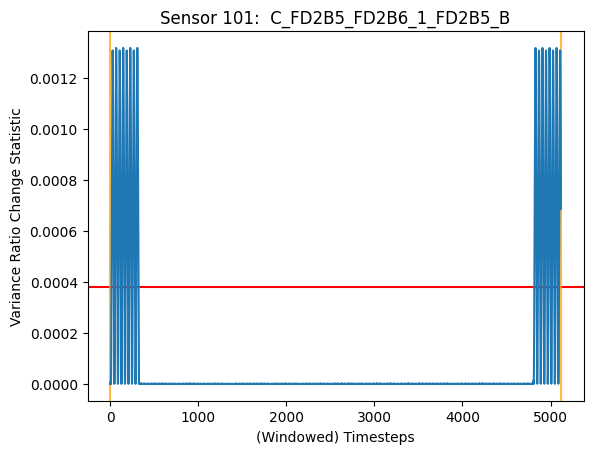

***********************************************************************************************
Sensor 102:  C_FD2B5_FD2B6_1_FD2B5_C
DD = 11
54960 59759


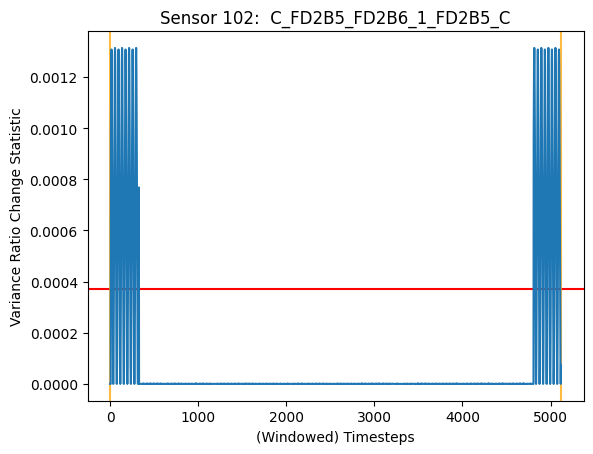

DD = 11
68880 74639


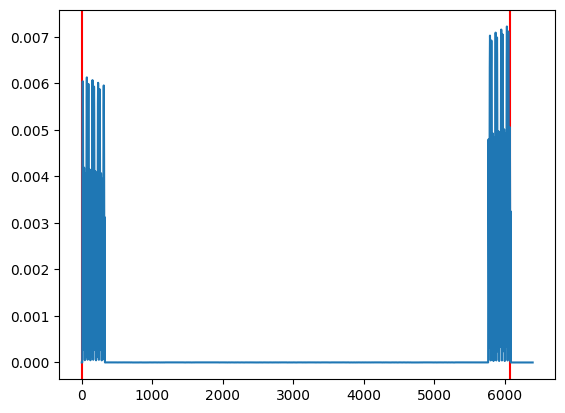

***********************************************************************************************
Sensor 103:  V_FD2B5_AN
***********************************************************************************************
Sensor 104:  V_FD2B5_BN
***********************************************************************************************
Sensor 105:  V_FD2B5_CN
***********************************************************************************************
Sensor 106:  C_FD3B4_FD3B5_1_FD3B4_A
DD = 14
78000 82799


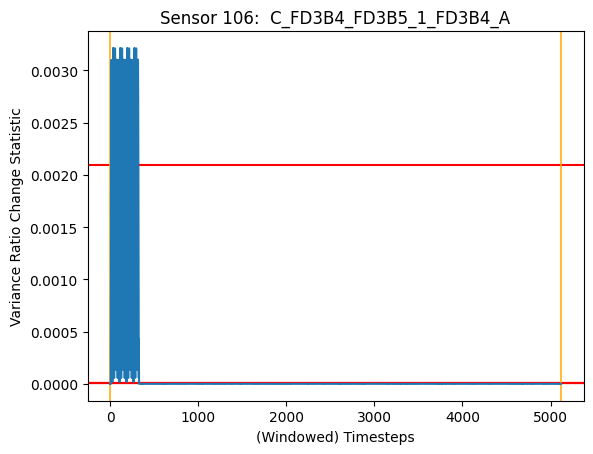

***********************************************************************************************
Sensor 107:  C_FD3B4_FD3B5_1_FD3B4_B
DD = 21
78000 82799


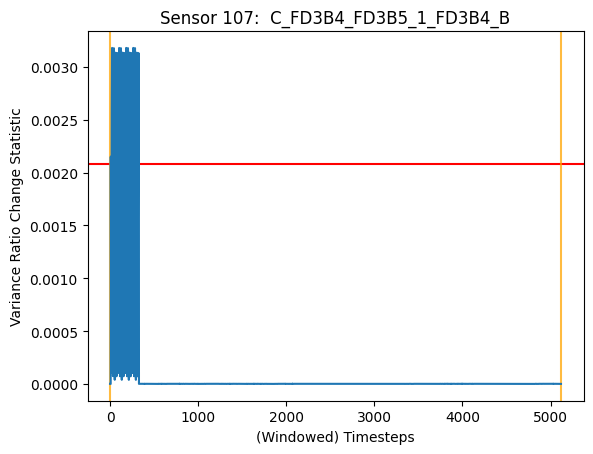

***********************************************************************************************
Sensor 108:  C_FD3B4_FD3B5_1_FD3B4_C
DD = 11
78000 82799


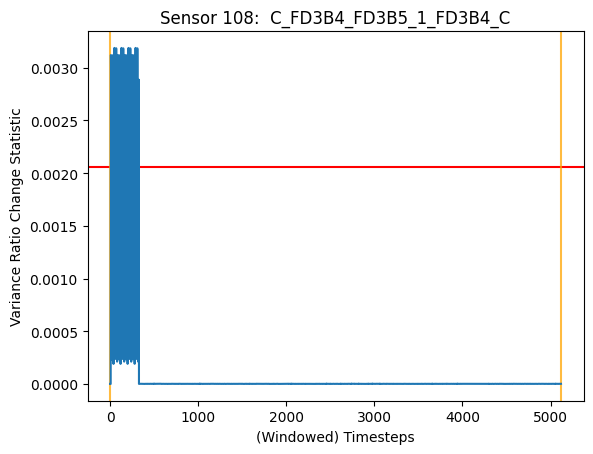

***********************************************************************************************
Sensor 109:  V_FD3B4_AN
DD = 11
78000 82799


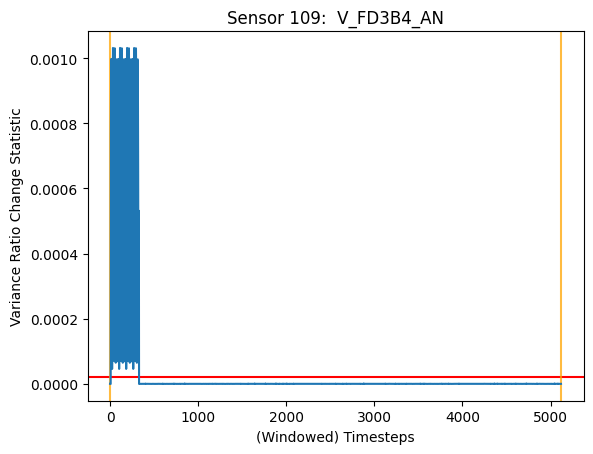

***********************************************************************************************
Sensor 110:  V_FD3B4_BN
DD = 14
78000 82799


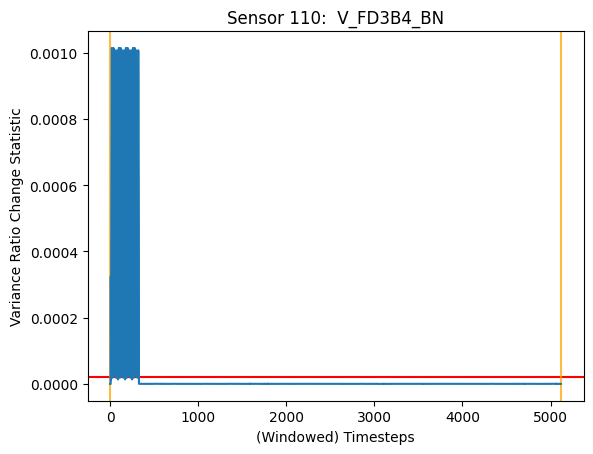

***********************************************************************************************
Sensor 111:  V_FD3B4_CN
DD = 11
78000 82799


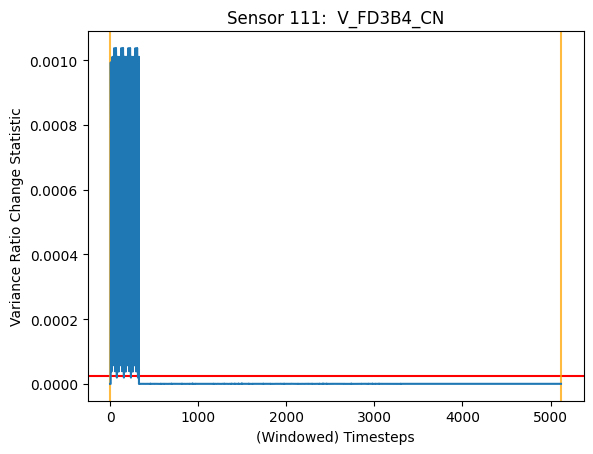

[4, 4, 4, 4, 4, 6, 12, 4, 4, 4, None, None, None, None, None, None, None, 48, 25, None, 75, 12, 10, 4, 6, 4, 6, 4, 4, 4, 4, 15, 4, 4, 4, None, 10, None, 4, None, 4, None, None, None, None, 10, 16, 4, 4, 4, 6, 4, 4, 4, 10, 4, 16, 11, 11, 11, 11, 11, None, None, None, 4, 4, 4, None, None, None, 4, 4, 4, None, None, None, 13, 11, 11, 11, 11, 11, 31, 18, 11, 11, 11, 15, 11, 11, 12, 11, 11, 11, 11, 11, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, None, None, None, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 22, 9, 4, 4, 4, 4, 4, 4, 11, 4, 4, 4, 4, 4, 4, 4, 4, 4, None, 4, 4, 4, 10, None, None, None, 4, 4, 4, 4, 4, 10, 4, 9, 4, 4, 11, 14, 11, None, 22, 9, 4, 4, 4, 4, 26, 13, 4, 4, 4, None, None, None, 14, 20, 11, 11, 11, 11, 37, 24, 11, 13, 11, 20, 11, 11, 14, 21, 11, 11, 14, 11]


In [ ]:
LD_var = []
at_neighbor = {}

rsum_list = rsum_list_var
threshold = thresholds_var_99
t_list = [thresholds_var, thresholds_var_99, thresholds_var_95]
persistency = 5

classified = []
lables = []

for index, i in enumerate(rsum_list):
    print("***********************************************************************************************")
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))

    print(f"Sensor {things[index]}: {cols[things[index]-1]}")
    at_neighbor[things[index]] = attack_in
    plt.title(f"Sensor {things[index]}: {cols[things[index]-1]}")
    plt.xlabel("(Windowed) Timesteps")
    plt.ylabel("Variance Ratio Change Statistic")

    # for t in t_list:
    #     plt.axhline(t[index], color='orange')

    plt.axhline(threshold[index], color='red')

    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
            (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201
        co = 0
        for start, end in sorted(list(all_attack_indices)):

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                LD_corr.append(DD)
                print(f"DD = {DD}")
                start_w = start-window-w
                end_w = end+window+w-1
                print(start,end)
                plt.axvline(0, color='red')
                plt.axvline(end_w-start, color='red')
                plt.plot(i[start_w:end_w])
                plt.show()
                classified += [i[start_w:start_w+500]]
                lables += [co]
            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                # plt.axvline(start_w, color='pink', alpha=0.75)
                # plt.axvline(end_w, color='pink', alpha=0.75)

                start_w = start-window-w
                end_w = end+window+w-1
                for starts, ate in attack_i.items():
                  if starts == start and things[index] in ate:
                    DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                    LD_corr.append(DD)
                    print(f"DD = {DD}")
                    print(start,end)
                    plt.axvline(0, color='orange', alpha=0.75)
                    plt.axvline(end_w-start, color='orange', alpha=0.75)
                    plt.plot(i[start_w:end])
                    plt.show()
                    classified += [i[start_w:start_w+500]]
                    lables += [co]
            co += 1
    else:
         count = 0
         for start, end in sorted(list(all_attack_indices)):
            start_w = start-window-w
            end_w = end+window+w-1
            # plt.axvline(start_w, color='pink', alpha=0.75)
            # plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
                if starts == start:
                    if things[index] in ate:
#                         print("attack:", start)
#                         print(things[index], ate)
                        DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                        LD_corr.append(DD)
                        print(f"DD = {DD}")
                        print(start,end)
                        plt.axvline(0, color='orange', alpha=0.75)
                        plt.axvline(end_w-start, color='orange', alpha=0.75)
                        plt.plot(i[start_w:end])
                        plt.show()
                        classified += [i[start_w:start_w+500]]
                        lables += [count]
            count += 1

    #plt.plot(i)
    #plt.show()

print(LD_corr)

***********************************************************************************************
Sensor 1:  C_W919_W910_1_W910_A
DD = 4


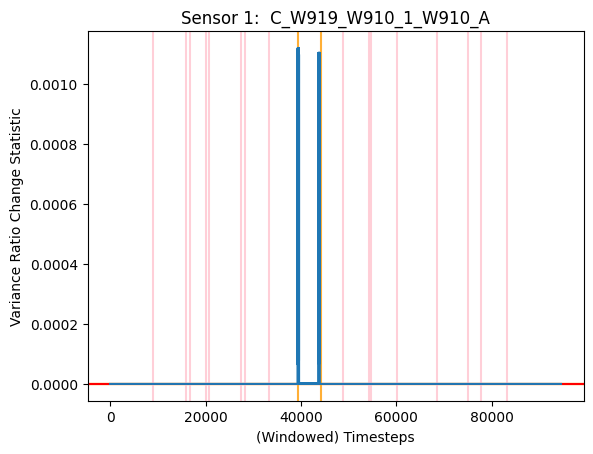

***********************************************************************************************
Sensor 2:  C_W919_W910_1_W910_B
DD = 4


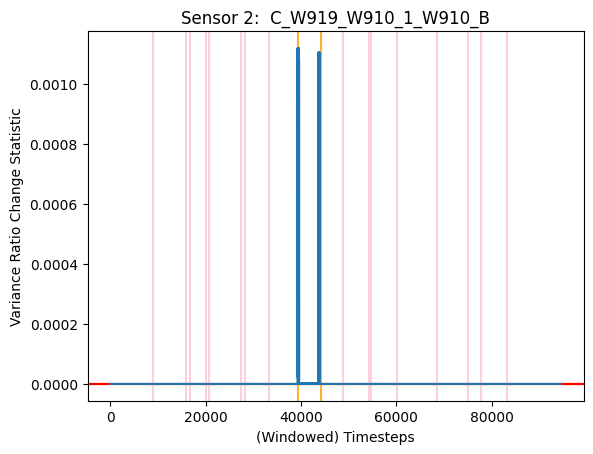

***********************************************************************************************
Sensor 3:  C_W919_W910_1_W910_C
DD = 4
DD = 4


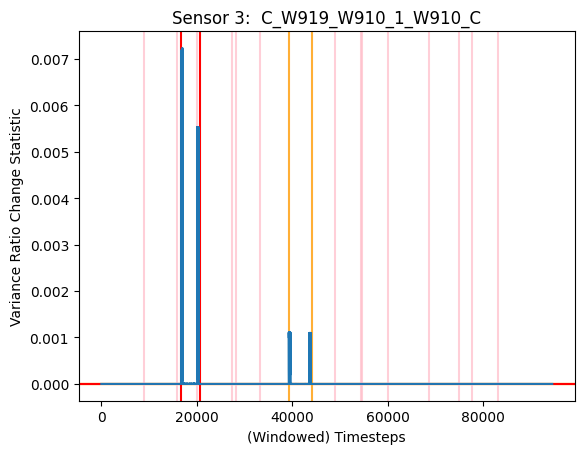

***********************************************************************************************
Sensor 4:  V_W-115KV2_AN
DD = 4
DD = 4


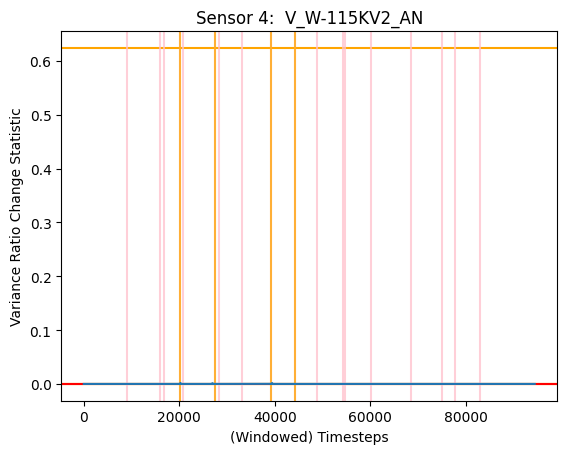

***********************************************************************************************
Sensor 5:  V_W-115KV2_BN
DD = 4
DD = 4


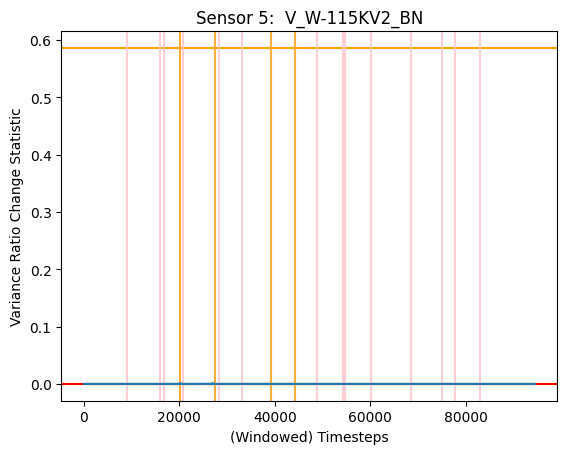

***********************************************************************************************
Sensor 6:  V_W-115KV2_CN
DD = 4
DD = 4


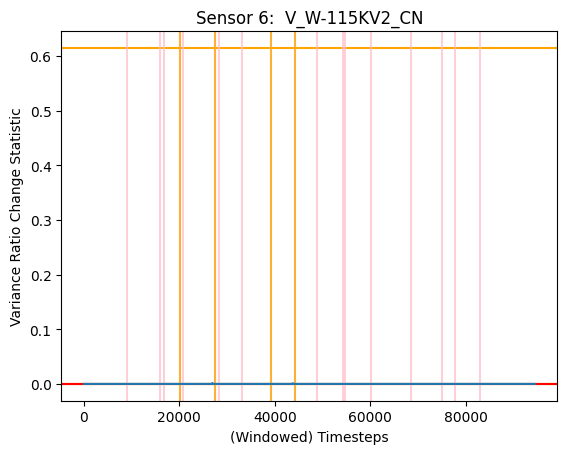

***********************************************************************************************
Sensor 7:  C_W957_W950_1_W950_A
DD = None


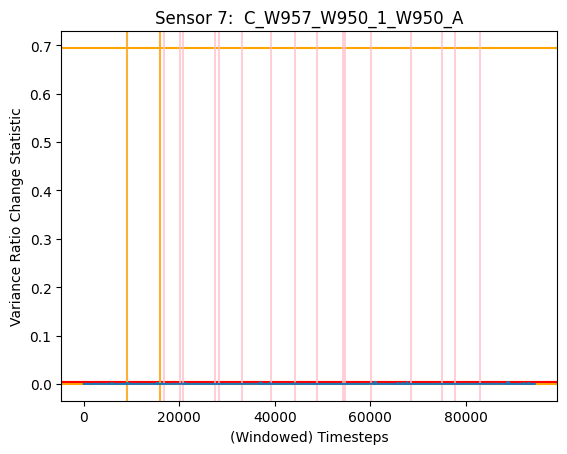

***********************************************************************************************
Sensor 8:  C_W957_W950_1_W950_B
DD = None


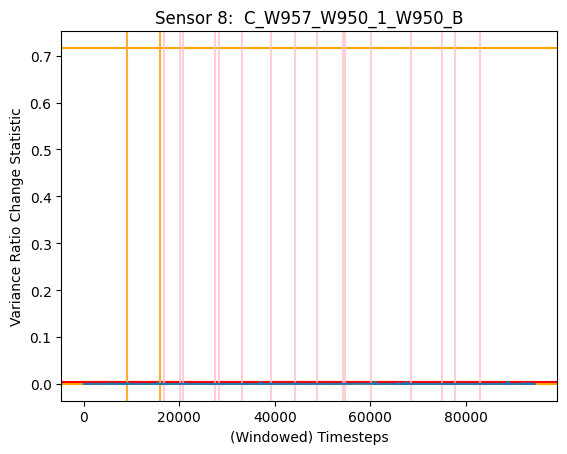

***********************************************************************************************
Sensor 9:  C_W957_W950_1_W950_C
DD = None


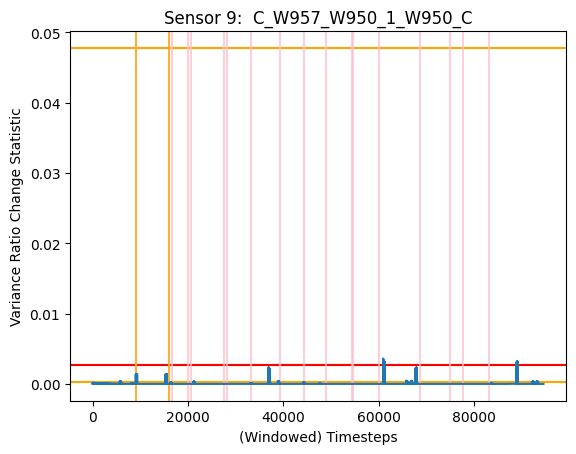

***********************************************************************************************
Sensor 10:  V_W951_AN
DD = 4
DD = 4
DD = 4


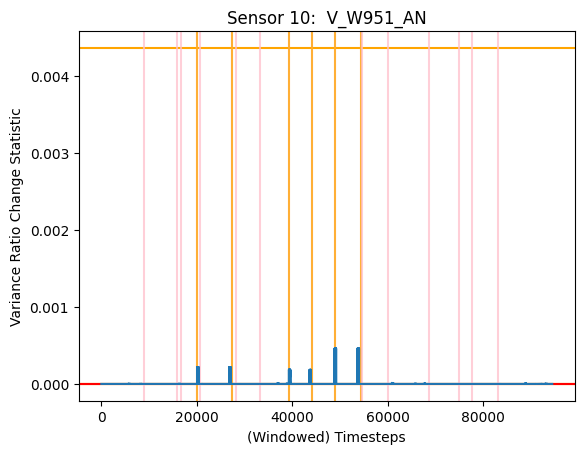

***********************************************************************************************
Sensor 11:  V_W951_BN
DD = 4
DD = 4
DD = 4


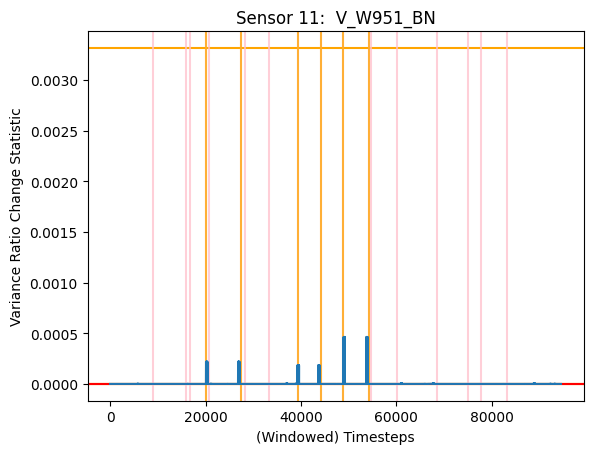

***********************************************************************************************
Sensor 12:  V_W951_CN
DD = 4
DD = 4
DD = 4


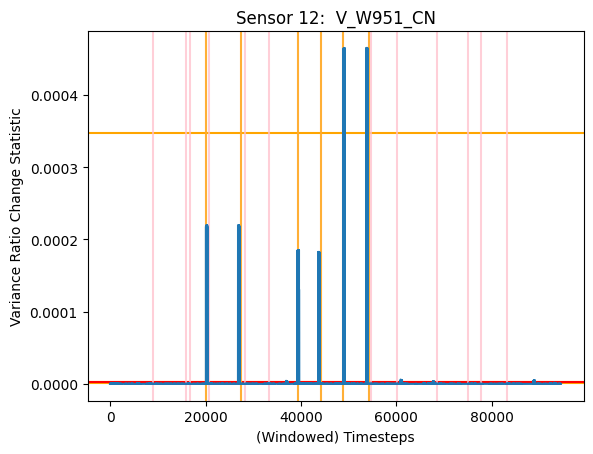

***********************************************************************************************
Sensor 13:  C_W957_W950_1_W957_A
DD = 4


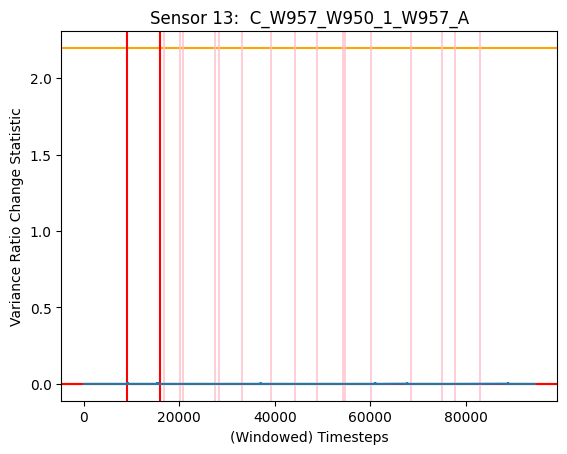

***********************************************************************************************
Sensor 14:  C_W957_W950_1_W957_B
DD = 22


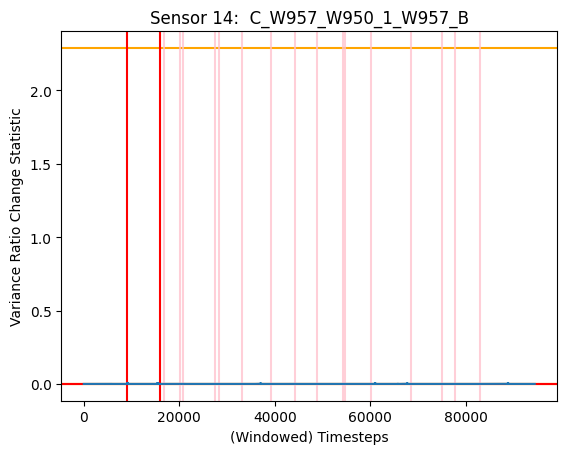

***********************************************************************************************
Sensor 15:  C_W957_W950_1_W957_C
DD = 9


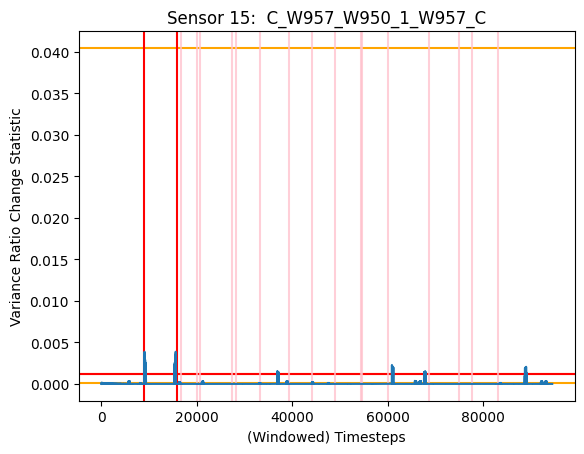

***********************************************************************************************
Sensor 16:  C_W927_W929_1_W929_A


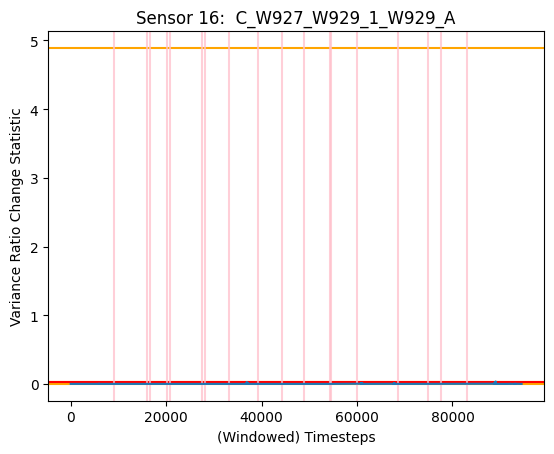

***********************************************************************************************
Sensor 17:  C_W927_W929_1_W929_B


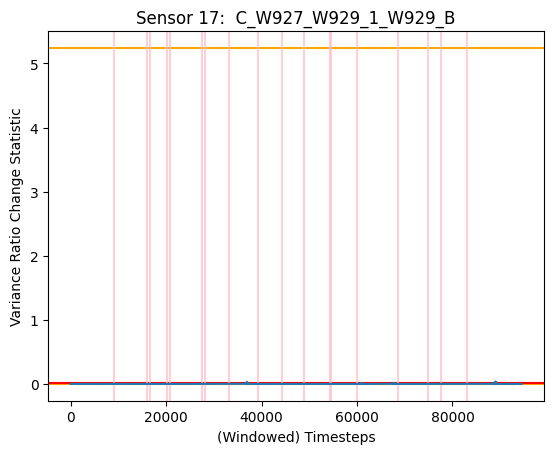

***********************************************************************************************
Sensor 18:  C_W927_W929_1_W929_C


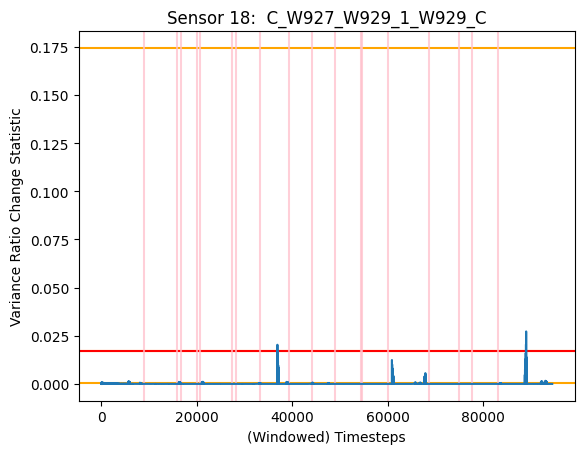

***********************************************************************************************
Sensor 19:  V_W-115KV1_AN
DD = 4
DD = 4


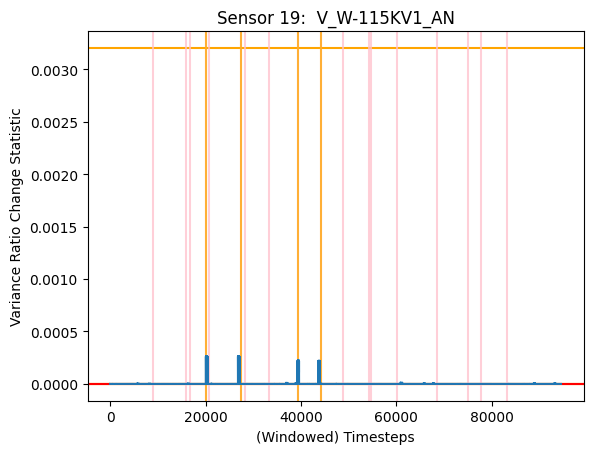

***********************************************************************************************
Sensor 20:  V_W-115KV1_BN
DD = 4
DD = 4


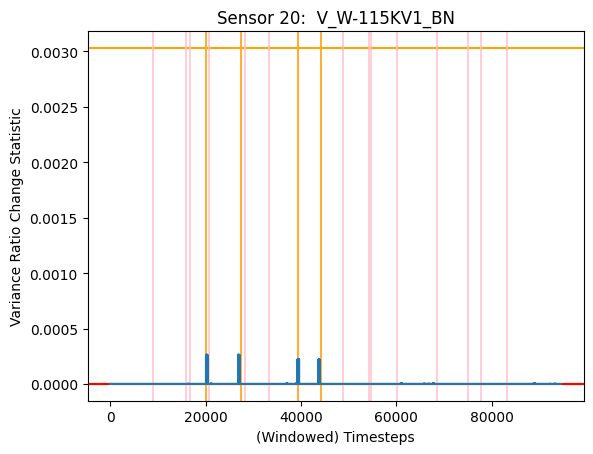

***********************************************************************************************
Sensor 21:  V_W-115KV1_CN
DD = 4
DD = 4


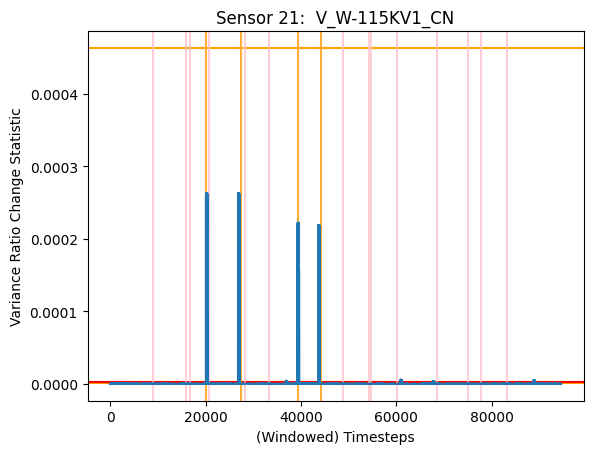

***********************************************************************************************
Sensor 22:  C_W927_W929_1_W927_A


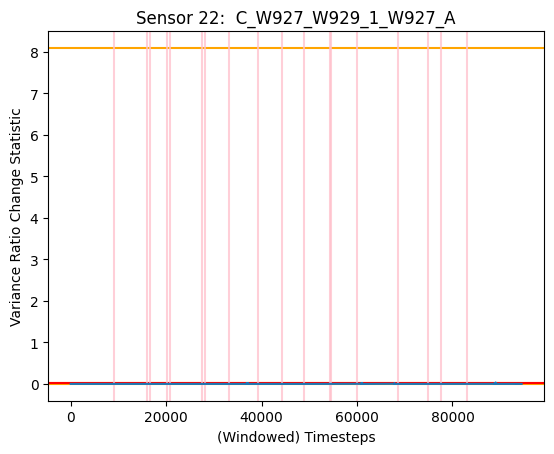

***********************************************************************************************
Sensor 23:  C_W927_W929_1_W927_B


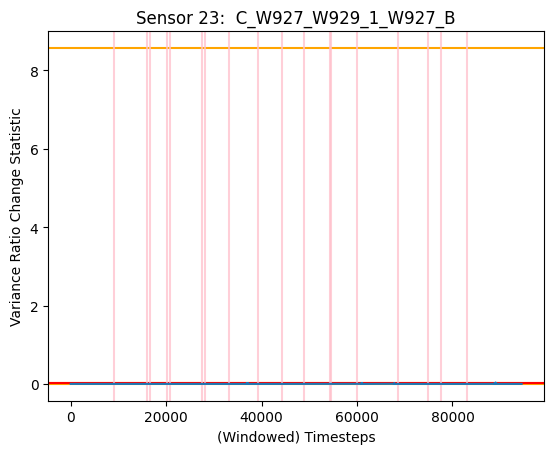

***********************************************************************************************
Sensor 24:  C_W927_W929_1_W927_C


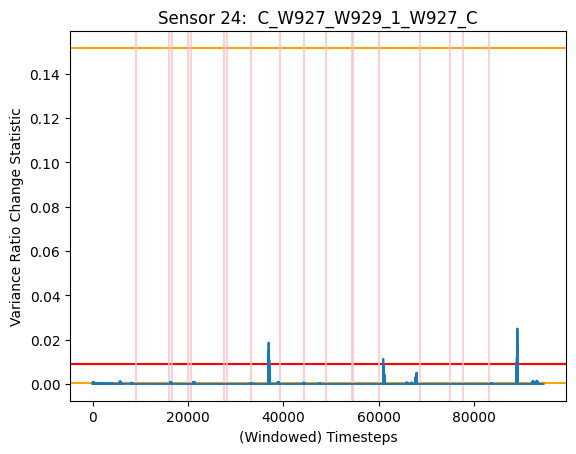

***********************************************************************************************
Sensor 25:  C_W919_W910_1_W919_A
DD = 11


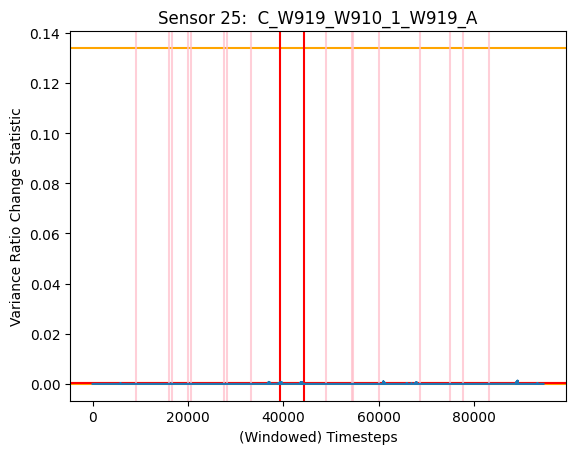

***********************************************************************************************
Sensor 26:  C_W919_W910_1_W919_B
DD = 4


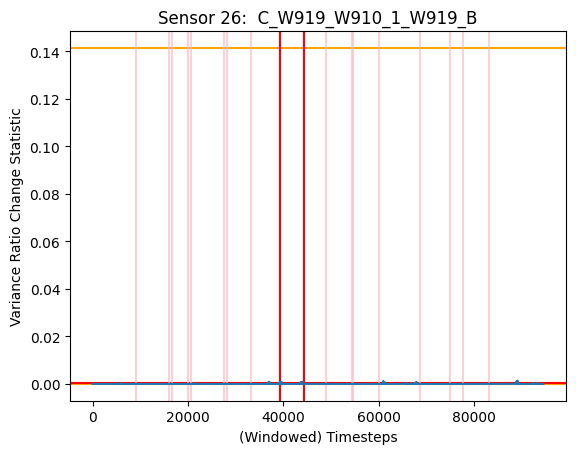

***********************************************************************************************
Sensor 27:  C_W919_W910_1_W919_C
DD = 4
DD = 4


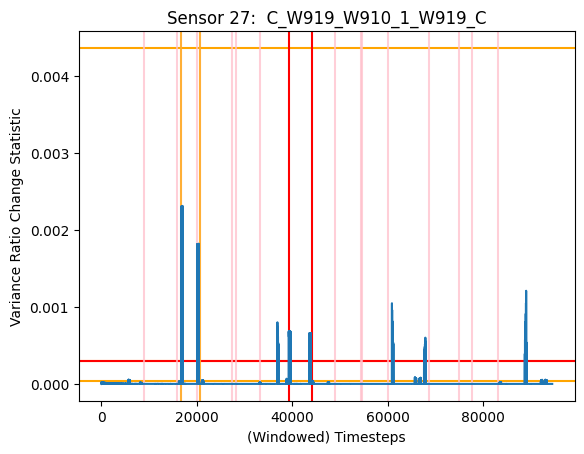

***********************************************************************************************
Sensor 28:  V_W911_AN
DD = 4
DD = 4


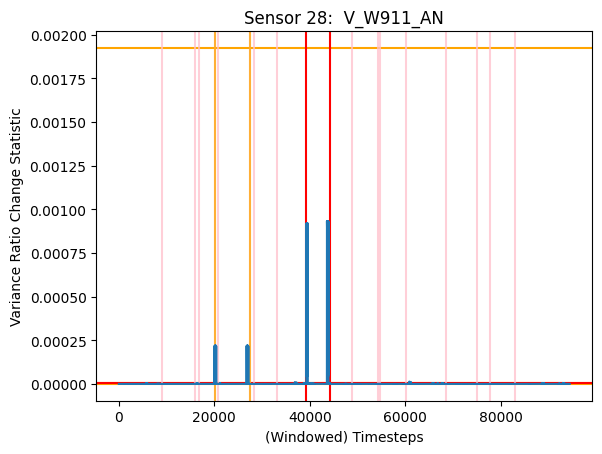

***********************************************************************************************
Sensor 29:  V_W911_BN
DD = 4
DD = 4


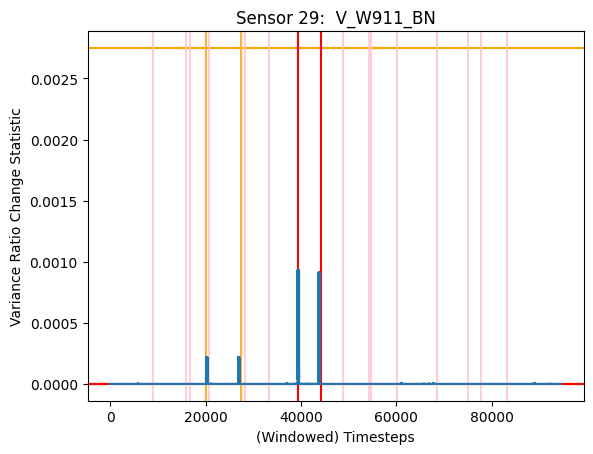

***********************************************************************************************
Sensor 30:  V_W911_CN
DD = 4
DD = 4


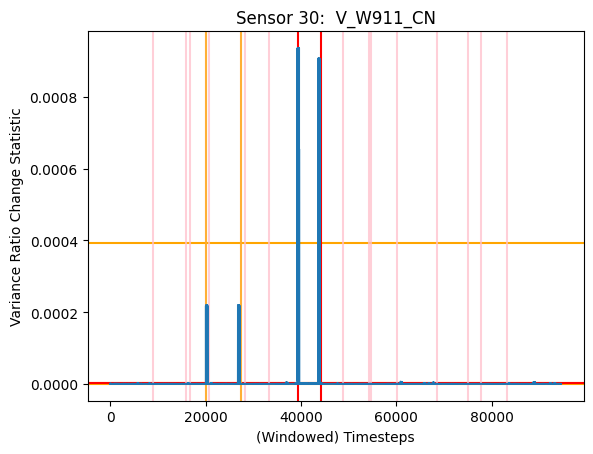

***********************************************************************************************
Sensor 31:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


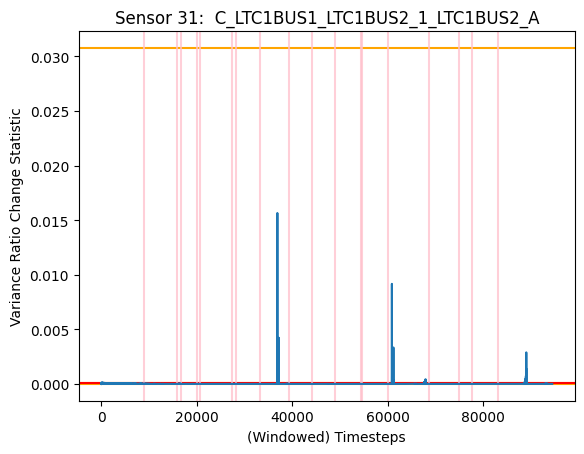

***********************************************************************************************
Sensor 32:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B


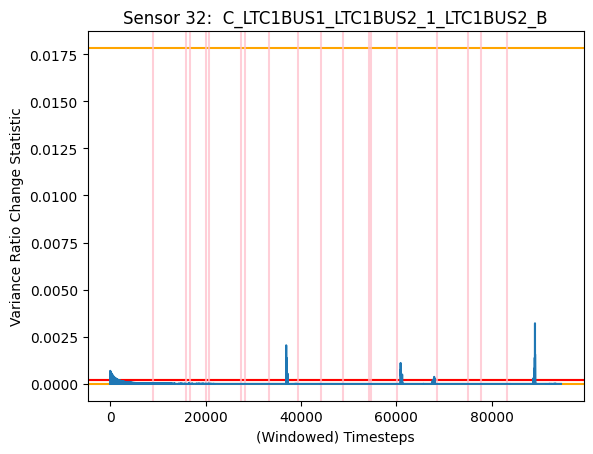

***********************************************************************************************
Sensor 33:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C
DD = None


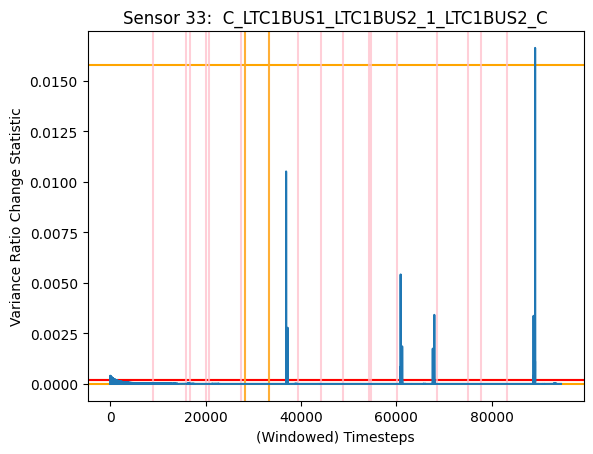

***********************************************************************************************
Sensor 34:  V_BUS13KV1_AN
DD = 4


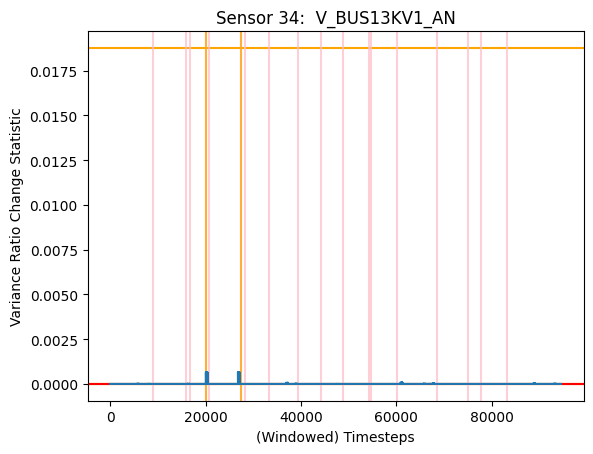

***********************************************************************************************
Sensor 35:  V_BUS13KV1_BN
DD = 4


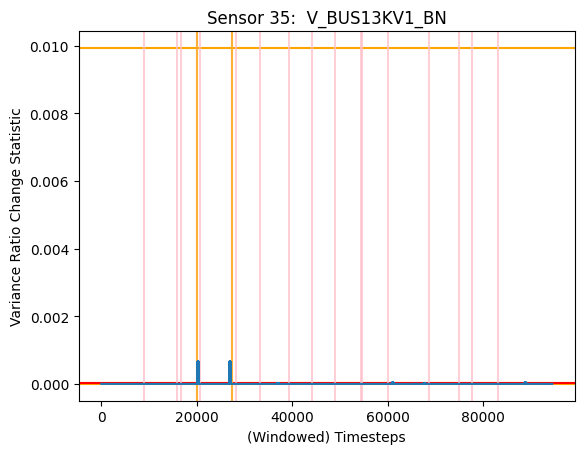

***********************************************************************************************
Sensor 36:  V_BUS13KV1_CN
DD = 4
DD = 10


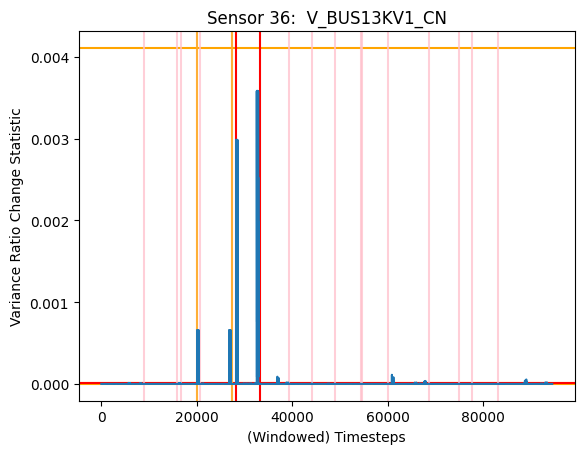

***********************************************************************************************
Sensor 37:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A
DD = None


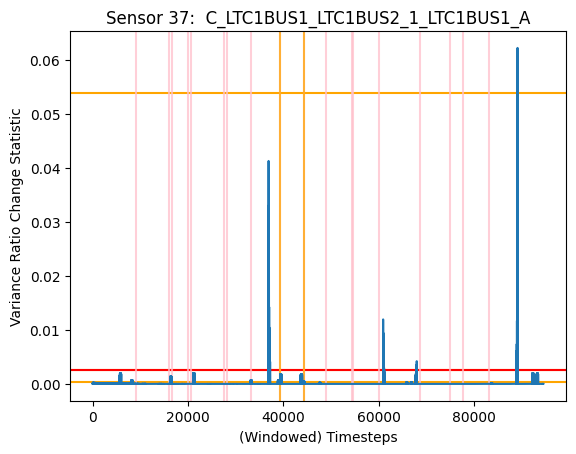

***********************************************************************************************
Sensor 38:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
DD = None


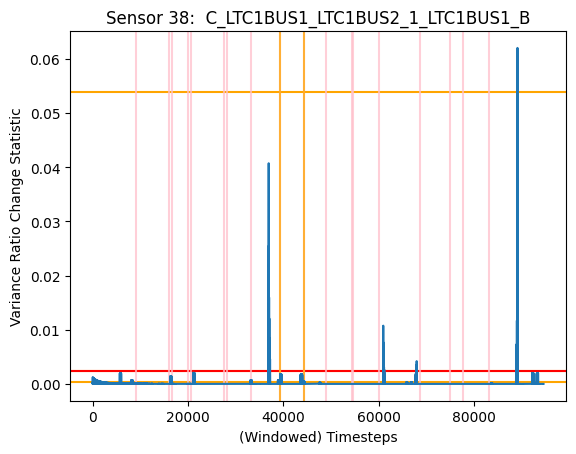

***********************************************************************************************
Sensor 39:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C
DD = None


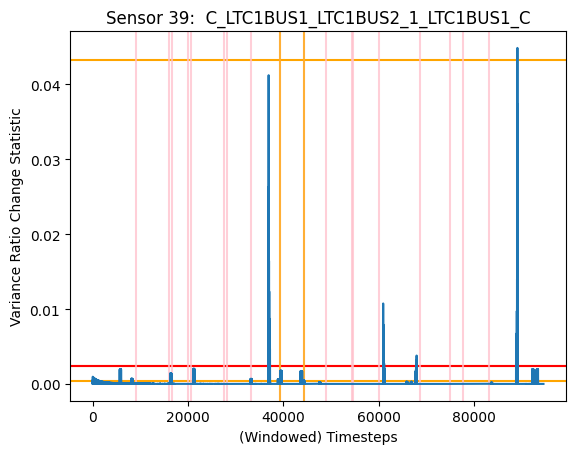

***********************************************************************************************
Sensor 40:  V_W9111_AN
DD = 4
DD = 4


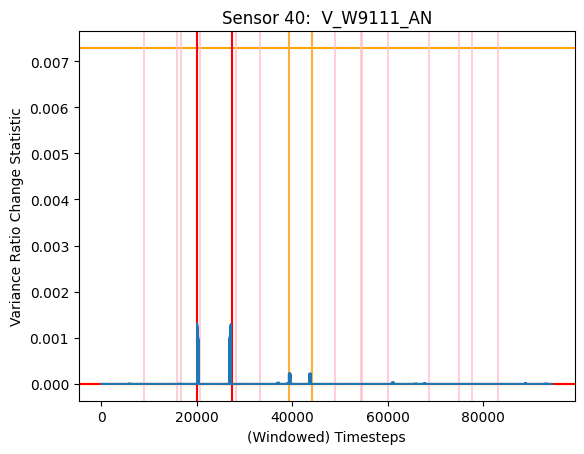

***********************************************************************************************
Sensor 41:  V_W9111_BN
DD = 4
DD = 4


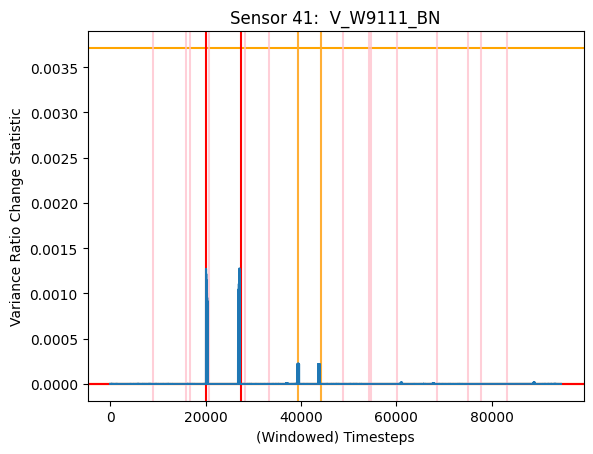

***********************************************************************************************
Sensor 42:  V_W9111_CN
DD = 4
DD = 10
DD = 4


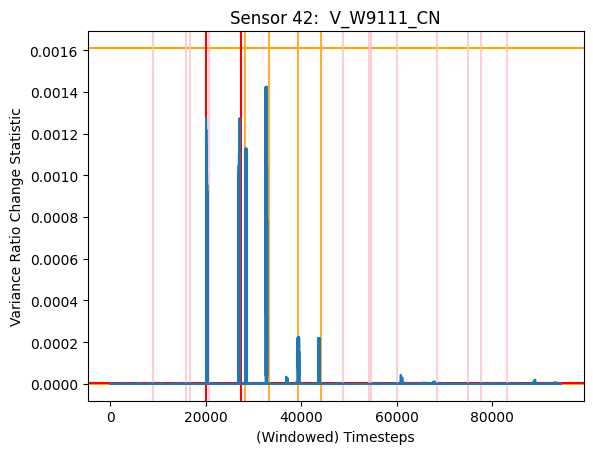

***********************************************************************************************
Sensor 43:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A


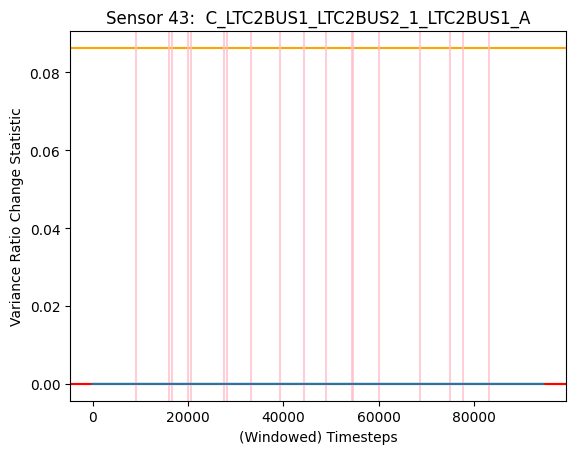

***********************************************************************************************
Sensor 44:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B


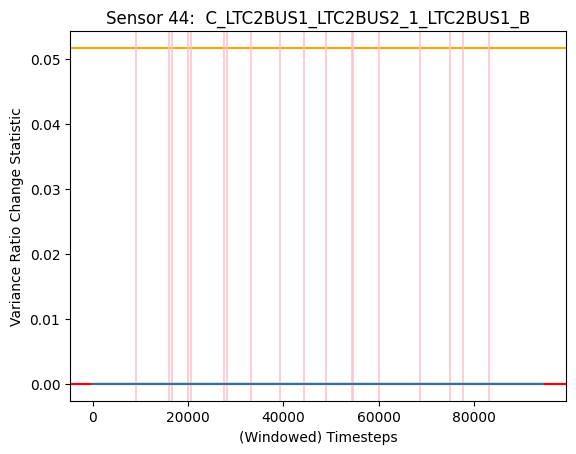

***********************************************************************************************
Sensor 45:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C


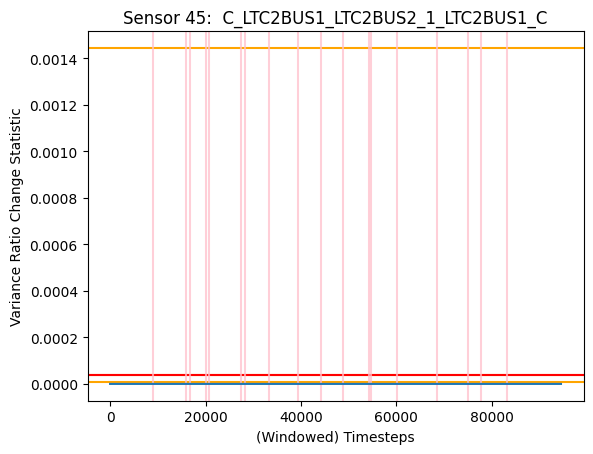

***********************************************************************************************
Sensor 46:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
DD = 9


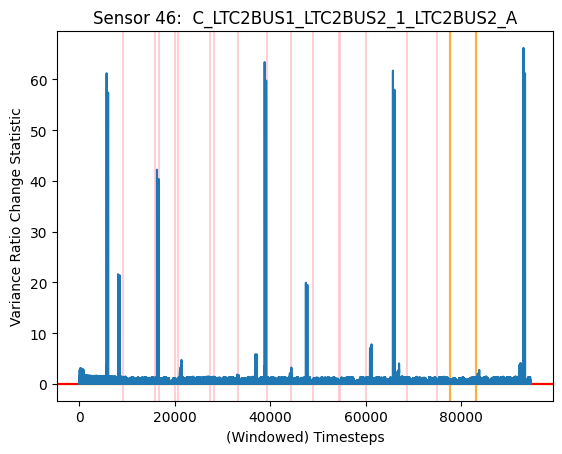

***********************************************************************************************
Sensor 47:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
DD = 4


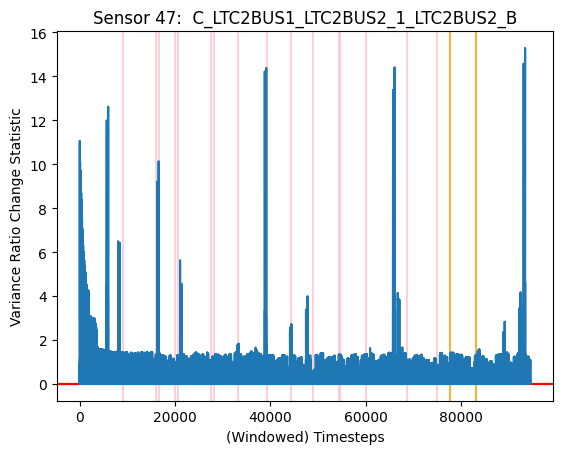

***********************************************************************************************
Sensor 48:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
DD = 4


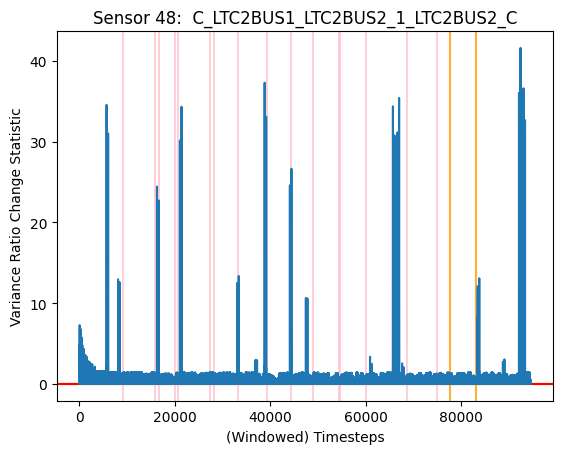

***********************************************************************************************
Sensor 49:  V_BUS13KV2_AN
DD = 11


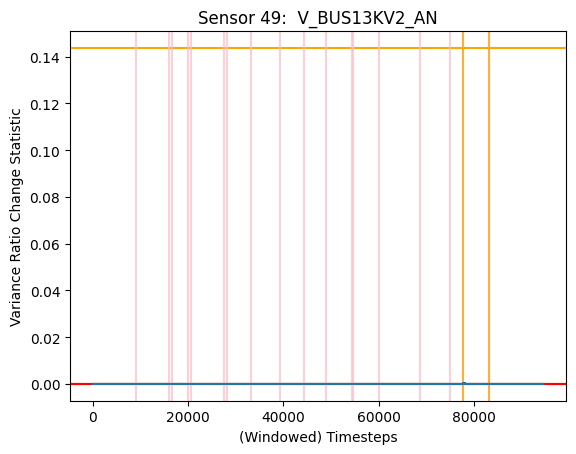

***********************************************************************************************
Sensor 50:  V_BUS13KV2_BN
DD = 14


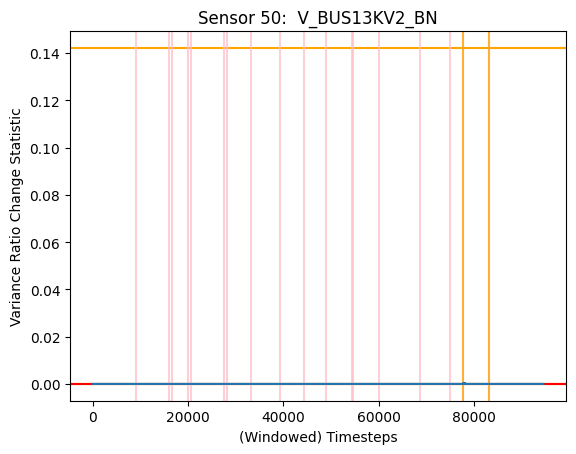

***********************************************************************************************
Sensor 51:  V_BUS13KV2_CN
DD = 11


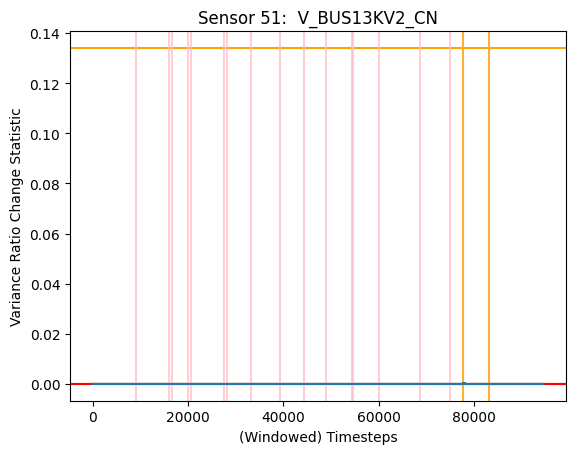

***********************************************************************************************
Sensor 52:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_A
DD = None


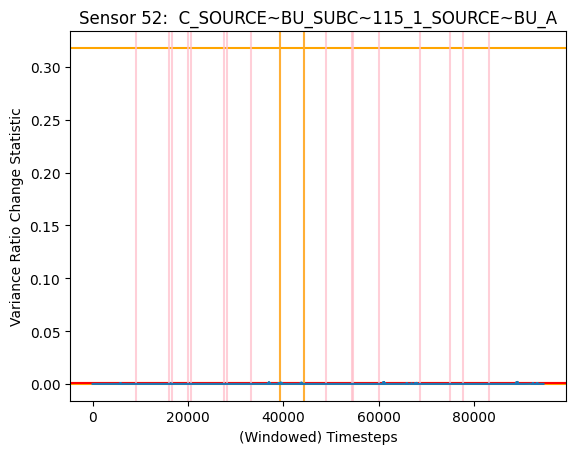

***********************************************************************************************
Sensor 53:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_B
DD = 22


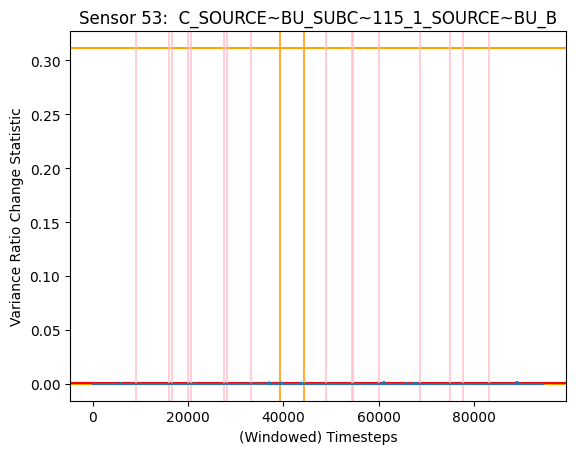

***********************************************************************************************
Sensor 54:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_C
DD = 9


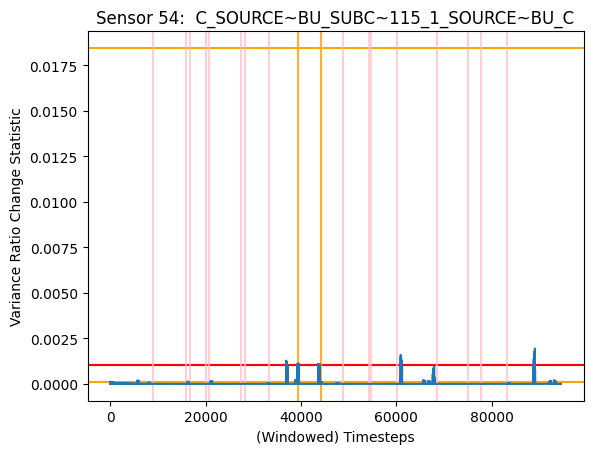

***********************************************************************************************
Sensor 55:  V_SOURCE-BU_AN
DD = 4


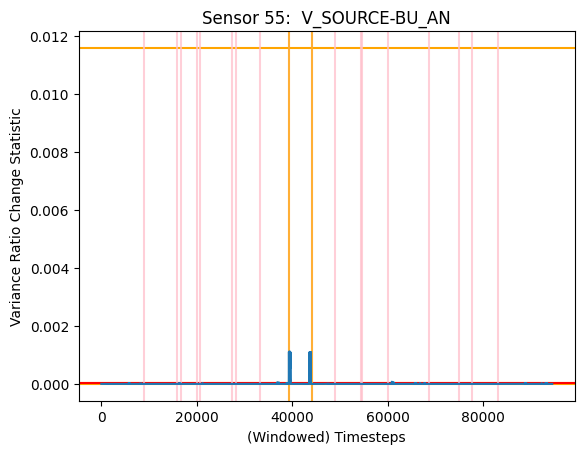

***********************************************************************************************
Sensor 56:  V_SOURCE-BU_BN
DD = 4


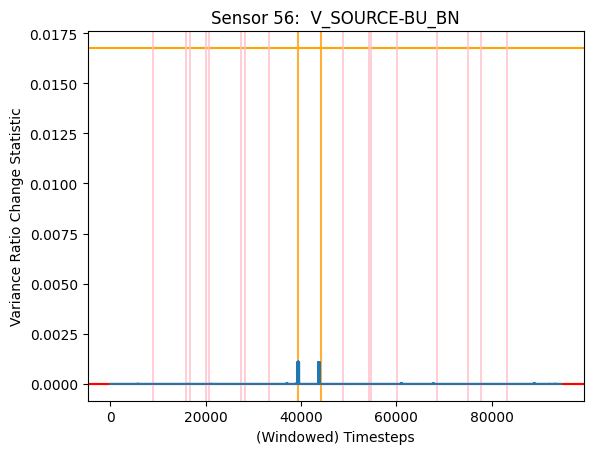

***********************************************************************************************
Sensor 57:  V_SOURCE-BU_CN
DD = 4


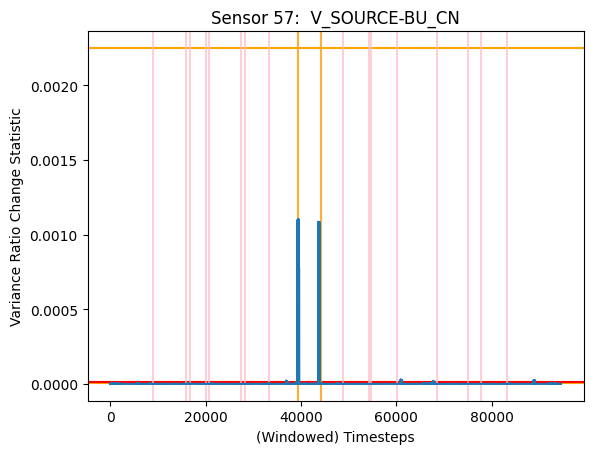

***********************************************************************************************
Sensor 58:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_A
DD = 4


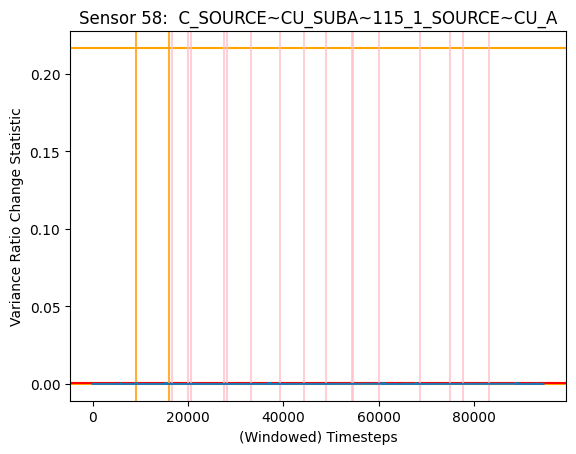

***********************************************************************************************
Sensor 59:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_B
DD = 26


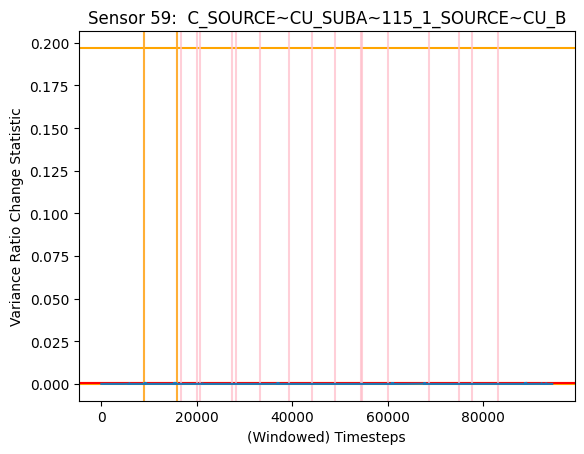

***********************************************************************************************
Sensor 60:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_C
DD = 13


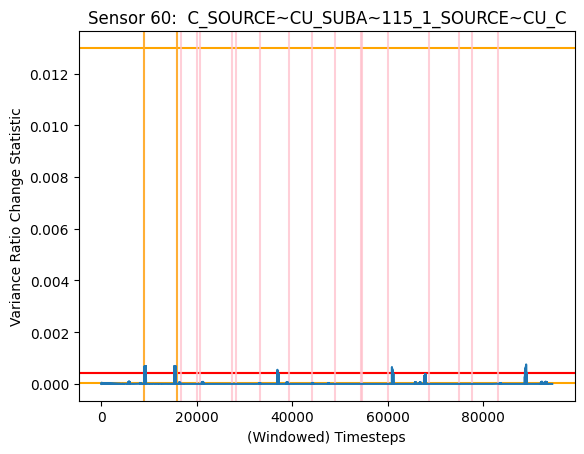

***********************************************************************************************
Sensor 61:  V_SOURCE-CU_AN


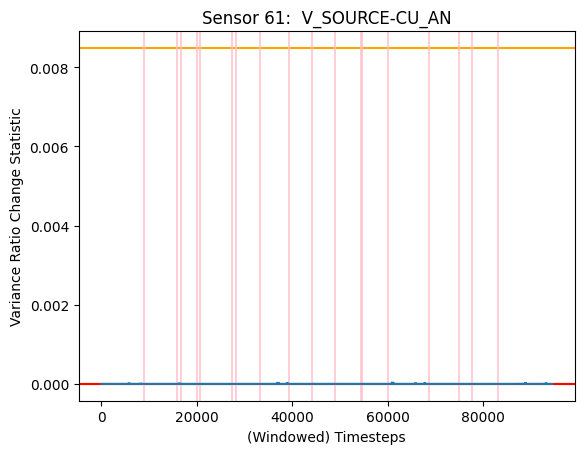

***********************************************************************************************
Sensor 62:  V_SOURCE-CU_BN


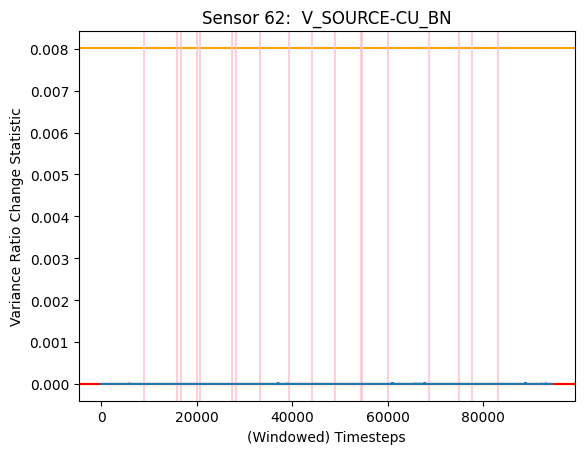

***********************************************************************************************
Sensor 63:  V_SOURCE-CU_CN


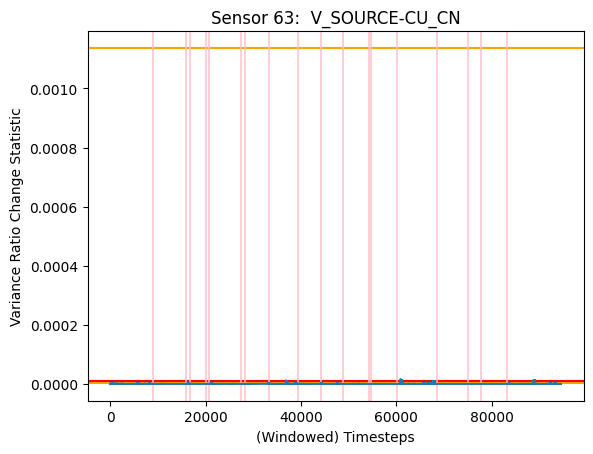

***********************************************************************************************
Sensor 64:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_A


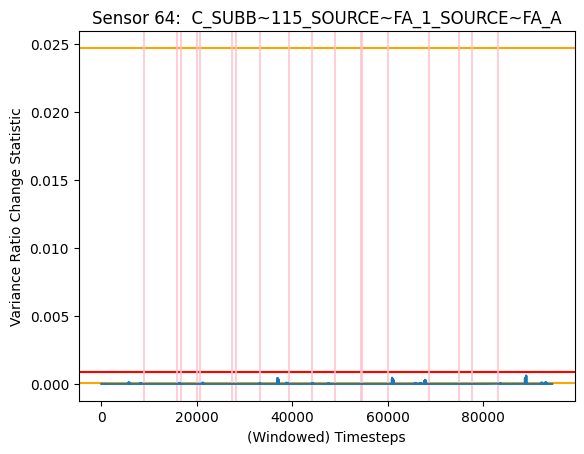

***********************************************************************************************
Sensor 65:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_B


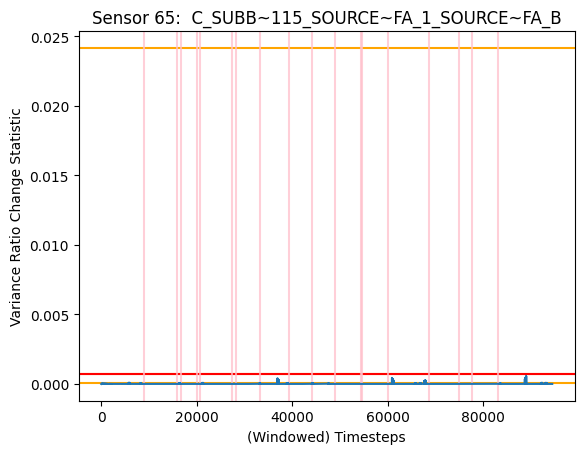

***********************************************************************************************
Sensor 66:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_C


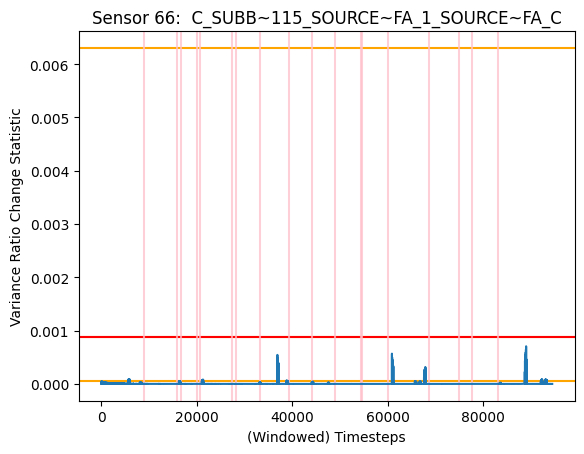

***********************************************************************************************
Sensor 67:  V_SOURCE-FA_AN
DD = 4


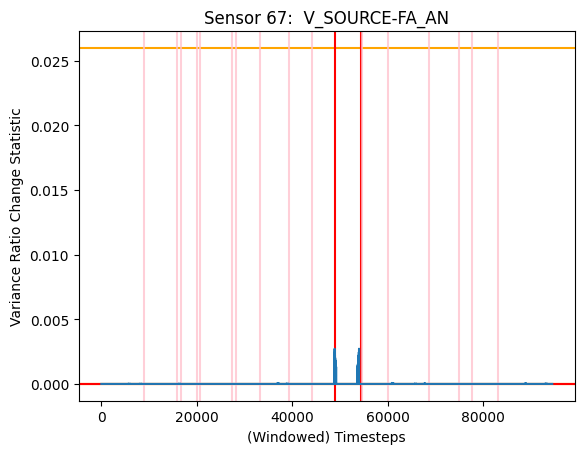

***********************************************************************************************
Sensor 68:  V_SOURCE-FA_BN
DD = 4


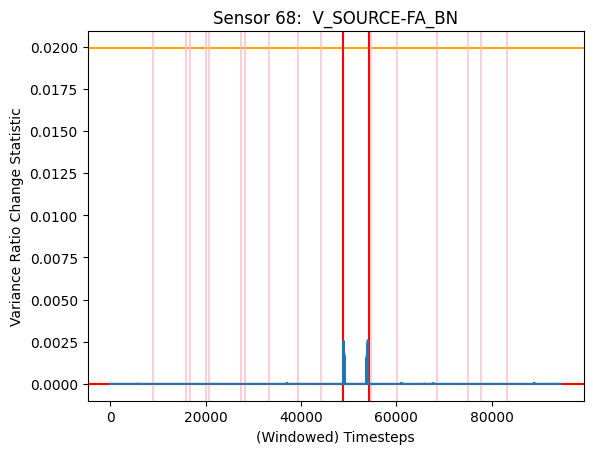

***********************************************************************************************
Sensor 69:  V_SOURCE-FA_CN
DD = 4


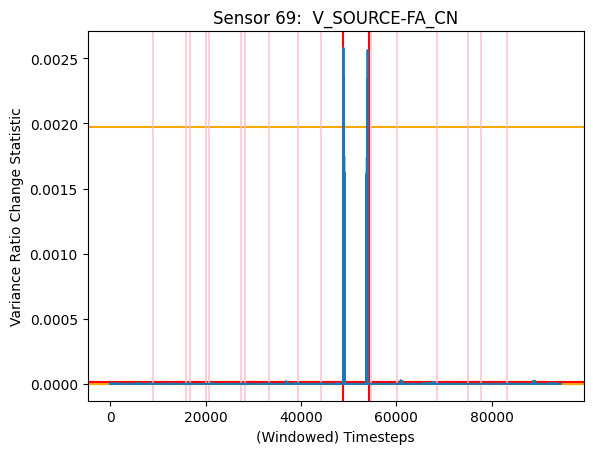

***********************************************************************************************
Sensor 70:  C_W738_W737_2_W737_A


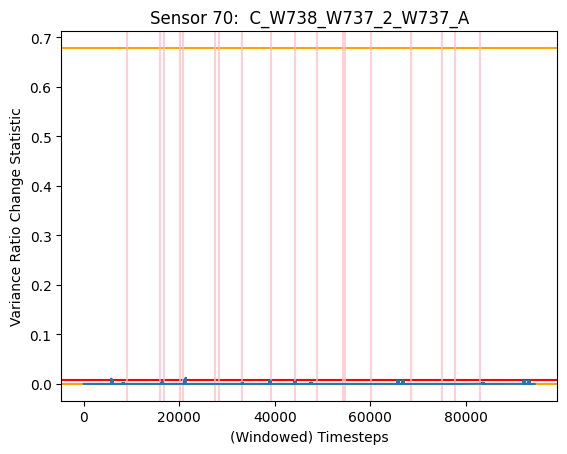

***********************************************************************************************
Sensor 71:  C_W738_W737_2_W737_B


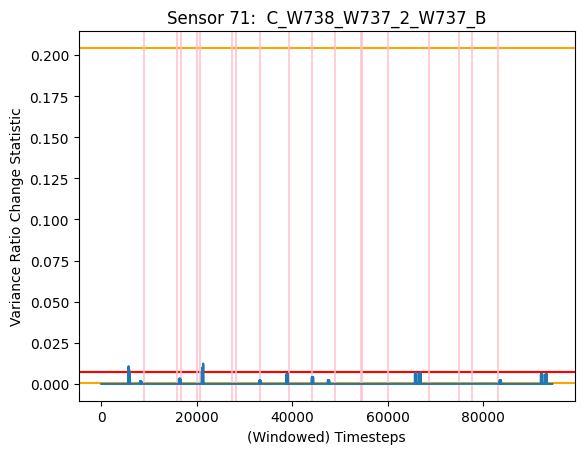

***********************************************************************************************
Sensor 72:  C_W738_W737_2_W737_C


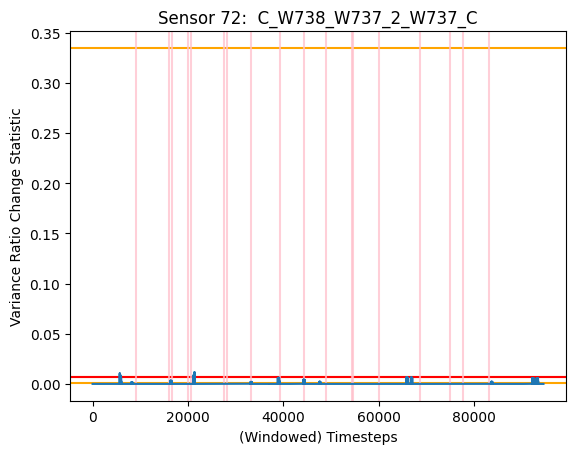

***********************************************************************************************
Sensor 73:  V_W738_AN


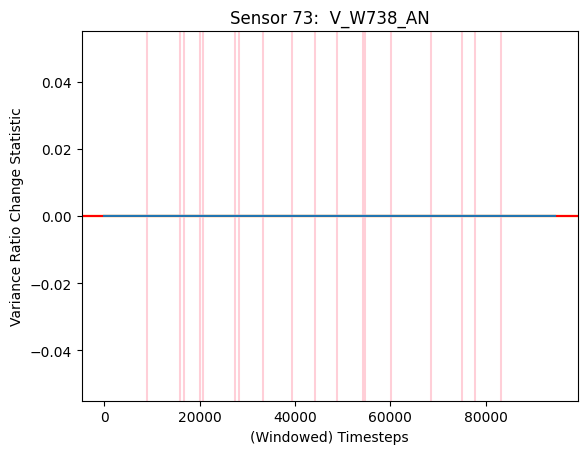

***********************************************************************************************
Sensor 74:  V_W738_BN


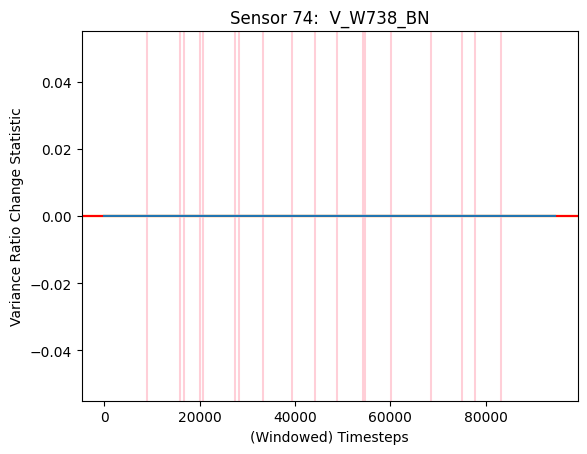

***********************************************************************************************
Sensor 75:  V_W738_CN


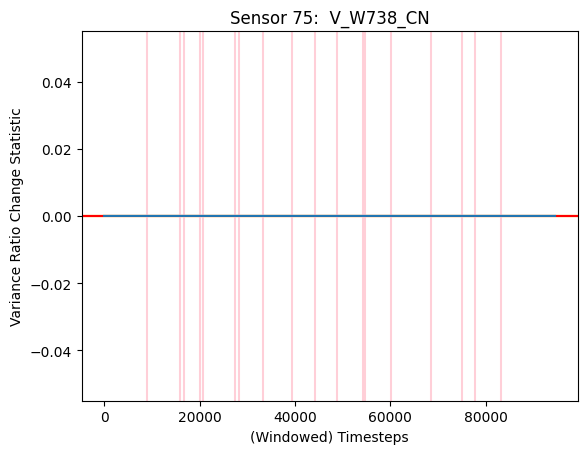

***********************************************************************************************
Sensor 76:  C_W747_W748_2_W747_A
DD = None


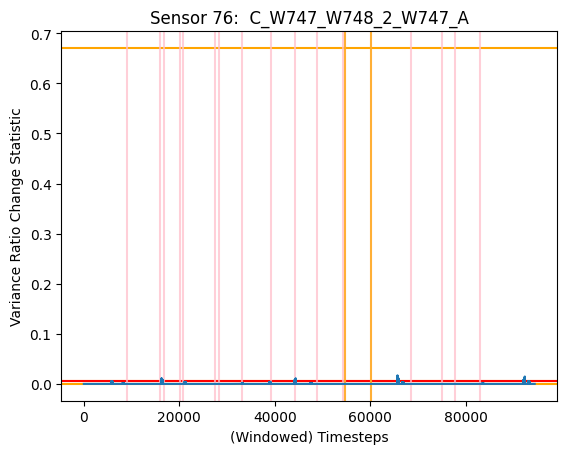

***********************************************************************************************
Sensor 77:  C_W747_W748_2_W747_B
DD = None


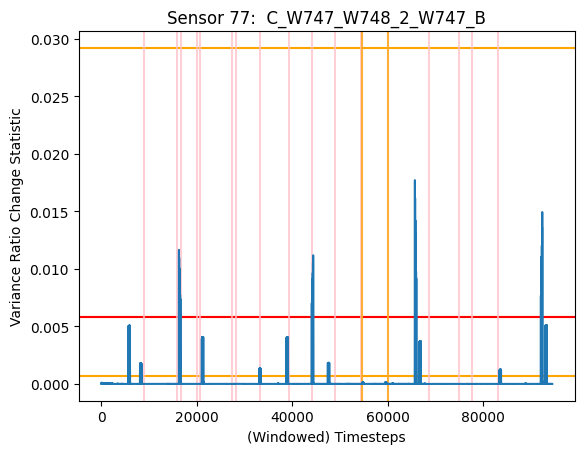

***********************************************************************************************
Sensor 78:  C_W747_W748_2_W747_C
DD = None


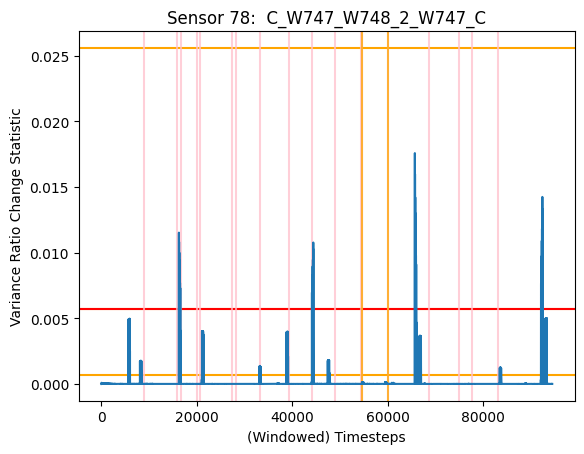

***********************************************************************************************
Sensor 79:  V_W748_AN


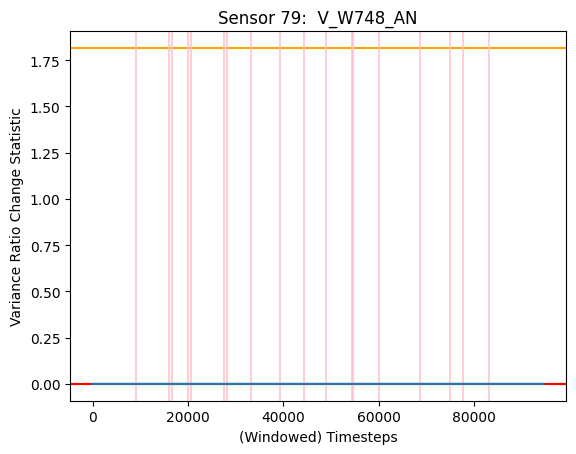

***********************************************************************************************
Sensor 80:  V_W748_BN


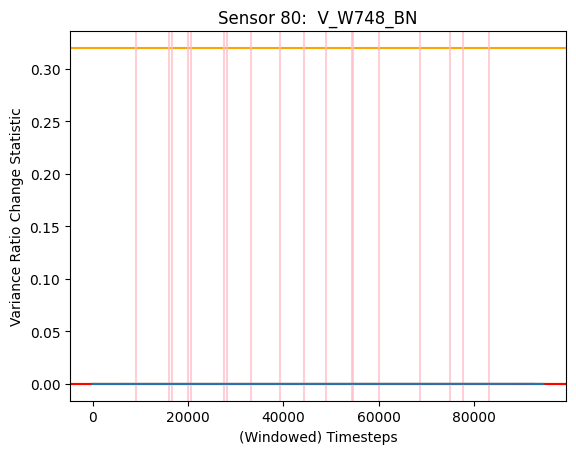

***********************************************************************************************
Sensor 81:  V_W748_CN


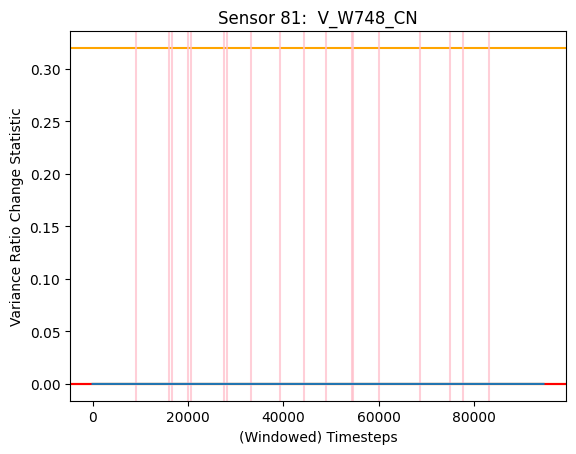

***********************************************************************************************
Sensor 82:  C_W787_W788_2_W787_A
DD = 14


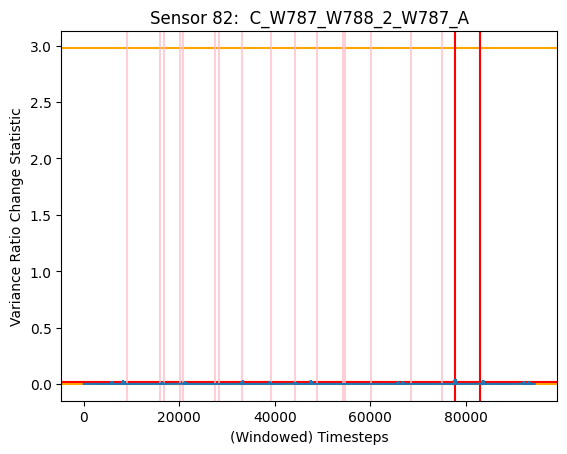

***********************************************************************************************
Sensor 83:  C_W787_W788_2_W787_B
DD = 20


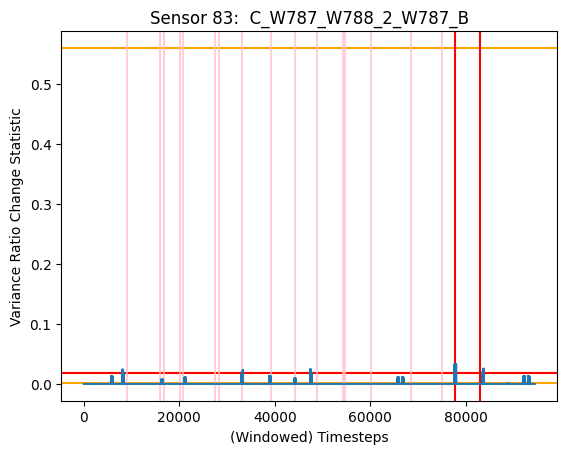

***********************************************************************************************
Sensor 84:  C_W787_W788_2_W787_C
DD = 11


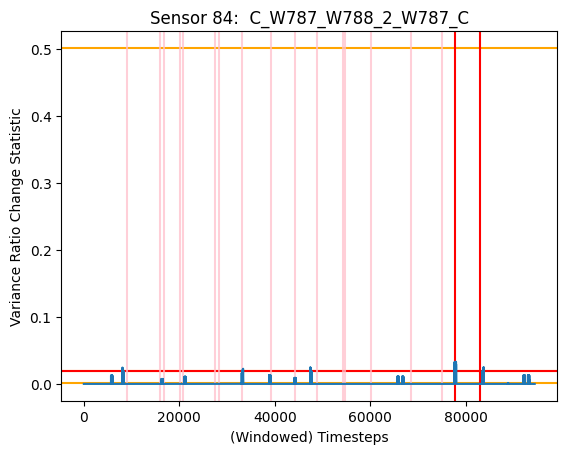

***********************************************************************************************
Sensor 85:  V_W788_AN
DD = 11


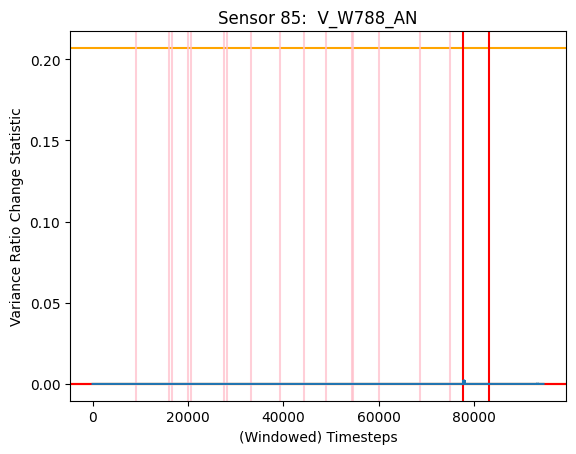

***********************************************************************************************
Sensor 86:  V_W788_BN
DD = 11


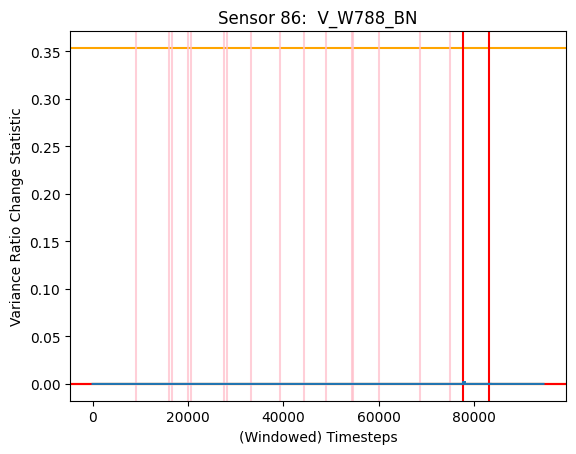

***********************************************************************************************
Sensor 87:  V_W788_CN
DD = 11


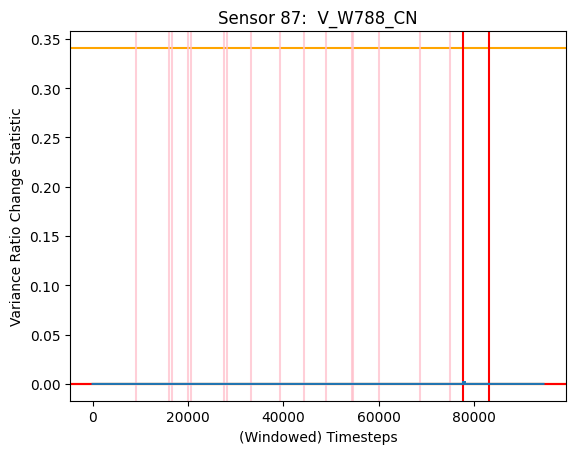

***********************************************************************************************
Sensor 88:  C_W797_W798_2_W797_A


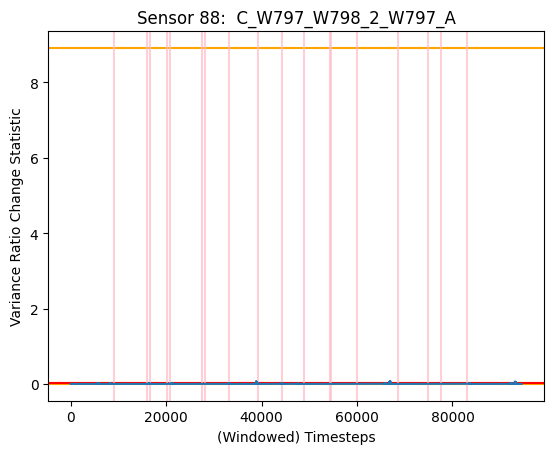

***********************************************************************************************
Sensor 89:  C_W797_W798_2_W797_B


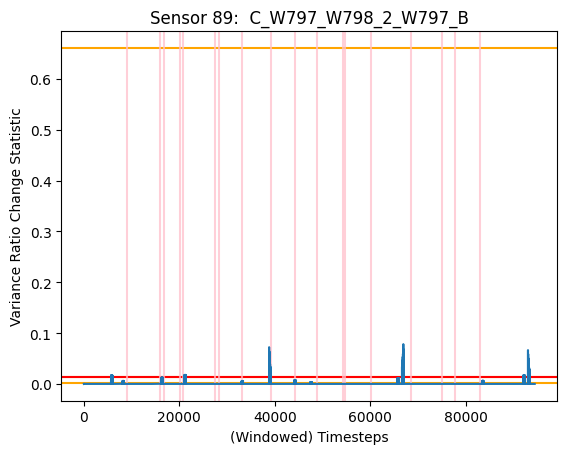

***********************************************************************************************
Sensor 90:  C_W797_W798_2_W797_C


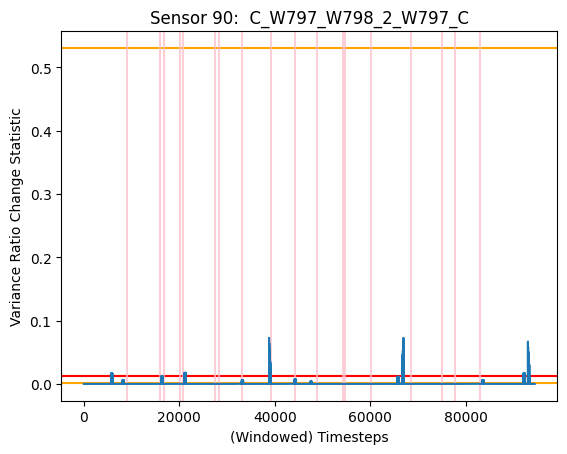

***********************************************************************************************
Sensor 91:  V_W798_AN


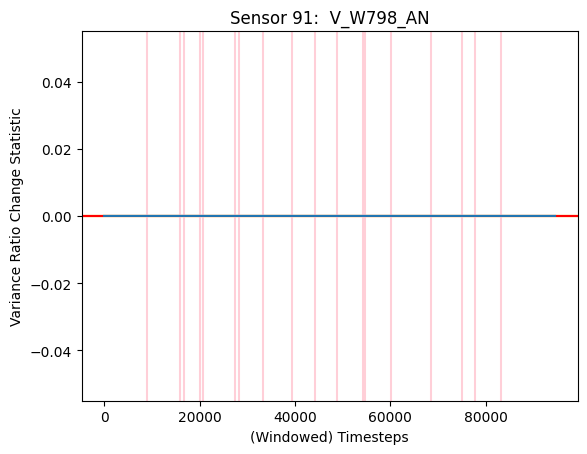

***********************************************************************************************
Sensor 92:  V_W798_BN


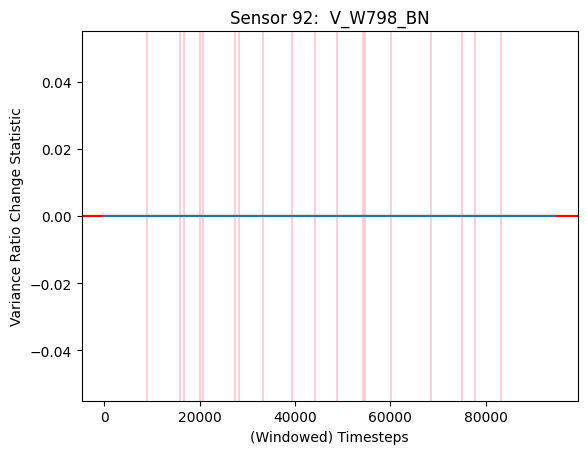

***********************************************************************************************
Sensor 93:  V_W798_CN


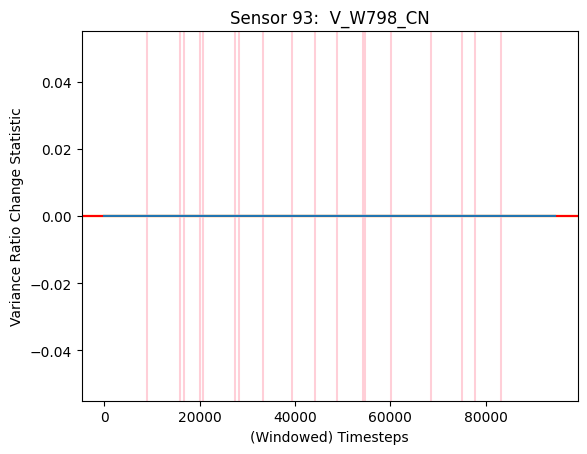

***********************************************************************************************
Sensor 94:  C_FD2B2_FD2B1_1_FD2B1_A
DD = 37


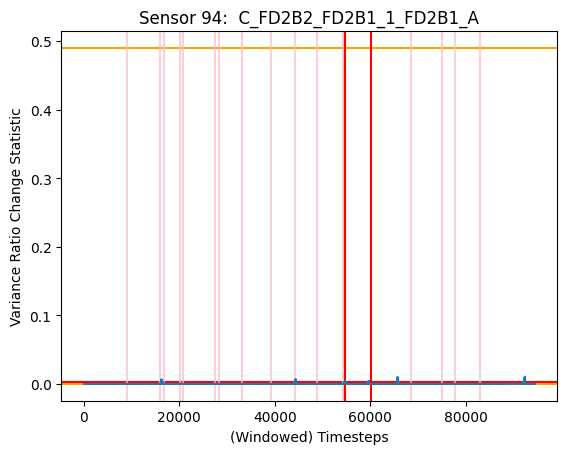

***********************************************************************************************
Sensor 95:  C_FD2B2_FD2B1_1_FD2B1_B
DD = 24


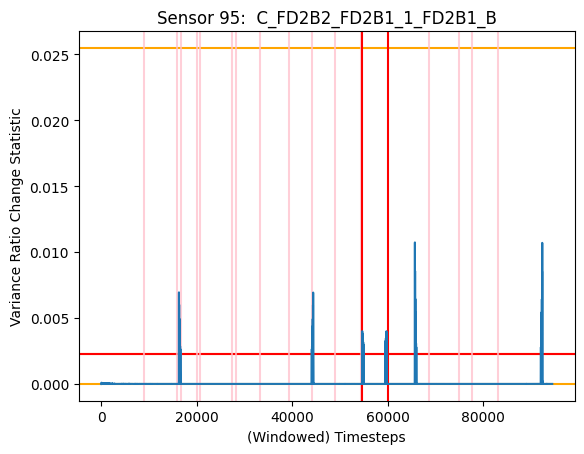

***********************************************************************************************
Sensor 96:  C_FD2B2_FD2B1_1_FD2B1_C
DD = 11
DD = 13


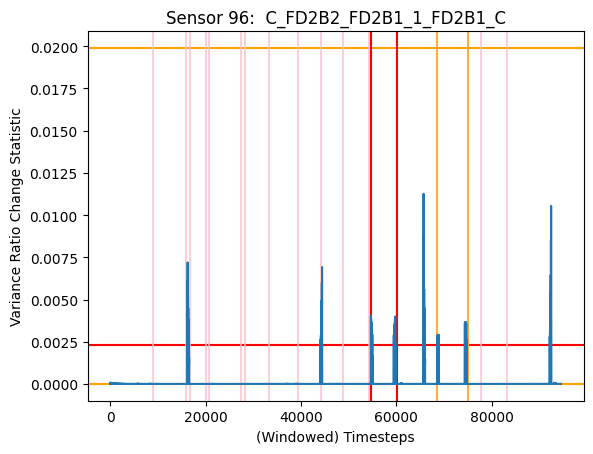

***********************************************************************************************
Sensor 97:  V_FD2B1_AN


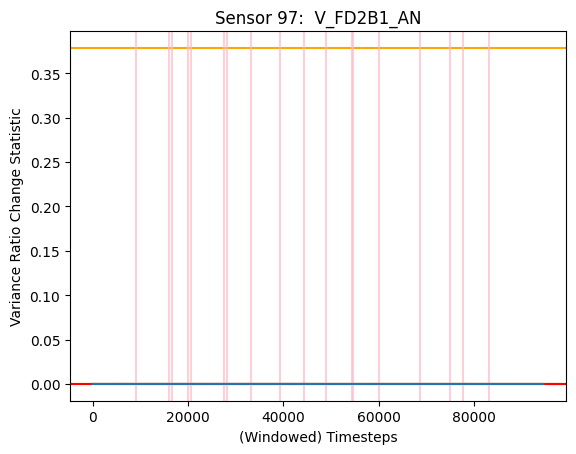

***********************************************************************************************
Sensor 98:  V_FD2B1_BN


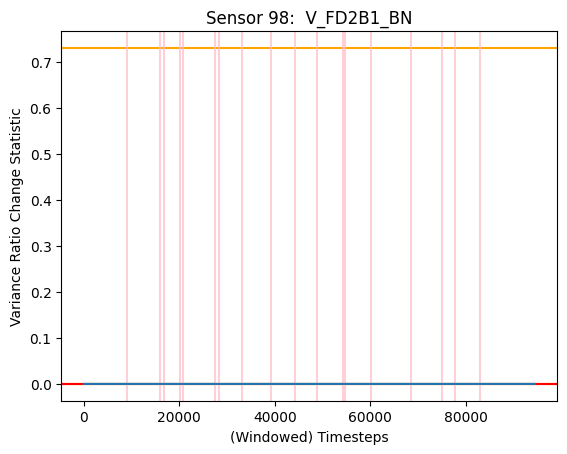

***********************************************************************************************
Sensor 99:  V_FD2B1_CN


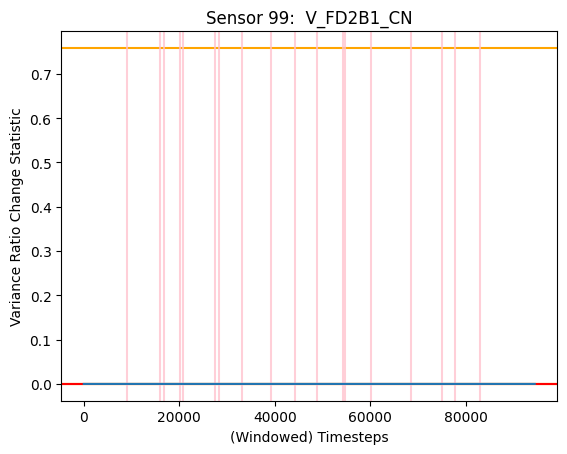

***********************************************************************************************
Sensor 100:  C_FD2B5_FD2B6_1_FD2B5_A
DD = 11


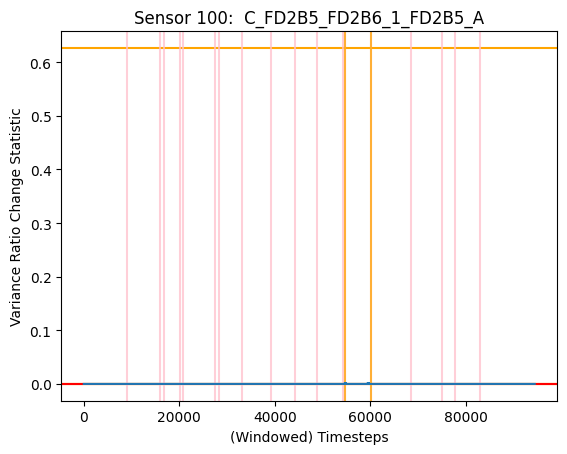

***********************************************************************************************
Sensor 101:  C_FD2B5_FD2B6_1_FD2B5_B
DD = 20


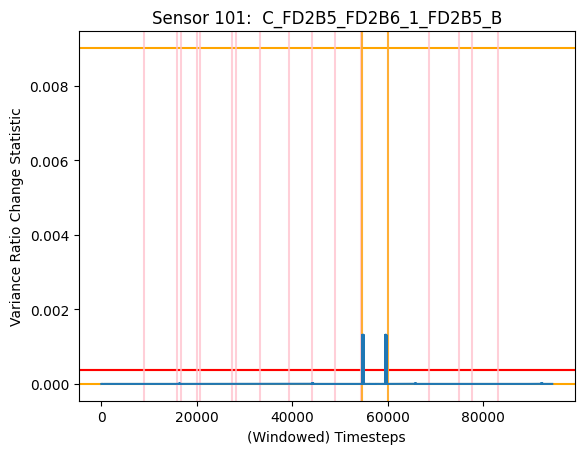

***********************************************************************************************
Sensor 102:  C_FD2B5_FD2B6_1_FD2B5_C
DD = 11
DD = 11


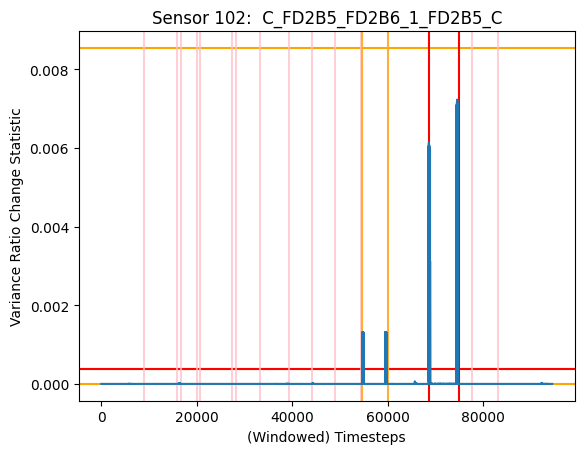

***********************************************************************************************
Sensor 103:  V_FD2B5_AN


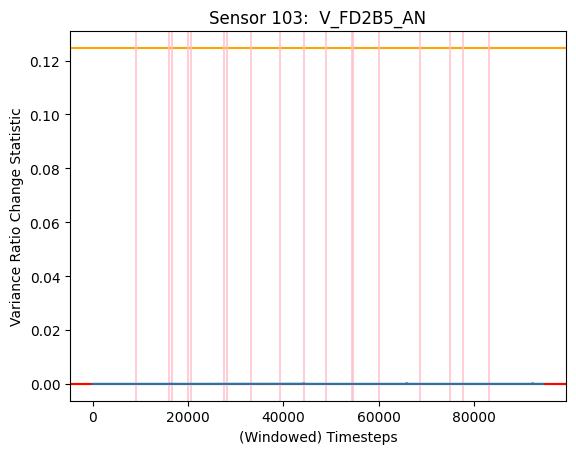

***********************************************************************************************
Sensor 104:  V_FD2B5_BN


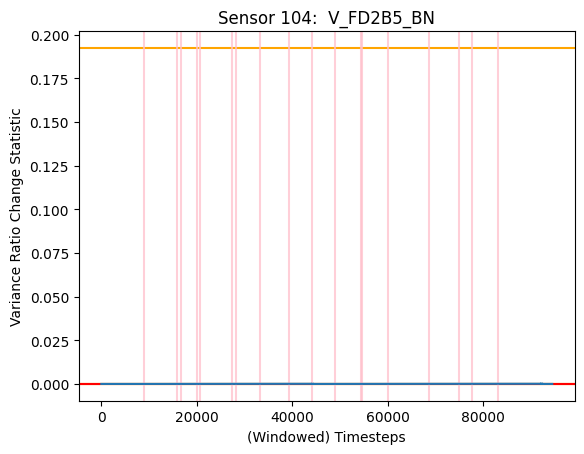

***********************************************************************************************
Sensor 105:  V_FD2B5_CN


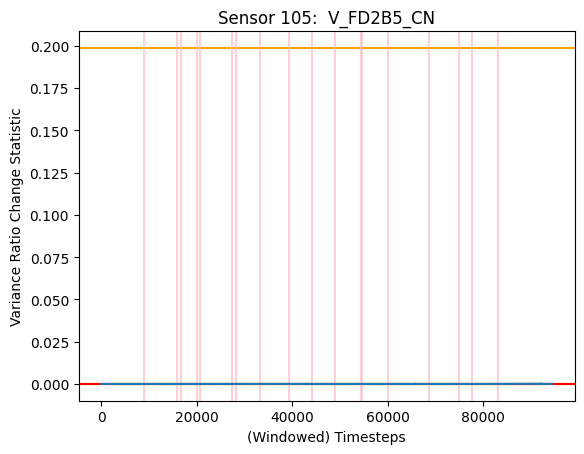

***********************************************************************************************
Sensor 106:  C_FD3B4_FD3B5_1_FD3B4_A
DD = 14


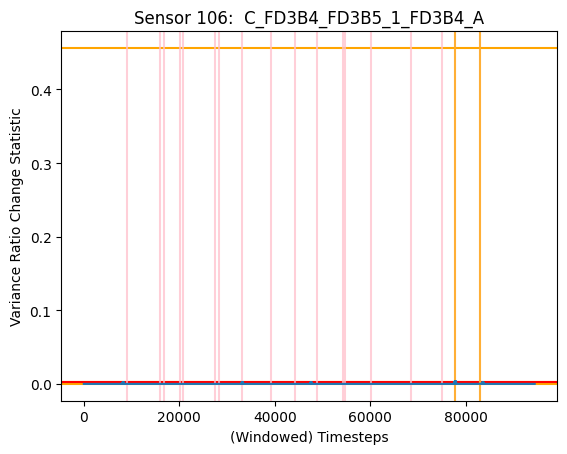

***********************************************************************************************
Sensor 107:  C_FD3B4_FD3B5_1_FD3B4_B
DD = 21


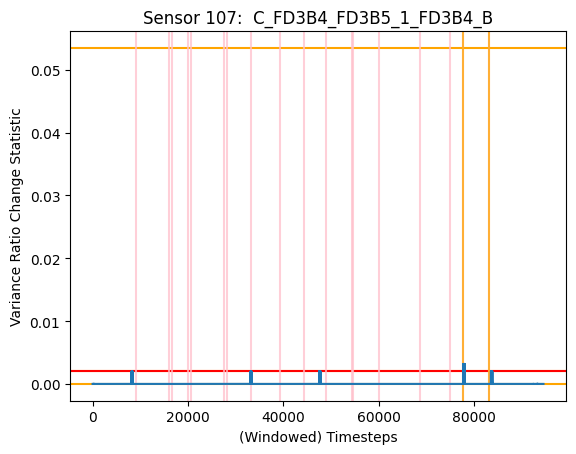

***********************************************************************************************
Sensor 108:  C_FD3B4_FD3B5_1_FD3B4_C
DD = 11


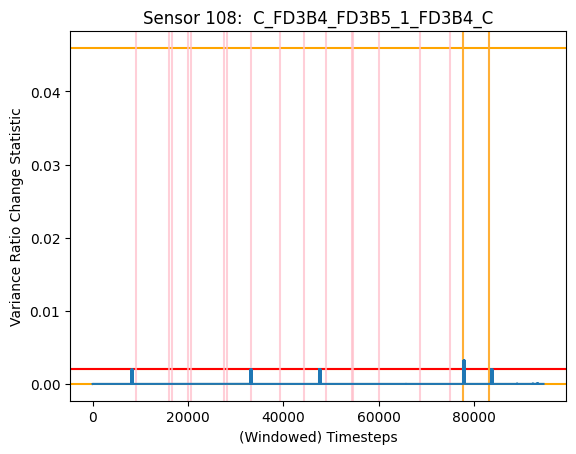

***********************************************************************************************
Sensor 109:  V_FD3B4_AN
DD = 11


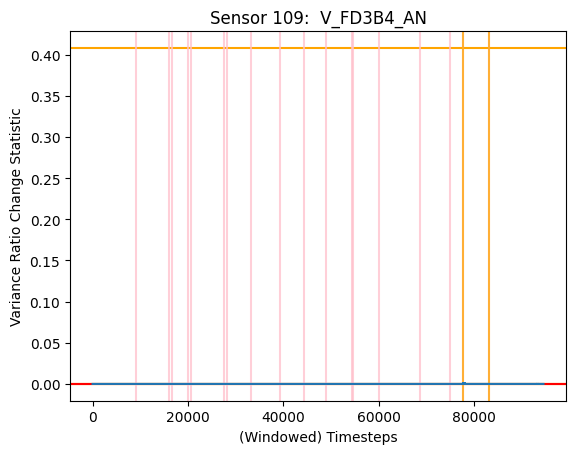

***********************************************************************************************
Sensor 110:  V_FD3B4_BN
DD = 14


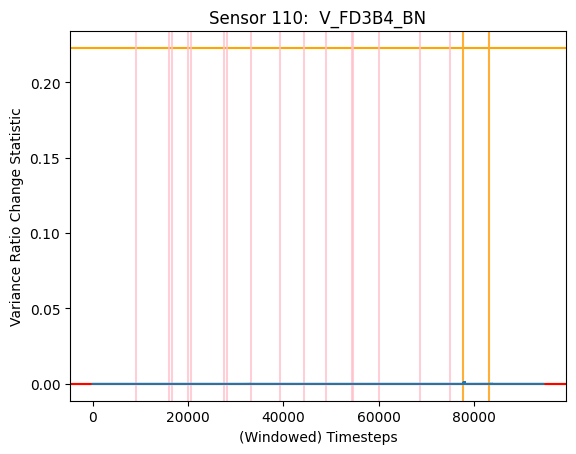

***********************************************************************************************
Sensor 111:  V_FD3B4_CN
DD = 11


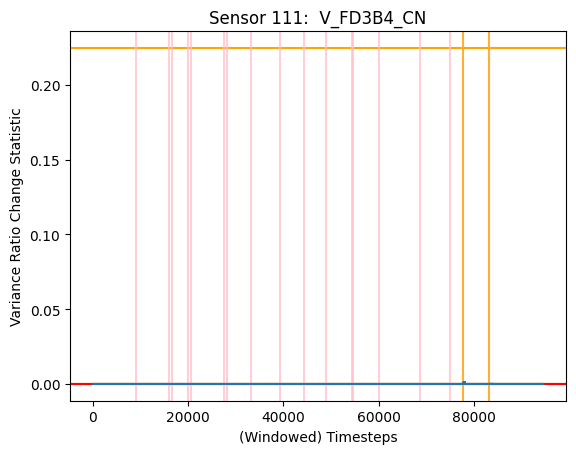

[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, None, None, None, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 22, 9, 4, 4, 4, 4, 4, 4, 11, 4, 4, 4, 4, 4, 4, 4, 4, 4, None, 4, 4, 4, 10, None, None, None, 4, 4, 4, 4, 4, 10, 4, 9, 4, 4, 11, 14, 11, None, 22, 9, 4, 4, 4, 4, 26, 13, 4, 4, 4, None, None, None, 14, 20, 11, 11, 11, 11, 37, 24, 11, 13, 11, 20, 11, 11, 14, 21, 11, 11, 14, 11]


In [ ]:
LD_var = []
at_neighbor = {}

rsum_list = rsum_list_var
threshold = thresholds_var_99
t_list = [thresholds_var, thresholds_var_99, thresholds_var_95]
persistency = 5

for index, i in enumerate(rsum_list):
    print("***********************************************************************************************")
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))

    print(f"Sensor {things[index]}: {cols[things[index]-1]}")
    at_neighbor[things[index]] = attack_in
    plt.title(f"Sensor {things[index]}: {cols[things[index]-1]}")
    plt.xlabel("(Windowed) Timesteps")
    plt.ylabel("Variance Ratio Change Statistic")

    for t in t_list:
        plt.axhline(t[index], color='orange')

    plt.axhline(threshold[index], color='red')

    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
            (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

        for start, end in sorted(list(all_attack_indices)):

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                LD_var.append(DD)
                print(f"DD = {DD}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')

            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

                start_w = start-window-w
                end_w = end+window+w-1
                for starts, ate in attack_i.items():
                  if starts == start and things[index] in ate:
                    DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                    LD_var.append(DD)
                    print(f"DD = {DD}")
                    plt.axvline(start_w, color='orange', alpha=0.75)
                    plt.axvline(end_w, color='orange', alpha=0.75)

    else:
         for start, end in sorted(list(all_attack_indices)):
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
#                   print(things[index])
                  DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                  LD_var.append(DD)
                  print(f"DD = {DD}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

print(LD_var)

Summary:

In [ ]:
n = 0
flr = []
violation = np.logical_or((rsum_list_corr > t_corr[1].reshape(-1, 1)), (rsum_list_var > t_var[1].reshape(-1, 1)))
attack_pred = violation.nonzero()

for i, (start, end) in enumerate(sorted(all_attack_indice)):
    print("***********************************************************************************************")
    print(f'For the {order_attack[n]} attack starting at index: {start} and ending at index: {end}')
    localisation_idx = []
#         print(start, end)
    start_w = start - window - w + 1
    end_w = end + window + w - 1
    # get all indices that are after the start of attack
    indices = np.logical_and((attack_pred[1] >= start_w), (attack_pred[1] <= end_w))
    #         print(idx.sum())
    #         print(attack_pred.shape())
    attack_window = attack_pred[1][indices]
    attack_sensors = attack_pred[0][indices]

    sensor_list = attacks_shifted_index[attack_start_times[i]]
    sensors_attacked = [s for sensor_l in sensor_list for s in sensor_l]

    false_localised_sensors = 0
    false_localised_sensors_list = []

    for sensor in np.unique(attack_sensors):
        if sensor not in sensors_attacked:
            sensor_indices = (attack_sensors == sensor)
            sensor_attack_window = np.sort(attack_window[sensor_indices])

            # check for persistency
            idx = persistency_check(sensor_attack_window, persistency)
            if idx is not None:
                false_localised_sensors += 1
                false_localised_sensors_list.append(sensor)

    print(f'1 Hop: {sensors_attacked}')
    print(f'False Localisations: {false_localised_sensors_list}')

    flr.append(false_localised_sensors/len(sensors_attacked))
    n += 1
flr

***********************************************************************************************
For the CT attack starting at index: 9360 and ending at index: 15599
1 Hop: [12, 6, 57, 13, 7, 58, 14, 8, 59]
False Localisations: [45, 46, 47]
***********************************************************************************************
For the Cphase attack starting at index: 17040 and ending at index: 20399
1 Hop: [2, 26]
False Localisations: [3, 4, 5, 9, 10, 11, 18, 19, 20, 27, 28, 29, 33, 34, 35, 39, 40, 41, 45, 46, 47]
***********************************************************************************************
For the PT attack starting at index: 20400 and ending at index: 27119
1 Hop: [39, 27, 3, 33, 9, 18, 40, 28, 4, 34, 10, 19, 41, 29, 5, 35, 11, 20]
False Localisations: [2, 26, 42, 43, 44, 45, 46, 47, 48, 49, 50, 69, 70, 71, 87, 88, 89]
***********************************************************************************************
For the Vphase attack starting at index: 28560

[0.3333333333333333,
 10.5,
 0.9444444444444444,
 5.333333333333333,
 0.6363636363636364,
 0.6666666666666666,
 0.4444444444444444,
 2.0,
 0.0]

In [ ]:
np.mean(flr), np.std(flr)

(2.3176206509539843, 3.2728203181654627)

In [ ]:
# save_results(thresholds_corr_99, thresholds_var_99, rsum_list_corr, rsum_list_var, all_attack_indices,
#                  all_attack_indice, total_normal, persistency=5, window=window, w=w,
#                  save_path=f"models/results_{topology}.json")

In [ ]:
np.mean(df_test['Time'][df_test['Time'] > 0.25e6].diff())

208.3319937132791